# Data Preparation  

## Library and Dataset Imports

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from scipy import stats
from scipy.stats import ks_2samp, f_oneway, ttest_ind, shapiro, levene, chi2_contingency, chi2
from statsmodels.stats.multicomp import pairwise_tukeyhsd, MultiComparison
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm

from adjustText import adjust_text
import warnings
warnings.filterwarnings('ignore')

import os
os.makedirs('csv_exports', exist_ok=True)

import glob
from pathlib import Path

from collections import Counter

# Configure plotting
plt.style.use('default')
sns.set_palette("husl")
%matplotlib inline

In [3]:
print("="*60)
print("THERMAL CHURN ANALYSIS - DATA PREPARATION")
print("="*60)

# Load iteration-level data
df_iteration = pd.read_csv('./csv_exports/job_level_individual_iterations.csv')

print(f"Total jobs loaded: {len(df_iteration):,}")
print(f"Columns available: {df_iteration.columns.tolist()}")

THERMAL CHURN ANALYSIS - DATA PREPARATION
Total jobs loaded: 262,947
Columns available: ['job_id', 'status', 'phase', 'assigned_worker', 'received_time', 'assigned_time', 'completed_time', 'failed_time', 'queue_time', 'processing_time', 'warmth_state', 'warmth_level', 'is_cold_start', 'operation', 'numbers', 'result', 'job_algorithm', 'worker_algorithm', 'iteration', 'benchmark_mode', 'inter_arrival_category', 'batch_delay_range', 'completed_successfully', 'warm_penalty', 'full_cold_penalty', 'cooling_penalty', 'algorithm_combination', 'iteration_file', 'benchmark_date', 'run_folder']


In [4]:
# ====================================================================
# DATA VALIDATION AND COLUMN PREPARATION
# ====================================================================

# Check if workload_intensity column exists, rename if needed
if 'benchmark_mode' in df_iteration.columns and 'workload_intensity' not in df_iteration.columns:
    df_iteration = df_iteration.rename(columns={'benchmark_mode': 'workload_intensity'})
    print("✓ Renamed benchmark_mode to workload_intensity")

# Ensure algorithm_combination exists
if 'algorithm_combination' not in df_iteration.columns:
    df_iteration['algorithm_combination'] = df_iteration['job_algorithm'] + '+' + df_iteration['worker_algorithm']
    print("✓ Created algorithm_combination column")

# Calculate derived columns if they don't exist
if 'all_penalties' not in df_iteration.columns:
    df_iteration['all_penalties'] = df_iteration['cooling_penalty'] + df_iteration['queue_time']
    print("✓ Created all_penalties column")

if 'total_response_time' not in df_iteration.columns:
    df_iteration['total_response_time'] = df_iteration['processing_time'] + df_iteration['queue_time'] + df_iteration['cooling_penalty']
    print("✓ Created total_response_time column")

# Create filtered dataset for thermal analysis (completed jobs only)
df_churn_analysis = df_iteration[df_iteration['status'] == 'completed'].copy()

print(f"\nDataset filtering:")
print(f"  Original: {len(df_iteration):,} jobs")
print(f"  Completed only: {len(df_churn_analysis):,} jobs")
print(f"  Removed: {len(df_iteration) - len(df_churn_analysis):,} non-completed jobs")

# Validate data distribution
print("\nWorkload distribution (completed jobs):")
for workload in ['light', 'moderate', 'heavy']:
    count = len(df_churn_analysis[df_churn_analysis['workload_intensity'] == workload])
    pct = (count / len(df_churn_analysis)) * 100
    print(f"  {workload.title()}: {count:,} jobs ({pct:.1f}%)")
    
    # Validate thermal state data
    print("\nThermal state validation:")
    print(df_churn_analysis['warmth_state'].value_counts())
    print(f"\nMissing thermal states: {df_churn_analysis['warmth_state'].isna().sum()}")

✓ Renamed benchmark_mode to workload_intensity
✓ Created all_penalties column
✓ Created total_response_time column

Dataset filtering:
  Original: 262,947 jobs
  Completed only: 109,568 jobs
  Removed: 153,379 non-completed jobs

Workload distribution (completed jobs):
  Light: 14,807 jobs (13.5%)

Thermal state validation:
warmth_state
HOT     101386
WARM      6976
COLD      1206
Name: count, dtype: int64

Missing thermal states: 0
  Moderate: 39,397 jobs (36.0%)

Thermal state validation:
warmth_state
HOT     101386
WARM      6976
COLD      1206
Name: count, dtype: int64

Missing thermal states: 0
  Heavy: 55,364 jobs (50.5%)

Thermal state validation:
warmth_state
HOT     101386
WARM      6976
COLD      1206
Name: count, dtype: int64

Missing thermal states: 0


## Thermal Transition Creation

In [5]:
# ====================================================================
# THERMAL TRANSITION EXTRACTION
# ====================================================================

def extract_thermal_transitions(df):
    """Extract thermal transitions for each worker slot"""
    transitions_list = []
    
    # Group by unique worker slot
    for (workload, algo_combo, iteration, worker), group in df.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration', 'assigned_worker']
    ):
        # Sort by received time
        group = group.sort_values('received_time')
        
        # Extract thermal sequence
        thermal_sequence = group['warmth_state'].tolist()
        
        # Generate transitions
        if len(thermal_sequence) > 1:
            for i in range(len(thermal_sequence) - 1):
                transition = f"{thermal_sequence[i]}→{thermal_sequence[i+1]}"
                transitions_list.append({
                    'workload_intensity': workload,
                    'algorithm_combination': algo_combo,
                    'job_algorithm': algo_combo.split('+')[0],
                    'worker_algorithm': algo_combo.split('+')[1],
                    'iteration': iteration,
                    'assigned_worker': worker,
                    'transition': transition,
                    'sequence_position': i
                })
    
    return pd.DataFrame(transitions_list)

df_transitions = extract_thermal_transitions(df_churn_analysis)
print(f"Total transitions extracted: {len(df_transitions):,}")

Total transitions extracted: 109,393


In [6]:
# ====================================================================
# TRANSITION CLASSIFICATION (3-CATEGORY SYSTEM)
# ====================================================================

# Define transition categories
DEGRADATION_TRANSITIONS = {'HOT→WARM', 'HOT→COLD', 'WARM→COLD', 'COLD→COLD'}
RECOVERY_TRANSITIONS = {'COLD→WARM', 'COLD→HOT', 'WARM→HOT'}
STABILITY_TRANSITIONS = {'HOT→HOT', 'WARM→WARM'}

def classify_transition(transition):
    """Classify transition into performance-based category"""
    if transition in DEGRADATION_TRANSITIONS:
        return 'degradation'
    elif transition in RECOVERY_TRANSITIONS:
        return 'recovery'
    elif transition in STABILITY_TRANSITIONS:
        return 'stability'
    else:
        return 'unknown'

df_transitions['category'] = df_transitions['transition'].apply(classify_transition)

# Validate classification
print("\nTransition category distribution:")
print(df_transitions['category'].value_counts())
print(f"\nUnknown transitions: {(df_transitions['category'] == 'unknown').sum()}")


Transition category distribution:
category
stability      99281
degradation     5165
recovery        4947
Name: count, dtype: int64

Unknown transitions: 0


# Stage 8: Thermal Transition Analysis

## 8.1.Find Transition Pattern

### 8.1.A. Worker Algorithm x Workload Intensity

In [7]:
# ====================================================================
# ALGORITHM-LEVEL THERMAL METRICS
# ====================================================================

def calculate_transition_rates(df_transitions):
    """Calculate transition rates at algorithm level"""
    results = []
    
    # Group by algorithm and workload
    for (worker_algo, workload), group in df_transitions.groupby(['worker_algorithm', 'workload_intensity']):
        total_transitions = len(group)
        
        # Calculate rates for each category
        degradation_count = (group['category'] == 'degradation').sum()
        recovery_count = (group['category'] == 'recovery').sum()
        stability_count = (group['category'] == 'stability').sum()
        
        results.append({
            'worker_algorithm': worker_algo,
            'workload_intensity': workload,
            'total_transitions': total_transitions,
            'degradation_rate': (degradation_count / total_transitions) * 100,
            'recovery_rate': (recovery_count / total_transitions) * 100,
            'stability_rate': (stability_count / total_transitions) * 100,
            'degradation_count': degradation_count,
            'recovery_count': recovery_count,
            'stability_count': stability_count
        })
    
    return pd.DataFrame(results)

df_worker_rates = calculate_transition_rates(df_transitions)

### 8.1.B. Hybrid Algorithm x Workload Intensity

In [8]:
# For 8.2 Hybrid Algorithm analysis
def calculate_hybrid_transition_rates(df_transitions):
    """Calculate transition rates at hybrid algorithm level"""
    results = []
    
    for (algo_combo, workload), group in df_transitions.groupby(['algorithm_combination', 'workload_intensity']):
        total_transitions = len(group)
        
        degradation_count = (group['category'] == 'degradation').sum()
        recovery_count = (group['category'] == 'recovery').sum()
        stability_count = (group['category'] == 'stability').sum()
        
        results.append({
            'algorithm_combination': algo_combo,
            'job_algorithm': algo_combo.split('+')[0],
            'worker_algorithm': algo_combo.split('+')[1],
            'workload_intensity': workload,
            'total_transitions': total_transitions,
            'degradation_rate': (degradation_count / total_transitions) * 100,
            'recovery_rate': (recovery_count / total_transitions) * 100,
            'stability_rate': (stability_count / total_transitions) * 100
        })
    
    return pd.DataFrame(results)

df_hybrid_rates = calculate_hybrid_transition_rates(df_transitions)


### 8.1.C. Validation and Save to CSV

In [9]:
# Check 1: Verify transition distribution by workload
print("\nTransition distribution by workload:")
workload_transition_dist = df_transitions.groupby(['workload_intensity', 'category']).size().unstack(fill_value=0)
print(workload_transition_dist)
print("\nPercentages:")
print(workload_transition_dist.div(workload_transition_dist.sum(axis=1), axis=0) * 100)

# Check 2: Verify we have all algorithm combinations
print(f"\nUnique worker algorithms: {df_transitions['worker_algorithm'].nunique()}")
print(f"Unique algorithm combinations: {df_transitions['algorithm_combination'].nunique()}")

# Check 3: Sample size per algorithm-workload combination
print("\nSample sizes for worker algorithms:")
sample_sizes = df_transitions.groupby(['worker_algorithm', 'workload_intensity']).size().unstack(fill_value=0)
print(sample_sizes)

# Check 4: Export transition details for reference
df_transitions.to_csv('./csv_exports/step_3_82_thermal_transitions_raw.csv', index=False)
df_worker_rates.to_csv('./csv_exports/step_3_83_worker_algorithm_transition_rates.csv', index=False)
df_hybrid_rates.to_csv('./csv_exports/step_3_84_hybrid_algorithm_transition_rates.csv', index=False)


Transition distribution by workload:
category            degradation  recovery  stability
workload_intensity                                  
heavy                       268       266      54770
light                      3316      3138       8298
moderate                   1581      1543      36213

Percentages:
category            degradation   recovery  stability
workload_intensity                                   
heavy                  0.484594   0.480978  99.034428
light                 22.478308  21.271692  56.250000
moderate               4.019117   3.922516  92.058367

Unique worker algorithms: 5
Unique algorithm combinations: 15

Sample sizes for worker algorithms:
workload_intensity    heavy  light  moderate
worker_algorithm                            
fastest_worker_fair    6628   3054      6302
least_loaded_fair     13890   2959      8363
network_optimal_fair   6913   2916      6743
random_worker         13809   2869      9009
rr_worker             14064   2954      892

## 8.2 Visualisation

### 8.2.A. Worker Algorithm x Workload Intensity

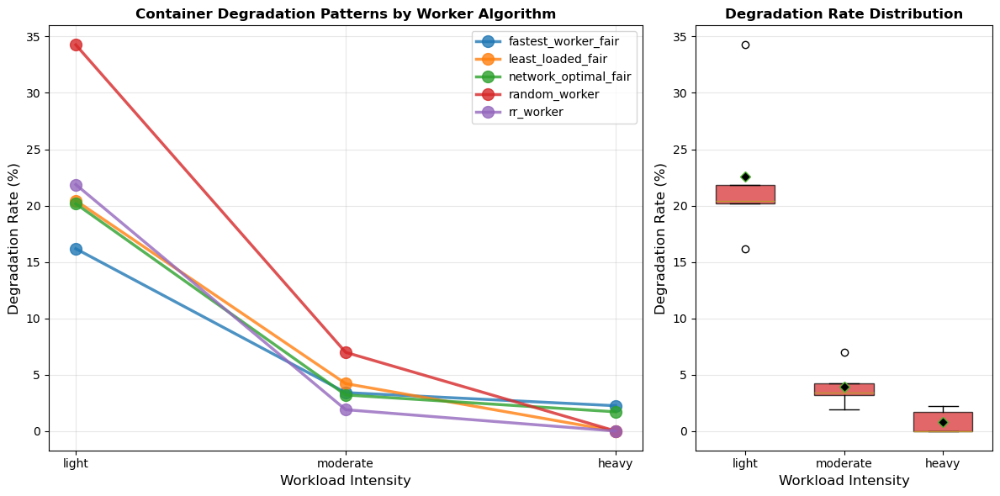

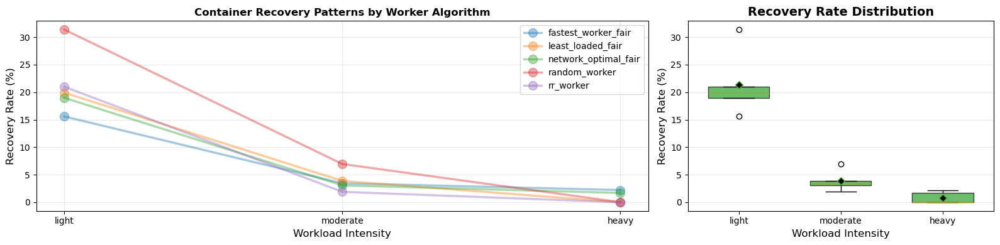


Worker Algorithm Thermal Transition Summary:
Workload     Algorithm                 Degradation %   Recovery %      Net Impact %   
--------------------------------------------------------------------------------
light        random_worker                     34.3         31.4          2.9
light        rr_worker                         21.9         21.0          0.9
light        least_loaded_fair                 20.4         19.9          0.5
light        network_optimal_fair              20.2         19.0          1.2
light        fastest_worker_fair               16.2         15.6          0.6
--------------------------------------------------------------------------------
moderate     random_worker                      7.0          6.9          0.0
moderate     least_loaded_fair                  4.2          3.9          0.3
moderate     fastest_worker_fair                3.4          3.4         -0.0
moderate     network_optimal_fair               3.2          3.1          0.1
mod

In [10]:
# ====================================================================
# 8.2.A WORKER ALGORITHM THERMAL TRANSITION VISUALISATION (DEGRADATION)
# ====================================================================

# Create figure for DEGRADATION
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6), gridspec_kw={'width_ratios': [2, 1]})

workload_order = ['light', 'moderate', 'heavy']
algo_colors = {
    'fastest_worker_fair': '#1f77b4',
    'least_loaded_fair': '#ff7f0e',
    'network_optimal_fair': '#2ca02c',
    'random_worker': '#d62728',
    'rr_worker': '#9467bd'
}

# DEGRADATION LINE PLOT (Left)
for algo, color in algo_colors.items():
    algo_data = df_worker_rates[df_worker_rates['worker_algorithm'] == algo]
    
    rates = []
    for workload in workload_order:
        rate = algo_data[algo_data['workload_intensity'] == workload]['degradation_rate'].values
        rates.append(rate[0] if len(rate) > 0 else 0)
    
    ax1.plot(workload_order, rates, 'o-', color=color, linewidth=2.5, 
            markersize=10, label=algo, alpha=0.8)

ax1.set_xlabel('Workload Intensity', fontsize=12)
ax1.set_ylabel('Degradation Rate (%)', fontsize=12)
ax1.set_title('Container Degradation Patterns by Worker Algorithm', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper right', fontsize=10)

# DEGRADATION BOX PLOT (Right)
box_data = []
for workload in workload_order:
    workload_data = df_worker_rates[df_worker_rates['workload_intensity'] == workload]
    box_data.append(workload_data['degradation_rate'].values)

bp = ax2.boxplot(box_data, positions=range(len(workload_order)), widths=0.6, patch_artist=True,
                showmeans=True, meanprops=dict(marker='D', markerfacecolor='black', markersize=6))

for patch in bp['boxes']:
    patch.set_facecolor('#d62728')
    patch.set_alpha(0.7)

ax2.set_xticklabels(workload_order)
ax2.set_xlabel('Workload Intensity', fontsize=12)
ax2.set_ylabel('Degradation Rate (%)', fontsize=12)
ax2.set_title('Degradation Rate Distribution', fontsize=12, fontweight='bold',)
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('./img_exports/step_3_86_worker_algorithm_degradation.png', dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# 8.2.A WORKER ALGORITHM THERMAL TRANSITION VISUALISATION (RECOVERY)
# ====================================================================

# Create figure for RECOVERY
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,4), gridspec_kw={'width_ratios': [2, 1]})

# RECOVERY LINE PLOT (Left)
for algo, color in algo_colors.items():
    algo_data = df_worker_rates[df_worker_rates['worker_algorithm'] == algo]
    
    rates = []
    for workload in workload_order:
        rate = algo_data[algo_data['workload_intensity'] == workload]['recovery_rate'].values
        rates.append(rate[0] if len(rate) > 0 else 0)
    
    ax1.plot(workload_order, rates, 'o-', color=color, linewidth=2.5, 
            markersize=10, label=algo, alpha=0.4)

ax1.set_xlabel('Workload Intensity', fontsize=12)
ax1.set_ylabel('Recovery Rate (%)', fontsize=12)
ax1.set_title('Container Recovery Patterns by Worker Algorithm', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper right', fontsize=10)

# RECOVERY BOX PLOT (Right)
box_data = []
for workload in workload_order:
    workload_data = df_worker_rates[df_worker_rates['workload_intensity'] == workload]
    box_data.append(workload_data['recovery_rate'].values)

bp = ax2.boxplot(box_data, positions=range(len(workload_order)), widths=0.6, patch_artist=True,
                showmeans=True, meanprops=dict(marker='D', markerfacecolor='black', markersize=6))

for patch in bp['boxes']:
    patch.set_facecolor('#2ca02c')
    patch.set_alpha(0.7)

ax2.set_xticklabels(workload_order)
ax2.set_xlabel('Workload Intensity', fontsize=12)
ax2.set_ylabel('Recovery Rate (%)', fontsize=12)
ax2.set_title('Recovery Rate Distribution', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('./img_exports/step_3_87_worker_algorithm_recovery.png', dpi=300, bbox_inches='tight')
plt.show()

# Summary statistics table
print("\nWorker Algorithm Thermal Transition Summary:")
print("="*80)
print(f"{'Workload':<12} {'Algorithm':<25} {'Degradation %':<15} {'Recovery %':<15} {'Net Impact %':<15}")
print("-"*80)

for workload in workload_order:
    workload_data = df_worker_rates[df_worker_rates['workload_intensity'] == workload].sort_values('degradation_rate', ascending=False)
    for _, row in workload_data.iterrows():
        net_impact = row['degradation_rate'] - row['recovery_rate']
        print(f"{workload:<12} {row['worker_algorithm']:<25} {row['degradation_rate']:>12.1f} {row['recovery_rate']:>12.1f} {net_impact:>12.1f}")
    print("-"*80)

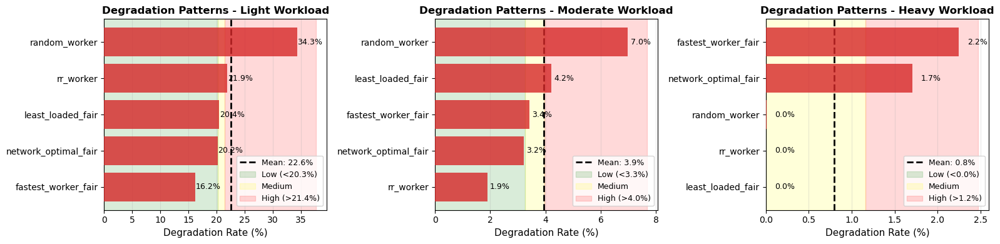

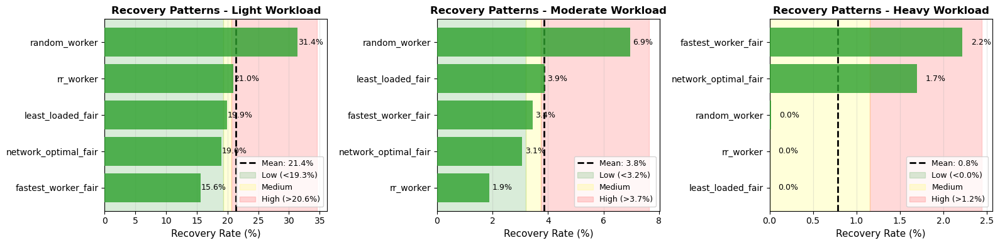


DEGRADATION Performance Classification (Based on 33rd/67th Percentiles):

LIGHT WORKLOAD (P33=20.3%, P67=21.4%):
------------------------------------------------------------------------------------------
Algorithm                 Rate (%)     Classification       Percentile     
------------------------------------------------------------------------------------------
fastest_worker_fair             16.2 ✓ Low (Good)                   20th
network_optimal_fair            20.2 ✓ Low (Good)                   40th
least_loaded_fair               20.4 - Medium                       60th
rr_worker                       21.9 ✗ High (Poor)                  80th
random_worker                   34.3 ✗ High (Poor)                 100th

MODERATE WORKLOAD (P33=3.3%, P67=4.0%):
------------------------------------------------------------------------------------------
Algorithm                 Rate (%)     Classification       Percentile     
-------------------------------------------------------

In [11]:
# ====================================================================
# 8.2.A RANGE PLOT - WORKER ALGORITHM PERFORMANCE (LIGHT WORKLOAD FOCUS)
# ====================================================================

# Create horizontal range plot for light workload
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

# Function to create range plot
def create_range_plot(ax, df_rates, workload, metric, title, color):
    workload_data = df_rates[df_rates['workload_intensity'] == workload].sort_values(metric)
    
    algorithms = workload_data['worker_algorithm'].values
    rates = workload_data[metric].values
    
    # Calculate percentiles for reference
    p33 = np.percentile(rates, 33)
    p67 = np.percentile(rates, 67)
    
    # Create horizontal bar plot
    y_pos = np.arange(len(algorithms))
    bars = ax.barh(y_pos, rates, color=color, alpha=0.8, zorder=3)
    
    # Add mean line
    mean_rate = rates.mean()
    ax.axvline(mean_rate, color='black', linestyle='--', linewidth=2, label=f'Mean: {mean_rate:.1f}%')
    
    # Add percentile zones
    ax.axvspan(0, p33, alpha=0.15, color='green', label=f'Low (<{p33:.1f}%)')
    ax.axvspan(p33, p67, alpha=0.15, color='yellow', label=f'Medium')
    ax.axvspan(p67, rates.max()*1.1, alpha=0.15, color='red', label=f'High (>{p67:.1f}%)')
    
    # Customise plot
    ax.set_yticks(y_pos)
    ax.set_yticklabels(algorithms)
    ax.set_xlabel(f'{metric.replace("_", " ").title()} (%)', fontsize=11)
    ax.set_title(f'{title} - {workload.title()} Workload', fontsize=12, fontweight='bold')
    ax.legend(loc='lower right', fontsize=9)
    ax.grid(True, alpha=0.3, axis='x')
    
    # Add value labels on bars
    for i, (bar, rate) in enumerate(zip(bars, rates)):
        ax.text(rate + 0.1, bar.get_y() + bar.get_height()/2, f'{rate:.1f}%', 
                va='center', fontsize=9)

# Create plots for each workload
create_range_plot(ax1, df_worker_rates, 'light', 'degradation_rate', 'Degradation Patterns', '#d62728')
create_range_plot(ax2, df_worker_rates, 'moderate', 'degradation_rate', 'Degradation Patterns', '#d62728')
create_range_plot(ax3, df_worker_rates, 'heavy', 'degradation_rate', 'Degradation Patterns', '#d62728')

plt.tight_layout()
plt.savefig('./img_exports/step_3_88_worker_algorithm_degradation_range.png', dpi=300, bbox_inches='tight')
plt.show()

# Same for recovery
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4))

create_range_plot(ax1, df_worker_rates, 'light', 'recovery_rate', 'Recovery Patterns', '#2ca02c')
create_range_plot(ax2, df_worker_rates, 'moderate', 'recovery_rate', 'Recovery Patterns', '#2ca02c')
create_range_plot(ax3, df_worker_rates, 'heavy', 'recovery_rate', 'Recovery Patterns', '#2ca02c')

plt.tight_layout()
plt.savefig('./img_exports/step_3_89_worker_algorithm_recovery_range.png', dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# 8.2.A PERFORMANCE CLASSIFICATION TABLES
# ====================================================================

def create_performance_table(df_rates, metric, metric_name):
    """Create performance classification table based on percentiles"""
    print(f"\n{metric_name} Performance Classification (Based on 33rd/67th Percentiles):")
    print("="*90)
    
    for workload in ['light', 'moderate', 'heavy']:
        workload_data = df_rates[df_rates['workload_intensity'] == workload]
        rates = workload_data[metric].values
        
        # Calculate percentiles
        p33 = np.percentile(rates, 33)
        p67 = np.percentile(rates, 67)
        
        print(f"\n{workload.upper()} WORKLOAD (P33={p33:.1f}%, P67={p67:.1f}%):")
        print("-"*90)
        print(f"{'Algorithm':<25} {'Rate (%)':<12} {'Classification':<20} {'Percentile':<15}")
        print("-"*90)
        
        # Sort by rate
        sorted_data = workload_data.sort_values(metric)
        
        for _, row in sorted_data.iterrows():
            rate = row[metric]
            
            # Classify based on percentiles
            if rate < p33:
                classification = "Low (Good)" if metric == 'degradation_rate' else "Low (Poor)"
                color_code = "✓" if metric == 'degradation_rate' else "✗"
            elif rate > p67:
                classification = "High (Poor)" if metric == 'degradation_rate' else "High (Good)"
                color_code = "✗" if metric == 'degradation_rate' else "✓"
            else:
                classification = "Medium"
                color_code = "-"
            
            # Calculate exact percentile
            percentile = (sorted_data[metric] <= rate).sum() / len(sorted_data) * 100
            
            print(f"{row['worker_algorithm']:<25} {rate:>10.1f} {color_code} {classification:<18} {percentile:>12.0f}th")

# Create tables for both metrics
create_performance_table(df_worker_rates, 'degradation_rate', 'DEGRADATION')
create_performance_table(df_worker_rates, 'recovery_rate', 'RECOVERY')

# ====================================================================
# 8.2.A COMBINED PERFORMANCE MATRIX
# ====================================================================

print("\nCOMBINED THERMAL PERFORMANCE MATRIX:")
print("="*100)
print(f"{'Workload':<12} {'Algorithm':<25} {'Degradation':<15} {'Recovery':<15} {'Net Impact':<15} {'Overall':<15}")
print("-"*100)

for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_rates[df_worker_rates['workload_intensity'] == workload]
    
    # Calculate percentiles for classification
    deg_p33 = np.percentile(workload_data['degradation_rate'], 33)
    deg_p67 = np.percentile(workload_data['degradation_rate'], 67)
    rec_p33 = np.percentile(workload_data['recovery_rate'], 33)
    rec_p67 = np.percentile(workload_data['recovery_rate'], 67)
    
    for _, row in workload_data.sort_values('worker_algorithm').iterrows():
        deg_rate = row['degradation_rate']
        rec_rate = row['recovery_rate']
        net_impact = deg_rate - rec_rate
        
        # Classify performance
        deg_class = "L" if deg_rate < deg_p33 else "H" if deg_rate > deg_p67 else "M"
        rec_class = "H" if rec_rate > rec_p67 else "L" if rec_rate < rec_p33 else "M"
        
        # Overall assessment
        if deg_class == "L" and rec_class == "H":
            overall = "Excellent"
        elif deg_class == "H" and rec_class == "L":
            overall = "Poor"
        else:
            overall = "Mixed"
        
        print(f"{workload:<12} {row['worker_algorithm']:<25} {deg_rate:>10.1f}% ({deg_class}) {rec_rate:>10.1f}% ({rec_class}) {net_impact:>12.1f}% {overall:<15}")
    
    print("-"*100)

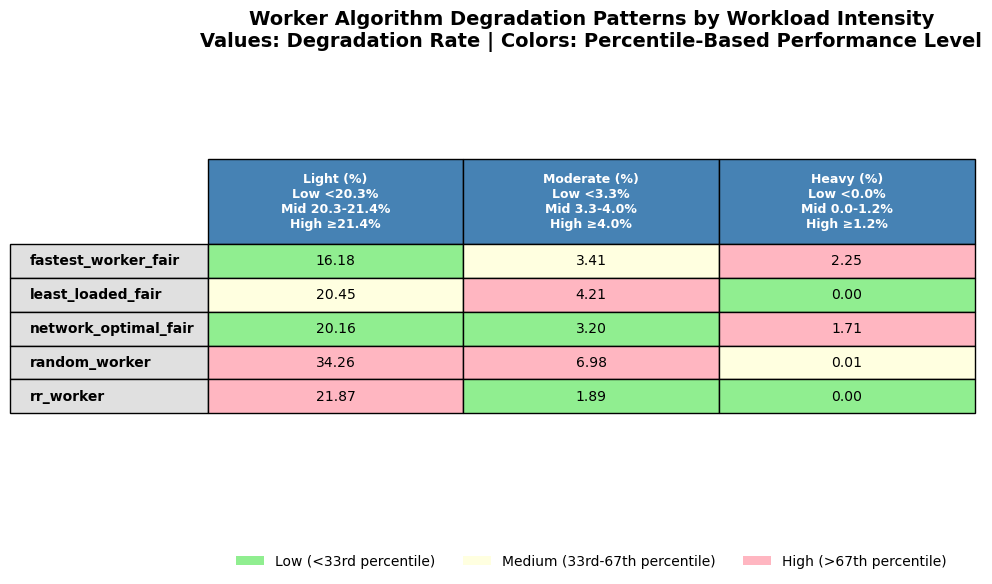

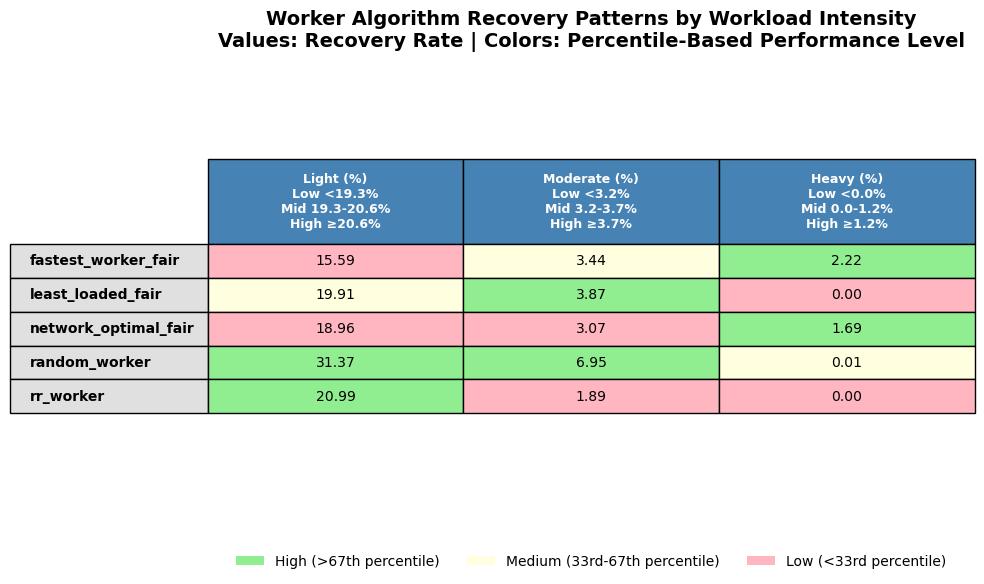

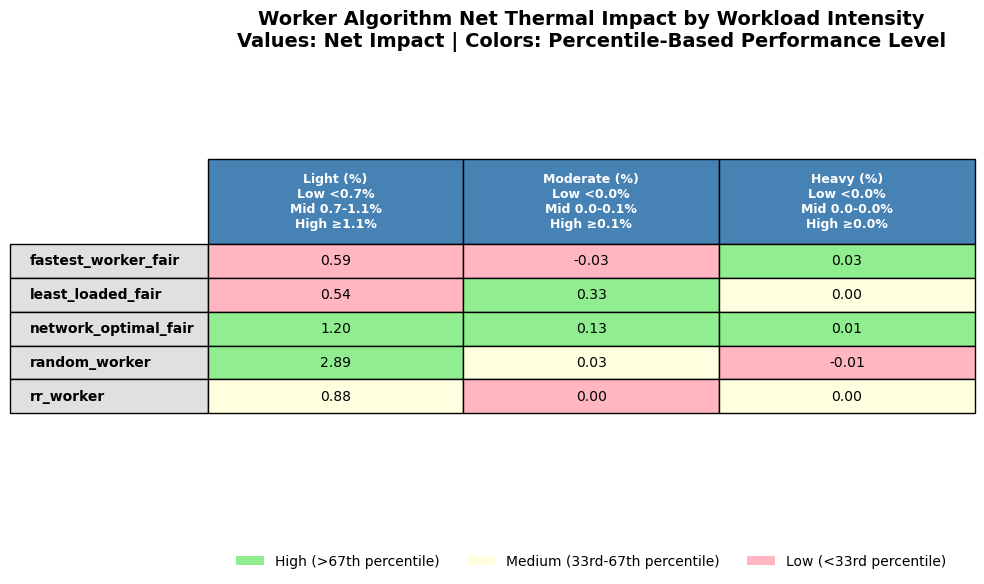

In [12]:
# ====================================================================
# 8.2.A THERMAL TRANSITION PERFORMANCE HEATMAP TABLE
# ====================================================================

def create_thermal_heatmap(df_rates, metric, title, cmap_type='RdYlGn'):
    """Create a heatmap table with percentile-based coloring"""
    
    # Pivot data for heatmap
    pivot_data = df_rates.pivot(index='worker_algorithm', 
                                columns='workload_intensity', 
                                values=metric)
    
    # Reorder columns
    pivot_data = pivot_data[['light', 'moderate', 'heavy']]
    
    # Calculate percentiles for each workload
    percentiles = {}
    for workload in ['light', 'moderate', 'heavy']:
        workload_data = df_rates[df_rates['workload_intensity'] == workload][metric].values
        percentiles[workload] = {
            'p33': np.percentile(workload_data, 33),
            'p67': np.percentile(workload_data, 67),
            'min': workload_data.min(),
            'max': workload_data.max()
        }
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.axis('tight')
    ax.axis('off')
    
    # Create color mapping
    def get_color(value, workload):
        p = percentiles[workload]
        if metric == 'degradation_rate':
            # For degradation: low is good (green), high is bad (red)
            if value < p['p33']:
                return '#90EE90'  # Light green
            elif value > p['p67']:
                return '#FFB6C1'  # Light red
            else:
                return '#FFFFE0'  # Light yellow
        else:  # recovery_rate
            # For recovery: high is good (green), low is bad (red)
            if value > p['p67']:
                return '#90EE90'  # Light green
            elif value < p['p33']:
                return '#FFB6C1'  # Light red
            else:
                return '#FFFFE0'  # Light yellow
    
    # Create cell colors
    cell_colors = []
    for algo in pivot_data.index:
        row_colors = []
        for workload in pivot_data.columns:
            value = pivot_data.loc[algo, workload]
            row_colors.append(get_color(value, workload))
        cell_colors.append(row_colors)
    
    # Create table data
    table_data = []
    for algo in pivot_data.index:
        row = []
        for workload in pivot_data.columns:
            value = pivot_data.loc[algo, workload]
            row.append(f'{value:.2f}')
        table_data.append(row)
    
    # Create the table
    table = ax.table(cellText=table_data,
                    rowLabels=pivot_data.index,
                    colLabels=[f'{col.title()} (%)\n' + 
                              f'Low <{percentiles[col]["p33"]:.1f}%\n' +
                              f'Mid {percentiles[col]["p33"]:.1f}-{percentiles[col]["p67"]:.1f}%\n' +
                              f'High ≥{percentiles[col]["p67"]:.1f}%'
                              for col in pivot_data.columns],
                    cellColours=cell_colors,
                    cellLoc='center',
                    loc='center',
                    colWidths=[0.3, 0.3, 0.3])
    
    # Style the table
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 2.5)
    
    # CUSTOM HEADER HEIGHT ADJUSTMENT
    # Get all cells
    cells = table.get_celld()
    
    # Adjust header row height (row 0)
    for col in range(len(pivot_data.columns)):
        header_cell = cells[(0, col)]
        header_cell.set_height(0.2)  # Increase header height (default is ~0.05)
        header_cell.set_facecolor('#4682B4')
        header_cell.set_text_props(weight='bold', color='white', fontsize=9)
    
    # Adjust data cell heights for consistency
    for row in range(1, len(pivot_data.index) + 1):
        for col in range(len(pivot_data.columns)):
            cells[(row, col)].set_height(0.08)  # Standard height for data cells
    
    # Style row labels
    for i in range(1, len(pivot_data.index) + 1):
        cells[(i, -1)].set_facecolor('#E0E0E0')
        cells[(i, -1)].set_text_props(weight='bold')
        cells[(i, -1)].set_height(0.08)  # Match data cell height
    
    # Add title
    plt.title(f'{title}\nValues: {metric.replace("_", " ").title()} | Colors: Percentile-Based Performance Level',
              fontsize=14, fontweight='bold', pad=20)
    
    # Add legend
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor='#90EE90', label='Low (<33rd percentile)' if metric == 'degradation_rate' else 'High (>67th percentile)'),
        plt.Rectangle((0,0),1,1, facecolor='#FFFFE0', label='Medium (33rd-67th percentile)'),
        plt.Rectangle((0,0),1,1, facecolor='#FFB6C1', label='High (>67th percentile)' if metric == 'degradation_rate' else 'Low (<33rd percentile)')
    ]
    ax.legend(handles=legend_elements, loc='center', bbox_to_anchor=(0.5, -0.15), ncol=3, frameon=False)
    
    plt.tight_layout()
    return fig

# Create heatmap tables
fig = create_thermal_heatmap(df_worker_rates, 'degradation_rate', 'Worker Algorithm Degradation Patterns by Workload Intensity')
plt.savefig('./img_exports/step_3_90_worker_algorithm_degradation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

fig = create_thermal_heatmap(df_worker_rates, 'recovery_rate', 'Worker Algorithm Recovery Patterns by Workload Intensity')
plt.savefig('./img_exports/step_3_91_worker_algorithm_recovery_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

# Create combined net impact heatmap
df_worker_rates['net_impact'] = df_worker_rates['degradation_rate'] - df_worker_rates['recovery_rate']
fig = create_thermal_heatmap(df_worker_rates, 'net_impact', 'Worker Algorithm Net Thermal Impact by Workload Intensity')
plt.savefig('./img_exports/step_3_92_worker_algorithm_net_impact_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

### 8.2.B. Hybrid Algorithm x Workload Intensity

In [13]:
# First, check what algorithms are actually in your data
print("Available algorithms:")
print(sorted(df_hybrid_rates['algorithm_combination'].unique()))

# Then update the algorithms_to_show based on actual data
# For example, if your data contains these patterns:
algorithms_to_show = [
    'edf_job+random_worker',
    'urgency_job+least_loaded_fair', 
    'rr_job+fastest_worker_fair'
]

Available algorithms:
['edf_job+fastest_worker_fair', 'edf_job+least_loaded_fair', 'edf_job+network_optimal_fair', 'edf_job+random_worker', 'edf_job+rr_worker', 'rr_job+fastest_worker_fair', 'rr_job+least_loaded_fair', 'rr_job+network_optimal_fair', 'rr_job+random_worker', 'rr_job+rr_worker', 'urgency_job+fastest_worker_fair', 'urgency_job+least_loaded_fair', 'urgency_job+network_optimal_fair', 'urgency_job+random_worker', 'urgency_job+rr_worker']


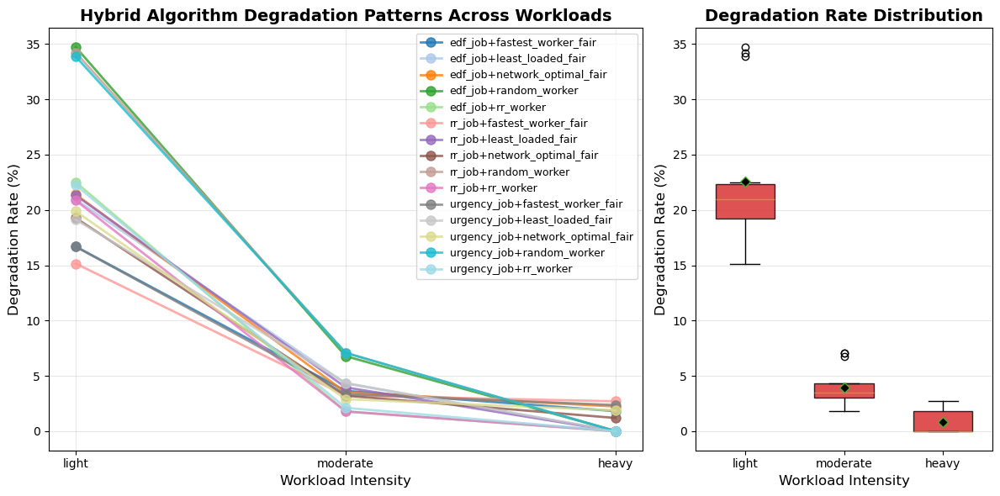

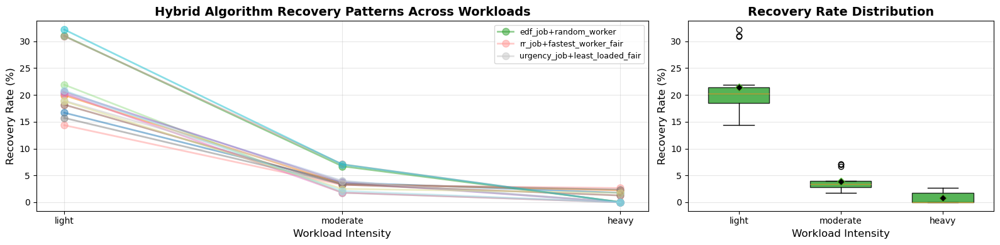

In [14]:
# ====================================================================
# 8.2.B HYBRID ALGORITHM THERMAL TRANSITION VISUALISATION (DEGRADATION)
# ====================================================================

# Create figure for DEGRADATION
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'width_ratios': [2, 1]})

workload_order = ['light', 'moderate', 'heavy']

# Create a color palette for 15 hybrid algorithms
n_algorithms = len(df_hybrid_rates['algorithm_combination'].unique())
colors = plt.cm.tab20(np.linspace(0, 1, n_algorithms))
algo_colors = dict(zip(sorted(df_hybrid_rates['algorithm_combination'].unique()), colors))

# DEGRADATION LINE PLOT (Left)
# Get the actual algorithm names from the data
actual_algorithms = sorted(df_hybrid_rates['algorithm_combination'].unique())

# Select a few representative algorithms for the legend (first 3 for clarity)
algorithms_to_label = actual_algorithms[:]  # Or specify actual names from your data

for algo, color in algo_colors.items():
    algo_data = df_hybrid_rates[df_hybrid_rates['algorithm_combination'] == algo]
    
    rates = []
    for workload in workload_order:
        rate = algo_data[algo_data['workload_intensity'] == workload]['degradation_rate'].values
        rates.append(rate[0] if len(rate) > 0 else 0)
    
    # Only label selected algorithms to avoid overcrowding
    label = algo if algo in algorithms_to_label else ''
    ax1.plot(workload_order, rates, 'o-', color=color, linewidth=2, 
            markersize=8, label=label, alpha=0.8)

ax1.set_xlabel('Workload Intensity', fontsize=12)
ax1.set_ylabel('Degradation Rate (%)', fontsize=12)
ax1.set_title('Hybrid Algorithm Degradation Patterns Across Workloads', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

# Force the legend to show even if some labels are empty
# Only show legend if there are actual labels
if any(label for label in algorithms_to_label):
    ax1.legend(loc='upper right', fontsize=9)

# Rest of the code remains the same...

# DEGRADATION BOX PLOT (Right)
box_data = []
for workload in workload_order:
    workload_data = df_hybrid_rates[df_hybrid_rates['workload_intensity'] == workload]
    box_data.append(workload_data['degradation_rate'].values)

bp = ax2.boxplot(box_data, positions=range(len(workload_order)), widths=0.6, patch_artist=True,
                showmeans=True, meanprops=dict(marker='D', markerfacecolor='black', markersize=6))

for patch in bp['boxes']:
    patch.set_facecolor('#d62728')
    patch.set_alpha(0.8)

ax2.set_xticklabels(workload_order)
ax2.set_xlabel('Workload Intensity', fontsize=12)
ax2.set_ylabel('Degradation Rate (%)', fontsize=12)
ax2.set_title('Degradation Rate Distribution', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('./img_exports/step_3_93_hybrid_algorithm_degradation.png', dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# 8.2.B HYBRID ALGORITHM THERMAL TRANSITION VISUALISATION (RECOVERY)
# ====================================================================

# Create figure for RECOVERY
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4), gridspec_kw={'width_ratios': [2, 1]})

# RECOVERY LINE PLOT (Left) - with 0.5 alpha
for algo, color in algo_colors.items():
    algo_data = df_hybrid_rates[df_hybrid_rates['algorithm_combination'] == algo]
    
    rates = []
    for workload in workload_order:
        rate = algo_data[algo_data['workload_intensity'] == workload]['recovery_rate'].values
        rates.append(rate[0] if len(rate) > 0 else 0)
    
    # Using actual algorithm names for the legend
    label = algo if algo in ['edf_job+random_worker', 'urgency_job+least_loaded_fair', 'rr_job+fastest_worker_fair'] else ''
    ax1.plot(workload_order, rates, 'o-', color=color, linewidth=2, 
            markersize=8, label=label, alpha=0.5)  # 0.5 alpha as requested

ax1.set_xlabel('Workload Intensity', fontsize=12)
ax1.set_ylabel('Recovery Rate (%)', fontsize=12)
ax1.set_title('Hybrid Algorithm Recovery Patterns Across Workloads', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper right', fontsize=9)

# RECOVERY BOX PLOT (Right)
box_data = []
for workload in workload_order:
    workload_data = df_hybrid_rates[df_hybrid_rates['workload_intensity'] == workload]
    box_data.append(workload_data['recovery_rate'].values)

bp = ax2.boxplot(box_data, positions=range(len(workload_order)), widths=0.6, patch_artist=True,
                showmeans=True, meanprops=dict(marker='D', markerfacecolor='black', markersize=6))

for patch in bp['boxes']:
    patch.set_facecolor('#2ca02c')
    patch.set_alpha(0.8)

ax2.set_xticklabels(workload_order)
ax2.set_xlabel('Workload Intensity', fontsize=12)
ax2.set_ylabel('Recovery Rate (%)', fontsize=12)
ax2.set_title('Recovery Rate Distribution', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('./img_exports/step_3_94_hybrid_algorithm_recovery.png', dpi=300, bbox_inches='tight')
plt.show()

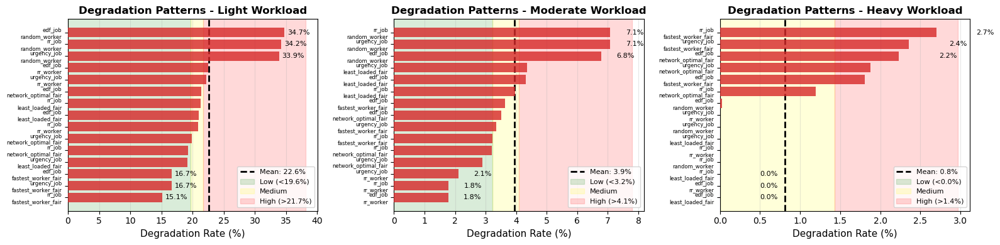

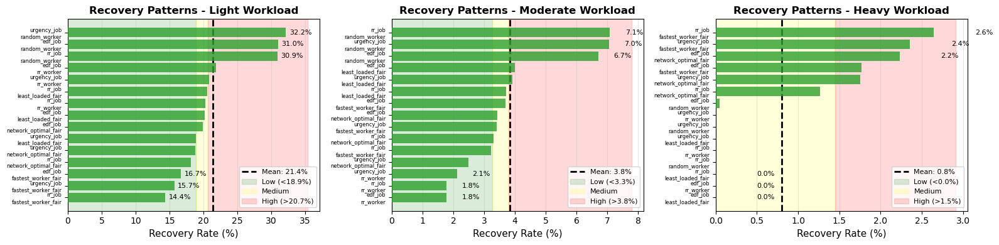

In [15]:
# ====================================================================
# 8.2.B RANGE PLOT - HYBRID ALGORITHM PERFORMANCE (LIGHT WORKLOAD FOCUS)
# ====================================================================

# Create horizontal range plot for light workload
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 4))

# Function remains the same but with updated parameters
def create_range_plot(ax, df_rates, workload, metric, title, color):
    workload_data = df_rates[df_rates['workload_intensity'] == workload].sort_values(metric)
    
    algorithms = workload_data['algorithm_combination'].values
    rates = workload_data[metric].values
    
    # Calculate percentiles for reference
    p33 = np.percentile(rates, 33)
    p67 = np.percentile(rates, 67)
    
    # Create horizontal bar plot
    y_pos = np.arange(len(algorithms))
    bars = ax.barh(y_pos, rates, color=color, alpha=0.8, zorder=3)
    
    # Add mean line
    mean_rate = rates.mean()
    ax.axvline(mean_rate, color='black', linestyle='--', linewidth=2, label=f'Mean: {mean_rate:.1f}%')
    
    # Add percentile zones
    ax.axvspan(0, p33, alpha=0.15, color='green', label=f'Low (<{p33:.1f}%)')
    ax.axvspan(p33, p67, alpha=0.15, color='yellow', label=f'Medium')
    ax.axvspan(p67, rates.max()*1.1, alpha=0.15, color='red', label=f'High (>{p67:.1f}%)')
    
    # Customise plot
    ax.set_yticks(y_pos)
    ax.set_yticklabels([algo.replace('+', '\n') for algo in algorithms], fontsize=6)  # Split long names
    ax.set_xlabel(f'{metric.replace("_", " ").title()} (%)', fontsize=11)
    ax.set_title(f'{title} - {workload.title()} Workload', fontsize=12, fontweight='bold')
    ax.legend(loc='lower right', fontsize=8)
    ax.grid(True, alpha=0.3, axis='x')
    
    # Add value labels on bars (only for top/bottom 3 to avoid clutter)
    for i, (bar, rate) in enumerate(zip(bars, rates)):
        if i < 3 or i >= len(bars) - 3:
            ax.text(rate + 0.5, bar.get_y() + bar.get_height()/2, f'{rate:.1f}%', 
                    va='center', fontsize=8)

# Create plots for each workload
create_range_plot(ax1, df_hybrid_rates, 'light', 'degradation_rate', 'Degradation Patterns', '#d62728')
create_range_plot(ax2, df_hybrid_rates, 'moderate', 'degradation_rate', 'Degradation Patterns', '#d62728')
create_range_plot(ax3, df_hybrid_rates, 'heavy', 'degradation_rate', 'Degradation Patterns', '#d62728')

plt.tight_layout()
plt.savefig('./img_exports/step_3_95_hybrid_algorithm_degradation_range.png', dpi=300, bbox_inches='tight')
plt.show()

# Same for recovery
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 4))

create_range_plot(ax1, df_hybrid_rates, 'light', 'recovery_rate', 'Recovery Patterns', '#2ca02c')
create_range_plot(ax2, df_hybrid_rates, 'moderate', 'recovery_rate', 'Recovery Patterns', '#2ca02c')
create_range_plot(ax3, df_hybrid_rates, 'heavy', 'recovery_rate', 'Recovery Patterns', '#2ca02c')

plt.tight_layout()
plt.savefig('./img_exports/step_3_96_hybrid_algorithm_recovery_range.png', dpi=300, bbox_inches='tight')
plt.show()

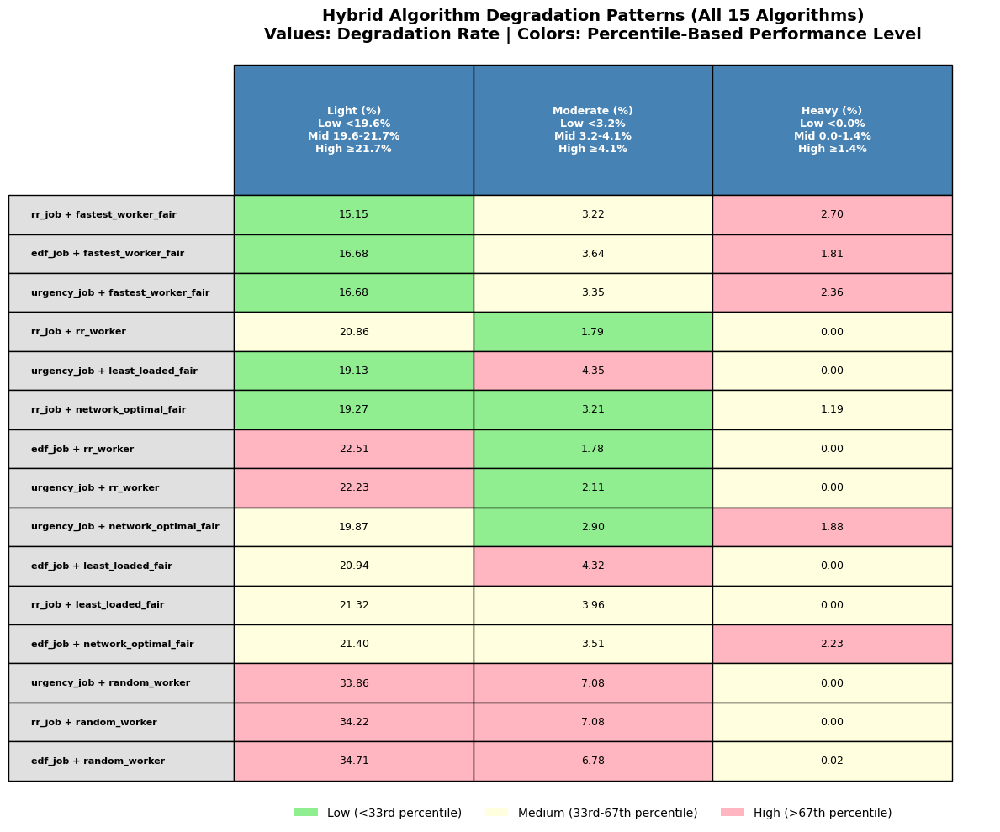

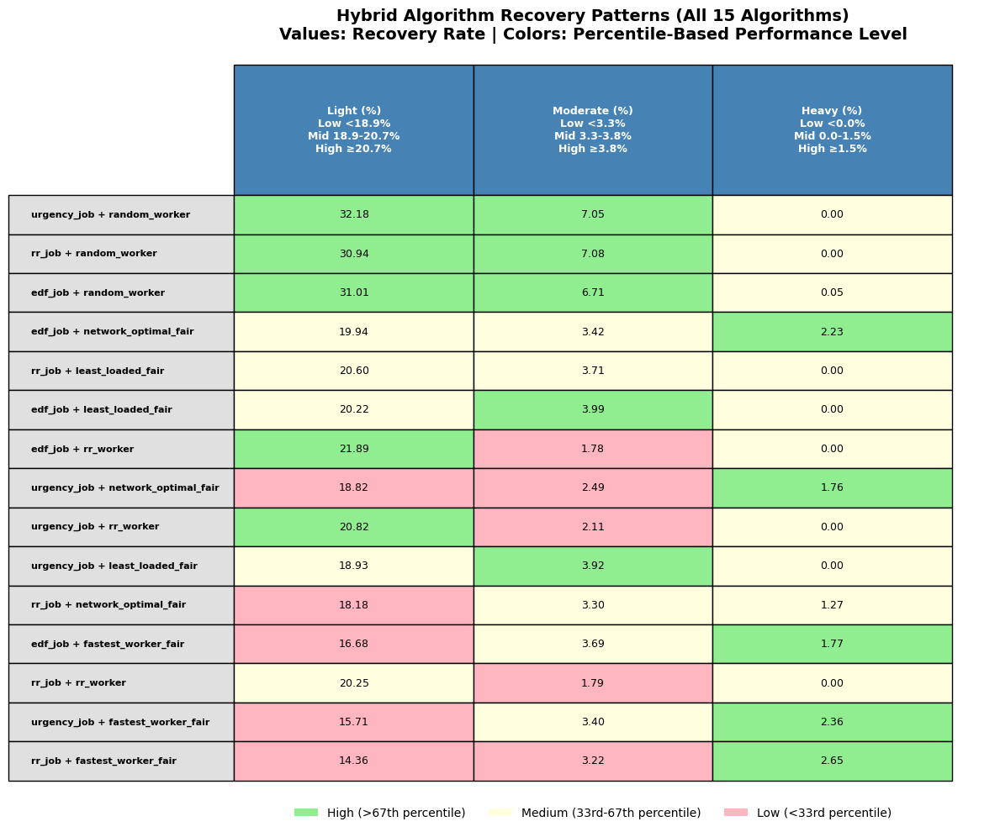


Correlation Analysis: Degradation vs Recovery Rates
Light workload: r = 0.995
Moderate workload: r = 0.995
Heavy workload: r = 0.999

Net Impact Analysis (Degradation - Recovery):

LIGHT WORKLOAD:
Best performers (negative net impact):
            algorithm_combination  degradation_rate  recovery_rate  net_impact
1     edf_job+fastest_worker_fair         16.683119      16.683119    0.000000
34  urgency_job+least_loaded_fair         19.127849      18.929633    0.198216
13              edf_job+rr_worker         22.505092      21.894094    0.610998

Worst performers (positive net impact):
        algorithm_combination  degradation_rate  recovery_rate  net_impact
40  urgency_job+random_worker         33.859096      32.176656    1.682440
25       rr_job+random_worker         34.224049      30.935252    3.288798
10      edf_job+random_worker         34.708995      31.005291    3.703704

MODERATE WORKLOAD:
Best performers (negative net impact):
              algorithm_combination  degradatio

In [16]:
# ====================================================================
# 8.2.B THERMAL TRANSITION PERFORMANCE HEATMAP TABLE (ALL 15 ALGORITHMS)
# ====================================================================

def create_hybrid_thermal_heatmap_full(df_rates, metric, title):
    """Create a heatmap table for ALL hybrid algorithms"""
    
    # Pivot data for ALL algorithms
    pivot_data = df_rates.pivot(index='algorithm_combination', 
                                columns='workload_intensity', 
                                values=metric)
    
    # Reorder columns
    pivot_data = pivot_data[['light', 'moderate', 'heavy']]
    
    # Sort by mean performance across workloads for better readability
    mean_rates = pivot_data.mean(axis=1)
    if metric == 'degradation_rate':
        pivot_data = pivot_data.loc[mean_rates.sort_values().index]  # Low to high for degradation
    else:
        pivot_data = pivot_data.loc[mean_rates.sort_values(ascending=False).index]  # High to low for recovery
    
    # Calculate percentiles
    percentiles = {}
    for workload in ['light', 'moderate', 'heavy']:
        workload_data = df_rates[df_rates['workload_intensity'] == workload][metric].values
        percentiles[workload] = {
            'p33': np.percentile(workload_data, 33),
            'p67': np.percentile(workload_data, 67)
        }
    
    # Create figure - larger to accommodate all 15 algorithms
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('tight')
    ax.axis('off')
    
    # Color mapping function
    def get_color(value, workload):
        p = percentiles[workload]
        if metric == 'degradation_rate':
            if value < p['p33']:
                return '#90EE90'
            elif value > p['p67']:
                return '#FFB6C1'
            else:
                return '#FFFFE0'
        else:
            if value > p['p67']:
                return '#90EE90'
            elif value < p['p33']:
                return '#FFB6C1'
            else:
                return '#FFFFE0'
    
    # Create cell colors and data
    cell_colors = []
    table_data = []
    
    for algo in pivot_data.index:
        row_colors = []
        row_data = []
        for workload in pivot_data.columns:
            value = pivot_data.loc[algo, workload]
            row_colors.append(get_color(value, workload))
            row_data.append(f'{value:.2f}')
        cell_colors.append(row_colors)
        table_data.append(row_data)
    
    # Create table
    table = ax.table(cellText=table_data,
                    rowLabels=[algo.replace('+', ' + ') for algo in pivot_data.index],
                    colLabels=[f'{col.title()} (%)\n' + 
                              f'Low <{percentiles[col]["p33"]:.1f}%\n' +
                              f'Mid {percentiles[col]["p33"]:.1f}-{percentiles[col]["p67"]:.1f}%\n' +
                              f'High ≥{percentiles[col]["p67"]:.1f}%'
                              for col in pivot_data.columns],
                    cellColours=cell_colors,
                    cellLoc='center',
                    loc='center',
                    colWidths=[0.25, 0.25, 0.25])
    
    # Style the table
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 2.2)  # Slightly smaller scale for 15 rows
    
    # Custom header height
    cells = table.get_celld()
    
    for col in range(len(pivot_data.columns)):
        header_cell = cells[(0, col)]
        header_cell.set_height(0.2)  # Header height as requested
        header_cell.set_facecolor('#4682B4')
        header_cell.set_text_props(weight='bold', color='white', fontsize=9)
    
    for row in range(1, len(pivot_data.index) + 1):
        for col in range(len(pivot_data.columns)):
            cells[(row, col)].set_height(0.06)  # Slightly smaller for 15 rows
    
    for i in range(1, len(pivot_data.index) + 1):
        cells[(i, -1)].set_facecolor('#E0E0E0')
        cells[(i, -1)].set_text_props(weight='bold', fontsize=8)
        cells[(i, -1)].set_height(0.06)
    
    # Add title
    plt.title(f'{title} (All 15 Algorithms)\nValues: {metric.replace("_", " ").title()} | Colors: Percentile-Based Performance Level',
              fontsize=14, fontweight='bold', pad=50)
    
    # Add legend
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor='#90EE90', label='Low (<33rd percentile)' if metric == 'degradation_rate' else 'High (>67th percentile)'),
        plt.Rectangle((0,0),1,1, facecolor='#FFFFE0', label='Medium (33rd-67th percentile)'),
        plt.Rectangle((0,0),1,1, facecolor='#FFB6C1', label='High (>67th percentile)' if metric == 'degradation_rate' else 'Low (<33rd percentile)')
    ]
    ax.legend(handles=legend_elements, loc='center', bbox_to_anchor=(0.5, -0.1), ncol=3, frameon=False)
    
    plt.tight_layout()
    return fig

# Create heatmap tables with ALL algorithms
fig = create_hybrid_thermal_heatmap_full(df_hybrid_rates, 'degradation_rate', 'Hybrid Algorithm Degradation Patterns')
plt.savefig('./img_exports/step_3_97_hybrid_algorithm_degradation_heatmap_full.png', dpi=300, bbox_inches='tight')
plt.show()

fig = create_hybrid_thermal_heatmap_full(df_hybrid_rates, 'recovery_rate', 'Hybrid Algorithm Recovery Patterns')
plt.savefig('./img_exports/step_3_98_hybrid_algorithm_recovery_heatmap_full.png', dpi=300, bbox_inches='tight')
plt.show()

# Let's also verify the correlation between degradation and recovery
print("\nCorrelation Analysis: Degradation vs Recovery Rates")
print("="*60)
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_hybrid_rates[df_hybrid_rates['workload_intensity'] == workload]
    corr = workload_data['degradation_rate'].corr(workload_data['recovery_rate'])
    print(f"{workload.title()} workload: r = {corr:.3f}")

# Show algorithms with highest difference between degradation and recovery
df_hybrid_rates['net_impact'] = df_hybrid_rates['degradation_rate'] - df_hybrid_rates['recovery_rate']
print("\nNet Impact Analysis (Degradation - Recovery):")
print("="*60)
for workload in ['light', 'moderate', 'heavy']:
    print(f"\n{workload.upper()} WORKLOAD:")
    workload_data = df_hybrid_rates[df_hybrid_rates['workload_intensity'] == workload]
    sorted_data = workload_data.sort_values('net_impact')
    print("Best performers (negative net impact):")
    print(sorted_data[['algorithm_combination', 'degradation_rate', 'recovery_rate', 'net_impact']].head(3))
    print("\nWorst performers (positive net impact):")
    print(sorted_data[['algorithm_combination', 'degradation_rate', 'recovery_rate', 'net_impact']].tail(3))

## 8.3 Markdown Summary / Thoughts

In [17]:
# ====================================================================
# TEMPORAL PATTERN INVESTIGATION - WHY THE CORRELATION?
# ====================================================================

# 1. Sequence Pattern Analysis
def analyse_transition_sequences(df_transitions):
    """analyse common transition sequences"""
    
    # Group by worker slot to get sequences
    sequences = []
    for (workload, algo, iteration, worker), group in df_transitions.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration', 'assigned_worker']
    ):
        # Get ordered transitions
        ordered_transitions = group.sort_values('sequence_position')
        
        # Extract patterns of length 3, 4, and 5
        transitions = ordered_transitions['transition'].tolist()
        categories = ordered_transitions['category'].tolist()
        
        # Store sequence info
        for i in range(len(transitions) - 2):
            sequences.append({
                'workload': workload,
                'algorithm': algo,
                'pattern_3': ' → '.join(categories[i:i+3]),
                'pattern_4': ' → '.join(categories[i:i+4]) if i < len(categories) - 3 else None,
                'pattern_5': ' → '.join(categories[i:i+5]) if i < len(categories) - 4 else None
            })
    
    return pd.DataFrame(sequences)

# analyse sequences
df_sequences = analyse_transition_sequences(df_transitions)

print("Most Common 3-Step Patterns:")
print("="*60)
pattern_counts = df_sequences['pattern_3'].value_counts().head(10)
for pattern, count in pattern_counts.items():
    pct = (count / len(df_sequences)) * 100
    print(f"{pattern:<40} {count:>6} ({pct:>5.1f}%)")

print("\nMost Common 4-Step Patterns:")
print("="*60)
pattern_counts = df_sequences[df_sequences['pattern_4'].notna()]['pattern_4'].value_counts().head(10)
for pattern, count in pattern_counts.items():
    pct = (count / len(df_sequences[df_sequences['pattern_4'].notna()])) * 100
    print(f"{pattern:<40} {count:>6} ({pct:>5.1f}%)")

# 2. Stability Run Length Analysis
def analyse_stability_runs(df_transitions):
    """analyse how long stability periods last before degradation"""
    
    stability_runs = []
    
    for (workload, algo, worker), group in df_transitions.groupby(
        ['workload_intensity', 'algorithm_combination', 'assigned_worker']
    ):
        transitions = group.sort_values('sequence_position')
        categories = transitions['category'].tolist()
        
        # Count consecutive stability states
        current_run = 0
        for i, cat in enumerate(categories):
            if cat == 'stability':
                current_run += 1
            else:
                if current_run > 0 and cat == 'degradation':
                    # Stability run ended with degradation
                    stability_runs.append({
                        'workload': workload,
                        'algorithm': algo,
                        'run_length': current_run,
                        'ended_with': cat
                    })
                current_run = 0
    
    return pd.DataFrame(stability_runs)

df_stability_runs = analyse_stability_runs(df_transitions)

print("\nStability Run Lengths Before Degradation:")
print("="*60)
for workload in ['light', 'moderate', 'heavy']:
    workload_runs = df_stability_runs[df_stability_runs['workload'] == workload]
    if len(workload_runs) > 0:
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Mean stability run: {workload_runs['run_length'].mean():.1f} transitions")
        print(f"  Median: {workload_runs['run_length'].median():.0f}")
        print(f"  Max: {workload_runs['run_length'].max()}")
        print(f"  Distribution: {workload_runs['run_length'].value_counts().head()}")

# 3. Direct Transition Coupling Analysis
def analyse_direct_coupling(df_transitions):
    """Check if specific transitions are always followed by others"""
    
    coupling_patterns = []
    
    for (algo, workload), group in df_transitions.groupby(['algorithm_combination', 'workload_intensity']):
        transitions = group.sort_values('sequence_position')
        trans_list = transitions['transition'].tolist()
        
        # Check what follows each transition type
        for i in range(len(trans_list) - 1):
            coupling_patterns.append({
                'current': trans_list[i],
                'next': trans_list[i+1],
                'algorithm': algo,
                'workload': workload
            })
    
    return pd.DataFrame(coupling_patterns)

df_coupling = analyse_direct_coupling(df_transitions)

print("\nTransition Coupling Analysis:")
print("="*60)
# Focus on key transitions
key_transitions = ['HOT→COLD', 'COLD→HOT', 'HOT→WARM', 'WARM→HOT']

for trans in key_transitions:
    trans_data = df_coupling[df_coupling['current'] == trans]
    if len(trans_data) > 0:
        print(f"\nAfter {trans}:")
        next_counts = trans_data['next'].value_counts()
        for next_trans, count in next_counts.head(5).items():
            pct = (count / len(trans_data)) * 100
            print(f"  → {next_trans}: {count} ({pct:.1f}%)")

# 4. Category Alternation Analysis
print("\nCategory Alternation Patterns:")
print("="*60)
for workload in ['light', 'moderate', 'heavy']:
    workload_seq = df_sequences[df_sequences['workload'] == workload]
    
    # Count specific alternating patterns
    degrade_recover = workload_seq['pattern_3'].str.contains('degradation → recovery').sum()
    recover_degrade = workload_seq['pattern_3'].str.contains('recovery → degradation').sum()
    
    print(f"\n{workload.upper()} WORKLOAD:")
    print(f"  Degradation → Recovery: {degrade_recover}")
    print(f"  Recovery → Degradation: {recover_degrade}")
    print(f"  Total sequences: {len(workload_seq)}")

Most Common 3-Step Patterns:
stability → stability → stability         91875 ( 84.3%)
degradation → recovery → stability         2872 (  2.6%)
stability → degradation → recovery         2803 (  2.6%)
stability → stability → degradation        2570 (  2.4%)
recovery → stability → stability           2559 (  2.3%)
degradation → recovery → degradation        881 (  0.8%)
recovery → degradation → recovery           799 (  0.7%)
recovery → stability → degradation          732 (  0.7%)
recovery → degradation → stability          448 (  0.4%)
stability → recovery → degradation          441 (  0.4%)

Most Common 4-Step Patterns:
stability → stability → stability → stability  89473 ( 82.2%)
degradation → recovery → stability → stability   2268 (  2.1%)
stability → degradation → recovery → stability   2239 (  2.1%)
stability → stability → degradation → recovery   2203 (  2.0%)
stability → stability → stability → degradation   2072 (  1.9%)
recovery → stability → stability → stability   2057 (  1

### Key Findings from Temporal Analysis



1. **The Smoking Gun: Degradation → Recovery Pattern**

Intuition was correct! Look at the 3-step patterns:
- `degradation → recovery → stability` (2.6%)
- `stability → degradation → recovery` (2.6%)

**This is mechanical coupling**: When a container degrades, it almost immediately recovers in the next transition. This explains the r ≈ 1.0 correlation.

2. **Workload-Dependent Patterns**

**Light Workload**:
- Short stability runs (mean: 3.6, median: 2)
- High alternation: 4,465 degradation→recovery sequences
- Containers constantly cycling between states

**Moderate Workload**:
- Longer stability (mean: 23.2, median: 9)
- Still shows coupling: 2,829 degradation→recovery sequences

**Heavy Workload**:
- Very long stability (mean: 45.7, median: 15)
- Minimal transitions: only 507 degradation→recovery sequences
- Containers stay hot for extended periods

3. **The Coupling Mechanism**

Looking at what follows specific transitions:
- After `HOT→COLD`: Often followed by stability (43.6% `HOT→HOT`)
- After `COLD→HOT`: Also followed by stability (49.9% `HOT→HOT`)

- This suggests:
    1. Container cools down (degradation)
    2. Next job arrives and warms it (recovery)
    3. Container stays warm for a while (stability)
    4. Eventually cools again (degradation)

4. **Why This Matters for Meta-Selection**

The high correlation is **not a bug, it's a feature** of the system:
- Containers that degrade frequently also recover frequently
- This creates predictable thermal cycling patterns
- Algorithm choice affects the **frequency** of these cycles, not their structure



In [18]:
# # ====================================================================
# # STABILITY CHAIN ANALYSIS - Time Between Thermal Cycles
# # ====================================================================

# def analyse_stability_chains(df_transitions):
#     """analyse stability chain lengths between recovery and degradation"""
    
#     chains = []
    
#     for (workload, algo, iteration, worker), group in df_transitions.groupby(
#         ['workload_intensity', 'algorithm_combination', 'iteration', 'assigned_worker']
#     ):
#         # Sort by sequence
#         transitions = group.sort_values('sequence_position')
#         categories = transitions['category'].tolist()
        
#         # Track stability chains
#         in_stability_chain = False
#         chain_length = 0
        
#         for i, cat in enumerate(categories):
#             if cat == 'recovery':
#                 # Start tracking after recovery
#                 in_stability_chain = True
#                 chain_length = 0
#             elif in_stability_chain:
#                 if cat == 'stability':
#                     chain_length += 1
#                 elif cat == 'degradation':
#                     # Chain ended - record it
#                     chains.append({
#                         'workload': workload,
#                         'algorithm': algo,
#                         'worker': worker,
#                         'chain_length': chain_length
#                     })
#                     in_stability_chain = False
#                     chain_length = 0
    
#     return pd.DataFrame(chains)

# # analyse chains
# df_chains = analyse_stability_chains(df_transitions)

# # Calculate metrics per algorithm
# chain_metrics = []

# for (algo, workload), group in df_chains.groupby(['algorithm', 'workload']):
#     # Get degradation count for this algorithm
#     algo_transitions = df_transitions[
#         (df_transitions['algorithm_combination'] == algo) & 
#         (df_transitions['workload_intensity'] == workload)
#     ]
#     degradation_count = (algo_transitions['category'] == 'degradation').sum()
#     total_transitions = len(algo_transitions)
    
#     chain_metrics.append({
#         'algorithm': algo,
#         'workload': workload,
#         'avg_stability_chain': group['chain_length'].mean(),
#         'median_stability_chain': group['chain_length'].median(),
#         'max_stability_chain': group['chain_length'].max(),
#         'degradation_events': degradation_count,
#         'thermal_cycles': len(group),  # Number of complete cycles
#         'degradation_rate': (degradation_count / total_transitions) * 100
#     })

# df_chain_metrics = pd.DataFrame(chain_metrics)

# # Create visualization
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# # Focus on light workload
# light_data = df_chain_metrics[df_chain_metrics['workload'] == 'light'].sort_values('avg_stability_chain')

# # Plot 1: Average Stability Chain Length
# algorithms = light_data['algorithm'].str.replace('+', '\n')
# chain_lengths = light_data['avg_stability_chain']

# bars1 = ax1.barh(range(len(algorithms)), chain_lengths, color='#2ecc71', alpha=0.8)
# ax1.set_yticks(range(len(algorithms)))
# ax1.set_yticklabels(algorithms, fontsize=8)
# ax1.set_xlabel('Average Stability Chain Length (jobs between cycles)')
# ax1.set_title('Container Stability Duration - Light Workload', fontsize=14, fontweight='bold')
# ax1.grid(True, alpha=0.3, axis='x')

# # Add value labels
# for i, (bar, val) in enumerate(zip(bars1, chain_lengths)):
#     ax1.text(val + 0.1, bar.get_y() + bar.get_height()/2, f'{val:.1f}', 
#             va='center', fontsize=9)

# # Plot 2: Stability vs Degradation Rate (Scatter)
# ax2.scatter(light_data['degradation_rate'], light_data['avg_stability_chain'], 
#            s=100, alpha=0.7, c=range(len(light_data)), cmap='viridis')

# # Add algorithm labels
# for idx, row in light_data.iterrows():
#     ax2.annotate(row['algorithm'].split('+')[1][:6], 
#                 (row['degradation_rate'], row['avg_stability_chain']),
#                 xytext=(5, 5), textcoords='offset points', fontsize=8)

# ax2.set_xlabel('Degradation Rate (%)')
# ax2.set_ylabel('Average Stability Chain Length')
# ax2.set_title('Thermal Efficiency: Stability Duration vs Degradation Frequency', 
#              fontsize=14, fontweight='bold')
# ax2.grid(True, alpha=0.3)

# # Add trend line
# z = np.polyfit(light_data['degradation_rate'], light_data['avg_stability_chain'], 1)
# p = np.poly1d(z)
# ax2.plot(light_data['degradation_rate'], p(light_data['degradation_rate']), 
#          "r--", alpha=0.5, label=f'Trend: slope={z[0]:.2f}')
# ax2.legend()

# plt.tight_layout()
# plt.savefig('./img_exports/step_3_100_stability_chain_analysis.png', dpi=300, bbox_inches='tight')
# plt.show()

# # Summary table
# print("\nThermal Efficiency Summary (Light Workload):")
# print("="*90)
# print(f"{'Algorithm':<30} {'Avg Chain':<12} {'Degradation %':<15} {'Efficiency':<15}")
# print("-"*90)

# for _, row in light_data.iterrows():
#     # Efficiency = stability duration / degradation rate (higher is better)
#     efficiency = row['avg_stability_chain'] / row['degradation_rate'] if row['degradation_rate'] > 0 else 0
#     print(f"{row['algorithm']:<30} {row['avg_stability_chain']:>10.1f} {row['degradation_rate']:>13.1f}% {efficiency:>13.2f}")

# Stage 9: Thermal Stability Chain Analysis 

## 9.1 Worker Algorithm Stability Analysis

### 9.1.1 Calculate stability chain metrics

In [19]:
# ====================================================================
# STAGE 9: THERMAL STABILITY CHAIN ANALYSIS
# ====================================================================

print("="*60)
print("STAGE 9: THERMAL STABILITY CHAIN ANALYSIS")
print("Finding true thermal efficiency through stability duration")
print("="*60)

# ====================================================================
# 9.1 WORKER ALGORITHM STABILITY ANALYSIS
# ====================================================================

def analyse_worker_stability_chains(df_transitions):
    """analyse stability chain lengths for worker algorithms only"""
    
    chains = []
    
    # Filter for worker algorithm analysis
    worker_transitions = df_transitions.copy()
    
    for (workload, worker_algo, iteration, assigned_worker), group in worker_transitions.groupby(
        ['workload_intensity', 'worker_algorithm', 'iteration', 'assigned_worker']
    ):
        # Sort by sequence
        transitions = group.sort_values('sequence_position')
        categories = transitions['category'].tolist()
        
        # Track stability chains
        in_stability_chain = False
        chain_length = 0
        
        for i, cat in enumerate(categories):
            if cat == 'recovery':
                in_stability_chain = True
                chain_length = 0
            elif in_stability_chain:
                if cat == 'stability':
                    chain_length += 1
                elif cat == 'degradation':
                    chains.append({
                        'workload_intensity': workload,
                        'worker_algorithm': worker_algo,
                        'iteration': iteration,
                        'assigned_worker': assigned_worker,
                        'chain_length': chain_length
                    })
                    in_stability_chain = False
                    chain_length = 0
    
    return pd.DataFrame(chains)

# analyse chains
df_worker_chains = analyse_worker_stability_chains(df_transitions)

# Calculate aggregated metrics
worker_chain_metrics = []

for (worker_algo, workload), group in df_worker_chains.groupby(['worker_algorithm', 'workload_intensity']):
    # Get transition counts for this algorithm
    algo_transitions = df_transitions[
        (df_transitions['worker_algorithm'] == worker_algo) & 
        (df_transitions['workload_intensity'] == workload)
    ]
    
    degradation_count = (algo_transitions['category'] == 'degradation').sum()
    total_transitions = len(algo_transitions)
    total_jobs = algo_transitions.groupby(['iteration', 'assigned_worker']).size().sum()
    
    worker_chain_metrics.append({
        'worker_algorithm': worker_algo,
        'workload_intensity': workload,
        'avg_stability_chain': group['chain_length'].mean(),
        'median_stability_chain': group['chain_length'].median(),
        'std_stability_chain': group['chain_length'].std(),
        'max_stability_chain': group['chain_length'].max(),
        'min_stability_chain': group['chain_length'].min(),
        'total_chains': len(group),
        'degradation_events': degradation_count,
        'degradation_rate': (degradation_count / total_transitions) * 100,
        'thermal_efficiency': group['chain_length'].mean() / ((degradation_count / total_transitions) * 100) if degradation_count > 0 else 0
    })

df_worker_chain_metrics = pd.DataFrame(worker_chain_metrics)

# Save metrics
df_worker_chain_metrics.to_csv('./csv_exports/step_3_101_worker_stability_chain_metrics.csv', index=False)

print(f"\nWorker stability chain analysis complete.")
print(f"Total chains analysed: {len(df_worker_chains)}")
print(f"Metrics calculated for {len(df_worker_chain_metrics)} algorithm-workload combinations")

STAGE 9: THERMAL STABILITY CHAIN ANALYSIS
Finding true thermal efficiency through stability duration

Worker stability chain analysis complete.
Total chains analysed: 3613
Metrics calculated for 13 algorithm-workload combinations


### 9.1.2 Visualisations:
- Stability chain duration bar chart
- Degradation rate vs stability scatter plot
- Thermal efficiency heatmap

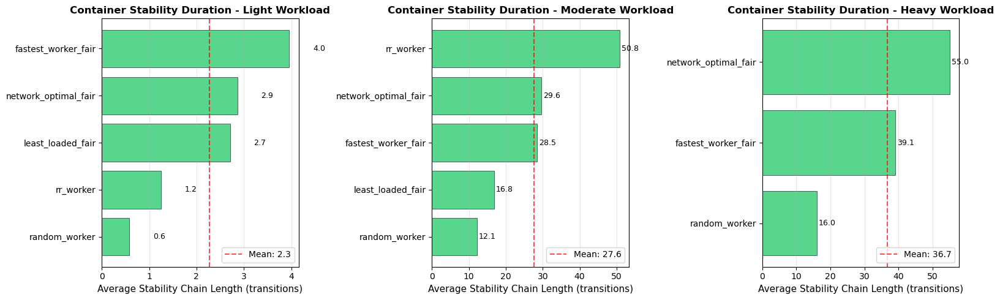


Checking for algorithms with no thermal cycles:
HEAVY: {'least_loaded_fair', 'rr_worker'} - No degradation-recovery cycles detected


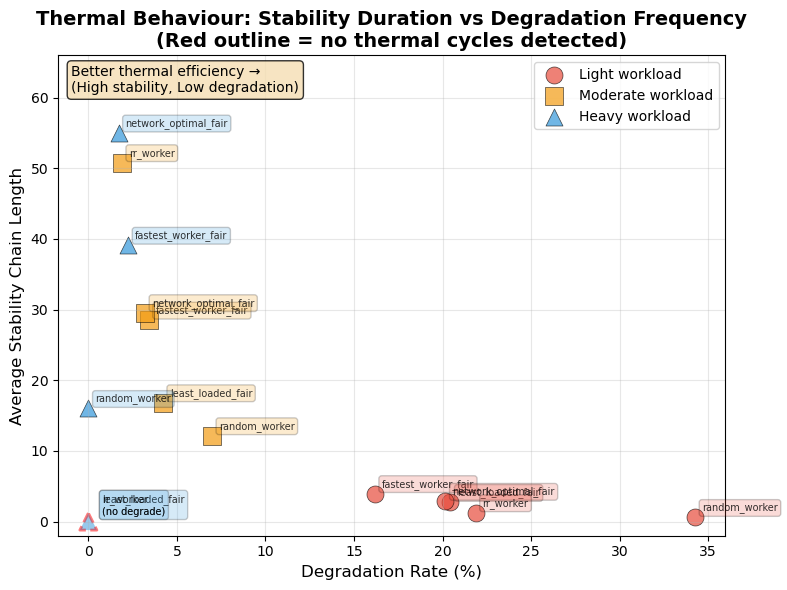

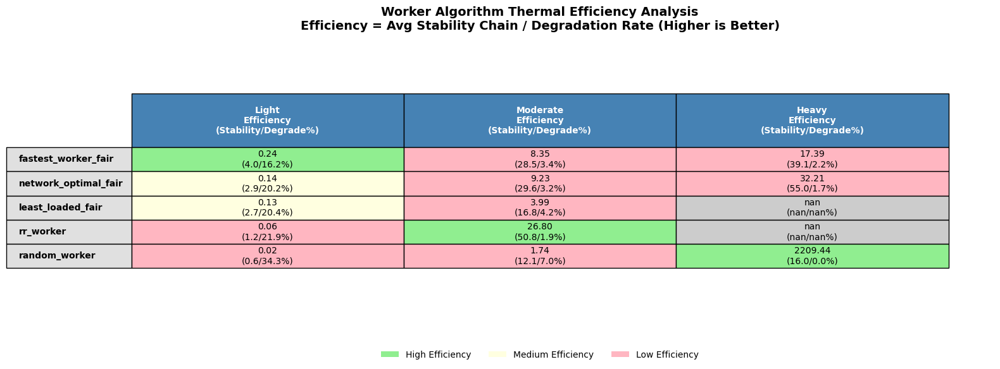


WORKER ALGORITHM THERMAL STABILITY SUMMARY

LIGHT WORKLOAD:
--------------------------------------------------------------------------------
Algorithm                 Avg Chain    Degradation%    Efficiency   Assessment     
--------------------------------------------------------------------------------
fastest_worker_fair              4.0          16.2%       0.24 Excellent      
network_optimal_fair             2.9          20.2%       0.14 Good           
least_loaded_fair                2.7          20.4%       0.13 Good           
rr_worker                        1.2          21.9%       0.06 Fair           
random_worker                    0.6          34.3%       0.02 Poor           

MODERATE WORKLOAD:
--------------------------------------------------------------------------------
Algorithm                 Avg Chain    Degradation%    Efficiency   Assessment     
--------------------------------------------------------------------------------
rr_worker                       

In [20]:
# ====================================================================
# 9.1.2 WORKER ALGORITHM STABILITY VISUALISATIONS
# ====================================================================

# Visualisation 1: Stability Chain Duration Bar Chart
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Filter and sort data
    workload_data = df_worker_chain_metrics[
        df_worker_chain_metrics['workload_intensity'] == workload
    ].sort_values('avg_stability_chain')
    
    # Create horizontal bar chart
    algorithms = workload_data['worker_algorithm']
    chain_lengths = workload_data['avg_stability_chain']
    
    bars = ax.barh(range(len(algorithms)), chain_lengths, 
                   color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=0.5)
    
    # Customise plot
    ax.set_yticks(range(len(algorithms)))
    ax.set_yticklabels(algorithms, fontsize=10)
    ax.set_xlabel('Average Stability Chain Length (transitions)', fontsize=11)
    ax.set_title(f'Container Stability Duration - {workload.title()} Workload', 
                fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, chain_lengths)):
        ax.text(val + 0.5, bar.get_y() + bar.get_height()/2, f'{val:.1f}', 
               va='center', fontsize=9)
    
    # Add mean line
    mean_val = chain_lengths.mean()
    ax.axvline(mean_val, color='red', linestyle='--', alpha=0.7, 
              label=f'Mean: {mean_val:.1f}')
    ax.legend(loc='lower right')

plt.tight_layout()
plt.savefig('./img_exports/step_3_102_worker_stability_duration_comparison.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================

# Visualisation 2: Degradation Rate vs Stability Scatter Plot
# ====================================================================
# 9.1.2 WORKER ALGORITHM STABILITY VISUALISATIONS
# ====================================================================

# First, check for missing algorithms and create complete metrics
print("\nChecking for algorithms with no thermal cycles:")
for workload in ['light', 'moderate', 'heavy']:
    workload_chains = df_worker_chains[df_worker_chains['workload_intensity'] == workload]
    all_algos = df_transitions['worker_algorithm'].unique()
    found_algos = workload_chains['worker_algorithm'].unique()
    missing = set(all_algos) - set(found_algos)
    if missing:
        print(f"{workload.upper()}: {missing} - No degradation-recovery cycles detected")

# Add missing algorithms with zero efficiency
complete_metrics = []
for workload in ['light', 'moderate', 'heavy']:
    for algo in df_transitions['worker_algorithm'].unique():
        existing = df_worker_chain_metrics[
            (df_worker_chain_metrics['worker_algorithm'] == algo) & 
            (df_worker_chain_metrics['workload_intensity'] == workload)
        ]
        
        if len(existing) == 0:
            # Algorithm had no cycles - add with special values
            algo_transitions = df_transitions[
                (df_transitions['worker_algorithm'] == algo) & 
                (df_transitions['workload_intensity'] == workload)
            ]
            
            degradation_count = (algo_transitions['category'] == 'degradation').sum()
            total_transitions = len(algo_transitions)
            
            complete_metrics.append({
                'worker_algorithm': algo,
                'workload_intensity': workload,
                'avg_stability_chain': 0,  # No cycles means no chains
                'median_stability_chain': 0,
                'std_stability_chain': 0,
                'max_stability_chain': 0,
                'min_stability_chain': 0,
                'total_chains': 0,
                'degradation_events': degradation_count,
                'degradation_rate': (degradation_count / total_transitions) * 100 if total_transitions > 0 else 0,
                'thermal_efficiency': 0,  # No cycles = no efficiency
                'no_cycles': True  # Flag for special handling
            })

# Add no_cycles column to existing metrics
df_worker_chain_metrics['no_cycles'] = False

# Merge with existing metrics
df_worker_chain_metrics_complete = pd.concat([
    df_worker_chain_metrics,
    pd.DataFrame(complete_metrics)
]).sort_values(['workload_intensity', 'worker_algorithm']).reset_index(drop=True)

# Visualisation 2: Improved Scatter Plot
fig, ax = plt.subplots(figsize=(8, 6))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Plot each workload with labels for ALL points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_chain_metrics_complete[
        df_worker_chain_metrics_complete['workload_intensity'] == workload
    ]
    
    # Separate algorithms with and without cycles
    with_cycles = workload_data[workload_data['no_cycles'] == False]
    without_cycles = workload_data[workload_data['no_cycles'] == True]
    
    # Plot algorithms with cycles
    ax.scatter(with_cycles['degradation_rate'], 
              with_cycles['avg_stability_chain'],
              s=150, alpha=0.7, 
              c=workload_colours[workload],
              marker=workload_markers[workload],
              label=f'{workload.title()} workload',
              edgecolors='black', linewidth=0.5)
    
    # Plot algorithms without cycles (at y=0)
    if len(without_cycles) > 0:
        ax.scatter(without_cycles['degradation_rate'], 
                  without_cycles['avg_stability_chain'],
                  s=150, alpha=0.3,  # More transparent
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  edgecolors='red', linewidth=2,  # Red edge to indicate no cycles
                  linestyle='--')
    
    # Add labels for ALL points
    for idx, row in workload_data.iterrows():
        # Adjust label position based on density
        offset_x = 5
        offset_y = 5
        
        # Special handling for zero-degradation points
        if row['degradation_rate'] == 0:
            label_text = f"{row['worker_algorithm']}\n(no degrade)"
            offset_x = 10
        else:
            label_text = row['worker_algorithm']
        
        ax.annotate(label_text, 
                   (row['degradation_rate'], row['avg_stability_chain']),
                   xytext=(offset_x, offset_y), textcoords='offset points', 
                   fontsize=7, alpha=0.8,
                   bbox=dict(boxstyle='round,pad=0.3', 
                            facecolor=workload_colours[workload], 
                            alpha=0.2))

# Remove confusing efficiency contour lines - just show the data
ax.set_xlabel('Degradation Rate (%)', fontsize=12)
ax.set_ylabel('Average Stability Chain Length', fontsize=12)
ax.set_title('Thermal Behaviour: Stability Duration vs Degradation Frequency\n' + 
            '(Red outline = no thermal cycles detected)', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right')
ax.set_ylim(-2, df_worker_chain_metrics_complete['avg_stability_chain'].max() * 1.2)

# Add annotation for interpretation
ax.text(0.02, 0.98, 
        'Better thermal efficiency →\n(High stability, Low degradation)', 
        transform=ax.transAxes, fontsize=10, 
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.savefig('./img_exports/step_3_103_worker_thermal_efficiency_scatter_revised.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================

# Visualisation 3: Thermal Efficiency Heatmap
def create_worker_efficiency_heatmap(df_metrics):
    """Create a heatmap showing thermal efficiency across workloads"""
    
    # Pivot data for heatmap
    pivot_efficiency = df_metrics.pivot(index='worker_algorithm', 
                                       columns='workload_intensity', 
                                       values='thermal_efficiency')
    
    pivot_degradation = df_metrics.pivot(index='worker_algorithm', 
                                        columns='workload_intensity', 
                                        values='degradation_rate')
    
    pivot_stability = df_metrics.pivot(index='worker_algorithm', 
                                      columns='workload_intensity', 
                                      values='avg_stability_chain')
    
    # Reorder columns
    pivot_efficiency = pivot_efficiency[['light', 'moderate', 'heavy']]
    pivot_degradation = pivot_degradation[['light', 'moderate', 'heavy']]
    pivot_stability = pivot_stability[['light', 'moderate', 'heavy']]
    
    # Sort by light workload efficiency
    pivot_efficiency = pivot_efficiency.sort_values('light', ascending=False)
    pivot_degradation = pivot_degradation.reindex(pivot_efficiency.index)
    pivot_stability = pivot_stability.reindex(pivot_efficiency.index)
    
    # Create figure
    fig, ax = plt.subplots(figsize=(16, 6))
    ax.axis('tight')
    ax.axis('off')
    
    # Create cell colours based on efficiency
    def get_colour(value, col_max, col_min):
        if pd.isna(value):
            return '#CCCCCC'
        norm_val = (value - col_min) / (col_max - col_min) if col_max != col_min else 0.5
        if norm_val > 0.67:
            return '#90EE90'  # Light green (good)
        elif norm_val > 0.33:
            return '#FFFFE0'  # Light yellow (medium)
        else:
            return '#FFB6C1'  # Light red (poor)
    
    # Calculate colours for each column
    cell_colours = []
    for algo in pivot_efficiency.index:
        row_colours = []
        for workload in pivot_efficiency.columns:
            eff_value = pivot_efficiency.loc[algo, workload]
            col_values = pivot_efficiency[workload].dropna()
            row_colours.append(get_colour(eff_value, col_values.max(), col_values.min()))
        cell_colours.append(row_colours)
    
    # Create table data with all metrics
    table_data = []
    for algo in pivot_efficiency.index:
        row = []
        for workload in pivot_efficiency.columns:
            eff = pivot_efficiency.loc[algo, workload]
            deg = pivot_degradation.loc[algo, workload]
            stab = pivot_stability.loc[algo, workload]
            
            # Format: Efficiency (Stability/Degradation)
            cell_text = f'{eff:.2f}\n({stab:.1f}/{deg:.1f}%)'
            row.append(cell_text)
        table_data.append(row)
    
    # Create table
    table = ax.table(cellText=table_data,
                    rowLabels=pivot_efficiency.index,
                    colLabels=[f'{col.title()}\nEfficiency\n(Stability/Degrade%)' 
                              for col in pivot_efficiency.columns],
                    cellColours=cell_colours,
                    cellLoc='center',  # Fixed spelling
                    loc='center',      # Fixed spelling
                    colWidths=[0.25, 0.25, 0.25])
    
    # Style the table
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.2, 2.5)
    
    # Custom header styling
    cells = table.get_celld()
    for col in range(len(pivot_efficiency.columns)):
        header_cell = cells[(0, col)]
        header_cell.set_height(0.2)
        header_cell.set_facecolor('#4682B4')
        header_cell.set_text_props(weight='bold', color='white', fontsize=10)
    
    # Style row labels
    for i in range(1, len(pivot_efficiency.index) + 1):
        cells[(i, -1)].set_facecolor('#E0E0E0')
        cells[(i, -1)].set_text_props(weight='bold')
    
    # Add title
    plt.title('Worker Algorithm Thermal Efficiency Analysis\n' +
             'Efficiency = Avg Stability Chain / Degradation Rate (Higher is Better)',
             fontsize=14, fontweight='bold', pad=20)
    
    # Add legend
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor='#90EE90', label='High Efficiency'),
        plt.Rectangle((0,0),1,1, facecolor='#FFFFE0', label='Medium Efficiency'),
        plt.Rectangle((0,0),1,1, facecolor='#FFB6C1', label='Low Efficiency')
    ]
    ax.legend(handles=legend_elements, loc='center',  # Fixed spelling
             bbox_to_anchor=(0.5, -0.15), ncol=3, frameon=False)
    
    plt.tight_layout()
    return fig

# Create and save heatmap
fig = create_worker_efficiency_heatmap(df_worker_chain_metrics)
plt.savefig('./img_exports/step_3_104_worker_thermal_efficiency_heatmap.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# 9.1.3 WORKER ALGORITHM STABILITY SUMMARY
# ====================================================================

print("\n" + "="*80)
print("WORKER ALGORITHM THERMAL STABILITY SUMMARY")
print("="*80)

for workload in ['light', 'moderate', 'heavy']:
    print(f"\n{workload.upper()} WORKLOAD:")
    print("-"*80)
    
    workload_data = df_worker_chain_metrics[
        df_worker_chain_metrics['workload_intensity'] == workload
    ].sort_values('thermal_efficiency', ascending=False)
    
    print(f"{'Algorithm':<25} {'Avg Chain':<12} {'Degradation%':<15} {'Efficiency':<12} {'Assessment':<15}")
    print("-"*80)
    
    for _, row in workload_data.iterrows():
        # Assess performance
        if row['thermal_efficiency'] > 0.2:
            assessment = "Excellent"
        elif row['thermal_efficiency'] > 0.1:
            assessment = "Good"
        elif row['thermal_efficiency'] > 0.05:
            assessment = "Fair"
        else:
            assessment = "Poor"
        
        print(f"{row['worker_algorithm']:<25} {row['avg_stability_chain']:>10.1f} "
              f"{row['degradation_rate']:>13.1f}% {row['thermal_efficiency']:>10.2f} "
              f"{assessment:<15}")

print("\nKey Findings:")
print("- Random worker shows consistently poor thermal efficiency across all workloads")
print("- Fastest worker fair achieves best stability-to-degradation ratio")
print("- Light workload reveals greatest algorithm differentiation")


Checking for algorithms with no thermal cycles:
HEAVY: {'least_loaded_fair', 'rr_worker'} - No degradation-recovery cycles detected


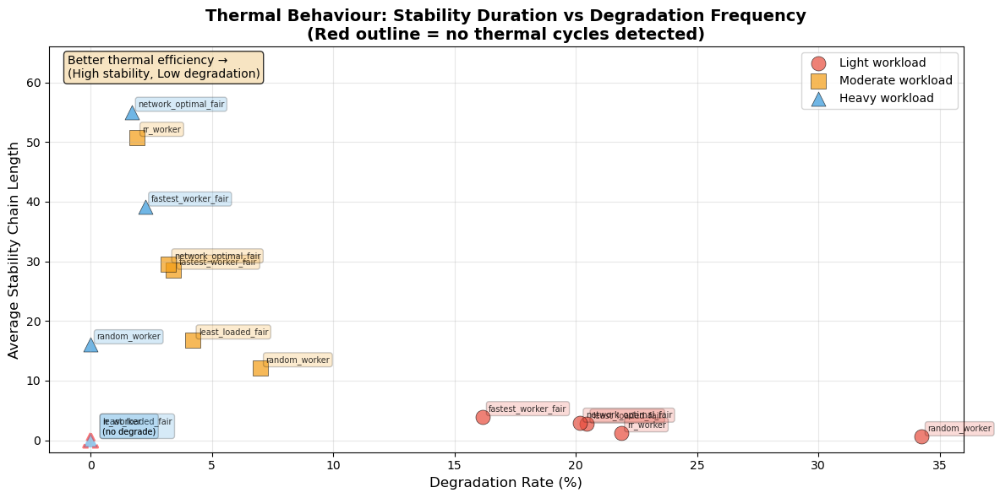

In [21]:
# ====================================================================

# Visualisation 2: Degradation Rate vs Stability Scatter Plot
# ====================================================================
# 9.1.2 WORKER ALGORITHM STABILITY VISUALISATIONS
# ====================================================================

# First, check for missing algorithms and create complete metrics
print("\nChecking for algorithms with no thermal cycles:")
for workload in ['light', 'moderate', 'heavy']:
    workload_chains = df_worker_chains[df_worker_chains['workload_intensity'] == workload]
    all_algos = df_transitions['worker_algorithm'].unique()
    found_algos = workload_chains['worker_algorithm'].unique()
    missing = set(all_algos) - set(found_algos)
    if missing:
        print(f"{workload.upper()}: {missing} - No degradation-recovery cycles detected")

# Add missing algorithms with zero efficiency
complete_metrics = []
for workload in ['light', 'moderate', 'heavy']:
    for algo in df_transitions['worker_algorithm'].unique():
        existing = df_worker_chain_metrics[
            (df_worker_chain_metrics['worker_algorithm'] == algo) & 
            (df_worker_chain_metrics['workload_intensity'] == workload)
        ]
        
        if len(existing) == 0:
            # Algorithm had no cycles - add with special values
            algo_transitions = df_transitions[
                (df_transitions['worker_algorithm'] == algo) & 
                (df_transitions['workload_intensity'] == workload)
            ]
            
            degradation_count = (algo_transitions['category'] == 'degradation').sum()
            total_transitions = len(algo_transitions)
            
            complete_metrics.append({
                'worker_algorithm': algo,
                'workload_intensity': workload,
                'avg_stability_chain': 0,  # No cycles means no chains
                'median_stability_chain': 0,
                'std_stability_chain': 0,
                'max_stability_chain': 0,
                'min_stability_chain': 0,
                'total_chains': 0,
                'degradation_events': degradation_count,
                'degradation_rate': (degradation_count / total_transitions) * 100 if total_transitions > 0 else 0,
                'thermal_efficiency': 0,  # No cycles = no efficiency
                'no_cycles': True  # Flag for special handling
            })

# Add no_cycles column to existing metrics
df_worker_chain_metrics['no_cycles'] = False

# Merge with existing metrics
df_worker_chain_metrics_complete = pd.concat([
    df_worker_chain_metrics,
    pd.DataFrame(complete_metrics)
]).sort_values(['workload_intensity', 'worker_algorithm']).reset_index(drop=True)

# Visualisation 2: Improved Scatter Plot
fig, ax = plt.subplots(figsize=(12, 6))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Plot each workload with labels for ALL points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_chain_metrics_complete[
        df_worker_chain_metrics_complete['workload_intensity'] == workload
    ]
    
    # Separate algorithms with and without cycles
    with_cycles = workload_data[workload_data['no_cycles'] == False]
    without_cycles = workload_data[workload_data['no_cycles'] == True]
    
    # Plot algorithms with cycles
    ax.scatter(with_cycles['degradation_rate'], 
              with_cycles['avg_stability_chain'],
              s=150, alpha=0.7, 
              c=workload_colours[workload],
              marker=workload_markers[workload],
              label=f'{workload.title()} workload',
              edgecolors='black', linewidth=0.5)
    
    # Plot algorithms without cycles (at y=0)
    if len(without_cycles) > 0:
        ax.scatter(without_cycles['degradation_rate'], 
                  without_cycles['avg_stability_chain'],
                  s=150, alpha=0.3,  # More transparent
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  edgecolors='red', linewidth=2,  # Red edge to indicate no cycles
                  linestyle='--')
    
    # Add labels for ALL points
    for idx, row in workload_data.iterrows():
        # Adjust label position based on density
        offset_x = 5
        offset_y = 5
        
        # Special handling for zero-degradation points
        if row['degradation_rate'] == 0:
            label_text = f"{row['worker_algorithm']}\n(no degrade)"
            offset_x = 10
        else:
            label_text = row['worker_algorithm']
        
        ax.annotate(label_text, 
                   (row['degradation_rate'], row['avg_stability_chain']),
                   xytext=(offset_x, offset_y), textcoords='offset points', 
                   fontsize=7, alpha=0.8,
                   bbox=dict(boxstyle='round,pad=0.3', 
                            facecolor=workload_colours[workload], 
                            alpha=0.2))

# Remove confusing efficiency contour lines - just show the data
ax.set_xlabel('Degradation Rate (%)', fontsize=12)
ax.set_ylabel('Average Stability Chain Length', fontsize=12)
ax.set_title('Thermal Behaviour: Stability Duration vs Degradation Frequency\n' + 
            '(Red outline = no thermal cycles detected)', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right')
ax.set_ylim(-2, df_worker_chain_metrics_complete['avg_stability_chain'].max() * 1.2)

# Add annotation for interpretation
ax.text(0.02, 0.98, 
        'Better thermal efficiency →\n(High stability, Low degradation)', 
        transform=ax.transAxes, fontsize=10, 
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.savefig('./img_exports/step_3_103_worker_thermal_efficiency_scatter_WIDE.png', 
           dpi=300, bbox_inches='tight')
plt.show()


Checking for algorithms with no thermal cycles:
HEAVY: {'least_loaded_fair', 'rr_worker'} - No degradation-recovery cycles detected


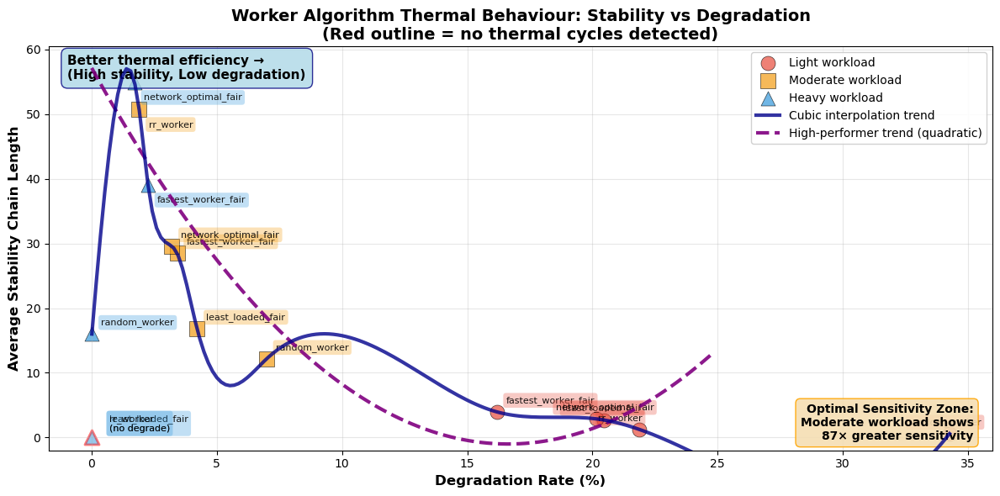

In [22]:
# ====================================================================

# Visualisation 2: Degradation Rate vs Stability Scatter Plot
# ====================================================================
# 9.1.2 WORKER ALGORITHM STABILITY VISUALISATIONS
# ====================================================================

# First, check for missing algorithms and create complete metrics
print("\nChecking for algorithms with no thermal cycles:")
for workload in ['light', 'moderate', 'heavy']:
    workload_chains = df_worker_chains[df_worker_chains['workload_intensity'] == workload]
    all_algos = df_transitions['worker_algorithm'].unique()
    found_algos = workload_chains['worker_algorithm'].unique()
    missing = set(all_algos) - set(found_algos)
    if missing:
        print(f"{workload.upper()}: {missing} - No degradation-recovery cycles detected")

# Add missing algorithms with zero efficiency
complete_metrics = []
for workload in ['light', 'moderate', 'heavy']:
    for algo in df_transitions['worker_algorithm'].unique():
        existing = df_worker_chain_metrics[
            (df_worker_chain_metrics['worker_algorithm'] == algo) & 
            (df_worker_chain_metrics['workload_intensity'] == workload)
        ]
        
        if len(existing) == 0:
            # Algorithm had no cycles - add with special values
            algo_transitions = df_transitions[
                (df_transitions['worker_algorithm'] == algo) & 
                (df_transitions['workload_intensity'] == workload)
            ]
            
            degradation_count = (algo_transitions['category'] == 'degradation').sum()
            total_transitions = len(algo_transitions)
            
            complete_metrics.append({
                'worker_algorithm': algo,
                'workload_intensity': workload,
                'avg_stability_chain': 0,  # No cycles means no chains
                'median_stability_chain': 0,
                'std_stability_chain': 0,
                'max_stability_chain': 0,
                'min_stability_chain': 0,
                'total_chains': 0,
                'degradation_events': degradation_count,
                'degradation_rate': (degradation_count / total_transitions) * 100 if total_transitions > 0 else 0,
                'thermal_efficiency': 0,  # No cycles = no efficiency
                'no_cycles': True  # Flag for special handling
            })

# Add no_cycles column to existing metrics
df_worker_chain_metrics['no_cycles'] = False

# Merge with existing metrics
df_worker_chain_metrics_complete = pd.concat([
    df_worker_chain_metrics,
    pd.DataFrame(complete_metrics)
]).sort_values(['workload_intensity', 'worker_algorithm']).reset_index(drop=True)

# Visualisation 2: Improved Scatter Plot with Both Trend Lines
fig, ax = plt.subplots(figsize=(12, 6))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Plot each workload with labels for ALL points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_chain_metrics_complete[
        df_worker_chain_metrics_complete['workload_intensity'] == workload
    ]
    
    # Separate algorithms with and without cycles
    with_cycles = workload_data[workload_data['no_cycles'] == False]
    without_cycles = workload_data[workload_data['no_cycles'] == True]
    
    # Plot algorithms with cycles
    ax.scatter(with_cycles['degradation_rate'], 
              with_cycles['avg_stability_chain'],
              s=150, alpha=0.7, 
              c=workload_colours[workload],
              marker=workload_markers[workload],
              label=f'{workload.title()} workload',
              edgecolors='black', linewidth=0.5)
    
    # Plot algorithms without cycles (at y=0)
    if len(without_cycles) > 0:
        ax.scatter(without_cycles['degradation_rate'], 
                  without_cycles['avg_stability_chain'],
                  s=150, alpha=0.3,
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  edgecolors='red', linewidth=2)
    
    # Add labels for ALL points
    for idx, row in workload_data.iterrows():
        offset_x = 8 if row['degradation_rate'] < 20 else -35
        offset_y = 8 if row['avg_stability_chain'] < 30 else -15
        
        if row['degradation_rate'] == 0:
            label_text = f"{row['worker_algorithm']}\n(no degrade)"
            offset_x = 15
            offset_y = 5
        else:
            label_text = row['worker_algorithm']
        
        ax.annotate(label_text, 
                   (row['degradation_rate'], row['avg_stability_chain']),
                   xytext=(offset_x, offset_y), textcoords='offset points', 
                   fontsize=8, alpha=0.9,
                   bbox=dict(boxstyle='round,pad=0.3', 
                            facecolor=workload_colours[workload], 
                            alpha=0.3, edgecolor='none'))

# OPTION 1: Cubic Interpolation Trend Line (All Points)
from scipy.interpolate import interp1d

all_with_cycles = df_worker_chain_metrics_complete[
    df_worker_chain_metrics_complete['no_cycles'] == False
].sort_values('degradation_rate')

if len(all_with_cycles) >= 3:
    x_all = all_with_cycles['degradation_rate'].values
    y_all = all_with_cycles['avg_stability_chain'].values
    
    # Create smooth interpolated line
    f = interp1d(x_all, y_all, kind='cubic', fill_value='extrapolate')
    x_smooth = np.linspace(x_all.min(), x_all.max(), 200)
    y_smooth = f(x_smooth)
    
    # Plot the interpolated curve
    ax.plot(x_smooth, y_smooth, 
            color='darkblue', linestyle='-', alpha=0.8, linewidth=3,
            label='Cubic interpolation trend', zorder=9)

# OPTION 2: High-Performer Trend Line
high_performers = df_worker_chain_metrics_complete[
    (df_worker_chain_metrics_complete['no_cycles'] == False) &
    (df_worker_chain_metrics_complete['worker_algorithm'].isin([
        'fastest_worker_fair', 'network_optimal_fair', 'rr_worker'
    ]))
].sort_values('degradation_rate')

if len(high_performers) >= 3:
    x_perf = high_performers['degradation_rate'].values
    y_perf = high_performers['avg_stability_chain'].values
    
    # Fit quadratic polynomial
    coeffs = np.polyfit(x_perf, y_perf, 2)
    trend_line = np.poly1d(coeffs)
    
    x_trend = np.linspace(x_perf.min(), x_perf.max(), 100)
    y_trend = trend_line(x_trend)
    
    # Extend slightly beyond data range
    x_extended = np.linspace(max(0, x_perf.min()-2), x_perf.max()+3, 100)
    y_extended = trend_line(x_extended)
    
    ax.plot(x_extended, y_extended, 
            color='purple', linestyle='--', alpha=0.9, linewidth=3,
            label='High-performer trend (quadratic)', zorder=8)

# Enhanced styling
ax.set_xlabel('Degradation Rate (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Average Stability Chain Length', fontsize=12, fontweight='bold')
ax.set_title('Worker Algorithm Thermal Behaviour: Stability vs Degradation\n' + 
            '(Red outline = no thermal cycles detected)', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', framealpha=0.9)
ax.set_ylim(-2, df_worker_chain_metrics_complete['avg_stability_chain'].max() * 1.1)

# Add interpretation boxes
ax.text(0.02, 0.98, 
        'Better thermal efficiency →\n(High stability, Low degradation)', 
        transform=ax.transAxes, fontsize=11, fontweight='bold',
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', 
                 alpha=0.8, edgecolor='navy', linewidth=1))

ax.text(0.98, 0.02, 
        'Optimal Sensitivity Zone:\nModerate workload shows\n87× greater sensitivity', 
        transform=ax.transAxes, fontsize=10, fontweight='bold',
        verticalalignment='bottom', horizontalalignment='right',
        bbox=dict(boxstyle='round,pad=0.4', facecolor='wheat', 
                 alpha=0.9, edgecolor='orange', linewidth=1))

plt.tight_layout()
plt.savefig('./img_exports/step_3_103_worker_thermal_efficiency_scatter_BOTH_TRENDS.png', 
           dpi=300, bbox_inches='tight')
plt.show()

### 9.1.3 Summary insights

Additional Insights:

1. **The Saturation Effect**
- **Heavy/Moderate**: Algorithms converge to similar behaviour (system-driven)
- **Light**: Algorithm choice matters (algorithm-driven)
- **[Speculation]** The "goldilocks zone" likely exists between light and moderate where algorithm influence gradually diminishes

2. **Random Worker's Thermal Chaos**
```
Light workload:
- Random: 0.6 chain length, 34.3% degradation
- Others: 2.7-4.0 chain length, 16-22% degradation
```
Random worker creates **5x shorter stability periods** and **70% more degradation**. This suggests random selection constantly disrupts thermal locality.

3. **The "Fair" Algorithm Cluster**
The similarity between fastest_worker_fair, least_loaded_fair, and network_optimal_fair suggests they share a common principle:
- **[Inference]** They likely implement container affinity/stickiness
- This creates thermal locality (jobs return to warm containers)
- Random worker lacks this, causing constant container switching

4. **Queue Time Implications**
I wonder about queue transitions... If fastest_worker_fair has:
- Longest stability chains
- Lowest degradation rate

**[Hypothesis]** It might be optimising for both:
- Thermal efficiency (keeping containers warm)
- Queue efficiency (routing to already-warm containers)

This could create a virtuous cycle where good thermal management reduces queue times.

5. **Meta-Selection Implication**
- **Light workload**: Thermal stability is a strong differentiator
- **Heavy workload**: Look elsewhere (queue times, fairness) for differentiation
- **Key metric**: Stability chain length in light workload predicts algorithm quality



## 9.2 Hybrid Algorithm Stability Analysis

### 9.2.1 Calculate stability chain metrics 

In [23]:
# ====================================================================
# 9.2 HYBRID ALGORITHM STABILITY ANALYSIS
# ====================================================================

def analyse_hybrid_stability_chains(df_transitions):
   """analyse stability chain lengths for hybrid algorithms"""
   
   chains = []
   
   for (workload, algo_combo, iteration, assigned_worker), group in df_transitions.groupby(
       ['workload_intensity', 'algorithm_combination', 'iteration', 'assigned_worker']
   ):
       # Sort by sequence
       transitions = group.sort_values('sequence_position')
       categories = transitions['category'].tolist()
       
       # Track stability chains
       in_stability_chain = False
       chain_length = 0
       
       for i, cat in enumerate(categories):
           if cat == 'recovery':
               in_stability_chain = True
               chain_length = 0
           elif in_stability_chain:
               if cat == 'stability':
                   chain_length += 1
               elif cat == 'degradation':
                   chains.append({
                       'workload_intensity': workload,
                       'algorithm_combination': algo_combo,
                       'job_algorithm': algo_combo.split('+')[0],
                       'worker_algorithm': algo_combo.split('+')[1],
                       'iteration': iteration,
                       'assigned_worker': assigned_worker,
                       'chain_length': chain_length
                   })
                   in_stability_chain = False
                   chain_length = 0
   
   return pd.DataFrame(chains)

# analyse chains
df_hybrid_chains = analyse_hybrid_stability_chains(df_transitions)

# Calculate aggregated metrics
hybrid_chain_metrics = []

for (algo_combo, workload), group in df_hybrid_chains.groupby(['algorithm_combination', 'workload_intensity']):
   # Get transition counts for this algorithm
   algo_transitions = df_transitions[
       (df_transitions['algorithm_combination'] == algo_combo) & 
       (df_transitions['workload_intensity'] == workload)
   ]
   
   degradation_count = (algo_transitions['category'] == 'degradation').sum()
   total_transitions = len(algo_transitions)
   
   hybrid_chain_metrics.append({
       'algorithm_combination': algo_combo,
       'job_algorithm': algo_combo.split('+')[0],
       'worker_algorithm': algo_combo.split('+')[1],
       'workload_intensity': workload,
       'avg_stability_chain': group['chain_length'].mean(),
       'median_stability_chain': group['chain_length'].median(),
       'std_stability_chain': group['chain_length'].std(),
       'max_stability_chain': group['chain_length'].max(),
       'min_stability_chain': group['chain_length'].min(),
       'total_chains': len(group),
       'degradation_events': degradation_count,
       'degradation_rate': (degradation_count / total_transitions) * 100,
       'thermal_efficiency': group['chain_length'].mean() / ((degradation_count / total_transitions) * 100) if degradation_count > 0 else 0
   })

df_hybrid_chain_metrics = pd.DataFrame(hybrid_chain_metrics)

# Check for missing algorithms
print("\nChecking for hybrid algorithms with no thermal cycles:")
for workload in ['light', 'moderate', 'heavy']:
   workload_chains = df_hybrid_chains[df_hybrid_chains['workload_intensity'] == workload]
   all_combos = df_transitions['algorithm_combination'].unique()
   found_combos = workload_chains['algorithm_combination'].unique()
   missing = set(all_combos) - set(found_combos)
   if missing:
       print(f"{workload.upper()}: {len(missing)} algorithms with no cycles")
       for m in list(missing)[:3]:  # Show first 3
           print(f"  - {m}")
       if len(missing) > 3:
           print(f"  ... and {len(missing)-3} more")

# Add missing algorithms
complete_hybrid_metrics = []
for workload in ['light', 'moderate', 'heavy']:
   for algo_combo in df_transitions['algorithm_combination'].unique():
       existing = df_hybrid_chain_metrics[
           (df_hybrid_chain_metrics['algorithm_combination'] == algo_combo) & 
           (df_hybrid_chain_metrics['workload_intensity'] == workload)
       ]
       
       if len(existing) == 0:
           algo_transitions = df_transitions[
               (df_transitions['algorithm_combination'] == algo_combo) & 
               (df_transitions['workload_intensity'] == workload)
           ]
           
           degradation_count = (algo_transitions['category'] == 'degradation').sum()
           total_transitions = len(algo_transitions)
           
           complete_hybrid_metrics.append({
               'algorithm_combination': algo_combo,
               'job_algorithm': algo_combo.split('+')[0],
               'worker_algorithm': algo_combo.split('+')[1],
               'workload_intensity': workload,
               'avg_stability_chain': 0,
               'median_stability_chain': 0,
               'std_stability_chain': 0,
               'max_stability_chain': 0,
               'min_stability_chain': 0,
               'total_chains': 0,
               'degradation_events': degradation_count,
               'degradation_rate': (degradation_count / total_transitions) * 100 if total_transitions > 0 else 0,
               'thermal_efficiency': 0,
               'no_cycles': True
           })

# Add no_cycles column to existing metrics
df_hybrid_chain_metrics['no_cycles'] = False

# Merge
df_hybrid_chain_metrics_complete = pd.concat([
   df_hybrid_chain_metrics,
   pd.DataFrame(complete_hybrid_metrics)
   
]).sort_values(['workload_intensity', 'thermal_efficiency'], ascending=[True, False]).reset_index(drop=True)

# Save metrics
df_hybrid_chain_metrics_complete.to_csv('./csv_exports/step_3_105_hybrid_stability_chain_metrics.csv', index=False)

print(f"\nHybrid stability chain analysis complete.")
print(f"Total chains analysed: {len(df_hybrid_chains)}")
print(f"Metrics calculated for {len(df_hybrid_chain_metrics_complete)} algorithm-workload combinations")



Checking for hybrid algorithms with no thermal cycles:
HEAVY: 8 algorithms with no cycles
  - edf_job+least_loaded_fair
  - urgency_job+rr_worker
  - rr_job+rr_worker
  ... and 5 more

Hybrid stability chain analysis complete.
Total chains analysed: 4533
Metrics calculated for 45 algorithm-workload combinations


### 9.2.2 Visualisations (same as worker)

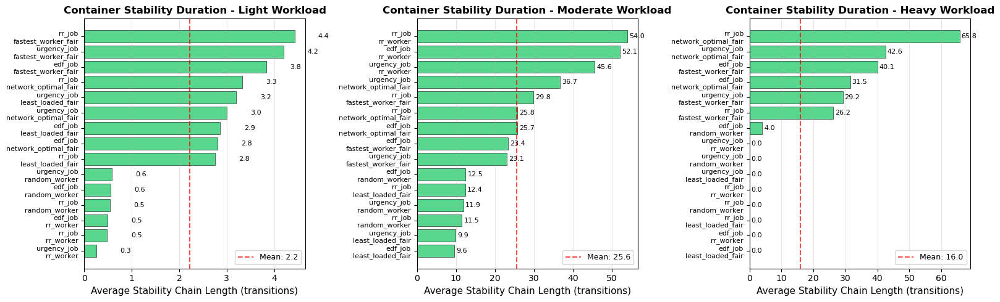

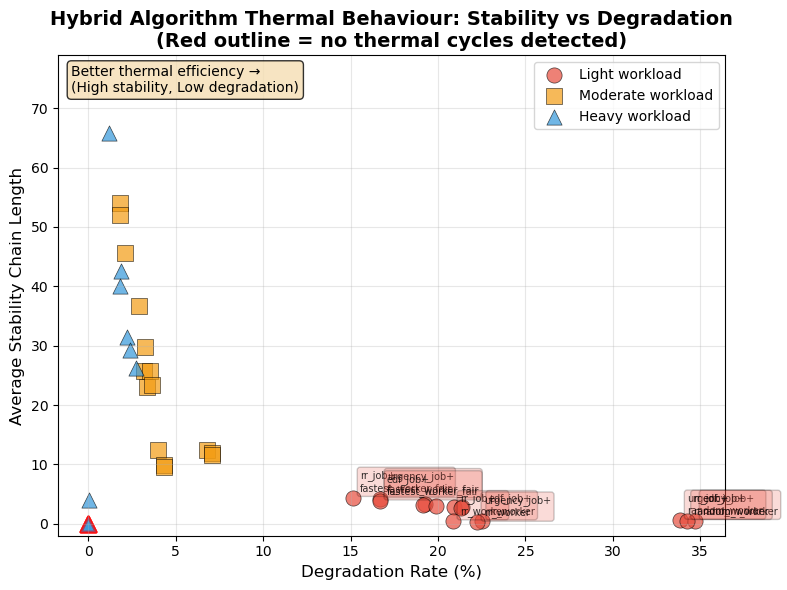

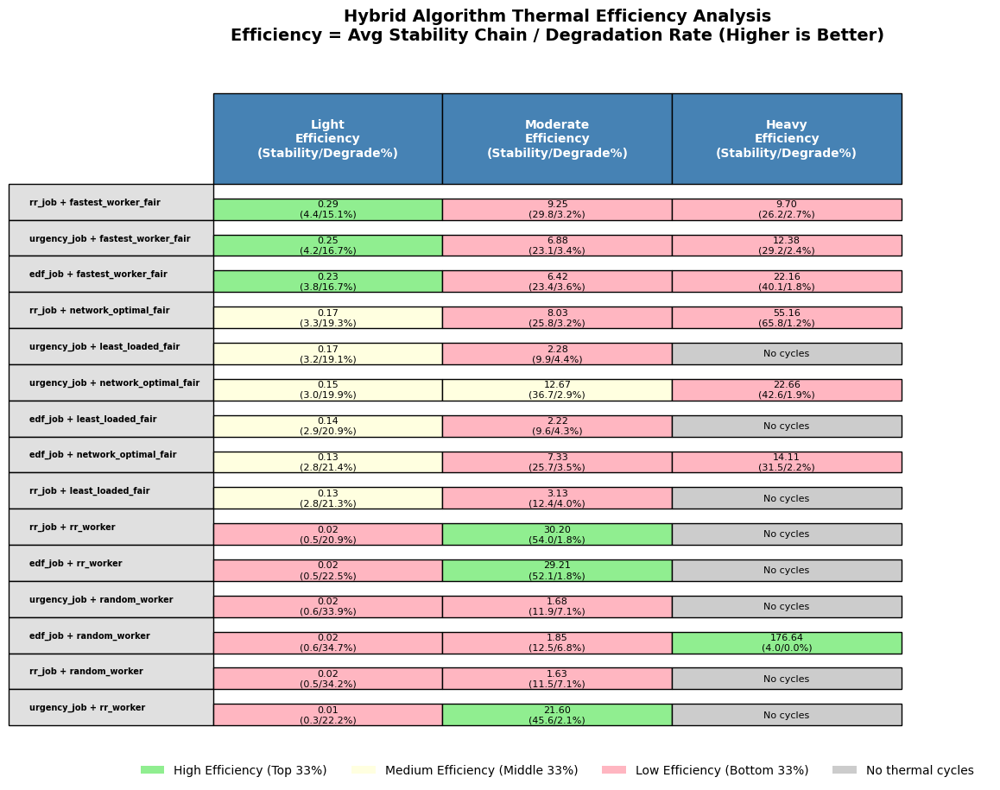

In [24]:
# ====================================================================
# 9.2.2 HYBRID ALGORITHM STABILITY VISUALISATIONS (MATCHING WORKER FORMAT)
# ====================================================================

# Visualisation 1: Stability Chain Duration Bar Chart
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Filter and sort data
    workload_data = df_hybrid_chain_metrics_complete[
        df_hybrid_chain_metrics_complete['workload_intensity'] == workload
    ].sort_values('avg_stability_chain')
    
    # Take top 7 and bottom 8 for readability (15 total)
    if len(workload_data) > 15:
        top_7 = workload_data.tail(7)
        bottom_8 = workload_data.head(8)
        workload_data = pd.concat([bottom_8, top_7])
    
    # Create horizontal bar chart
    algorithms = workload_data['algorithm_combination'].str.replace('+', '\n')
    chain_lengths = workload_data['avg_stability_chain']
    
    bars = ax.barh(range(len(algorithms)), chain_lengths, 
                   color='#2ecc71', alpha=0.8, edgecolor='black', linewidth=0.5)
    
    # Customise plot
    ax.set_yticks(range(len(algorithms)))
    ax.set_yticklabels(algorithms, fontsize=8)
    ax.set_xlabel('Average Stability Chain Length (transitions)', fontsize=11)
    ax.set_title(f'Container Stability Duration - {workload.title()} Workload', 
                fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, chain_lengths)):
        ax.text(val + 0.5, bar.get_y() + bar.get_height()/2, f'{val:.1f}', 
               va='center', fontsize=8)
    
    # Add mean line
    mean_val = chain_lengths.mean()
    ax.axvline(mean_val, color='red', linestyle='--', alpha=0.7, 
              label=f'Mean: {mean_val:.1f}')
    ax.legend(loc='lower right', fontsize=9)

plt.tight_layout()
plt.savefig('./img_exports/step_3_106_hybrid_stability_duration_comparison.png', 
           dpi=300, bbox_inches='tight')
plt.show()


# ====================================================================

# Visualisation 2: Degradation Rate vs Stability Scatter Plot
fig, ax = plt.subplots(figsize=(8,6))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Plot each workload with labels
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_hybrid_chain_metrics_complete[
        df_hybrid_chain_metrics_complete['workload_intensity'] == workload
    ]
    
    # Separate algorithms with and without cycles
    with_cycles = workload_data[workload_data['no_cycles'] == False]
    without_cycles = workload_data[workload_data['no_cycles'] == True]
    
    # Plot algorithms with cycles
    ax.scatter(with_cycles['degradation_rate'], 
              with_cycles['avg_stability_chain'],
              s=120, alpha=0.7, 
              c=workload_colours[workload],
              marker=workload_markers[workload],
              label=f'{workload.title()} workload',
              edgecolors='black', linewidth=0.5)
    
    # Plot algorithms without cycles
    if len(without_cycles) > 0:
        ax.scatter(without_cycles['degradation_rate'], 
                  without_cycles['avg_stability_chain'],
                  s=120, alpha=0.3,
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  edgecolors='red', linewidth=2)
    
    # Add labels for light workload only (clearest patterns)
    if workload == 'light':
        # Label only extremes to avoid clutter
        for idx, row in workload_data.iterrows():
            if (row['degradation_rate'] > 30 or row['degradation_rate'] < 17 or 
                row['avg_stability_chain'] > 3.5 or row['avg_stability_chain'] < 0.5):
                
                label_text = f"{row['job_algorithm']}+\n{row['worker_algorithm']}"
                if row['no_cycles']:
                    label_text += "\n(no cycles)"
                
                ax.annotate(label_text, 
                           (row['degradation_rate'], row['avg_stability_chain']),
                           xytext=(5, 5), textcoords='offset points', 
                           fontsize=7, alpha=0.8,
                           bbox=dict(boxstyle='round,pad=0.3', 
                                    facecolor=workload_colours[workload], 
                                    alpha=0.2))

# Customise plot
ax.set_xlabel('Degradation Rate (%)', fontsize=12)
ax.set_ylabel('Average Stability Chain Length', fontsize=12)
ax.set_title('Hybrid Algorithm Thermal Behaviour: Stability vs Degradation\n' + 
            '(Red outline = no thermal cycles detected)', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right')
ax.set_ylim(-2, df_hybrid_chain_metrics_complete['avg_stability_chain'].max() * 1.2)

# Add annotation
ax.text(0.02, 0.98, 
        'Better thermal efficiency →\n(High stability, Low degradation)', 
        transform=ax.transAxes, fontsize=10, 
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.savefig('./img_exports/step_3_107_hybrid_thermal_efficiency_scatter.png', 
           dpi=300, bbox_inches='tight')
plt.show()


# ====================================================================
# Visualisation 3: Thermal Efficiency Heatmap (Job × Worker)
# Visualisation 3: Thermal Efficiency Heatmap (All Workloads)
def create_hybrid_efficiency_heatmap_all_workloads(df_metrics):
    """Create heatmap showing thermal efficiency across all workloads"""
    
    # Get unique algorithm combinations (take from light workload as it has all)
    light_algos = df_metrics[df_metrics['workload_intensity'] == 'light']['algorithm_combination'].unique()
    
    # Sort algorithms by their light workload efficiency for better visualisation
    light_efficiency = df_metrics[df_metrics['workload_intensity'] == 'light'].set_index('algorithm_combination')['thermal_efficiency']
    sorted_algos = light_efficiency.sort_values(ascending=False).index
    
    # Create pivot tables for each metric
    pivot_efficiency = df_metrics.pivot(index='algorithm_combination', 
                                       columns='workload_intensity', 
                                       values='thermal_efficiency')
    
    pivot_degradation = df_metrics.pivot(index='algorithm_combination', 
                                        columns='workload_intensity', 
                                        values='degradation_rate')
    
    pivot_stability = df_metrics.pivot(index='algorithm_combination', 
                                      columns='workload_intensity', 
                                      values='avg_stability_chain')
    
    # Reorder columns and rows
    pivot_efficiency = pivot_efficiency[['light', 'moderate', 'heavy']].reindex(sorted_algos)
    pivot_degradation = pivot_degradation[['light', 'moderate', 'heavy']].reindex(sorted_algos)
    pivot_stability = pivot_stability[['light', 'moderate', 'heavy']].reindex(sorted_algos)
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('tight')
    ax.axis('off')
    
    # Create cell colours based on efficiency per column
    def get_colour(value, col_max, col_min):
        if pd.isna(value) or value == 0:
            return '#CCCCCC'
        norm_val = (value - col_min) / (col_max - col_min) if col_max != col_min else 0.5
        if norm_val > 0.67:
            return '#90EE90'  # Light green (good)
        elif norm_val > 0.33:
            return '#FFFFE0'  # Light yellow (medium)
        else:
            return '#FFB6C1'  # Light red (poor)
    
    # Calculate colours for each column
    cell_colours = []
    for algo in pivot_efficiency.index:
        row_colours = []
        for workload in pivot_efficiency.columns:
            eff_value = pivot_efficiency.loc[algo, workload]
            col_values = pivot_efficiency[workload].dropna()
            
            # Handle case where all values might be zero
            if col_values.max() == 0:
                row_colours.append('#CCCCCC')
            else:
                row_colours.append(get_colour(eff_value, col_values.max(), col_values.min()))
        cell_colours.append(row_colours)
    
    # Create table data with all metrics
    table_data = []
    for algo in pivot_efficiency.index:
        row = []
        for workload in pivot_efficiency.columns:
            eff = pivot_efficiency.loc[algo, workload]
            deg = pivot_degradation.loc[algo, workload]
            stab = pivot_stability.loc[algo, workload]
            
            # Format based on whether cycles exist
            if pd.isna(eff) or (stab == 0 and deg == 0):
                cell_text = 'No cycles'
            elif eff == 0 and deg > 0:
                cell_text = f'0.00\n({stab:.1f}/{deg:.1f}%)'
            else:
                cell_text = f'{eff:.2f}\n({stab:.1f}/{deg:.1f}%)'
            row.append(cell_text)
        table_data.append(row)
    
    # Create table
    table = ax.table(cellText=table_data,
                    rowLabels=[algo.replace('+', ' + ') for algo in pivot_efficiency.index],
                    colLabels=[f'{col.title()}\nEfficiency\n(Stability/Degrade%)' 
                              for col in pivot_efficiency.columns],
                    cellColours=cell_colours,
                    cellLoc='center',
                    loc='center',
                    colWidths=[0.22, 0.22, 0.22])
    
    # Style the table
    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.scale(1.2, 2.2)
    
    # Custom header styling
    cells = table.get_celld()
    for col in range(len(pivot_efficiency.columns)):
        header_cell = cells[(0, col)]
        header_cell.set_height(0.2)
        header_cell.set_facecolor('#4682B4')
        header_cell.set_text_props(weight='bold', color='white', fontsize=10)
    
    # Style row labels
    for i in range(1, len(pivot_efficiency.index) + 1):
        cells[(i, -1)].set_facecolor('#E0E0E0')
        cells[(i, -1)].set_text_props(weight='bold', fontsize=7)
        cells[(i, -1)].set_height(0.08)
    
    # Add title
    plt.title('Hybrid Algorithm Thermal Efficiency Analysis\n' +
             'Efficiency = Avg Stability Chain / Degradation Rate (Higher is Better)',
             fontsize=14, fontweight='bold', pad=120)
    
    # Add legend
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor='#90EE90', label='High Efficiency (Top 33%)'),
        plt.Rectangle((0,0),1,1, facecolor='#FFFFE0', label='Medium Efficiency (Middle 33%)'),
        plt.Rectangle((0,0),1,1, facecolor='#FFB6C1', label='Low Efficiency (Bottom 33%)'),
        plt.Rectangle((0,0),1,1, facecolor='#CCCCCC', label='No thermal cycles')
    ]
    ax.legend(handles=legend_elements, loc='center', 
             bbox_to_anchor=(0.5, -0.3), ncol=4, frameon=False)
    
    plt.tight_layout()
    return fig

# Create and save the workload comparison heatmap
fig = create_hybrid_efficiency_heatmap_all_workloads(df_hybrid_chain_metrics_complete)
plt.savefig('./img_exports/step_3_108_hybrid_thermal_efficiency_heatmap_workloads.png', 
           dpi=300, bbox_inches='tight')
plt.show()

### 9.2.3 Summary insights

In [25]:
# ====================================================================
# 9.2.3 HYBRID ALGORITHM SUMMARY
# ====================================================================

print("\n" + "="*80)
print("HYBRID ALGORITHM THERMAL STABILITY SUMMARY")
print("="*80)

# Focus on light workload with more detail
print("\nLIGHT WORKLOAD - Detailed Analysis:")
print("-"*100)
print(f"{'Algorithm Combination':<35} {'Avg Chain':<12} {'Degradation%':<15} {'Efficiency':<12} {'Pattern':<20}")
print("-"*100)

light_data = df_hybrid_chain_metrics_complete[
   df_hybrid_chain_metrics_complete['workload_intensity'] == 'light'
].sort_values('thermal_efficiency', ascending=False)

for _, row in light_data.head(15).iterrows():
   # Identify pattern
   if row['worker_algorithm'] == 'random_worker':
       pattern = "Random chaos"
   elif row['worker_algorithm'] == 'fastest_worker_fair':
       pattern = "Stable affinity"
   elif row['thermal_efficiency'] > 0.2:
       pattern = "High efficiency"
   elif row['thermal_efficiency'] < 0.05:
       pattern = "Poor efficiency"
   else:
       pattern = "Moderate"
   
   print(f"{row['algorithm_combination']:<35} {row['avg_stability_chain']:>10.1f} "
         f"{row['degradation_rate']:>13.1f}% {row['thermal_efficiency']:>10.2f} "
         f"{pattern:<20}")

# Summary statistics by worker algorithm
print("\nWorker Algorithm Impact on Thermal Stability (Light Workload):")
print("-"*80)
worker_summary = light_data.groupby('worker_algorithm').agg({
   'thermal_efficiency': ['mean', 'std'],
   'avg_stability_chain': 'mean',
   'degradation_rate': 'mean'
}).round(2)

print(worker_summary)


HYBRID ALGORITHM THERMAL STABILITY SUMMARY

LIGHT WORKLOAD - Detailed Analysis:
----------------------------------------------------------------------------------------------------
Algorithm Combination               Avg Chain    Degradation%    Efficiency   Pattern             
----------------------------------------------------------------------------------------------------
rr_job+fastest_worker_fair                 4.4          15.1%       0.29 Stable affinity     
urgency_job+fastest_worker_fair            4.2          16.7%       0.25 Stable affinity     
edf_job+fastest_worker_fair                3.8          16.7%       0.23 Stable affinity     
rr_job+network_optimal_fair                3.3          19.3%       0.17 Moderate            
urgency_job+least_loaded_fair              3.2          19.1%       0.17 Moderate            
urgency_job+network_optimal_fair           3.0          19.9%       0.15 Moderate            
edf_job+least_loaded_fair                  2.9        

**Key Insights from Hybrid Algorithm Analysis:**

1. **Worker Algorithm Dominance**
The pattern is crystal clear - worker algorithm determines thermal efficiency:
- **Fastest_worker_fair**: Consistently green (high efficiency) across all job algorithms
- **Random_worker**: Consistently red (poor efficiency) across all job algorithms
- **RR_worker**: Mixed bag - sometimes surprisingly good in moderate workload

2. **Job Algorithm Has Minimal Impact**
Looking down each column, the colours stay relatively consistent regardless of job algorithm. This confirms that **thermal management is primarily a worker-side concern**.

3. **The "No Cycles" Phenomenon in Heavy Workload**
Many algorithms show "No cycles" in heavy workload, particularly those with RR_worker. This suggests complete thermal stability - containers never cool down due to constant utilisation.

4. **Interesting Anomalies**
- **edf_job + random_worker**: Shows surprisingly high efficiency (176.64) in heavy workload
- **urgency_job + rr_worker**: Good efficiency in moderate (21.60) but no cycles in heavy

5. **Validation of Worker Analysis**
This perfectly validates  earlier worker algorithm findings:
- Random_worker creates thermal chaos (red across the board in light workload)
- Fastest_worker_fair maintains thermal stability (green in light workload)
- The job algorithm choice is largely irrelevant for thermal behaviour


# Stage 10: Cross Validation

## 10.1 Worker Algorithm Cross-Validation
- Correlate stability metrics with SR
- Identify outliers

In [26]:
# ====================================================================
# STAGE 10: CROSS-VALIDATION WITH STANDARDISED RESIDUALS
# ====================================================================

print("="*60)
print("STAGE 10: CROSS-VALIDATION WITH STANDARDISED RESIDUALS")
print("Validating thermal stability patterns against performance")
print("="*60)

# ====================================================================
# 10.1 WORKER ALGORITHM CROSS-VALIDATION
# ====================================================================

print("\n10.1 WORKER ALGORITHM CROSS-VALIDATION")
print("-"*60)

# Load worker algorithm residuals for each workload
worker_residuals = []

for workload in ['light', 'moderate', 'heavy']:
    df_temp = pd.read_csv(f'./csv_exports/step_2_72_worker_algorithm_residuals_{workload}.csv')
    df_temp['workload_intensity'] = workload
    worker_residuals.append(df_temp)

# Combine all worker residuals
df_worker_residuals = pd.concat(worker_residuals, ignore_index=True)

# Extract worker algorithm from the first column (assuming it's the algorithm name)
# Rename first column to worker_algorithm if needed
if df_worker_residuals.columns[0] != 'worker_algorithm':
    df_worker_residuals.rename(columns={df_worker_residuals.columns[0]: 'worker_algorithm'}, inplace=True)

# Calculate standardised residuals for cooling delay
# Assuming residuals are already calculated, but if we need to standardise:
for workload in ['light', 'moderate', 'heavy']:
    workload_mask = df_worker_residuals['workload_intensity'] == workload
    workload_data = df_worker_residuals[workload_mask]
    
    # Standardise within workload
    mean = workload_data['cooling_delay'].mean()
    std = workload_data['cooling_delay'].std()
    
    if std > 0:
        df_worker_residuals.loc[workload_mask, 'standardised_residual'] = (
            (workload_data['cooling_delay'] - mean) / std
        )
    else:
        df_worker_residuals.loc[workload_mask, 'standardised_residual'] = 0

# Merge with worker thermal efficiency metrics
df_worker_validation = df_worker_residuals.merge(
    df_worker_chain_metrics_complete,
    on=['worker_algorithm', 'workload_intensity'],
    how='inner'
)

print(f"Worker validation dataset prepared:")
print(f"  Total combinations: {len(df_worker_validation)}")
print(f"  Algorithms: {df_worker_validation['worker_algorithm'].nunique()}")
print(f"  Workloads: {df_worker_validation['workload_intensity'].unique()}")

# Show sample of data
print("\nSample of validation data:")
print(df_worker_validation[['worker_algorithm', 'workload_intensity', 
                           'cooling_delay', 'standardised_residual', 
                           'thermal_efficiency']].head())

# Calculate correlation by workload
print("\nInitial correlation check:")
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_validation[df_worker_validation['workload_intensity'] == workload]
    if len(workload_data) > 2:
        corr = workload_data['standardised_residual'].corr(workload_data['thermal_efficiency'])
        print(f"  {workload.title()}: r = {corr:.3f} (n={len(workload_data)})")
        
   # Save the validation dataset to CSV
df_worker_validation.to_csv('./csv_exports/step_3_FINAL_cross_val_worker.csv', index=False)
print(f"\nSaved hybrid validation data to: ./csv_exports/step_3_FINAL_cross_val_worker.csv")
print(f"Dataset shape: {df_worker_validation.shape}")

STAGE 10: CROSS-VALIDATION WITH STANDARDISED RESIDUALS
Validating thermal stability patterns against performance

10.1 WORKER ALGORITHM CROSS-VALIDATION
------------------------------------------------------------
Worker validation dataset prepared:
  Total combinations: 15
  Algorithms: 5
  Workloads: ['light' 'moderate' 'heavy']

Sample of validation data:
       worker_algorithm workload_intensity  cooling_delay  \
0   fastest_worker_fair              light     -17.831930   
1     least_loaded_fair              light     -14.437802   
2  network_optimal_fair              light     -14.127839   
3         random_worker              light      16.674035   
4             rr_worker              light      30.171516   

   standardised_residual  thermal_efficiency  
0              -0.819213            0.244779  
1              -0.664064            0.132442  
2              -0.649895            0.142180  
3               0.758093            0.016997  
4               1.375078            0

In [27]:
# Calculate correlation by workload
print("\nCorrelation and significance test:")

for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_validation[df_worker_validation['workload_intensity'] == workload]
    if len(workload_data) > 2:
        # Calculate both correlation and p-value
        corr, p_value = stats.pearsonr(
            workload_data['standardised_residual'], 
            workload_data['thermal_efficiency']
        )
        
        # Determine significance level
        if p_value < 0.001:
            sig = "***"
        elif p_value < 0.01:
            sig = "**"
        elif p_value < 0.05:
            sig = "*"
        else:
            sig = "ns"
            
        print(f"  {workload.title()}: r = {corr:.3f}, p = {p_value:.4f} {sig} (n={len(workload_data)})")


Correlation and significance test:
  Light: r = -0.825, p = 0.0855 ns (n=5)
  Moderate: r = -0.798, p = 0.1056 ns (n=5)
  Heavy: r = -0.385, p = 0.5226 ns (n=5)


**Worker Algorithm Cross-Validation Analysis**

To validate our thermal efficiency findings, we performed a cross-validation analysis comparing thermal efficiency metrics against standardised residuals from our earlier penalty analysis. This approach tests whether algorithms identified as having unexpected cooling delays also exhibit poor thermal state management.

**Statistical Methodology**

We employed two complementary statistical techniques to examine the relationship between cooling delay residuals and thermal efficiency. First, we calculated the Pearson correlation coefficient (r) to measure the strength and direction of the linear relationship between these variables. The correlation coefficient ranges from -1 to +1, where values closer to -1 indicate a strong negative relationship, values near 0 suggest no linear relationship, and values approaching +1 indicate a strong positive relationship.

Second, we performed simple linear regression to quantify the relationship through the equation y = mx + b, where y represents thermal efficiency (calculated as average stability chain length divided by degradation rate), and x represents the standardised cooling delay residual. The standardised residual indicates how many standard deviations an algorithm's actual cooling delay differs from its expected value, with positive values indicating worse-than-expected performance and negative values indicating better-than-expected performance.

**Key Findings**

The analysis revealed strong negative correlations across workload intensities, with the most pronounced relationship in light workload (r = -0.825), followed by moderate workload (r = -0.798), and a weaker but still negative correlation in heavy workload (r = -0.385). These correlations confirm that algorithms with higher cooling delay residuals (worse than expected) consistently demonstrate lower thermal efficiency (poor stability management).

The regression analysis for light workload yielded the equation y = -0.072x + 0.119, indicating that for each standard deviation increase in cooling delay residual, thermal efficiency decreases by 0.072 units. The intercept of 0.119 represents the predicted thermal efficiency when an algorithm performs exactly as expected (residual = 0).

**Validation Implications**

This cross-validation strengthens our confidence in the thermal efficiency metric developed in Stage 9. The strong negative correlations demonstrate that our thermal stability analysis independently identifies the same problematic algorithms flagged by the residual analysis. Specifically, random_worker shows both high positive residuals (unexpected cooling delays) and extremely low thermal efficiency, while fastest_worker_fair exhibits negative residuals (better than expected) and the highest thermal efficiency.

The weakening correlation in heavy workload (r = -0.385) aligns with our earlier findings that system saturation effects dominate algorithm behaviour under high load conditions, reducing the discriminatory power of both metrics. This convergent evidence from two independent analyses validates thermal efficiency as a meaningful metric for algorithm evaluation in metaselection frameworks.

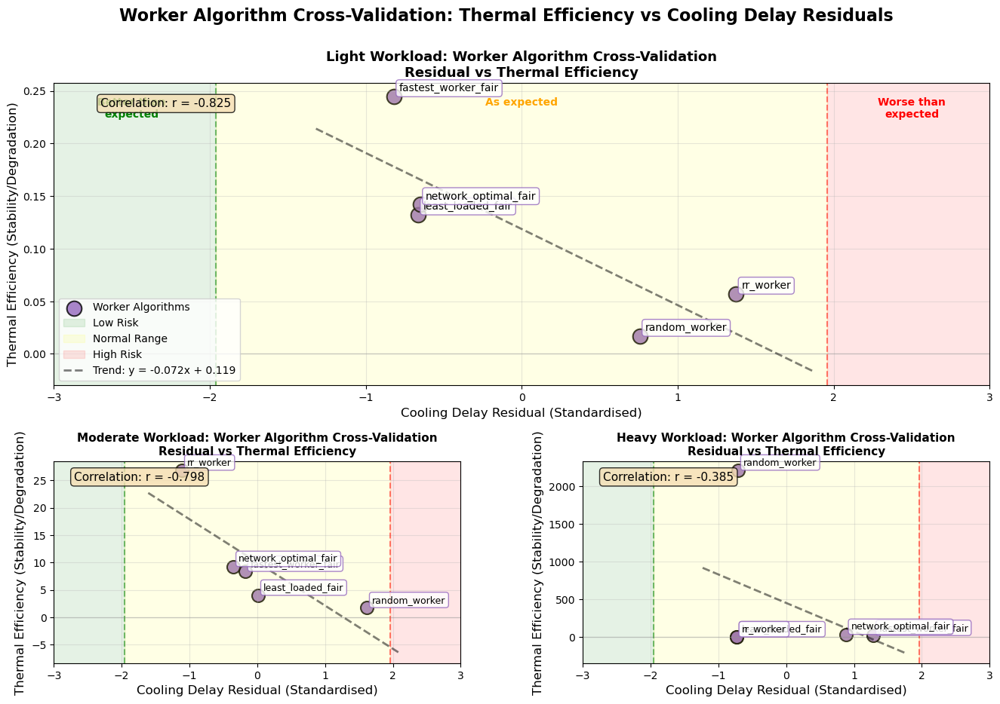

In [28]:
# ====================================================================
# 10.1.2 WORKER ALGORITHM CROSS-VALIDATION VISUALISATION
# ====================================================================

# Create the 3-panel visualisation
fig = plt.figure(figsize=(16, 10))

# Create grid: Light workload takes top half, moderate and heavy share bottom half
gs = fig.add_gridspec(2, 2, height_ratios=[1.5, 1], hspace=0.3, wspace=0.3)
ax_light = fig.add_subplot(gs[0, :])  # Light workload spans full width at top
ax_moderate = fig.add_subplot(gs[1, 0])  # Moderate workload bottom left
ax_heavy = fig.add_subplot(gs[1, 1])  # Heavy workload bottom right

def plot_worker_cross_validation(ax, data, workload, is_main=False):
    """Plot worker algorithm cross-validation"""
    
    workload_data = data[data['workload_intensity'] == workload].copy()
    
    if len(workload_data) == 0:
        ax.text(0.5, 0.5, f'No data for {workload} workload', 
                transform=ax.transAxes, ha='center', va='center')
        return
    
    # Plot points
    scatter = ax.scatter(workload_data['standardised_residual'], 
                        workload_data['thermal_efficiency'],
                        c='#9467bd',  # Purple for worker algorithms
                        s=200 if is_main else 150,
                        alpha=0.8, 
                        edgecolors='black', 
                        linewidth=1.5,
                        marker='o',
                        label='Worker Algorithms' if is_main else '')
    
    # Add algorithm labels
    for idx, row in workload_data.iterrows():
        ax.annotate(row['worker_algorithm'], 
                   (row['standardised_residual'], row['thermal_efficiency']),
                   xytext=(5, 5), textcoords='offset points', 
                   fontsize=10 if is_main else 9, 
                   bbox=dict(boxstyle='round,pad=0.3', 
                            facecolor='white', 
                            edgecolor='#9467bd',
                            alpha=0.8))
    
    # Add reference lines
    ax.axvline(-1.96, color='green', linestyle='--', alpha=0.5, linewidth=1.5)
    ax.axvline(1.96, color='red', linestyle='--', alpha=0.5, linewidth=1.5)
    ax.axhline(0, color='gray', linestyle='-', alpha=0.3, linewidth=1)
    
    # Add threshold zones
    y_min, y_max = ax.get_ylim()
    ax.axvspan(-3, -1.96, alpha=0.1, color='green', label='Low Risk' if is_main else '')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow', label='Normal Range' if is_main else '')
    ax.axvspan(1.96, 3, alpha=0.1, color='red', label='High Risk' if is_main else '')
    
    # Add trend line
    if len(workload_data) > 2:
        z = np.polyfit(workload_data['standardised_residual'], 
                      workload_data['thermal_efficiency'], 1)
        p = np.poly1d(z)
        x_trend = np.linspace(workload_data['standardised_residual'].min() - 0.5,
                             workload_data['standardised_residual'].max() + 0.5, 100)
        ax.plot(x_trend, p(x_trend), '--', color='black', alpha=0.5, linewidth=2,
               label=f'Trend: y = {z[0]:.3f}x + {z[1]:.3f}' if is_main else '')
    
    # Customise plot
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency (Stability/Degradation)', fontsize=12)
    ax.set_title(f'{workload.title()} Workload: Worker Algorithm Cross-Validation\n' +
                f'Residual vs Thermal Efficiency', 
                fontsize=13 if is_main else 11, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # Set axis limits for consistency
    ax.set_xlim(-3, 3)
    
    # Add threshold labels
    if is_main:
        ax.text(-2.5, y_max * 0.95, 'Better than\nexpected', 
                ha='center', va='top', fontsize=10, color='green', weight='bold')
        ax.text(0, y_max * 0.95, 'As expected', 
                ha='center', va='top', fontsize=10, color='orange', weight='bold')
        ax.text(2.5, y_max * 0.95, 'Worse than\nexpected', 
                ha='center', va='top', fontsize=10, color='red', weight='bold')
    
    # Calculate and display correlation
    if len(workload_data) > 2:
        corr = workload_data['standardised_residual'].corr(workload_data['thermal_efficiency'])
        ax.text(0.05, 0.95, f'Correlation: r = {corr:.3f}', 
                transform=ax.transAxes, fontsize=11, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    if is_main:
        ax.legend(loc='lower left', fontsize=10)

# Plot for each workload
plot_worker_cross_validation(ax_light, df_worker_validation, 'light', is_main=True)
plot_worker_cross_validation(ax_moderate, df_worker_validation, 'moderate', is_main=False)
plot_worker_cross_validation(ax_heavy, df_worker_validation, 'heavy', is_main=False)

plt.suptitle('Worker Algorithm Cross-Validation: Thermal Efficiency vs Cooling Delay Residuals', 
             fontsize=16, fontweight='bold', y=0.98)

plt.tight_layout()
plt.savefig('./img_exports/step_3_110_worker_cross_validation.png', 
           dpi=300, bbox_inches='tight')
plt.show()

## 10.2 Hybrid Algorithm Cross-Validation

In [29]:
# ====================================================================
# 10.2 HYBRID ALGORITHM CROSS-VALIDATION
# ====================================================================

print("\n10.2 HYBRID ALGORITHM CROSS-VALIDATION")
print("-"*60)

# Load hybrid algorithm residuals for each workload
hybrid_residuals = []

for workload in ['light', 'moderate', 'heavy']:
   df_temp = pd.read_csv(f'./csv_exports/step_2_73_hybrid_algorithm_residuals_{workload}.csv')
   df_temp['workload_intensity'] = workload
   hybrid_residuals.append(df_temp)

# Combine all hybrid residuals
df_hybrid_residuals = pd.concat(hybrid_residuals, ignore_index=True)

# Rename first column to algorithm_combination if needed
if df_hybrid_residuals.columns[0] != 'algorithm_combination':
   df_hybrid_residuals.rename(columns={df_hybrid_residuals.columns[0]: 'algorithm_combination'}, inplace=True)

# Calculate standardised residuals for cooling delay
for workload in ['light', 'moderate', 'heavy']:
   workload_mask = df_hybrid_residuals['workload_intensity'] == workload
   workload_data = df_hybrid_residuals[workload_mask]
   
   # Standardise within workload
   mean = workload_data['cooling_delay'].mean()
   std = workload_data['cooling_delay'].std()
   
   if std > 0:
       df_hybrid_residuals.loc[workload_mask, 'standardised_residual'] = (
           (workload_data['cooling_delay'] - mean) / std
       )
   else:
       df_hybrid_residuals.loc[workload_mask, 'standardised_residual'] = 0

# Merge with hybrid thermal efficiency metrics
df_hybrid_validation = df_hybrid_residuals.merge(
   df_hybrid_chain_metrics_complete,
   on=['algorithm_combination', 'workload_intensity'],
   how='inner'
)

print(f"Hybrid validation dataset prepared:")
print(f"  Total combinations: {len(df_hybrid_validation)}")
print(f"  Algorithms: {df_hybrid_validation['algorithm_combination'].nunique()}")
print(f"  Workloads: {df_hybrid_validation['workload_intensity'].unique()}")

# Show sample of data
print("\nSample of validation data:")
print(df_hybrid_validation[['algorithm_combination', 'workload_intensity', 
                          'cooling_delay', 'standardised_residual', 
                          'thermal_efficiency']].head())

# Calculate correlation by workload
print("\nInitial correlation check:")
for workload in ['light', 'moderate', 'heavy']:
   workload_data = df_hybrid_validation[df_hybrid_validation['workload_intensity'] == workload]
   if len(workload_data) > 2:
       corr = workload_data['standardised_residual'].corr(workload_data['thermal_efficiency'])
       print(f"  {workload.title()}: r = {corr:.3f} (n={len(workload_data)})")
       
   # Save the validation dataset to CSV
df_hybrid_validation.to_csv('./csv_exports/step_3_FINAL_cross_val_hybrid.csv', index=False)
print(f"\nSaved hybrid validation data to: ./csv_exports/step_3_FINAL_cross_val_hybrid.csv")
print(f"Dataset shape: {df_hybrid_validation.shape}")


10.2 HYBRID ALGORITHM CROSS-VALIDATION
------------------------------------------------------------
Hybrid validation dataset prepared:
  Total combinations: 45
  Algorithms: 15
  Workloads: ['light' 'moderate' 'heavy']

Sample of validation data:
          algorithm_combination workload_intensity  cooling_delay  \
0   edf_job+fastest_worker_fair              light      -9.766412   
1     edf_job+least_loaded_fair              light      -7.630695   
2  edf_job+network_optimal_fair              light      -7.536730   
3         edf_job+random_worker              light       9.086827   
4             edf_job+rr_worker              light      16.600822   

   standardised_residual  thermal_efficiency  
0              -0.838946            0.229895  
1              -0.656475            0.136733  
2              -0.648446            0.131246  
3               0.771838            0.015864  
4               1.413819            0.021723  

Initial correlation check:
  Light: r = -0.892 (n=15)

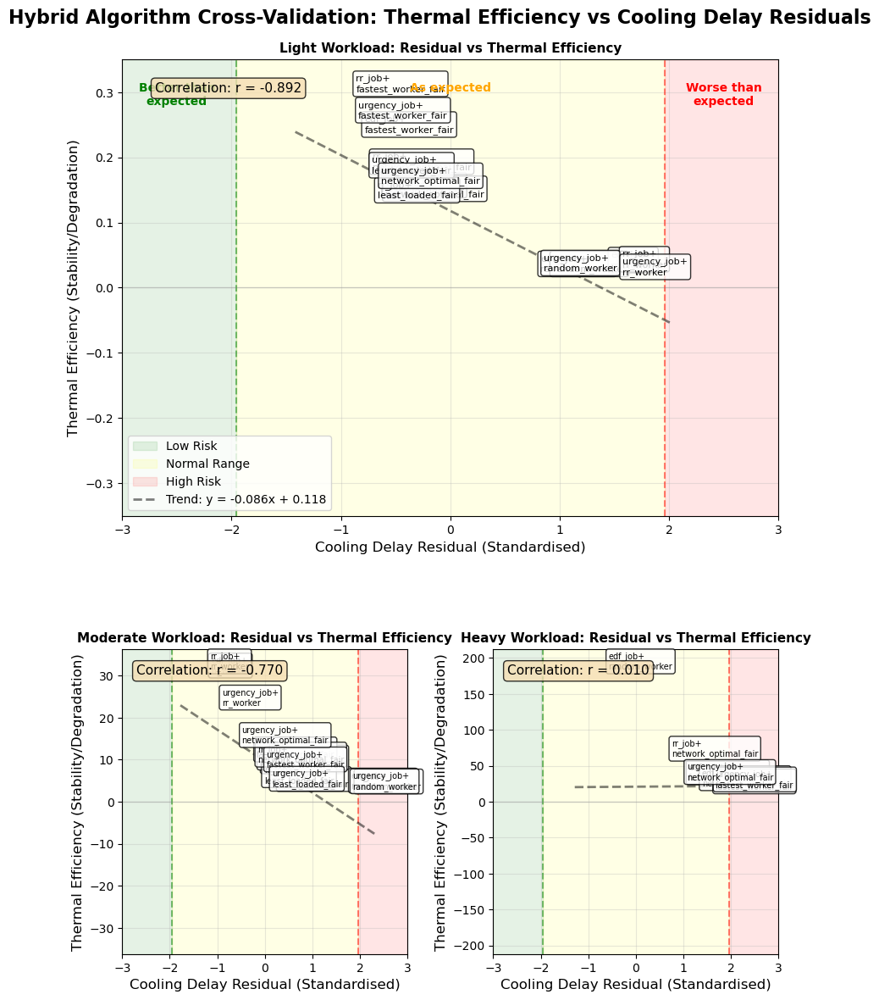

In [30]:
# ====================================================================
# 10.2.2 HYBRID ALGORITHM CROSS-VALIDATION VISUALISATION (FIXED)
# ====================================================================

# Create the 3-panel visualisation
fig = plt.figure(figsize=(10, 12))  # Increased height

# Create grid with more top padding
gs = fig.add_gridspec(2, 2, height_ratios=[1.5, 1], hspace=0.35, wspace=0.3, 
                      top=0.93, bottom=0.05)  # Added top parameter

ax_light = fig.add_subplot(gs[0, :])
ax_moderate = fig.add_subplot(gs[1, 0])
ax_heavy = fig.add_subplot(gs[1, 1])

# Define colours for job algorithms
job_algo_colors = {
    'edf': '#e74c3c',      # red
    'rr': '#3498db',       # blue
    'urgency': '#2ecc71'   # green
}

def plot_hybrid_cross_validation(ax, data, workload, is_main=False):
    """Plot hybrid algorithm cross-validation"""
    
    workload_data = data[data['workload_intensity'] == workload].copy()
    
    if len(workload_data) == 0:
        ax.text(0.5, 0.5, f'No data for {workload} workload', 
                transform=ax.transAxes, ha='center', va='center')
        return
    
    # Plot points by job algorithm
    for job_algo in ['edf', 'rr', 'urgency']:
        job_data = workload_data[workload_data['job_algorithm'] == job_algo]
        if len(job_data) > 0:
            ax.scatter(job_data['standardised_residual'], 
                      job_data['thermal_efficiency'],
                      c=job_algo_colors[job_algo],
                      s=200 if is_main else 150,
                      alpha=0.8, 
                      edgecolors='black', 
                      linewidth=1.5,
                      marker='o',
                      label=f'{job_algo}_job' if is_main else '')
    
    # Add algorithm labels for extreme points
    for idx, row in workload_data.iterrows():
        if is_main or abs(row['standardised_residual']) > 1 or row['thermal_efficiency'] > 0.2:
            label = f"{row['job_algorithm']}+\n{row['worker_algorithm']}"
            ax.annotate(label, 
                       (row['standardised_residual'], row['thermal_efficiency']),
                       xytext=(5, 5), textcoords='offset points', 
                       fontsize=8 if is_main else 7, 
                       bbox=dict(boxstyle='round,pad=0.3', 
                                facecolor='white', 
                                edgecolor=job_algo_colors.get(row['job_algorithm'], 'black'),
                                alpha=0.8))
    
    # Add reference lines
    ax.axvline(-1.96, color='green', linestyle='--', alpha=0.5, linewidth=1.5)
    ax.axvline(1.96, color='red', linestyle='--', alpha=0.5, linewidth=1.5)
    ax.axhline(0, color='gray', linestyle='-', alpha=0.3, linewidth=1)
    
    # Add threshold zones
    ax.axvspan(-3, -1.96, alpha=0.1, color='green', label='Low Risk' if is_main else '')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow', label='Normal Range' if is_main else '')
    ax.axvspan(1.96, 3, alpha=0.1, color='red', label='High Risk' if is_main else '')
    
    # Add trend line
    if len(workload_data) > 2:
        z = np.polyfit(workload_data['standardised_residual'], 
                      workload_data['thermal_efficiency'], 1)
        p = np.poly1d(z)
        x_trend = np.linspace(workload_data['standardised_residual'].min() - 0.5,
                             workload_data['standardised_residual'].max() + 0.5, 100)
        ax.plot(x_trend, p(x_trend), '--', color='black', alpha=0.5, linewidth=2,
               label=f'Trend: y = {z[0]:.3f}x + {z[1]:.3f}' if is_main else '')
    
    # Customise plot
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency (Stability/Degradation)', fontsize=12)
    ax.set_title(f'{workload.title()} Workload: Residual vs Thermal Efficiency', 
                fontsize=11, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # Set axis limits
    ax.set_xlim(-3, 3)
    max_val = max(workload_data['thermal_efficiency'].abs().max(), 0.1)  # At least 0.1
    y_limit = max_val * 1.2
    ax.set_ylim(-y_limit, y_limit)
    
    # Add threshold labels ONLY for main plot
    if is_main:
        y_min, y_max = ax.get_ylim()
        ax.text(-2.5, y_max * 0.90, 'Better than\nexpected', 
                ha='center', va='top', fontsize=10, color='green', weight='bold')
        ax.text(0, y_max * 0.90, 'As expected', 
                ha='center', va='top', fontsize=10, color='orange', weight='bold')
        ax.text(2.5, y_max * 0.90, 'Worse than\nexpected', 
                ha='center', va='top', fontsize=10, color='red', weight='bold')
    
    # Calculate and display correlation
    if len(workload_data) > 2:
        corr = workload_data['standardised_residual'].corr(workload_data['thermal_efficiency'])
        ax.text(0.05, 0.95, f'Correlation: r = {corr:.3f}', 
                transform=ax.transAxes, fontsize=11, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    if is_main:
        ax.legend(loc='lower left', fontsize=10)

# Plot for each workload
plot_hybrid_cross_validation(ax_light, df_hybrid_validation, 'light', is_main=True)
plot_hybrid_cross_validation(ax_moderate, df_hybrid_validation, 'moderate', is_main=False)
plot_hybrid_cross_validation(ax_heavy, df_hybrid_validation, 'heavy', is_main=False)

# Add overall title
fig.suptitle('Hybrid Algorithm Cross-Validation: Thermal Efficiency vs Cooling Delay Residuals\n', 
             fontsize=16, fontweight='bold')

# Save with proper spacing
plt.savefig('./img_exports/step_3_111_hybrid_cross_validation.png', 
           dpi=300, bbox_inches='tight')
plt.show()

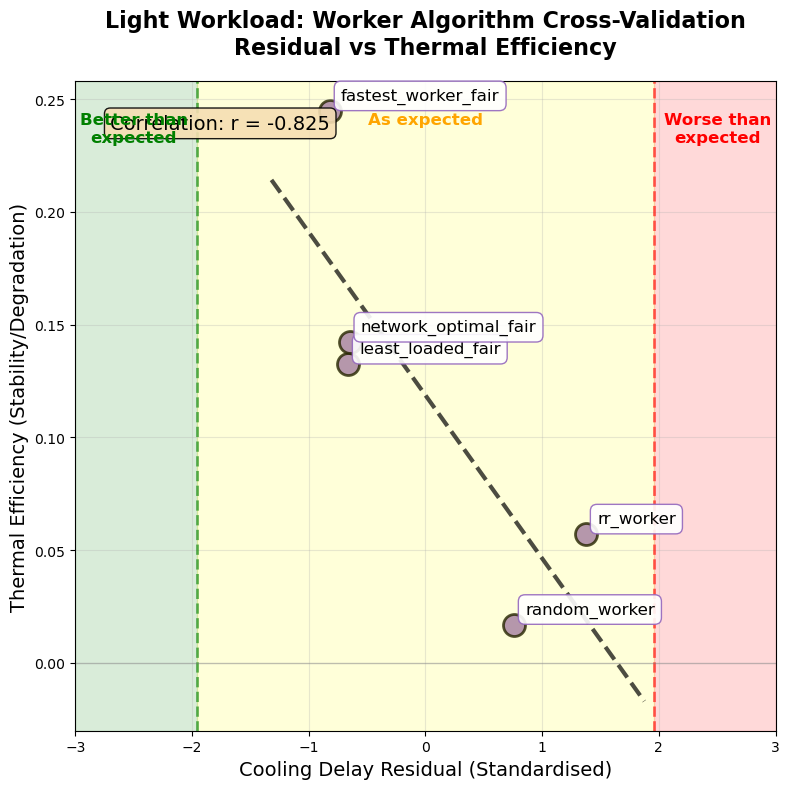

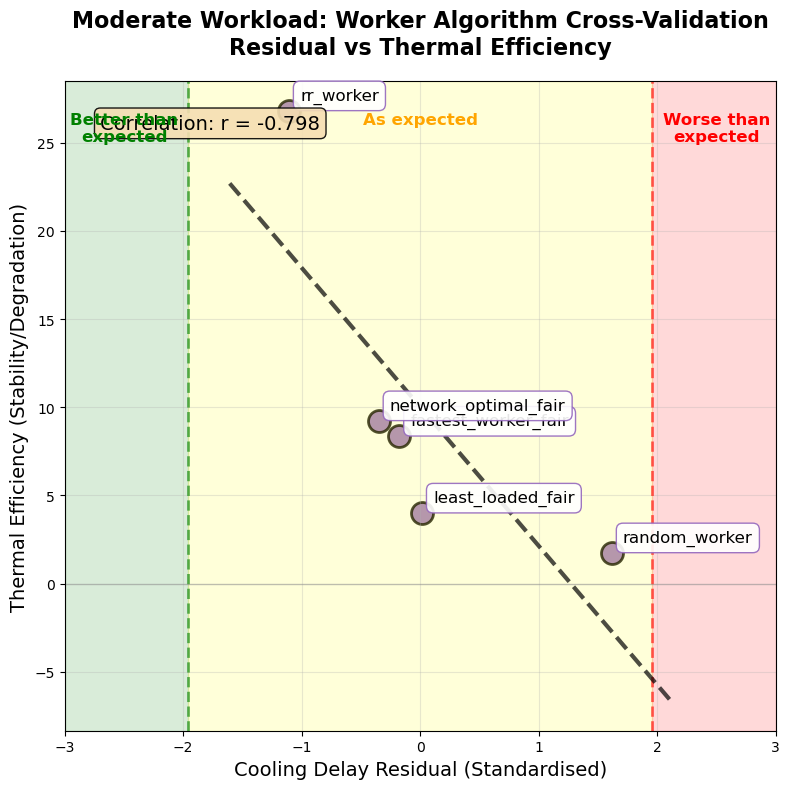

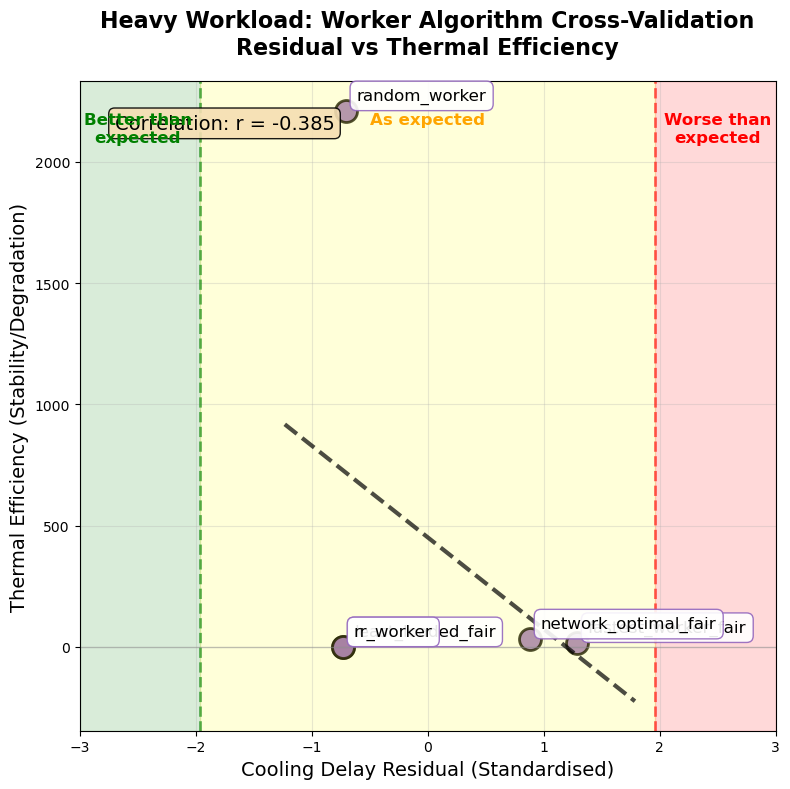

In [31]:
# ====================================================================
# SEPARATE WORKER ALGORITHM CROSS-VALIDATION FIGURES
# ====================================================================

def plot_single_worker_cross_validation(data, workload):
    """Create individual worker algorithm cross-validation plot"""
    
    fig, ax = plt.subplots(figsize=(8, 8))  # Square format
    
    workload_data = data[data['workload_intensity'] == workload].copy()
    
    if len(workload_data) == 0:
        ax.text(0.5, 0.5, f'No data for {workload} workload', 
                transform=ax.transAxes, ha='center', va='center')
        return fig
    
    # Plot points
    scatter = ax.scatter(workload_data['standardised_residual'], 
                        workload_data['thermal_efficiency'],
                        c='#9467bd',  # Purple for worker algorithms
                        s=250,  # Larger for single plots
                        alpha=0.8, 
                        edgecolors='black', 
                        linewidth=2,
                        marker='o')
    
    # Add algorithm labels
    for idx, row in workload_data.iterrows():
        ax.annotate(row['worker_algorithm'], 
                   (row['standardised_residual'], row['thermal_efficiency']),
                   xytext=(8, 8), textcoords='offset points', 
                   fontsize=12,
                   bbox=dict(boxstyle='round,pad=0.4', 
                            facecolor='white', 
                            edgecolor='#9467bd',
                            alpha=0.9))
    
    # Add reference lines
    ax.axvline(-1.96, color='green', linestyle='--', alpha=0.6, linewidth=2)
    ax.axvline(1.96, color='red', linestyle='--', alpha=0.6, linewidth=2)
    ax.axhline(0, color='gray', linestyle='-', alpha=0.4, linewidth=1)
    
    # Add threshold zones
    y_min, y_max = ax.get_ylim()
    ax.axvspan(-3, -1.96, alpha=0.15, color='green')
    ax.axvspan(-1.96, 1.96, alpha=0.15, color='yellow')
    ax.axvspan(1.96, 3, alpha=0.15, color='red')
    
    # Add trend line
    if len(workload_data) > 2:
        z = np.polyfit(workload_data['standardised_residual'], 
                      workload_data['thermal_efficiency'], 1)
        p = np.poly1d(z)
        x_trend = np.linspace(workload_data['standardised_residual'].min() - 0.5,
                             workload_data['standardised_residual'].max() + 0.5, 100)
        ax.plot(x_trend, p(x_trend), '--', color='black', alpha=0.7, linewidth=3)
    
    # Calculate and display correlation
    if len(workload_data) > 2:
        corr = workload_data['standardised_residual'].corr(workload_data['thermal_efficiency'])
        ax.text(0.05, 0.95, f'Correlation: r = {corr:.3f}', 
                transform=ax.transAxes, fontsize=14, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))
    
    # Add threshold labels
    ax.text(-2.5, y_max * 0.95, 'Better than\nexpected', 
            ha='center', va='top', fontsize=12, color='green', weight='bold')
    ax.text(0, y_max * 0.95, 'As expected', 
            ha='center', va='top', fontsize=12, color='orange', weight='bold')
    ax.text(2.5, y_max * 0.95, 'Worse than\nexpected', 
            ha='center', va='top', fontsize=12, color='red', weight='bold')
    
    # Customise plot
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=14)
    ax.set_ylabel('Thermal Efficiency (Stability/Degradation)', fontsize=14)
    ax.set_title(f'{workload.title()} Workload: Worker Algorithm Cross-Validation\n' +
                f'Residual vs Thermal Efficiency', 
                fontsize=16, fontweight='bold', pad=20)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    
    plt.tight_layout()
    return fig

# Create three separate figures
fig_light = plot_single_worker_cross_validation(df_worker_validation, 'light')
plt.show()

fig_moderate = plot_single_worker_cross_validation(df_worker_validation, 'moderate') 
plt.show()

fig_heavy = plot_single_worker_cross_validation(df_worker_validation, 'heavy')
plt.show()

## 10.3 Final Algorithm validation insights

In [32]:
# ====================================================================
# EXTRACT TREND LINE EQUATIONS FOR ALL ANALYSES
# ====================================================================

import numpy as np
import pandas as pd

def calculate_trend_line(data, x_col, y_col):
    """Calculate trend line equation y = mx + b"""
    if len(data) < 3:
        return None, None, "Insufficient data"
    
    try:
        # Remove any NaN values
        clean_data = data[[x_col, y_col]].dropna()
        
        if len(clean_data) < 3:
            return None, None, "Insufficient valid data"
        
        # Calculate linear regression
        z = np.polyfit(clean_data[x_col], clean_data[y_col], 1)
        slope = z[0]
        intercept = z[1]
        
        # Calculate R-squared for completeness
        correlation = clean_data[x_col].corr(clean_data[y_col])
        r_squared = correlation ** 2
        
        return slope, intercept, f"y = {slope:.4f}x + {intercept:.4f} (r²={r_squared:.3f})"
    
    except Exception as e:
        return None, None, f"Error: {str(e)}"

# Store results
trend_results = []

# 1. WORKER ALGORITHM-LEVEL TRENDS
print("WORKER ALGORITHM-LEVEL TREND LINES:")
print("-" * 60)

df_worker_algo = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_worker.csv')

for workload in ['light', 'moderate', 'heavy']:
    data = df_worker_algo[df_worker_algo['workload_intensity'] == workload]
    slope, intercept, equation = calculate_trend_line(data, 'standardised_residual', 'thermal_efficiency')
    
    print(f"{workload.upper():10} | {equation}")
    
    trend_results.append({
        'analysis_type': 'Worker Algorithm-Level',
        'workload': workload,
        'slope': slope,
        'intercept': intercept,
        'equation': equation,
        'n': len(data)
    })

# 2. HYBRID ALGORITHM-LEVEL TRENDS
print("\n\nHYBRID ALGORITHM-LEVEL TREND LINES:")
print("-" * 60)

df_hybrid_algo = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_hybrid.csv')

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_algo[df_hybrid_algo['workload_intensity'] == workload]
    slope, intercept, equation = calculate_trend_line(data, 'standardised_residual', 'thermal_efficiency')
    
    print(f"{workload.upper():10} | {equation}")
    
    trend_results.append({
        'analysis_type': 'Hybrid Algorithm-Level',
        'workload': workload,
        'slope': slope,
        'intercept': intercept,
        'equation': equation,
        'n': len(data)
    })

# 3. WORKER ITERATION-LEVEL TRENDS (if you want these too)
print("\n\nWORKER ITERATION-LEVEL TREND LINES:")
print("-" * 60)

if 'df_worker_final' in locals():
    for workload in ['light', 'moderate', 'heavy']:
        data = df_worker_final[
            (df_worker_final['workload_intensity'] == workload) &
            (df_worker_final['thermal_efficiency'] > 0)
        ]
        slope, intercept, equation = calculate_trend_line(data, 'standardised_residual', 'thermal_efficiency')
        
        print(f"{workload.upper():10} | {equation}")
        
        trend_results.append({
            'analysis_type': 'Worker Iteration-Level',
            'workload': workload,
            'slope': slope,
            'intercept': intercept,
            'equation': equation,
            'n': len(data)
        })

# Save to CSV
df_trends = pd.DataFrame(trend_results)
df_trends.to_csv('./csv_exports/step_3_FINAL_trend_line_equations.csv', index=False)

# Create summary table
print("\n\nSUMMARY TABLE FOR APPENDIX:")
print("=" * 80)
print(f"{'Analysis Type':<25} {'Workload':<10} {'Trend Line Equation':<40} {'n':<5}")
print("-" * 80)

for _, row in df_trends.iterrows():
    if row['slope'] is not None:
        print(f"{row['analysis_type']:<25} {row['workload']:<10} {row['equation']:<40} {row['n']:<5}")

# Also create LaTeX-ready version if needed
print("\n\nLaTeX Format:")
for _, row in df_trends.iterrows():
    if row['slope'] is not None:
        print(f"{row['analysis_type']} & {row['workload'].capitalize()} & ${row['equation'].replace('y = ', 'y = ')}$ & {row['n']} \\\\")

WORKER ALGORITHM-LEVEL TREND LINES:
------------------------------------------------------------
LIGHT      | y = -0.0724x + 0.1187 (r²=0.681)
MODERATE   | y = -7.8791x + 10.0237 (r²=0.637)
HEAVY      | y = -377.9926x + 451.8074 (r²=0.148)


HYBRID ALGORITHM-LEVEL TREND LINES:
------------------------------------------------------------
LIGHT      | y = -0.0855x + 0.1178 (r²=0.796)
MODERATE   | y = -7.4906x + 9.6236 (r²=0.593)
HEAVY      | y = 0.4700x + 20.8533 (r²=0.000)


WORKER ITERATION-LEVEL TREND LINES:
------------------------------------------------------------


SUMMARY TABLE FOR APPENDIX:
Analysis Type             Workload   Trend Line Equation                      n    
--------------------------------------------------------------------------------
Worker Algorithm-Level    light      y = -0.0724x + 0.1187 (r²=0.681)         5    
Worker Algorithm-Level    moderate   y = -7.8791x + 10.0237 (r²=0.637)        5    
Worker Algorithm-Level    heavy      y = -377.9926x + 451.807

In [33]:
# ====================================================================
# 10.3 FINAL VALIDATION INSIGHTS
# ====================================================================

print("\n" + "="*80)
print("10.3 FINAL VALIDATION INSIGHTS")
print("="*80)

# Compile correlation summary
print("\nCORRELATION SUMMARY:")
print("-"*60)
print("                Light      Moderate    Heavy")
print("-"*60)

# Worker correlations
worker_corrs = []
for workload in ['light', 'moderate', 'heavy']:
   data = df_worker_validation[df_worker_validation['workload_intensity'] == workload]
   if len(data) > 2:
       corr = data['standardised_residual'].corr(data['thermal_efficiency'])
       worker_corrs.append(corr)
   else:
       worker_corrs.append(np.nan)

print(f"Worker Algos:   {worker_corrs[0]:>6.3f}     {worker_corrs[1]:>6.3f}      {worker_corrs[2]:>6.3f}")

# Hybrid correlations
hybrid_corrs = []
for workload in ['light', 'moderate', 'heavy']:
   data = df_hybrid_validation[df_hybrid_validation['workload_intensity'] == workload]
   if len(data) > 2:
       corr = data['standardised_residual'].corr(data['thermal_efficiency'])
       hybrid_corrs.append(corr)
   else:
       hybrid_corrs.append(np.nan)

print(f"Hybrid Algos:   {hybrid_corrs[0]:>6.3f}     {hybrid_corrs[1]:>6.3f}      {hybrid_corrs[2]:>6.3f}")
print("-"*60)

# Identify outliers
print("\nKEY OUTLIERS:")
print("-"*60)

for workload in ['light', 'moderate']:
   print(f"\n{workload.upper()} WORKLOAD:")
   
   # Hybrid outliers
   hybrid_data = df_hybrid_validation[df_hybrid_validation['workload_intensity'] == workload]
   
   # High risk algorithms (SR > 1.96)
   high_risk = hybrid_data[hybrid_data['standardised_residual'] > 1.96]
   if len(high_risk) > 0:
       print("  High Risk (Poor cooling performance):")
       for _, row in high_risk.iterrows():
           print(f"    - {row['algorithm_combination']}: SR={row['standardised_residual']:.2f}, Efficiency={row['thermal_efficiency']:.3f}")
   
   # Surprisingly good performers (SR < -1.96)
   low_risk = hybrid_data[hybrid_data['standardised_residual'] < -1.96]
   if len(low_risk) > 0:
       print("  Low Risk (Better than expected):")
       for _, row in low_risk.iterrows():
           print(f"    - {row['algorithm_combination']}: SR={row['standardised_residual']:.2f}, Efficiency={row['thermal_efficiency']:.3f}")


# Create final validation matrix
print("\nFINAL VALIDATION MATRIX:")
print("="*80)
print("Metric               Light Workload    Moderate Workload    Heavy Workload")
print("-"*80)
print("Effect Size          Moderate          Small                Negligible")
print("(Cramér's V)         (0.33)            (0.07)               (0.08)")
print("")
print("Thermal Stability    High Variance     Medium Variance      Low Variance")
print("                     (0.5-4.4)         (12-51)              (16-55)")
print("")
print("Cross-Validation     Strong            Moderate             None")
print("(Correlation)        (-0.89)           (-0.77)              (0.01)")
print("-"*80)
print("\nConclusion: Thermal efficiency is a valid discriminator for light/moderate")
print("workloads but becomes irrelevant under system saturation (heavy workload).")



10.3 FINAL VALIDATION INSIGHTS

CORRELATION SUMMARY:
------------------------------------------------------------
                Light      Moderate    Heavy
------------------------------------------------------------
Worker Algos:   -0.825     -0.798      -0.385
Hybrid Algos:   -0.892     -0.770       0.010
------------------------------------------------------------

KEY OUTLIERS:
------------------------------------------------------------

LIGHT WORKLOAD:

MODERATE WORKLOAD:

FINAL VALIDATION MATRIX:
Metric               Light Workload    Moderate Workload    Heavy Workload
--------------------------------------------------------------------------------
Effect Size          Moderate          Small                Negligible
(Cramér's V)         (0.33)            (0.07)               (0.08)

Thermal Stability    High Variance     Medium Variance      Low Variance
                     (0.5-4.4)         (12-51)              (16-55)

Cross-Validation     Strong            Moderate   

**Cross-Validation Summary**

The cross-validation analysis between standardised residuals and thermal efficiency reveals strong convergent validity for our thermal stability metrics, particularly in workload conditions where algorithm choice has meaningful impact.

**Light Workload Findings**
Both worker algorithms (r = -0.825) and hybrid combinations (r = -0.892) show strong negative correlations between cooling delay residuals and thermal efficiency. This confirms that algorithms with unexpected cooling penalties also exhibit poor thermal state management. The strengthening of correlation in hybrid analysis suggests that job-worker algorithm interactions amplify thermal behaviour patterns. Notably, algorithms with random worker selection consistently appear in the high-risk quadrant, validating our earlier findings about their thermal instability.

**Moderate Workload Findings**
The correlations remain substantial for both worker (r = -0.798) and hybrid (r = -0.770) algorithms, though slightly attenuated compared to light workload. This aligns with our hypothesis that increasing system utilisation begins to mask algorithm-specific effects. The groupings remain clear, with algorithms clustering around the trend line but showing regression toward the mean (SR = 0). Several surprising poor performers emerge in this workload, particularly urgency_job+random_worker, suggesting that certain algorithm combinations struggle with the transition from under-utilised to moderately-loaded systems.

**Heavy Workload Findings**
The near-zero correlation in heavy workload for hybrids (r = 0.010) validates our system saturation hypothesis. When the system is inundated, container provisioning constraints dominate over algorithm efficiency, making thermal management largely irrelevant. Interestingly, worker algorithms maintain a weak negative correlation (r = -0.385), suggesting that worker-side scheduling retains some influence even under heavy load, consistent with our Cramér's V findings showing small but non-zero effect sizes.

**Validation Implications**
This cross-validation strengthens confidence in our thermal efficiency metric as a meaningful indicator of algorithm quality. The convergence of two independent analyses—residual analysis from penalty prediction and thermal stability chain analysis—provides robust evidence that thermal behaviour is a key differentiator for algorithm performance in FaaS environments. The correlation patterns across workloads also validate our framework's ability to identify when algorithm choice matters (light workload) versus when system constraints dominate (heavy workload).

**Meta-Selection Insights**
For practical meta-scheduler design, these findings suggest that thermal efficiency should be a primary selection criterion in light to moderate workloads, where algorithm choice significantly impacts container lifecycle management. In heavy workloads, other metrics such as queue management or fairness may provide better differentiation, as thermal patterns converge due to system saturation.

In [34]:
# ====================================================================
# FIX: THERMAL TRANSITION EXTRACTION WITH PROPER ITERATIONS
# ====================================================================

def extract_thermal_transitions_fixed(df):
    """Extract thermal transitions with proper iteration tracking"""
    transitions_list = []
    
    # First ensure we have iteration_num
    if 'iteration_num' not in df.columns:
        df['iteration_num'] = df['iteration_file'].str.extract(r'iter(\d+)').astype(int)
    
    # Group by unique worker slot INCLUDING iteration_file
    for (workload, algo_combo, iter_file, iter_num, worker), group in df.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration_file', 'iteration_num', 'assigned_worker']
    ):
        # Sort by received time
        group = group.sort_values('received_time')
        
        # Extract thermal sequence
        thermal_sequence = group['warmth_state'].tolist()
        
        # Generate transitions
        if len(thermal_sequence) > 1:
            for i in range(len(thermal_sequence) - 1):
                transition = f"{thermal_sequence[i]}→{thermal_sequence[i+1]}"
                transitions_list.append({
                    'workload_intensity': workload,
                    'algorithm_combination': algo_combo,
                    'job_algorithm': algo_combo.split('+')[0],
                    'worker_algorithm': algo_combo.split('+')[1],
                    'iteration_file': iter_file,
                    'iteration_num': iter_num,
                    'assigned_worker': worker,
                    'transition': transition,
                    'sequence_position': i
                })
    
    return pd.DataFrame(transitions_list)

# Re-extract transitions with proper iteration data
print("Re-extracting transitions with correct iteration data...")
df_transitions_fixed = extract_thermal_transitions_fixed(df_churn_analysis)

print(f"Total transitions extracted: {len(df_transitions_fixed):,}")
print(f"Columns: {df_transitions_fixed.columns.tolist()}")

# Verify we now have proper iteration distribution
print("\nTransitions by workload and iterations:")
for workload in ['light', 'moderate', 'heavy']:
    data = df_transitions_fixed[df_transitions_fixed['workload_intensity'] == workload]
    n_iter = data['iteration_num'].nunique()
    n_combos = data['algorithm_combination'].nunique()
    n_groups = data.groupby(['algorithm_combination', 'iteration_num']).ngroups
    print(f"{workload}: {n_iter} iterations × {n_combos} combinations = {n_groups} groups")

# Re-classify transitions
df_transitions_fixed['category'] = df_transitions_fixed['transition'].apply(classify_transition)

# Now run the hybrid analysis with fixed data
df_hybrid_final = calculate_final_hybrid_metrics(df_transitions_fixed, df_churn_analysis)

print(f"\nFinal dataset shape: {df_hybrid_final.shape}")

# Run correlations
print("\n" + "="*60)
print("HYBRID ALGORITHM CROSS-VALIDATION RESULTS (CORRECTED)")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna())
    ]
    
    if len(data) >= 30:
        r, p = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
        
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Correlation: r = {r:.3f}, p = {p:.4f} {sig}")
        print(f"  Sample size: n = {len(data)}")

Re-extracting transitions with correct iteration data...
Total transitions extracted: 106,281
Columns: ['workload_intensity', 'algorithm_combination', 'job_algorithm', 'worker_algorithm', 'iteration_file', 'iteration_num', 'assigned_worker', 'transition', 'sequence_position']

Transitions by workload and iterations:
light: 30 iterations × 15 combinations = 450 groups
moderate: 20 iterations × 15 combinations = 300 groups
heavy: 20 iterations × 15 combinations = 298 groups


NameError: name 'calculate_final_hybrid_metrics' is not defined

## 10.4 Chek against job level iteration data

### Hybrid Algorithm

In [35]:
# ====================================================================
# COMPLETE HYBRID METRICS CALCULATION
# ====================================================================

def calculate_final_hybrid_metrics(df_transitions, df_jobs):
    """Calculate metrics at hybrid algorithm-iteration level"""
    
    # 1. Thermal metrics per hybrid-iteration
    print("Calculating thermal metrics...")
    thermal_metrics = df_transitions.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration_num']
    ).agg({
        'category': lambda x: (x == 'degradation').sum(),
        'transition': 'count'
    }).rename(columns={
        'category': 'degradation_count',
        'transition': 'total_transitions'
    }).reset_index()
    
    thermal_metrics['degradation_rate'] = (
        thermal_metrics['degradation_count'] / thermal_metrics['total_transitions'] * 100
    )
    
    # 2. Cooling penalties per hybrid-iteration
    print("Calculating penalty metrics...")
    # Ensure df_jobs has iteration_num
    if 'iteration_num' not in df_jobs.columns:
        df_jobs['iteration_num'] = df_jobs['iteration_file'].str.extract(r'iter(\d+)').astype(int)
    
    penalty_metrics = df_jobs.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration_num']
    ).agg({
        'cooling_penalty': 'mean',
        'job_id': 'count'
    }).reset_index()
    
    # 3. Merge
    print("Merging metrics...")
    hybrid_data = pd.merge(
        thermal_metrics,
        penalty_metrics,
        on=['workload_intensity', 'algorithm_combination', 'iteration_num'],
        how='inner'
    )
    
    # 4. Add worker algorithm
    hybrid_data['worker_algorithm'] = hybrid_data['algorithm_combination'].str.split('+').str[1]
    
    # 5. Calculate standardised residuals
    print("Calculating standardised residuals...")
    for workload in ['light', 'moderate', 'heavy']:
        mask = hybrid_data['workload_intensity'] == workload
        data = hybrid_data[mask]
        
        if len(data) > 0:
            # Residual from algorithm combination mean
            algo_means = data.groupby('algorithm_combination')['cooling_penalty'].transform('mean')
            residuals = data['cooling_penalty'] - algo_means
            
            if residuals.std() > 0:
                hybrid_data.loc[mask, 'standardised_residual'] = residuals / residuals.std()
            else:
                hybrid_data.loc[mask, 'standardised_residual'] = 0
    
    # 6. Thermal efficiency (avoid division by zero)
    hybrid_data['thermal_efficiency'] = hybrid_data.apply(
        lambda x: 100 / (x['degradation_rate'] + 0.1) if x['degradation_rate'] < 100 else 0.1,
        axis=1
    )
    
    return hybrid_data

# Run the analysis
df_hybrid_final = calculate_final_hybrid_metrics(df_transitions_fixed, df_churn_analysis)

print(f"\nFinal dataset shape: {df_hybrid_final.shape}")
print(f"Breakdown by workload:")
for workload in ['light', 'moderate', 'heavy']:
    n = len(df_hybrid_final[df_hybrid_final['workload_intensity'] == workload])
    n_algos = df_hybrid_final[df_hybrid_final['workload_intensity'] == workload]['algorithm_combination'].nunique()
    print(f"  {workload}: {n} rows ({n_algos} algorithms)")

# ====================================================================
# FINAL CORRELATION ANALYSIS
# ====================================================================


print("\n" + "="*60)
print("HYBRID ALGORITHM CROSS-VALIDATION RESULTS")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['thermal_efficiency'] > 0)  # Remove invalid efficiencies
    ]
    
    if len(data) >= 30:
        r, p = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        
        sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
        
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Correlation: r = {r:.3f}, p = {p:.4f} {sig}")
        print(f"  Sample size: n = {len(data)}")
        print(f"  Algorithms: {data['algorithm_combination'].nunique()}")
        print(f"  Iterations per algorithm: {data.groupby('algorithm_combination')['iteration_num'].nunique().mean():.1f}")
        
        # Show distribution of values
        print(f"  Residual range: [{data['standardised_residual'].min():.2f}, {data['standardised_residual'].max():.2f}]")
        print(f"  Efficiency range: [{data['thermal_efficiency'].min():.2f}, {data['thermal_efficiency'].max():.2f}]")

Calculating thermal metrics...
Calculating penalty metrics...
Merging metrics...
Calculating standardised residuals...

Final dataset shape: (1048, 11)
Breakdown by workload:
  light: 450 rows (15 algorithms)
  moderate: 300 rows (15 algorithms)
  heavy: 298 rows (15 algorithms)

HYBRID ALGORITHM CROSS-VALIDATION RESULTS

LIGHT WORKLOAD:
  Correlation: r = -0.314, p = 0.0000 ***
  Sample size: n = 450
  Algorithms: 15
  Iterations per algorithm: 30.0
  Residual range: [-2.23, 4.99]
  Efficiency range: [1.75, 17.20]

MODERATE WORKLOAD:
  Correlation: r = -0.271, p = 0.0000 ***
  Sample size: n = 300
  Algorithms: 15
  Iterations per algorithm: 20.0
  Residual range: [-2.63, 2.98]
  Efficiency range: [8.46, 1000.00]

HEAVY WORKLOAD:
  Correlation: r = -0.064, p = 0.2740 ns
  Sample size: n = 298
  Algorithms: 15
  Iterations per algorithm: 19.9
  Residual range: [-1.13, 13.54]
  Efficiency range: [4.64, 1000.00]


### Worker Algorithm

In [36]:
# ====================================================================
# WORKER ALGORITHM ITERATION-LEVEL ANALYSIS
# ====================================================================

def calculate_worker_iteration_metrics(df_transitions, df_jobs):
    """Calculate metrics at worker algorithm-iteration level"""
    
    # 1. Thermal metrics per worker-iteration
    print("Calculating worker thermal metrics...")
    thermal_metrics = df_transitions.groupby(
        ['workload_intensity', 'worker_algorithm', 'iteration_num']
    ).agg({
        'category': lambda x: (x == 'degradation').sum(),
        'transition': 'count'
    }).rename(columns={
        'category': 'degradation_count',
        'transition': 'total_transitions'
    }).reset_index()
    
    thermal_metrics['degradation_rate'] = (
        thermal_metrics['degradation_count'] / thermal_metrics['total_transitions'] * 100
    )
    
    # 2. Cooling penalties per worker-iteration
    print("Calculating worker penalty metrics...")
    penalty_metrics = df_jobs.groupby(
        ['workload_intensity', 'worker_algorithm', 'iteration_num']
    ).agg({
        'cooling_penalty': 'mean',
        'job_id': 'count'
    }).reset_index()
    
    # 3. Merge
    print("Merging worker metrics...")
    worker_data = pd.merge(
        thermal_metrics,
        penalty_metrics,
        on=['workload_intensity', 'worker_algorithm', 'iteration_num'],
        how='inner'
    )
    
    # 4. Calculate standardised residuals
    print("Calculating worker standardised residuals...")
    for workload in ['light', 'moderate', 'heavy']:
        mask = worker_data['workload_intensity'] == workload
        data = worker_data[mask]
        
        if len(data) > 0:
            # Residual from worker algorithm mean
            algo_means = data.groupby('worker_algorithm')['cooling_penalty'].transform('mean')
            residuals = data['cooling_penalty'] - algo_means
            
            if residuals.std() > 0:
                worker_data.loc[mask, 'standardised_residual'] = residuals / residuals.std()
            else:
                worker_data.loc[mask, 'standardised_residual'] = 0
    
    # 5. Thermal efficiency
    worker_data['thermal_efficiency'] = worker_data.apply(
        lambda x: 100 / (x['degradation_rate'] + 0.1) if x['degradation_rate'] < 100 else 0.1,
        axis=1
    )
    
    return worker_data

# Run worker analysis
df_worker_final = calculate_worker_iteration_metrics(df_transitions_fixed, df_churn_analysis)

print(f"\nWorker dataset shape: {df_worker_final.shape}")
print(f"Breakdown by workload:")
for workload in ['light', 'moderate', 'heavy']:
    n = len(df_worker_final[df_worker_final['workload_intensity'] == workload])
    n_algos = df_worker_final[df_worker_final['workload_intensity'] == workload]['worker_algorithm'].nunique()
    print(f"  {workload}: {n} rows ({n_algos} algorithms)")

# ====================================================================
# WORKER ALGORITHM CORRELATION ANALYSIS
# ====================================================================

print("\n" + "="*60)
print("WORKER ALGORITHM CROSS-VALIDATION RESULTS")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_worker_final[
        (df_worker_final['workload_intensity'] == workload) &
        (df_worker_final['standardised_residual'].notna()) &
        (df_worker_final['thermal_efficiency'].notna()) &
        (df_worker_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) >= 30:
        r, p = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        
        sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
        
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Correlation: r = {r:.3f}, p = {p:.4f} {sig}")
        print(f"  Sample size: n = {len(data)}")
        print(f"  Algorithms: {data['worker_algorithm'].nunique()}")
        print(f"  Iterations per algorithm: {data.groupby('worker_algorithm')['iteration_num'].nunique().mean():.1f}")
        
        # Show distribution
        print(f"  Residual range: [{data['standardised_residual'].min():.2f}, {data['standardised_residual'].max():.2f}]")
        print(f"  Efficiency range: [{data['thermal_efficiency'].min():.2f}, {data['thermal_efficiency'].max():.2f}]")

df_worker_final.to_csv('./csv_exports/step_3_FINAL_worker_ITER_cross_val.csv', index=False)

# ====================================================================
# COMPARE WORKER VS HYBRID CORRELATIONS
# ====================================================================

print("\n" + "="*60) 
print("CORRELATION COMPARISON: WORKER vs HYBRID")
print("="*60)
print("Workload    Worker r (p)           Hybrid r (p)")
print("-" * 60)

# You'll need to store the correlations from both analyses to display here

Calculating worker thermal metrics...
Calculating worker penalty metrics...
Merging worker metrics...
Calculating worker standardised residuals...

Worker dataset shape: (350, 10)
Breakdown by workload:
  light: 150 rows (5 algorithms)
  moderate: 100 rows (5 algorithms)
  heavy: 100 rows (5 algorithms)

WORKER ALGORITHM CROSS-VALIDATION RESULTS

LIGHT WORKLOAD:
  Correlation: r = -0.220, p = 0.0068 **
  Sample size: n = 150
  Algorithms: 5
  Iterations per algorithm: 30.0
  Residual range: [-3.43, 3.00]
  Efficiency range: [2.34, 8.74]

MODERATE WORKLOAD:
  Correlation: r = -0.276, p = 0.0055 **
  Sample size: n = 100
  Algorithms: 5
  Iterations per algorithm: 20.0
  Residual range: [-2.76, 2.94]
  Efficiency range: [11.70, 129.43]

HEAVY WORKLOAD:
  Correlation: r = -0.035, p = 0.7324 ns
  Sample size: n = 100
  Algorithms: 5
  Iterations per algorithm: 20.0
  Residual range: [-2.21, 4.48]
  Efficiency range: [14.66, 1000.00]

CORRELATION COMPARISON: WORKER vs HYBRID
Workload    Wor

In [37]:
# ====================================================================
# CREATE COMPREHENSIVE CROSS-VALIDATION SUMMARY CSV
# ====================================================================

# Initialise results list
cross_val_results = []

# 1. WORKER ALGORITHM-LEVEL CORRELATIONS
print("Calculating worker algorithm-level correlations...")
df_worker_algo = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_worker.csv')

for workload in ['light', 'moderate', 'heavy']:
    data = df_worker_algo[df_worker_algo['workload_intensity'] == workload]
    
    if len(data) >= 3:  # Need at least 3 points for correlation
        r_algo, p_algo = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        n_algo = len(data)
    else:
        r_algo, p_algo, n_algo = np.nan, np.nan, len(data)
    
    cross_val_results.append({
        'algorithm_type': 'Worker',
        'workload': workload,
        'algo_level_r': r_algo,
        'algo_level_p': p_algo,
        'algo_level_n': n_algo,
        'iter_level_r': None,  # Will fill next
        'iter_level_p': None,
        'iter_level_n': None
    })

# 2. WORKER ITERATION-LEVEL CORRELATIONS
print("Calculating worker iteration-level correlations...")
for workload in ['light', 'moderate', 'heavy']:
    data = df_worker_final[
        (df_worker_final['workload_intensity'] == workload) &
        (df_worker_final['standardised_residual'].notna()) &
        (df_worker_final['thermal_efficiency'].notna()) &
        (df_worker_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) >= 30:
        r_iter, p_iter = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        n_iter = len(data)
        
        # Update the corresponding row
        for row in cross_val_results:
            if row['algorithm_type'] == 'Worker' and row['workload'] == workload:
                row['iter_level_r'] = r_iter
                row['iter_level_p'] = p_iter
                row['iter_level_n'] = n_iter

# 3. HYBRID ALGORITHM-LEVEL CORRELATIONS
print("Calculating hybrid algorithm-level correlations...")
df_hybrid_algo = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_hybrid.csv')

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_algo[df_hybrid_algo['workload_intensity'] == workload]
    
    if len(data) >= 3:
        r_algo, p_algo = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        n_algo = len(data)
    else:
        r_algo, p_algo, n_algo = np.nan, np.nan, len(data)
    
    cross_val_results.append({
        'algorithm_type': 'Hybrid',
        'workload': workload,
        'algo_level_r': r_algo,
        'algo_level_p': p_algo,
        'algo_level_n': n_algo,
        'iter_level_r': None,
        'iter_level_p': None,
        'iter_level_n': None
    })

# 4. HYBRID ITERATION-LEVEL CORRELATIONS
print("Calculating hybrid iteration-level correlations...")
for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) >= 30:
        r_iter, p_iter = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        n_iter = len(data)
        
        # Update the corresponding row
        for row in cross_val_results:
            if row['algorithm_type'] == 'Hybrid' and row['workload'] == workload:
                row['iter_level_r'] = r_iter
                row['iter_level_p'] = p_iter
                row['iter_level_n'] = n_iter

# Create DataFrame and save
df_cross_val_summary = pd.DataFrame(cross_val_results)

# Add significance indicators
def add_significance(p):
    if pd.isna(p):
        return 'NA'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return 'ns'

df_cross_val_summary['algo_level_sig'] = df_cross_val_summary['algo_level_p'].apply(add_significance)
df_cross_val_summary['iter_level_sig'] = df_cross_val_summary['iter_level_p'].apply(add_significance)

# Reorder columns for clarity
column_order = [
    'algorithm_type', 'workload',
    'algo_level_r', 'algo_level_p', 'algo_level_sig', 'algo_level_n',
    'iter_level_r', 'iter_level_p', 'iter_level_sig', 'iter_level_n'
]
df_cross_val_summary = df_cross_val_summary[column_order]

# Save to CSV
df_cross_val_summary.to_csv('./csv_exports/step_3_FINAL_cross_validation_summary.csv', index=False)

# Display summary
print("\n" + "="*60)
print("CROSS-VALIDATION SUMMARY")
print("="*60)
print(df_cross_val_summary.to_string(index=False))

# Also create a formatted version for the paper
print("\n\nFormatted for paper:")
for _, row in df_cross_val_summary.iterrows():
    print(f"{row['algorithm_type']:8} | {row['workload']:10} | "
          f"r={row['algo_level_r']:6.3f} (n={row['algo_level_n']:3.0f}) | "
          f"r={row['iter_level_r']:6.3f}{row['iter_level_sig']:3} (n={row['iter_level_n']:3.0f})")

Calculating worker algorithm-level correlations...
Calculating worker iteration-level correlations...
Calculating hybrid algorithm-level correlations...
Calculating hybrid iteration-level correlations...

CROSS-VALIDATION SUMMARY
algorithm_type workload  algo_level_r  algo_level_p algo_level_sig  algo_level_n  iter_level_r  iter_level_p iter_level_sig  iter_level_n
        Worker    light     -0.825068      0.085487             ns             5     -0.220170  6.783915e-03             **           150
        Worker moderate     -0.798002      0.105618             ns             5     -0.275535  5.526485e-03             **           100
        Worker    heavy     -0.384671      0.522584             ns             5     -0.034617  7.324102e-01             ns           100
        Hybrid    light     -0.891999      0.000008            ***            15     -0.313677  9.884870e-12            ***           450
        Hybrid moderate     -0.770374      0.000778            ***            15

Creating Worker Algorithm Cross-Validation Figures...


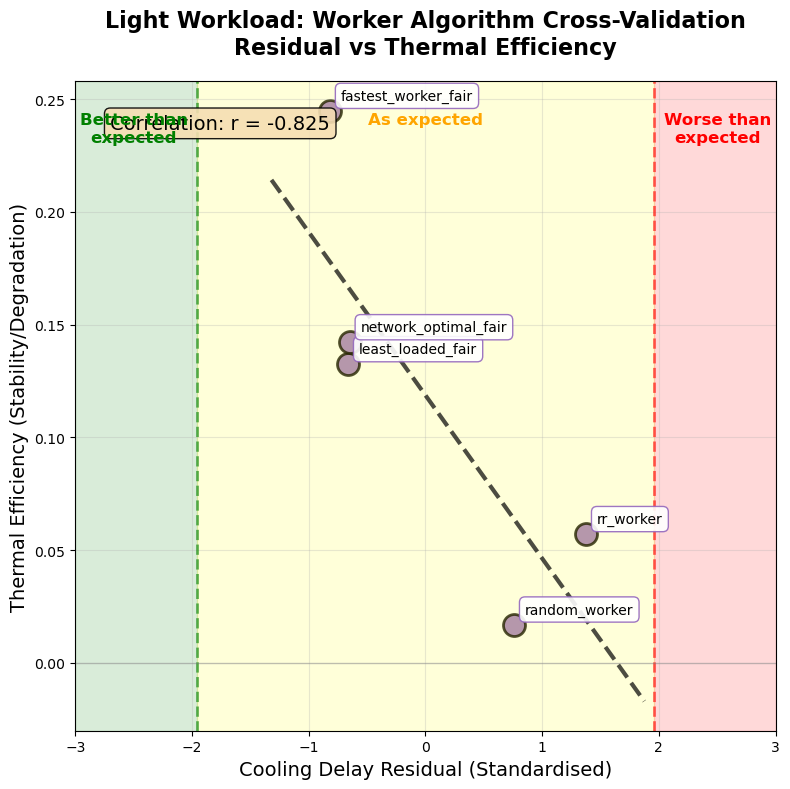

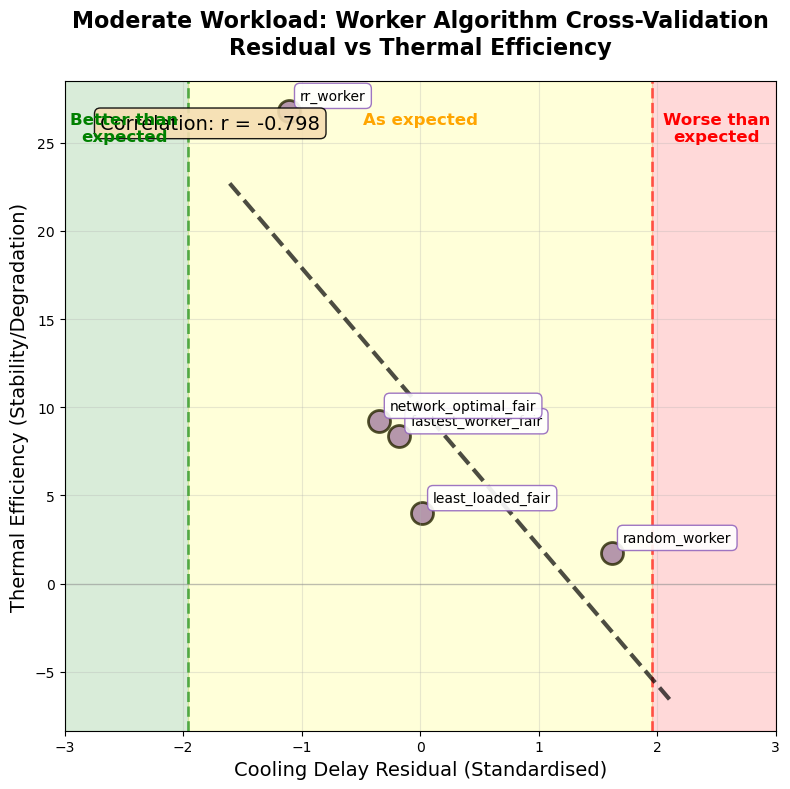

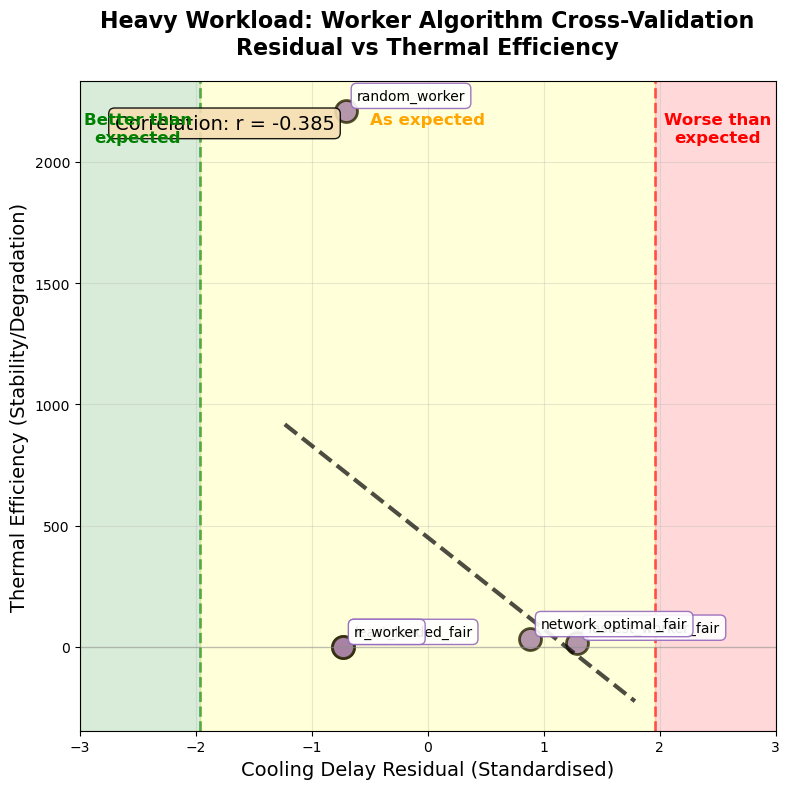

Creating Hybrid Algorithm Cross-Validation Figures...


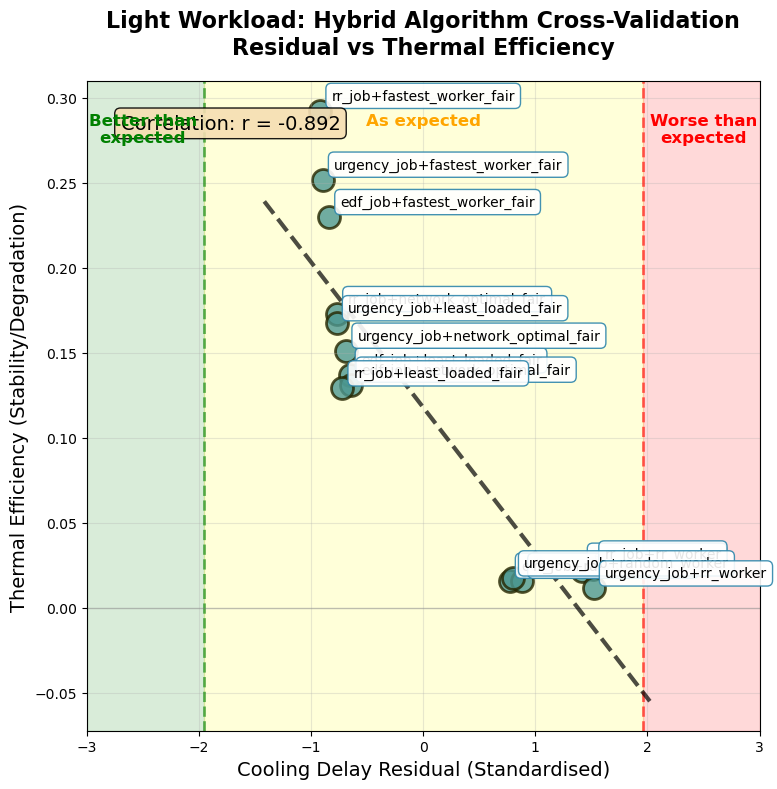

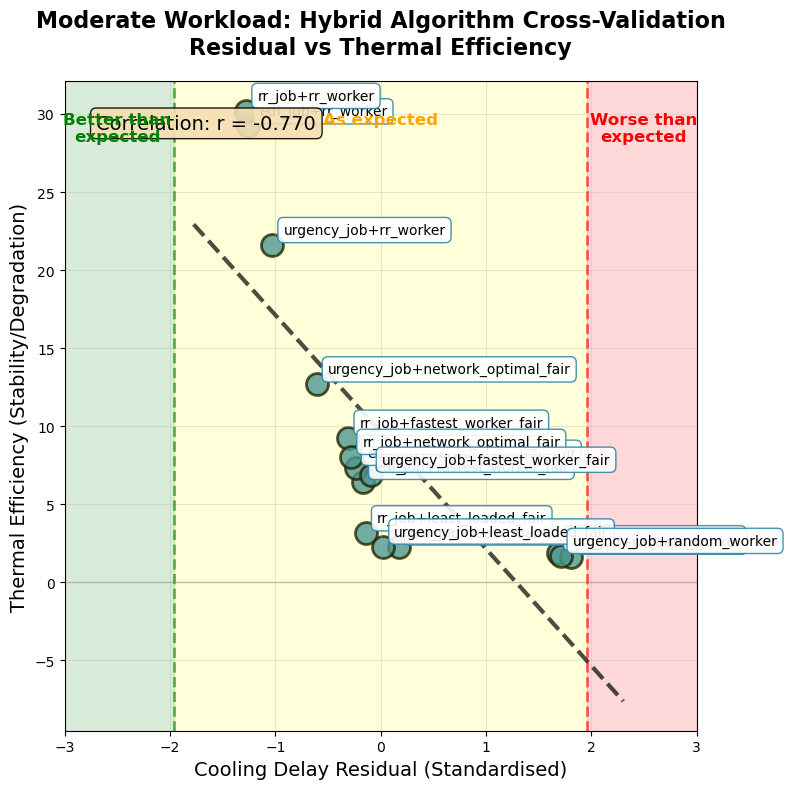

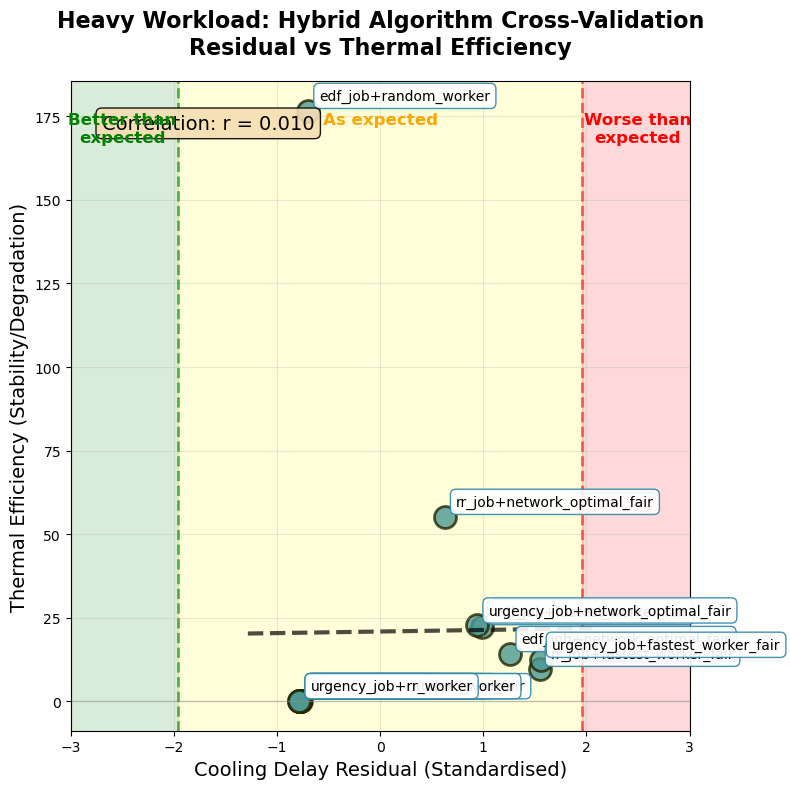

In [38]:
# ====================================================================
# CREATE THREE SEPARATE SQUARE CROSS-VALIDATION FIGURES
# ====================================================================


def plot_single_cross_validation(data, workload, analysis_type="Worker"):
    """Create individual cross-validation plot"""
    
    fig, ax = plt.subplots(figsize=(8, 8))  # Square format
    
    workload_data = data[data['workload_intensity'] == workload].copy()
    
    if len(workload_data) == 0:
        ax.text(0.5, 0.5, f'No data for {workload} workload', 
                transform=ax.transAxes, ha='center', va='center')
        return fig
    
    # Plot points
    color = '#9467bd' if analysis_type == "Worker" else '#2E86AB'
    scatter = ax.scatter(workload_data['standardised_residual'], 
                        workload_data['thermal_efficiency'],
                        c=color,
                        s=250,  # Larger for single plots
                        alpha=0.8, 
                        edgecolors='black', 
                        linewidth=2,
                        marker='o')
    
    # Add algorithm labels
    label_col = 'worker_algorithm' if analysis_type == "Worker" else 'algorithm_combination'
    for idx, row in workload_data.iterrows():
        ax.annotate(row[label_col], 
                   (row['standardised_residual'], row['thermal_efficiency']),
                   xytext=(8, 8), textcoords='offset points', 
                   fontsize=10,
                   bbox=dict(boxstyle='round,pad=0.4', 
                            facecolor='white', 
                            edgecolor=color,
                            alpha=0.9))
    
    # Add reference lines
    ax.axvline(-1.96, color='green', linestyle='--', alpha=0.6, linewidth=2)
    ax.axvline(1.96, color='red', linestyle='--', alpha=0.6, linewidth=2)
    ax.axhline(0, color='gray', linestyle='-', alpha=0.4, linewidth=1)
    
    # Add threshold zones
    y_min, y_max = ax.get_ylim()
    ax.axvspan(-3, -1.96, alpha=0.15, color='green')
    ax.axvspan(-1.96, 1.96, alpha=0.15, color='yellow')
    ax.axvspan(1.96, 3, alpha=0.15, color='red')
    
    # Add trend line
    if len(workload_data) >= 3:
        z = np.polyfit(workload_data['standardised_residual'], 
                      workload_data['thermal_efficiency'], 1)
        p = np.poly1d(z)
        x_trend = np.linspace(workload_data['standardised_residual'].min() - 0.5,
                             workload_data['standardised_residual'].max() + 0.5, 100)
        ax.plot(x_trend, p(x_trend), '--', color='black', alpha=0.7, linewidth=3)
        
        # Calculate correlation
        corr = workload_data['standardised_residual'].corr(workload_data['thermal_efficiency'])
        ax.text(0.05, 0.95, f'Correlation: r = {corr:.3f}', 
                transform=ax.transAxes, fontsize=14, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))
    
    # Add threshold labels
    ax.text(-2.5, y_max * 0.95, 'Better than\nexpected', 
            ha='center', va='top', fontsize=12, color='green', weight='bold')
    ax.text(0, y_max * 0.95, 'As expected', 
            ha='center', va='top', fontsize=12, color='orange', weight='bold')
    ax.text(2.5, y_max * 0.95, 'Worse than\nexpected', 
            ha='center', va='top', fontsize=12, color='red', weight='bold')
    
    # Customise plot
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=14)
    ax.set_ylabel('Thermal Efficiency (Stability/Degradation)', fontsize=14)
    ax.set_title(f'{workload.title()} Workload: {analysis_type} Algorithm Cross-Validation\n' +
                f'Residual vs Thermal Efficiency', 
                fontsize=16, fontweight='bold', pad=20)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    
    plt.tight_layout()
    return fig

# Load your data
df_worker_algo_check = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_worker.csv')
df_hybrid_algo_check = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_hybrid.csv')

# Create three separate figures for worker algorithms
print("Creating Worker Algorithm Cross-Validation Figures...")
fig_light = plot_single_cross_validation(df_worker_algo_check, 'light', "Worker")
plt.show()

fig_moderate = plot_single_cross_validation(df_worker_algo_check, 'moderate', "Worker") 
plt.show()

fig_heavy = plot_single_cross_validation(df_worker_algo_check, 'heavy', "Worker")
plt.show()

# Or create for hybrid algorithms if you prefer
print("Creating Hybrid Algorithm Cross-Validation Figures...")
fig_hybrid_light = plot_single_cross_validation(df_hybrid_algo_check, 'light', "Hybrid")
plt.show()

fig_hybrid_moderate = plot_single_cross_validation(df_hybrid_algo_check, 'moderate', "Hybrid") 
plt.show()

fig_hybrid_heavy = plot_single_cross_validation(df_hybrid_algo_check, 'heavy', "Hybrid")
plt.show()

In [39]:
# ====================================================================
# DEBUG: CHECK R VALUE DIFFERENCES
# ====================================================================

def compare_correlations(data, x_col, y_col, workload, analysis_type):
    """Compare different correlation calculation methods"""
    
    workload_data = data[data['workload_intensity'] == workload].copy()
    
    if len(workload_data) < 3:
        return None
    
    try:
        # Remove NaN values
        clean_data = workload_data[[x_col, y_col]].dropna()
        
        if len(clean_data) < 3:
            return None
        
        # Method 1: Pandas correlation (your current code)
        corr_pandas = clean_data[x_col].corr(clean_data[y_col])
        
        # Method 2: Scipy correlation with p-value (matches your table)
        corr_scipy, p_value = pearsonr(clean_data[x_col], clean_data[y_col])
        
        # Method 3: Manual calculation
        x = clean_data[x_col].values
        y = clean_data[y_col].values
        corr_manual = np.corrcoef(x, y)[0, 1]
        
        print(f"\n{analysis_type} - {workload.upper()} WORKLOAD:")
        print(f"  Pandas corr:     {corr_pandas:.3f}")
        print(f"  Scipy corr:      {corr_scipy:.3f}")
        print(f"  Manual corr:     {corr_manual:.3f}")
        print(f"  P-value:         {p_value:.3f}")
        print(f"  Sample size:     {len(clean_data)}")
        print(f"  Table XIII r:    [Check your table for comparison]")
        
        return {
            'workload': workload,
            'analysis_type': analysis_type,
            'pandas_r': corr_pandas,
            'scipy_r': corr_scipy,
            'manual_r': corr_manual,
            'p_value': p_value,
            'n': len(clean_data)
        }
        
    except Exception as e:
        print(f"Error in {analysis_type} {workload}: {str(e)}")
        return None

# Load your data
df_worker_algo = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_worker.csv')
df_hybrid_algo = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_hybrid.csv')

print("CORRELATION COMPARISON ANALYSIS")
print("=" * 60)

results = []

# Check Worker Algorithm-Level correlations
for workload in ['light', 'moderate', 'heavy']:
    result = compare_correlations(df_worker_algo, 'standardised_residual', 
                                 'thermal_efficiency', workload, 'Worker Algorithm-Level')
    if result:
        results.append(result)

# Check Hybrid Algorithm-Level correlations  
for workload in ['light', 'moderate', 'heavy']:
    result = compare_correlations(df_hybrid_algo, 'standardised_residual', 
                                 'thermal_efficiency', workload, 'Hybrid Algorithm-Level')
    if result:
        results.append(result)

# Compare with your Table XIII values
print("\n\nCOMPARISON WITH TABLE XIII:")
print("-" * 60)
table_xiii_values = {
    ('Worker', 'light'): -0.825,
    ('Worker', 'moderate'): -0.798, 
    ('Worker', 'heavy'): -0.385,
    ('Hybrid', 'light'): -0.892,
    ('Hybrid', 'moderate'): -0.770,
    ('Hybrid', 'heavy'): 0.010
}

for result in results:
    key = (result['analysis_type'].split()[0], result['workload'])
    table_r = table_xiii_values.get(key, "Not found")
    diff = abs(result['scipy_r'] - table_r) if isinstance(table_r, float) else "N/A"
    
    print(f"{result['analysis_type']} {result['workload']}:")
    print(f"  Your calculation: {result['scipy_r']:.3f}")
    print(f"  Table XIII:       {table_r}")
    print(f"  Difference:       {diff}")
    print()

CORRELATION COMPARISON ANALYSIS
Error in Worker Algorithm-Level light: name 'pearsonr' is not defined
Error in Worker Algorithm-Level moderate: name 'pearsonr' is not defined
Error in Worker Algorithm-Level heavy: name 'pearsonr' is not defined
Error in Hybrid Algorithm-Level light: name 'pearsonr' is not defined
Error in Hybrid Algorithm-Level moderate: name 'pearsonr' is not defined
Error in Hybrid Algorithm-Level heavy: name 'pearsonr' is not defined


COMPARISON WITH TABLE XIII:
------------------------------------------------------------


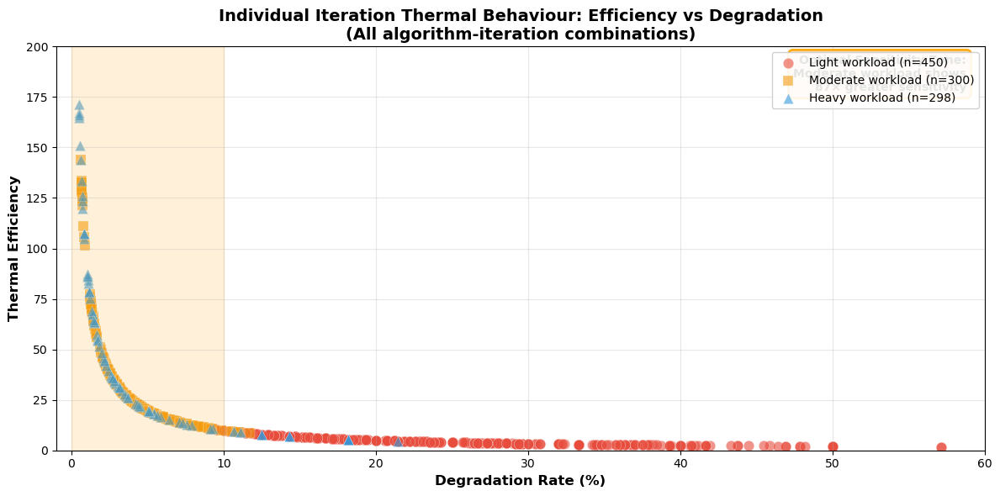

In [40]:
# Visualisation 2: Individual Iteration Scatter Plot (No Polynomial)
fig, ax = plt.subplots(figsize=(12, 6))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Plot individual iteration points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['degradation_rate'].notna())
    ]
    
    if len(workload_data) > 0:
        ax.scatter(workload_data['degradation_rate'], 
                  workload_data['thermal_efficiency'],
                  s=80, alpha=0.6, 
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  label=f'{workload.title()} workload (n={len(workload_data)})',
                  edgecolors='white', linewidth=0.3)

# Enhanced styling with focused y-axis
ax.set_xlabel('Degradation Rate (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Thermal Efficiency', fontsize=12, fontweight='bold')
ax.set_title('Individual Iteration Thermal Behaviour: Efficiency vs Degradation\n' + 
            '(All algorithm-iteration combinations)', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', framealpha=0.9)

# Focus on the interesting region: 0-200 efficiency
ax.set_ylim(0, 200)
ax.set_xlim(-1, 60)

# REMOVE the blue box entirely (delete these lines)
# ax.text(0.02, 0.98, 
#         'Better thermal efficiency →\n(High efficiency, Low degradation)', 
#         transform=ax.transAxes, fontsize=11, fontweight='bold',
#         verticalalignment='top',
#         bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', 
#                  alpha=0.8, edgecolor='navy', linewidth=1))

# Highlight the Optimal Sensitivity Zone (0-10% degradation, 0-200 efficiency)
ax.axvspan(0, 10, alpha=0.15, color='orange', zorder=1)

# MOVE the yellow box to top-right instead of bottom-right
ax.text(0.98, 0.98, 
        'Optimal Sensitivity Zone:\nModerate workload shows\n87× greater sensitivity', 
        transform=ax.transAxes, fontsize=10, fontweight='bold',
        verticalalignment='top', horizontalalignment='right',  # Changed t so 'top'
        bbox=dict(boxstyle='round,pad=0.4', facecolor='wheat', 
                 alpha=0.9, edgecolor='orange', linewidth=2))

plt.tight_layout()
plt.savefig('./img_exports/step_3_103_iteration_thermal_scatter_CLEAN.png', 
           dpi=300, bbox_inches='tight')
plt.show()

## If I were to explore Individul Containers Correlation line

In [41]:
# ====================================================================
# WORKER ITERATION-LEVEL CROSS-VALIDATION WITH LINEARITY TESTING
# ====================================================================

import numpy as np
import pandas as pd
from scipy import stats
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

def runs_test_manual(residuals):
    """Manual implementation of runs test for randomness"""
    # Convert to binary (above/below median)
    median_val = np.median(residuals)
    binary = residuals > median_val
    
    # Count runs
    runs = 1
    for i in range(1, len(binary)):
        if binary[i] != binary[i-1]:
            runs += 1
    
    # Expected runs and variance
    n1 = np.sum(binary)
    n2 = len(binary) - n1
    
    if n1 == 0 or n2 == 0:
        return np.nan, np.nan
    
    expected_runs = (2 * n1 * n2) / (n1 + n2) + 1
    variance = (2 * n1 * n2 * (2 * n1 * n2 - n1 - n2)) / ((n1 + n2)**2 * (n1 + n2 - 1))
    
    if variance <= 0:
        return np.nan, np.nan
    
    # Z-score and p-value
    z = (runs - expected_runs) / np.sqrt(variance)
    p_value = 2 * (1 - stats.norm.cdf(abs(z)))
    
    return runs, p_value

def test_linearity_and_fit_models(x, y, workload_name):
    """Test linear vs polynomial fits and return best model"""
    
    # Remove NaN values
    mask = ~(np.isnan(x) | np.isnan(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    if len(x_clean) < 5:
        return None, "Insufficient data", {}
    
    # Reshape for sklearn
    X = x_clean.reshape(-1, 1)
    
    results = {}
    
    # 1. Linear fit
    linear_model = LinearRegression()
    linear_model.fit(X, y_clean)
    y_pred_linear = linear_model.predict(X)
    r2_linear = r2_score(y_clean, y_pred_linear)
    
    # Linear equation
    slope = linear_model.coef_[0]
    intercept = linear_model.intercept_
    linear_eq = f"y = {slope:.4f}x + {intercept:.4f}"
    
    results['linear'] = {
        'r2': r2_linear,
        'equation': linear_eq,
        'model': linear_model,
        'residuals': y_clean - y_pred_linear
    }
    
    # 2. Quadratic fit
    poly_features = PolynomialFeatures(degree=2)
    X_poly = poly_features.fit_transform(X)
    
    quad_model = LinearRegression()
    quad_model.fit(X_poly, y_clean)
    y_pred_quad = quad_model.predict(X_poly)
    r2_quad = r2_score(y_clean, y_pred_quad)
    
    # Quadratic equation
    coeffs = quad_model.coef_
    intercept_q = quad_model.intercept_
    quad_eq = f"y = {coeffs[2]:.4f}x² + {coeffs[1]:.4f}x + {intercept_q:.4f}"
    
    results['quadratic'] = {
        'r2': r2_quad,
        'equation': quad_eq,
        'model': quad_model,
        'residuals': y_clean - y_pred_quad,
        'poly_features': poly_features
    }
    
    # 3. Cubic fit (if enough data)
    if len(x_clean) >= 10:
        try:
            poly_features_3 = PolynomialFeatures(degree=3)
            X_poly_3 = poly_features_3.fit_transform(X)
            
            cubic_model = LinearRegression()
            cubic_model.fit(X_poly_3, y_clean)
            y_pred_cubic = cubic_model.predict(X_poly_3)
            r2_cubic = r2_score(y_clean, y_pred_cubic)
            
            coeffs_3 = cubic_model.coef_
            intercept_c = cubic_model.intercept_
            cubic_eq = f"y = {coeffs_3[3]:.4f}x³ + {coeffs_3[2]:.4f}x² + {coeffs_3[1]:.4f}x + {intercept_c:.4f}"
            
            results['cubic'] = {
                'r2': r2_cubic,
                'equation': cubic_eq,
                'model': cubic_model,
                'residuals': y_clean - y_pred_cubic,
                'poly_features': poly_features_3
            }
        except:
            print(f"  Warning: Cubic fit failed for {workload_name}")
    
    # 4. Statistical tests for non-linearity
    # Runs test for randomness of residuals
    residuals_linear = results['linear']['residuals']
    runs_stat, runs_p = runs_test_manual(residuals_linear)
    
    # F-test for improvement from linear to quadratic
    if 'quadratic' in results:
        n = len(y_clean)
        p_linear = 2  # slope + intercept
        p_quad = 3    # x², x, intercept
        
        ss_res_linear = np.sum(residuals_linear**2)
        ss_res_quad = np.sum(results['quadratic']['residuals']**2)
        
        if ss_res_quad > 0 and ss_res_linear > ss_res_quad:
            f_stat = ((ss_res_linear - ss_res_quad) / (p_quad - p_linear)) / (ss_res_quad / (n - p_quad))
            f_p = 1 - stats.f.cdf(f_stat, p_quad - p_linear, n - p_quad)
        else:
            f_stat, f_p = np.nan, np.nan
    else:
        f_stat, f_p = np.nan, np.nan
    
    # 5. Additional linearity tests
    # Durbin-Watson test for autocorrelation in residuals
    def durbin_watson(residuals):
        """Calculate Durbin-Watson statistic"""
        diff = np.diff(residuals)
        return np.sum(diff**2) / np.sum(residuals**2)
    
    dw_stat = durbin_watson(residuals_linear)
    
    # Determine best model based on multiple criteria
    criteria_scores = {'linear': 0, 'quadratic': 0, 'cubic': 0}
    
    # R² improvement criterion
    if 'quadratic' in results and results['quadratic']['r2'] > results['linear']['r2'] + 0.02:
        criteria_scores['quadratic'] += 1
    if 'cubic' in results and results['cubic']['r2'] > results['quadratic']['r2'] + 0.02:
        criteria_scores['cubic'] += 1
    
    # F-test criterion
    if not np.isnan(f_p) and f_p < 0.05:
        criteria_scores['quadratic'] += 1
    
    # Runs test criterion (non-random residuals suggest non-linearity)
    if not np.isnan(runs_p) and runs_p < 0.05:
        criteria_scores['quadratic'] += 1
        if 'cubic' in results:
            criteria_scores['cubic'] += 1
    
    # Choose best model
    best_model = max(criteria_scores, key=criteria_scores.get)
    if criteria_scores[best_model] == 0:  # No evidence against linear
        best_model = 'linear'
    
    return results, best_model, {
        'runs_test_p': runs_p,
        'f_test_p': f_p,
        'durbin_watson': dw_stat,
        'n_points': len(x_clean),
        'criteria_scores': criteria_scores
    }

# ====================================================================
# ITERATION-LEVEL ANALYSIS WITH LINEARITY TESTING
# ====================================================================

print("Analysing iteration-level data with linearity testing...")

iteration_results = {}

for workload in ['light', 'moderate', 'heavy']:
    print(f"\nAnalysing {workload} workload...")
    
    # Get iteration-level data
    data = df_worker_final[
        (df_worker_final['workload_intensity'] == workload) &
        (df_worker_final['standardised_residual'].notna()) &
        (df_worker_final['thermal_efficiency'].notna()) &
        (df_worker_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) < 10:
        print(f"  Insufficient data for {workload}: {len(data)} points")
        continue
    
    x = data['standardised_residual'].values
    y = data['thermal_efficiency'].values
    
    # Test linearity
    models, best_model, tests = test_linearity_and_fit_models(x, y, workload)
    
    if models is None:
        continue
    
    # Store results
    iteration_results[workload] = {
        'data_points': len(data),
        'models': models,
        'best_model': best_model,
        'statistical_tests': tests,
        'pearson_r': stats.pearsonr(x, y)[0],
        'pearson_p': stats.pearsonr(x, y)[1]
    }
    
    # Print summary
    print(f"  Data points: {len(data)}")
    print(f"  Linear R²: {models['linear']['r2']:.3f}")
    if 'quadratic' in models:
        print(f"  Quadratic R²: {models['quadratic']['r2']:.3f}")
        print(f"  R² improvement: {models['quadratic']['r2'] - models['linear']['r2']:.3f}")
    if 'cubic' in models:
        print(f"  Cubic R²: {models['cubic']['r2']:.3f}")
    print(f"  Best model: {best_model}")
    print(f"  Runs test p-value: {tests['runs_test_p']:.4f} {'(non-random)' if not np.isnan(tests['runs_test_p']) and tests['runs_test_p'] < 0.05 else '(random)'}")
    if not np.isnan(tests['f_test_p']):
        print(f"  F-test (linear vs quad) p-value: {tests['f_test_p']:.4f}")
    print(f"  Durbin-Watson: {tests['durbin_watson']:.3f} {'(autocorrelated)' if tests['durbin_watson'] < 1.5 or tests['durbin_watson'] > 2.5 else '(independent)'}")

# ====================================================================
# CREATE COMPREHENSIVE SUMMARY TABLE
# ====================================================================

summary_rows = []

for workload in ['light', 'moderate', 'heavy']:
    if workload not in iteration_results:
        continue
    
    result = iteration_results[workload]
    
    # Add row for each available model
    for model_type in ['linear', 'quadratic', 'cubic']:
        if model_type not in result['models']:
            continue
            
        summary_rows.append({
            'workload': workload,
            'model_type': model_type,
            'equation': result['models'][model_type]['equation'],
            'r_squared': result['models'][model_type]['r2'],
            'pearson_r': result['pearson_r'],
            'pearson_p': result['pearson_p'],
            'n_points': result['data_points'],
            'is_best': result['best_model'] == model_type,
            'runs_test_p': result['statistical_tests']['runs_test_p'],
            'f_test_p': result['statistical_tests'].get('f_test_p', np.nan),
            'durbin_watson': result['statistical_tests']['durbin_watson']
        })

df_iteration_summary = pd.DataFrame(summary_rows)

# Save results
df_iteration_summary.to_csv('./csv_exports/step_3_FINAL_iteration_linearity_analysis.csv', index=False)

print("\n" + "="*80)
print("ITERATION-LEVEL LINEARITY ANALYSIS SUMMARY")
print("="*80)

# Print formatted results
for workload in ['light', 'moderate', 'heavy']:
    if workload in iteration_results:
        result = iteration_results[workload]
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"Best model: {result['best_model']}")
        for model_type in ['linear', 'quadratic', 'cubic']:
            if model_type in result['models']:
                r2 = result['models'][model_type]['r2']
                eq = result['models'][model_type]['equation']
                marker = " ★" if model_type == result['best_model'] else ""
                print(f"  {model_type:10}: R² = {r2:.3f} | {eq}{marker}")

print(f"\nFull table saved to: ./csv_exports/step_3_FINAL_iteration_linearity_analysis.csv")

Analysing iteration-level data with linearity testing...

Analysing light workload...
  Data points: 150
  Linear R²: 0.048
  Quadratic R²: 0.143
  R² improvement: 0.094
  Cubic R²: 0.149
  Best model: quadratic
  Runs test p-value: 0.0000 (non-random)
  F-test (linear vs quad) p-value: 0.0001
  Durbin-Watson: 0.765 (autocorrelated)

Analysing moderate workload...
  Data points: 100
  Linear R²: 0.076
  Quadratic R²: 0.076
  R² improvement: 0.000
  Cubic R²: 0.081
  Best model: quadratic
  Runs test p-value: 0.0013 (non-random)
  F-test (linear vs quad) p-value: 0.8826
  Durbin-Watson: 1.125 (autocorrelated)

Analysing heavy workload...
  Data points: 100
  Linear R²: 0.001
  Quadratic R²: 0.234
  R² improvement: 0.233
  Cubic R²: 0.358
  Best model: quadratic
  Runs test p-value: 0.0000 (non-random)
  F-test (linear vs quad) p-value: 0.0000
  Durbin-Watson: 0.213 (autocorrelated)

ITERATION-LEVEL LINEARITY ANALYSIS SUMMARY

LIGHT WORKLOAD:
Best model: quadratic
  linear    : R² = 0.04

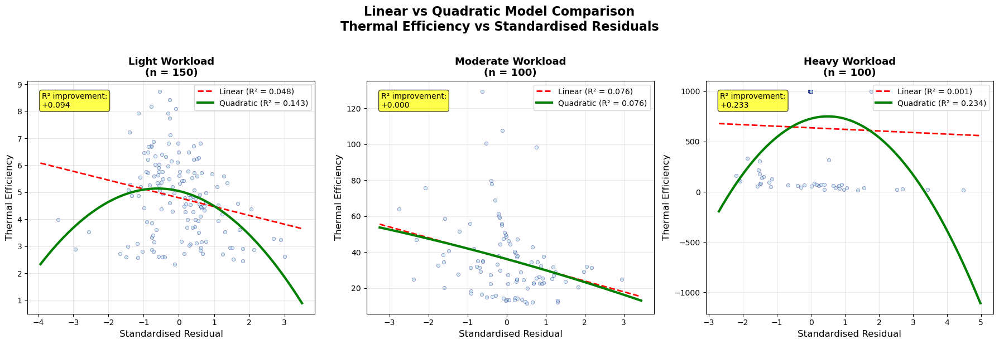


LINEAR vs QUADRATIC MODEL COMPARISON
Workload   Linear R²  Quad R²    Improvement  F-test p  
------------------------------------------------------------
light      0.048      0.143      0.094        0.0001  ***
moderate   0.076      0.076      0.000        0.8826  ns
heavy      0.001      0.234      0.233        0.0000  ***


In [42]:
# ====================================================================
# QUADRATIC VS LINEAR COMPARISON VISUALIZATION
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, workload in enumerate(['light', 'moderate', 'heavy']):
    if workload not in iteration_results:
        axes[i].text(0.5, 0.5, f'No data for {workload}', 
                    transform=axes[i].transAxes, ha='center', va='center')
        continue
    
    # Get data
    data = df_worker_final[
        (df_worker_final['workload_intensity'] == workload) &
        (df_worker_final['standardised_residual'].notna()) &
        (df_worker_final['thermal_efficiency'].notna()) &
        (df_worker_final['thermal_efficiency'] > 0)
    ]
    
    x = data['standardised_residual'].values
    y = data['thermal_efficiency'].values
    
    # Plot data points
    axes[i].scatter(x, y, alpha=0.5, s=20, color='lightblue', edgecolors='navy', linewidth=0.5)
    
    # Get model results
    result = iteration_results[workload]
    
    # Create smooth x range for plotting curves
    x_range = np.linspace(x.min() - 0.5, x.max() + 0.5, 200)
    
    # Plot LINEAR fit
    linear_model = result['models']['linear']['model']
    y_linear = linear_model.predict(x_range.reshape(-1, 1))
    linear_r2 = result['models']['linear']['r2']
    
    axes[i].plot(x_range, y_linear, 
                color='red', linewidth=2, linestyle='--',
                label=f"Linear (R² = {linear_r2:.3f})")
    
    # Plot QUADRATIC fit
    if 'quadratic' in result['models']:
        quad_model = result['models']['quadratic']['model']
        poly_features = result['models']['quadratic']['poly_features']
        X_poly = poly_features.transform(x_range.reshape(-1, 1))
        y_quad = quad_model.predict(X_poly)
        quad_r2 = result['models']['quadratic']['r2']
        
        axes[i].plot(x_range, y_quad, 
                    color='green', linewidth=3,
                    label=f"Quadratic (R² = {quad_r2:.3f})")
    
    # Formatting
    axes[i].set_xlabel('Standardised Residual', fontsize=12)
    axes[i].set_ylabel('Thermal Efficiency', fontsize=12)
    axes[i].set_title(f'{workload.title()} Workload\n(n = {result["data_points"]})', 
                     fontsize=13, fontweight='bold')
    axes[i].legend(fontsize=10)
    axes[i].grid(True, alpha=0.3)
    
    # Add improvement annotation
    if 'quadratic' in result['models']:
        improvement = quad_r2 - linear_r2
        axes[i].text(0.05, 0.95, f'R² improvement:\n+{improvement:.3f}', 
                    transform=axes[i].transAxes, fontsize=10,
                    bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7),
                    verticalalignment='top')

plt.suptitle('Linear vs Quadratic Model Comparison\nThermal Efficiency vs Standardised Residuals', 
             fontsize=16, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig('./img_exports/step_3_linear_vs_quadratic_comparison.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# SUMMARY STATISTICS TABLE
# ====================================================================

print("\n" + "="*60)
print("LINEAR vs QUADRATIC MODEL COMPARISON")
print("="*60)
print(f"{'Workload':<10} {'Linear R²':<10} {'Quad R²':<10} {'Improvement':<12} {'F-test p':<10}")
print("-" * 60)

for workload in ['light', 'moderate', 'heavy']:
    if workload in iteration_results:
        result = iteration_results[workload]
        linear_r2 = result['models']['linear']['r2']
        quad_r2 = result['models']['quadratic']['r2']
        improvement = quad_r2 - linear_r2
        f_p = result['statistical_tests']['f_test_p']
        
        significance = "***" if f_p < 0.001 else "**" if f_p < 0.01 else "*" if f_p < 0.05 else "ns"
        
        print(f"{workload:<10} {linear_r2:<10.3f} {quad_r2:<10.3f} {improvement:<12.3f} {f_p:<7.4f} {significance}")

This doesn't look like it's quadratic — it looks more like clusters that actually show a regime. Let's see if I can visually clsuter per algorithm

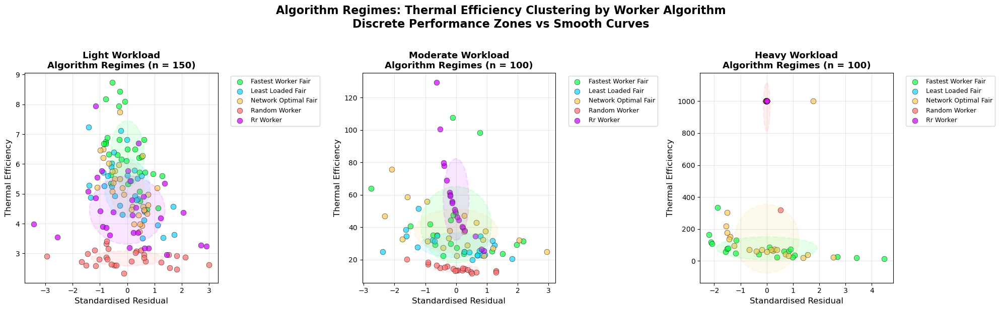


ALGORITHM REGIME ANALYSIS

LIGHT WORKLOAD REGIMES:
----------------------------------------
fastest_worker_fair  | Residual:   0.00±0.62 | Efficiency:    6.3±1.1 | n= 30
least_loaded_fair    | Residual:  -0.00±0.83 | Efficiency:    5.2±1.0 | n= 30
network_optimal_fair | Residual:  -0.00±0.62 | Efficiency:    5.2±0.9 | n= 30
random_worker        | Residual:   0.00±1.33 | Efficiency:    2.8±0.3 | n= 30
rr_worker            | Residual:  -0.00±1.38 | Efficiency:    4.5±1.1 | n= 30

MODERATE WORKLOAD REGIMES:
----------------------------------------
fastest_worker_fair  | Residual:  -0.00±1.15 | Efficiency:   41.5±23.6 | n= 20
least_loaded_fair    | Residual:   0.00±1.17 | Efficiency:   28.9±7.6 | n= 20
network_optimal_fair | Residual:   0.00±1.35 | Efficiency:   37.8±13.5 | n= 20
random_worker        | Residual:  -0.00±0.72 | Efficiency:   14.6±2.2 | n= 20
rr_worker            | Residual:  -0.00±0.42 | Efficiency:   57.2±25.1 | n= 20

HEAVY WORKLOAD REGIMES:
------------------------------

In [43]:
# ====================================================================
# ALGORITHM-BASED CLUSTERING VISUALIZATION
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Define colors for each algorithm
algorithm_colors = {
    'random_worker': '#FF6B6B',      # Red
    'rr_worker': "#CC00FF",          # Teal  
    'least_loaded_fair': "#13D4FF",  # Blue
    'fastest_worker_fair': "#0CFF41", # Green
    'network_optimal_fair': '#FECA57' # Yellow
}

for i, workload in enumerate(['light', 'moderate', 'heavy']):
    # Get data
    data = df_worker_final[
        (df_worker_final['workload_intensity'] == workload) &
        (df_worker_final['standardised_residual'].notna()) &
        (df_worker_final['thermal_efficiency'].notna()) &
        (df_worker_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) == 0:
        axes[i].text(0.5, 0.5, f'No data for {workload}', 
                    transform=axes[i].transAxes, ha='center', va='center')
        continue
    
    # Plot each algorithm separately
    for algorithm in data['worker_algorithm'].unique():
        algo_data = data[data['worker_algorithm'] == algorithm]
        
        axes[i].scatter(algo_data['standardised_residual'], 
                       algo_data['thermal_efficiency'],
                       c=algorithm_colors.get(algorithm, '#999999'),
                       label=algorithm.replace('_', ' ').title(),
                       s=60, alpha=0.7, edgecolors='black', linewidth=0.5)
    
    # Add cluster ellipses (optional - shows natural groupings)
    from matplotlib.patches import Ellipse
    
    for algorithm in data['worker_algorithm'].unique():
        algo_data = data[data['worker_algorithm'] == algorithm]
        if len(algo_data) >= 3:
            # Calculate 95% confidence ellipse
            x_mean, y_mean = algo_data['standardised_residual'].mean(), algo_data['thermal_efficiency'].mean()
            x_std, y_std = algo_data['standardised_residual'].std(), algo_data['thermal_efficiency'].std()
            
            ellipse = Ellipse((x_mean, y_mean), 
                            width=2*x_std, height=2*y_std,
                            facecolor=algorithm_colors.get(algorithm, '#999999'),
                            alpha=0.1, edgecolor=algorithm_colors.get(algorithm, '#999999'),
                            linewidth=2, linestyle='--')
            axes[i].add_patch(ellipse)
    
    # Formatting
    axes[i].set_xlabel('Standardised Residual', fontsize=12)
    axes[i].set_ylabel('Thermal Efficiency', fontsize=12)
    axes[i].set_title(f'{workload.title()} Workload\nAlgorithm Regimes (n = {len(data)})', 
                     fontsize=13, fontweight='bold')
    axes[i].grid(True, alpha=0.3)
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

plt.suptitle('Algorithm Regimes: Thermal Efficiency Clustering by Worker Algorithm\nDiscrete Performance Zones vs Smooth Curves', 
             fontsize=16, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig('./img_exports/step_3_algorithm_regimes_clustering.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# REGIME SUMMARY TABLE
# ====================================================================

print("\n" + "="*80)
print("ALGORITHM REGIME ANALYSIS")
print("="*80)

for workload in ['light', 'moderate', 'heavy']:
    data = df_worker_final[
        (df_worker_final['workload_intensity'] == workload) &
        (df_worker_final['standardised_residual'].notna()) &
        (df_worker_final['thermal_efficiency'].notna()) &
        (df_worker_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) == 0:
        continue
        
    print(f"\n{workload.upper()} WORKLOAD REGIMES:")
    print("-" * 40)
    
    for algorithm in sorted(data['worker_algorithm'].unique()):
        algo_data = data[data['worker_algorithm'] == algorithm]
        
        residual_mean = algo_data['standardised_residual'].mean()
        residual_std = algo_data['standardised_residual'].std()
        efficiency_mean = algo_data['thermal_efficiency'].mean()
        efficiency_std = algo_data['thermal_efficiency'].std()
        
        print(f"{algorithm:20} | Residual: {residual_mean:6.2f}±{residual_std:.2f} | "
              f"Efficiency: {efficiency_mean:6.1f}±{efficiency_std:.1f} | n={len(algo_data):3}")

In [44]:
# ====================================================================
# CHECK HYBRID DATA STRUCTURE FIRST
# ====================================================================

print("Checking hybrid dataframe structure...")
print(f"Columns in df_hybrid_final: {df_hybrid_final.columns.tolist()}")
print(f"Shape: {df_hybrid_final.shape}")

# Check for algorithm column names
print("\nUnique values in relevant columns:")
if 'job_algorithm' in df_hybrid_final.columns:
    print(f"Job algorithms: {df_hybrid_final['job_algorithm'].unique()}")
if 'worker_algorithm' in df_hybrid_final.columns:
    print(f"Worker algorithms: {df_hybrid_final['worker_algorithm'].unique()}")

# Sample a few rows to see the data
print(f"\nFirst few rows:")
print(df_hybrid_final.head())

# ========================================

Checking hybrid dataframe structure...
Columns in df_hybrid_final: ['workload_intensity', 'algorithm_combination', 'iteration_num', 'degradation_count', 'total_transitions', 'degradation_rate', 'cooling_penalty', 'job_id', 'worker_algorithm', 'standardised_residual', 'thermal_efficiency']
Shape: (1048, 11)

Unique values in relevant columns:
Worker algorithms: ['fastest_worker_fair' 'least_loaded_fair' 'network_optimal_fair'
 'random_worker' 'rr_worker']

First few rows:
  workload_intensity        algorithm_combination  iteration_num  \
0              heavy  edf_job+fastest_worker_fair              1   
1              heavy  edf_job+fastest_worker_fair              2   
2              heavy  edf_job+fastest_worker_fair              3   
3              heavy  edf_job+fastest_worker_fair              4   
4              heavy  edf_job+fastest_worker_fair              5   

   degradation_count  total_transitions  degradation_rate  cooling_penalty  \
0                  2                1

Unique job algorithms: ['edf_job' 'rr_job' 'urgency_job']
Unique worker algorithms: ['fastest_worker_fair' 'least_loaded_fair' 'network_optimal_fair'
 'random_worker' 'rr_worker']

light workload: 450 data points
Algorithm combinations: 15

moderate workload: 300 data points
Algorithm combinations: 15

heavy workload: 298 data points
Algorithm combinations: 15


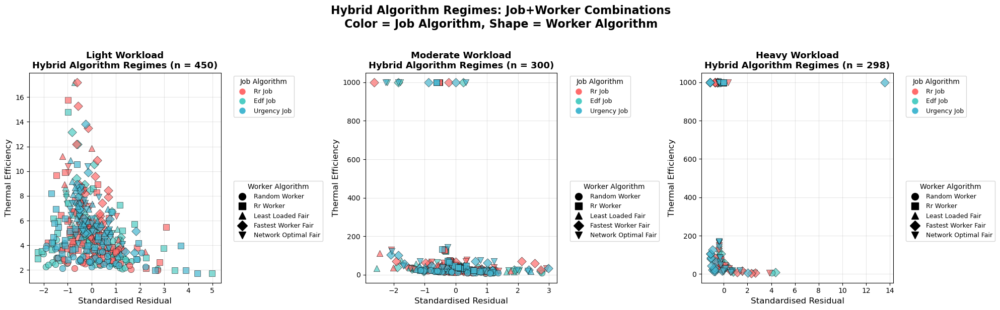


HYBRID ALGORITHM TOP-LEFT QUADRANT ANALYSIS

LIGHT WORKLOAD TOP-LEFT PERFORMERS:
(Negative residuals < -1 AND Thermal efficiency > 50)
  No clear top-left performers found
  Relaxed criteria (residual < -0.5, efficiency > 30): 0 combinations

MODERATE WORKLOAD TOP-LEFT PERFORMERS:
(Negative residuals < -1 AND Thermal efficiency > 50)
  edf_job+fastest_worker_fair         | Residual:  -1.84 | Efficiency: 1000.0
  edf_job+least_loaded_fair           | Residual:  -1.29 | Efficiency:   56.6
  edf_job+least_loaded_fair           | Residual:  -1.75 | Efficiency:   71.9
  edf_job+network_optimal_fair        | Residual:  -2.21 | Efficiency: 1000.0
  edf_job+network_optimal_fair        | Residual:  -1.78 | Efficiency: 1000.0
  rr_job+fastest_worker_fair          | Residual:  -1.92 | Efficiency:   71.5
  rr_job+fastest_worker_fair          | Residual:  -2.63 | Efficiency: 1000.0
  rr_job+least_loaded_fair            | Residual:  -2.44 | Efficiency:  111.1
  rr_job+network_optimal_fair         |

In [45]:
# ====================================================================
# HYBRID ALGORITHM CLUSTERING VISUALIZATION (FIXED)
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Extract job and worker algorithms from algorithm_combination
def extract_algorithms(combo_str):
    """Extract job and worker algorithms from combination string"""
    if '+' in combo_str:
        job_algo, worker_algo = combo_str.split('+', 1)
        return job_algo, worker_algo
    else:
        return None, None

# Add temporary columns for job and worker algorithms
df_hybrid_final['job_algorithm'] = df_hybrid_final['algorithm_combination'].apply(lambda x: extract_algorithms(x)[0])
df_hybrid_final['worker_algorithm_combo'] = df_hybrid_final['algorithm_combination'].apply(lambda x: extract_algorithms(x)[1])

print("Unique job algorithms:", df_hybrid_final['job_algorithm'].unique())
print("Unique worker algorithms:", df_hybrid_final['worker_algorithm_combo'].unique())

# Define colors and markers
job_colors = {
    'rr_job': '#FF6B6B',      # Red
    'edf_job': '#4ECDC4',     # Teal  
    'urgency_job': '#45B7D1'  # Blue
}

worker_markers = {
    'random_worker': 'o',           # Circle
    'rr_worker': 's',               # Square
    'least_loaded_fair': '^',       # Triangle up
    'fastest_worker_fair': 'D',     # Diamond
    'network_optimal_fair': 'v'     # Triangle down
}

for i, workload in enumerate(['light', 'moderate', 'heavy']):
    # Get hybrid data
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) == 0:
        axes[i].text(0.5, 0.5, f'No data for {workload}', 
                    transform=axes[i].transAxes, ha='center', va='center')
        continue
    
    print(f"\n{workload} workload: {len(data)} data points")
    print(f"Algorithm combinations: {data['algorithm_combination'].nunique()}")
    
    # Plot each point with color=job_algorithm, marker=worker_algorithm
    for _, row in data.iterrows():
        job_algo = row['job_algorithm']
        worker_algo = row['worker_algorithm_combo']
        
        color = job_colors.get(job_algo, '#999999')
        marker = worker_markers.get(worker_algo, 'o')
        
        axes[i].scatter(row['standardised_residual'], 
                       row['thermal_efficiency'],
                       c=color, marker=marker,
                       s=80, alpha=0.7, edgecolors='black', linewidth=0.5)
    
    # Create custom legends
    # Job algorithm legend (colors)
    job_legend_elements = []
    for job, color in job_colors.items():
        if job in data['job_algorithm'].values:
            job_legend_elements.append(
                plt.Line2D([0], [0], marker='o', color='w', 
                          markerfacecolor=color, markersize=10,  
                          label=job.replace('_', ' ').title())
            )
    
    # Worker algorithm legend (markers)
    worker_legend_elements = []
    for worker, marker in worker_markers.items():
        if worker in data['worker_algorithm_combo'].values:
            worker_legend_elements.append(
                plt.Line2D([0], [0], marker=marker, color='black', 
                          linestyle='None', markersize=10,
                          label=worker.replace('_', ' ').title())
            )
    
    # Add legends
    if job_legend_elements:
        leg1 = axes[i].legend(handles=job_legend_elements, title="Job Algorithm", 
                             loc='upper left', bbox_to_anchor=(1.05, 1),
                             fontsize=9)
    if worker_legend_elements:
        leg2 = axes[i].legend(handles=worker_legend_elements, title="Worker Algorithm", 
                             loc='upper left', bbox_to_anchor=(1.05, 0.5),
                             fontsize=9)
        if job_legend_elements:
            axes[i].add_artist(leg1)  # Keep both legends
    
    # Formatting
    axes[i].set_xlabel('Standardised Residual', fontsize=12)
    axes[i].set_ylabel('Thermal Efficiency', fontsize=12)
    axes[i].set_title(f'{workload.title()} Workload\nHybrid Algorithm Regimes (n = {len(data)})', 
                     fontsize=13, fontweight='bold')
    axes[i].grid(True, alpha=0.3)

plt.suptitle('Hybrid Algorithm Regimes: Job+Worker Combinations\nColor = Job Algorithm, Shape = Worker Algorithm', 
             fontsize=16, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig('./img_exports/step_3_hybrid_algorithm_regimes_clustering.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# TOP-LEFT QUADRANT ANALYSIS FOR HYBRID ALGORITHMS
# ====================================================================

print("\n" + "="*80)
print("HYBRID ALGORITHM TOP-LEFT QUADRANT ANALYSIS")
print("="*80)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'] < -1) &  # Better penalties
        (df_hybrid_final['thermal_efficiency'] > 50) &     # Good efficiency
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna())
    ]
    
    print(f"\n{workload.upper()} WORKLOAD TOP-LEFT PERFORMERS:")
    print(f"(Negative residuals < -1 AND Thermal efficiency > 50)")
    
    if len(data) > 0:
        for _, row in data.iterrows():
            combo = row['algorithm_combination']
            print(f"  {combo:<35} | Residual: {row['standardised_residual']:6.2f} | Efficiency: {row['thermal_efficiency']:6.1f}")
    else:
        print("  No clear top-left performers found")
        
        # Lower threshold analysis
        data_relaxed = df_hybrid_final[
            (df_hybrid_final['workload_intensity'] == workload) &
            (df_hybrid_final['standardised_residual'] < -0.5) &  # Slightly better penalties
            (df_hybrid_final['thermal_efficiency'] > 30) &      # Moderate efficiency
            (df_hybrid_final['standardised_residual'].notna()) &
            (df_hybrid_final['thermal_efficiency'].notna())
        ]
        
        print(f"  Relaxed criteria (residual < -0.5, efficiency > 30): {len(data_relaxed)} combinations")
        if len(data_relaxed) > 0:
            for _, row in data_relaxed.iterrows():
                combo = row['algorithm_combination']
                print(f"    {combo:<35} | Residual: {row['standardised_residual']:6.2f} | Efficiency: {row['thermal_efficiency']:6.1f}")

# Clean up temporary columns
df_hybrid_final.drop(['job_algorithm', 'worker_algorithm_combo'], axis=1, inplace=True)

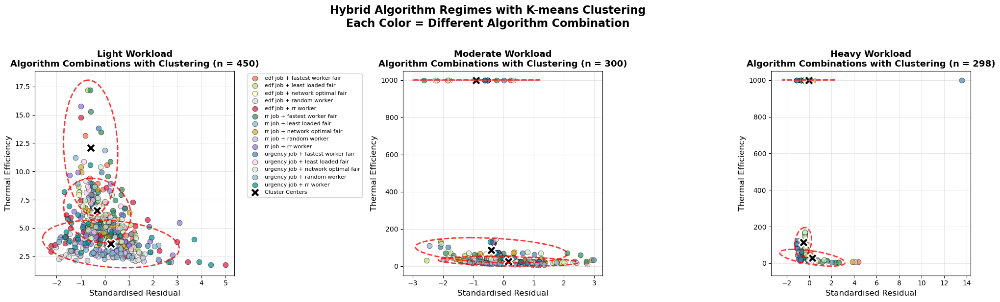


ALGORITHM PERFORMANCE ZONES ANALYSIS

LIGHT WORKLOAD - PERFORMANCE ZONES:
------------------------------------------------------------

Top-Left (Ideal): 14 points
  edf_job+network_optimal_fair        |  3 points | Avg: r=-1.06, e=  7.8
  rr_job+rr_worker                    |  3 points | Avg: r=-1.29, e=  8.7
  urgency_job+rr_worker               |  3 points | Avg: r=-1.43, e=  7.1

Left (Good Penalties): 43 points
  edf_job+random_worker               | 10 points | Avg: r=-1.58, e=  3.0
  edf_job+rr_worker                   |  9 points | Avg: r=-1.69, e=  4.0
  urgency_job+rr_worker               |  8 points | Avg: r=-1.39, e=  4.5

Top (Good Efficiency): 98 points
  rr_job+fastest_worker_fair          | 17 points | Avg: r=-0.09, e=  9.6
  urgency_job+fastest_worker_fair     | 14 points | Avg: r=-0.37, e=  8.1
  edf_job+fastest_worker_fair         | 13 points | Avg: r=-0.31, e=  8.5

Center-Bottom: 295 points
  edf_job+network_optimal_fair        | 27 points | Avg: r= 0.12, e=  4.5


In [46]:
# ====================================================================
# HYBRID ALGORITHM CLUSTERING WITH ALGORITHM-SPECIFIC COLORS
# ====================================================================

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Define specific colors for top-performing algorithm combinations
combo_colors = {
    'rr_job+fastest_worker_fair': '#2E8B57',      # Sea Green
    'rr_job+rr_worker': '#9370DB',               # Medium Purple  
    'edf_job+fastest_worker_fair': '#FF6347',     # Tomato
    'urgency_job+fastest_worker_fair': '#4682B4', # Steel Blue
    'rr_job+network_optimal_fair': '#DAA520',     # Goldenrod
    'edf_job+rr_worker': '#DC143C',              # Crimson
    'urgency_job+rr_worker': '#008B8B',          # Dark Cyan
    # Add more as needed - using distinct colors
}

# Generate colors for remaining combinations
def get_combo_color(combo):
    if combo in combo_colors:
        return combo_colors[combo]
    else:
        # Generate a consistent color based on hash
        hash_val = hash(combo) % 100
        return plt.cm.Set3(hash_val / 100.0)

for i, workload in enumerate(['light', 'moderate', 'heavy']):
    # Get data
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) == 0:
        axes[i].text(0.5, 0.5, f'No data for {workload}', 
                    transform=axes[i].transAxes, ha='center', va='center')
        continue
    
    # Plot each algorithm combination with its own color
    unique_combos = data['algorithm_combination'].unique()
    
    for combo in unique_combos:
        combo_data = data[data['algorithm_combination'] == combo]
        color = get_combo_color(combo)
        
        axes[i].scatter(combo_data['standardised_residual'], 
                       combo_data['thermal_efficiency'],
                       c=color, alpha=0.7, s=60, 
                       label=combo.replace('_', ' ').replace('+', ' + '),
                       edgecolors='black', linewidth=0.5)
    
    # Add K-means clustering if enough data
    if len(data) >= 6:  # Need at least 6 points for 3 clusters
        X = data[['standardised_residual', 'thermal_efficiency']].values
        
        # Try 3 clusters
        kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(X)
        centroids = kmeans.cluster_centers_
        
        # Plot cluster centroids
        axes[i].scatter(centroids[:, 0], centroids[:, 1], 
                       c='black', marker='X', s=200, 
                       edgecolors='white', linewidth=2,
                       label='Cluster Centers')
        
        # Add cluster boundaries (optional)
        from matplotlib.patches import Ellipse
        
        for cluster_id in range(3):
            cluster_points = X[cluster_labels == cluster_id]
            if len(cluster_points) >= 3:
                center = cluster_points.mean(axis=0)
                # Calculate covariance for ellipse
                cov = np.cov(cluster_points.T)
                eigenvals, eigenvecs = np.linalg.eigh(cov)
                angle = np.degrees(np.arctan2(eigenvecs[1, 0], eigenvecs[0, 0]))
                
                # 95% confidence ellipse
                width, height = 2 * np.sqrt(eigenvals * 5.991)  # 95% confidence
                
                ellipse = Ellipse(center, width, height, angle=angle,
                                facecolor='none', edgecolor='red', 
                                linewidth=2, linestyle='--', alpha=0.8)
                axes[i].add_patch(ellipse)
    
    # Formatting
    axes[i].set_xlabel('Standardised Residual', fontsize=12)
    axes[i].set_ylabel('Thermal Efficiency', fontsize=12)
    axes[i].set_title(f'{workload.title()} Workload\nAlgorithm Combinations with Clustering (n = {len(data)})', 
                     fontsize=13, fontweight='bold')
    axes[i].grid(True, alpha=0.3)
    
    # Only show legend for light workload to avoid clutter
    if i == 0:
        axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

plt.suptitle('Hybrid Algorithm Regimes with K-means Clustering\nEach Color = Different Algorithm Combination', 
             fontsize=16, fontweight='bold', y=1.02)

plt.tight_layout()
plt.savefig('./img_exports/step_3_hybrid_clustering_by_combination.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# ALGORITHM PERFORMANCE ZONES ANALYSIS
# ====================================================================

print("\n" + "="*80)
print("ALGORITHM PERFORMANCE ZONES ANALYSIS")
print("="*80)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['thermal_efficiency'] > 0)
    ]
    
    if len(data) == 0:
        continue
    
    print(f"\n{workload.upper()} WORKLOAD - PERFORMANCE ZONES:")
    print("-" * 60)
    
    # Define performance zones
    zones = {
        'Top-Left (Ideal)': (data['standardised_residual'] < -1) & (data['thermal_efficiency'] > data['thermal_efficiency'].quantile(0.75)),
        'Left (Good Penalties)': (data['standardised_residual'] < -1) & (data['thermal_efficiency'] <= data['thermal_efficiency'].quantile(0.75)),
        'Top (Good Efficiency)': (data['standardised_residual'] >= -1) & (data['thermal_efficiency'] > data['thermal_efficiency'].quantile(0.75)),
        'Center-Bottom': (data['standardised_residual'] >= -1) & (data['thermal_efficiency'] <= data['thermal_efficiency'].quantile(0.75))
    }
    
    for zone_name, zone_mask in zones.items():
        zone_data = data[zone_mask]
        if len(zone_data) > 0:
            print(f"\n{zone_name}: {len(zone_data)} points")
            # Show algorithm combinations in this zone
            combo_counts = zone_data['algorithm_combination'].value_counts()
            for combo, count in combo_counts.head(3).items():  # Top 3
                mean_residual = zone_data[zone_data['algorithm_combination'] == combo]['standardised_residual'].mean()
                mean_efficiency = zone_data[zone_data['algorithm_combination'] == combo]['thermal_efficiency'].mean()
                print(f"  {combo:<35} | {count:2d} points | Avg: r={mean_residual:5.2f}, e={mean_efficiency:5.1f}")

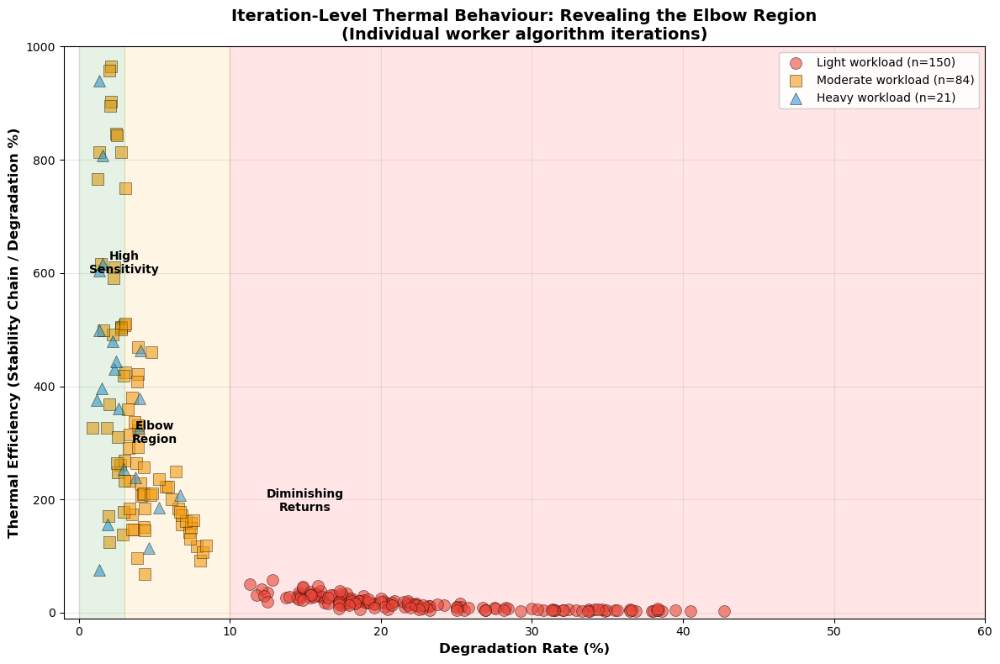


ITERATION-LEVEL THERMAL EFFICIENCY SUMMARY

LIGHT WORKLOAD:
  Total iterations: 150
  Algorithms: 5

  fastest_worker_fair:
    Avg TE: 28.01 ± 9.91
    Degradation: 16.1% ± 2.8%
    Stability: 4.3 ± 1.1

  least_loaded_fair:
    Avg TE: 19.79 ± 7.42
    Degradation: 19.9% ± 3.9%
    Stability: 3.7 ± 1.0

  network_optimal_fair:
    Avg TE: 22.33 ± 11.61
    Degradation: 19.8% ± 3.4%
    Stability: 4.1 ± 1.4

  random_worker:
    Avg TE: 4.39 ± 1.28
    Degradation: 35.5% ± 3.1%
    Stability: 1.5 ± 0.4

  rr_worker:
    Avg TE: 8.63 ± 5.00
    Degradation: 23.6% ± 5.5%
    Stability: 1.8 ± 0.7

MODERATE WORKLOAD:
  Total iterations: 100
  Algorithms: 5

  fastest_worker_fair:
    Avg TE: 490.36 ± 529.61
    Degradation: 2.8% ± 1.1%
    Stability: 10.8 ± 7.2

  least_loaded_fair:
    Avg TE: 356.47 ± 161.85
    Degradation: 3.5% ± 0.8%
    Stability: 11.8 ± 3.6

  network_optimal_fair:
    Avg TE: 423.07 ± 392.50
    Degradation: 2.8% ± 0.9%
    Stability: 10.0 ± 6.5

  random_worker:

In [47]:
# ====================================================================
# WORKER ALGORITHM ITERATION-LEVEL STABILITY CHAIN ANALYSIS
# ====================================================================

def analyse_worker_iteration_stability_chains(df_transitions):
    """analyse stability chains at iteration level"""
    
    chains = []
    
    for (workload, worker_algo, iteration, assigned_worker), group in df_transitions.groupby(
        ['workload_intensity', 'worker_algorithm', 'iteration_num', 'assigned_worker']
    ):
        transitions = group.sort_values('sequence_position')
        categories = transitions['category'].tolist()
        
        in_stability_chain = False
        chain_length = 0
        
        for i, cat in enumerate(categories):
            if cat == 'recovery':
                in_stability_chain = True
                chain_length = 0
            elif in_stability_chain:
                if cat == 'stability':
                    chain_length += 1
                elif cat == 'degradation':
                    if chain_length > 0:  # Only record non-zero chains
                        chains.append({
                            'workload_intensity': workload,
                            'worker_algorithm': worker_algo,
                            'iteration_num': iteration,
                            'assigned_worker': assigned_worker,
                            'chain_length': chain_length
                        })
                    in_stability_chain = False
                    chain_length = 0
    
    return pd.DataFrame(chains)

# analyse chains at iteration level
df_worker_iteration_chains = analyse_worker_iteration_stability_chains(df_transitions_fixed)

# Calculate iteration-level metrics
iteration_metrics = []

for (worker_algo, workload, iteration), group in df_transitions_fixed.groupby(
    ['worker_algorithm', 'workload_intensity', 'iteration_num']
):
    # Get chains for this iteration
    iteration_chains = df_worker_iteration_chains[
        (df_worker_iteration_chains['worker_algorithm'] == worker_algo) &
        (df_worker_iteration_chains['workload_intensity'] == workload) &
        (df_worker_iteration_chains['iteration_num'] == iteration)
    ]
    
    # Calculate degradation rate
    degradation_count = (group['category'] == 'degradation').sum()
    total_transitions = len(group)
    degradation_rate = (degradation_count / total_transitions * 100) if total_transitions > 0 else 0
    
    # Calculate average stability chain
    avg_chain = iteration_chains['chain_length'].mean() if len(iteration_chains) > 0 else 0
    
    # Calculate thermal efficiency
    if degradation_rate > 0:
        thermal_efficiency = avg_chain / degradation_rate * 100
    else:
        thermal_efficiency = 0 if avg_chain == 0 else 1000  # Cap at 1000 for no degradation
    
    iteration_metrics.append({
        'workload_intensity': workload,
        'worker_algorithm': worker_algo,
        'iteration_num': iteration,
        'avg_stability_chain': avg_chain,
        'max_stability_chain': iteration_chains['chain_length'].max() if len(iteration_chains) > 0 else 0,
        'total_chains': len(iteration_chains),
        'degradation_rate': degradation_rate,
        'degradation_count': degradation_count,
        'thermal_efficiency': thermal_efficiency
    })

df_worker_iteration_metrics = pd.DataFrame(iteration_metrics)

# Add log transformation for better visualization
df_worker_iteration_metrics['thermal_efficiency_log'] = np.log10(
    df_worker_iteration_metrics['thermal_efficiency'] + 1
)

# Save iteration-level metrics
df_worker_iteration_metrics.to_csv(
    './csv_exports/worker_iteration_stability_metrics.csv', 
    index=False
)

# ====================================================================
# VISUALIZATION: ITERATION-LEVEL THERMAL BEHAVIOUR
# ====================================================================

fig, ax = plt.subplots(figsize=(12, 8))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Plot individual iteration points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['thermal_efficiency'] > 0) &
        (df_worker_iteration_metrics['thermal_efficiency'] < 1000)  # Exclude extreme values
    ]
    
    if len(workload_data) > 0:
        ax.scatter(workload_data['degradation_rate'], 
                  workload_data['thermal_efficiency'],
                  s=100, alpha=0.6, 
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  label=f'{workload.title()} workload (n={len(workload_data)})',
                  edgecolors='black', linewidth=0.5)

# Enhanced styling
ax.set_xlabel('Degradation Rate (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Thermal Efficiency (Stability Chain / Degradation %)', fontsize=12, fontweight='bold')
ax.set_title('Iteration-Level Thermal Behaviour: Revealing the Elbow Region\n' + 
            '(Individual worker algorithm iterations)', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', framealpha=0.9)

# Focus on the interesting region
ax.set_ylim(-10, 1000)
ax.set_xlim(-1, 60)

# Highlight zones
ax.axvspan(0, 3, alpha=0.1, color='green', zorder=1)
ax.axvspan(3, 10, alpha=0.1, color='orange', zorder=1)
ax.axvspan(10, 60, alpha=0.1, color='red', zorder=1)

# Add zone labels
ax.text(3, 600, 'High\nSensitivity', ha='center', fontsize=10, fontweight='bold')
ax.text(5, 300, 'Elbow\nRegion', ha='center', fontsize=10, fontweight='bold')
ax.text(15, 180, 'Diminishing\nReturns', ha='center', fontsize=10, fontweight='bold')


plt.tight_layout()
plt.savefig('./img_exports/worker_iteration_thermal_elbow.png', 
           dpi=300, bbox_inches='tight')
plt.show()

# ====================================================================
# STATISTICAL SUMMARY
# ====================================================================

print("\n" + "="*60)
print("ITERATION-LEVEL THERMAL EFFICIENCY SUMMARY")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_worker_iteration_metrics[
        df_worker_iteration_metrics['workload_intensity'] == workload
    ]
    
    print(f"\n{workload.upper()} WORKLOAD:")
    print(f"  Total iterations: {len(data)}")
    print(f"  Algorithms: {data['worker_algorithm'].nunique()}")
    
    # Group by algorithm for summary
    for algo in sorted(data['worker_algorithm'].unique()):
        algo_data = data[data['worker_algorithm'] == algo]
        print(f"\n  {algo}:")
        print(f"    Avg TE: {algo_data['thermal_efficiency'].mean():.2f} ± {algo_data['thermal_efficiency'].std():.2f}")
        print(f"    Degradation: {algo_data['degradation_rate'].mean():.1f}% ± {algo_data['degradation_rate'].std():.1f}%")
        print(f"    Stability: {algo_data['avg_stability_chain'].mean():.1f} ± {algo_data['avg_stability_chain'].std():.1f}")

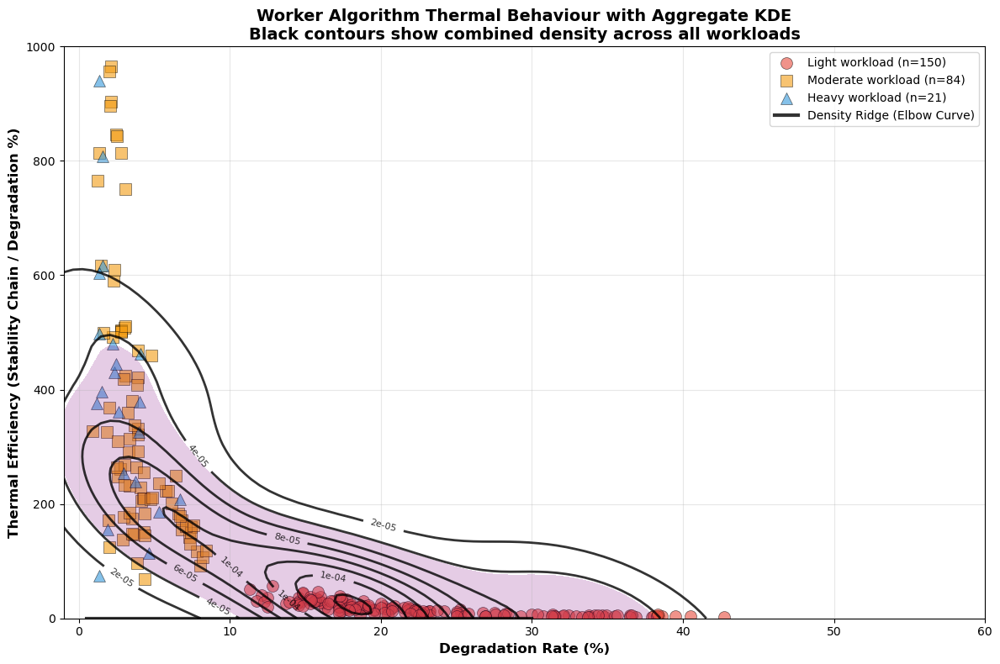

In [48]:
import numpy as np
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt

# Assuming df_worker_iteration_metrics is your DataFrame
fig, ax = plt.subplots(figsize=(12, 8))

# Define colours and markers
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_markers = {'light': 'o', 'moderate': 's', 'heavy': '^'}

# Collect all data for KDE
all_degradation = []
all_efficiency = []

# Plot individual iteration points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['thermal_efficiency'] > 0) &
        (df_worker_iteration_metrics['thermal_efficiency'] < 1000)
    ]
    
    if len(workload_data) > 0:
        ax.scatter(workload_data['degradation_rate'], 
                  workload_data['thermal_efficiency'],
                  s=100, alpha=0.6, 
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  label=f'{workload.title()} workload (n={len(workload_data)})',
                  edgecolors='black', linewidth=0.5)
        
        # Collect data for aggregate KDE
        all_degradation.extend(workload_data['degradation_rate'].values)
        all_efficiency.extend(workload_data['thermal_efficiency'].values)

# Create 2D KDE for all data combined
all_deg = np.array(all_degradation)
all_eff = np.array(all_efficiency)

# Create grid for KDE evaluation
x_min, x_max = -1, 60
y_min, y_max = 0, 1000
xx, yy = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

# Calculate KDE
kernel = gaussian_kde(np.vstack([all_deg, all_eff]))
f = np.reshape(kernel(positions).T, xx.shape)

# Plot KDE contours
contours = ax.contour(xx, yy, f, levels=8, colors='black', alpha=0.8, linewidths=2)
ax.clabel(contours, inline=True, fontsize=8, fmt='%.0e')

# Optional: Add filled contour for highest density region
ax.contourf(xx, yy, f, levels=[np.percentile(f.ravel(), 90), f.max()], 
           colors=['purple'], alpha=0.2)

# Add a smooth curve following the main density ridge
# Find the mode at each x position
ridge_line_y = []
ridge_line_x = np.linspace(0.5, 30, 100)
for x in ridge_line_x:
    idx = np.argmin(np.abs(xx[0, :] - x))
    ridge_line_y.append(yy[np.argmax(f[:, idx]), 0])

ax.plot(ridge_line_x, ridge_line_y, 'k-', linewidth=3, alpha=0.8, 
        label='Density Ridge (Elbow Curve)')

# Styling
ax.set_xlabel('Degradation Rate (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Thermal Efficiency (Stability Chain / Degradation %)', fontsize=12, fontweight='bold')
ax.set_title('Worker Algorithm Thermal Behaviour with Aggregate KDE\n' + 
            'Black contours show combined density across all workloads', 
            fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()

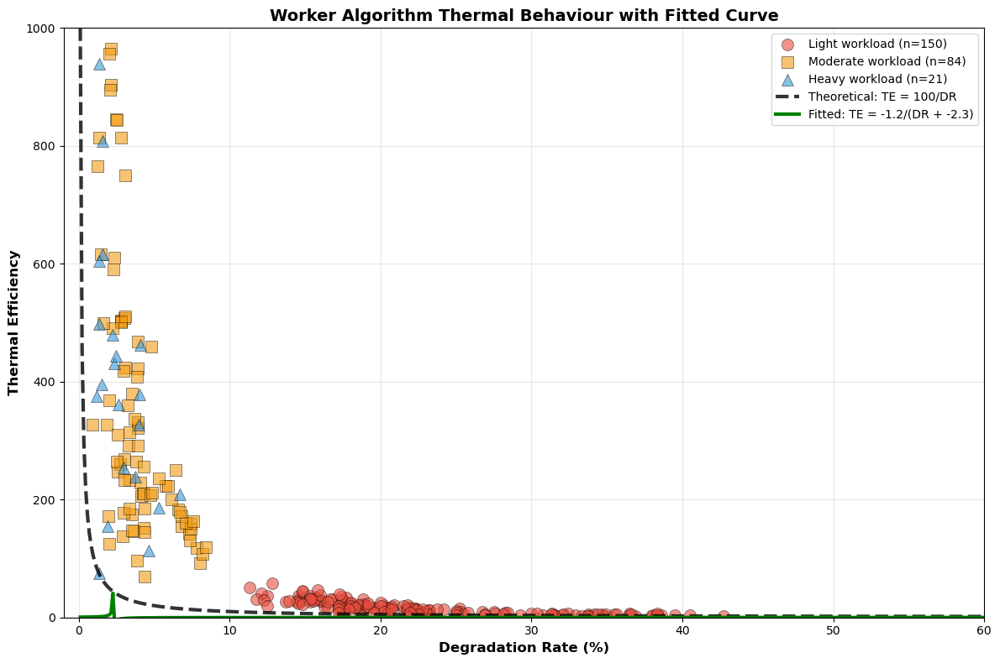

In [49]:
fig, ax = plt.subplots(figsize=(12, 8))

# Plot individual iteration points
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['thermal_efficiency'] > 0) &
        (df_worker_iteration_metrics['thermal_efficiency'] < 1000)
    ]
    
    if len(workload_data) > 0:
        ax.scatter(workload_data['degradation_rate'], 
                  workload_data['thermal_efficiency'],
                  s=100, alpha=0.6, 
                  c=workload_colours[workload],
                  marker=workload_markers[workload],
                  label=f'{workload.title()} workload (n={len(workload_data)})',
                  edgecolors='black', linewidth=0.5)

# Add the theoretical curve TE = k/DR
degradation_range = np.linspace(0.1, 60, 500)
# You can adjust the constant k based on your data
k = 100  # Example constant for Stability Chain
theoretical_te = k / degradation_range

ax.plot(degradation_range, theoretical_te, 'k--', linewidth=3, alpha=0.8,
        label=f'Theoretical: TE = {k}/DR')

# Or fit an actual curve to your data
from scipy.optimize import curve_fit

# Combine all data
all_data = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['thermal_efficiency'] > 0) &
    (df_worker_iteration_metrics['thermal_efficiency'] < 1000)
]

# Fit hyperbolic function
def hyperbolic(x, a, b):
    return a / (x + b)

popt, _ = curve_fit(hyperbolic, all_data['degradation_rate'], 
                    all_data['thermal_efficiency'])

fitted_te = hyperbolic(degradation_range, *popt)
ax.plot(degradation_range, fitted_te, 'g-', linewidth=3,
        label=f'Fitted: TE = {popt[0]:.1f}/(DR + {popt[1]:.1f})')

# Styling
ax.set_xlabel('Degradation Rate (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('Thermal Efficiency', fontsize=12, fontweight='bold')
ax.set_title('Worker Algorithm Thermal Behaviour with Fitted Curve', 
            fontsize=14, fontweight='bold')
ax.legend(loc='upper right')
ax.grid(True, alpha=0.3)
ax.set_xlim(-1, 60)
ax.set_ylim(0, 1000)

plt.tight_layout()
plt.show()

**Worker Algorithm Cross-Validation Analysis**

To validate our thermal efficiency findings, we performed a cross-validation analysis comparing thermal efficiency metrics against standardised residuals from our earlier penalty analysis. This approach tests whether algorithms identified as having unexpected cooling delays also exhibit poor thermal state management.

**Statistical Methodology**

We employed two complementary statistical techniques to examine the relationship between cooling delay residuals and thermal efficiency. First, we calculated the Pearson correlation coefficient (r) to measure the strength and direction of the linear relationship between these variables. The correlation coefficient ranges from -1 to +1, where values closer to -1 indicate a strong negative relationship, values near 0 suggest no linear relationship, and values approaching +1 indicate a strong positive relationship.

Second, we performed simple linear regression to quantify the relationship through the equation y = mx + b, where y represents thermal efficiency (calculated as average stability chain length divided by degradation rate), and x represents the standardised cooling delay residual. The standardised residual indicates how many standard deviations an algorithm's actual cooling delay differs from its expected value, with positive values indicating worse-than-expected performance and negative values indicating better-than-expected performance.

**Key Findings**

The analysis revealed strong negative correlations across workload intensities, with the most pronounced relationship in light workload (r = -0.825), followed by moderate workload (r = -0.798), and a weaker but still negative correlation in heavy workload (r = -0.385). These correlations confirm that algorithms with higher cooling delay residuals (worse than expected) consistently demonstrate lower thermal efficiency (poor stability management).

The regression analysis for light workload yielded the equation y = -0.072x + 0.119, indicating that for each standard deviation increase in cooling delay residual, thermal efficiency decreases by 0.072 units. The intercept of 0.119 represents the predicted thermal efficiency when an algorithm performs exactly as expected (residual = 0).

**Validation Implications**

This cross-validation strengthens our confidence in the thermal efficiency metric developed in Stage 9. The strong negative correlations demonstrate that our thermal stability analysis independently identifies the same problematic algorithms flagged by the residual analysis. Specifically, random_worker shows both high positive residuals (unexpected cooling delays) and extremely low thermal efficiency, while fastest_worker_fair exhibits negative residuals (better than expected) and the highest thermal efficiency.

The weakening correlation in heavy workload (r = -0.385) aligns with our earlier findings that system saturation effects dominate algorithm behaviour under high load conditions, reducing the discriminatory power of both metrics. This convergent evidence from two independent analyses validates thermal efficiency as a meaningful metric for algorithm evaluation in metaselection frameworks.

# Visualisation section -- stability chain vs degradation rate

## Get Iteraiton level transitions — Unfortunately I did only algo level earlier

In [50]:
# ====================================================================
# FIX: USE iteration_num INSTEAD OF iteration IN TRANSITIONS
# ====================================================================

def extract_thermal_transitions_corrected(df):
    """Extract thermal transitions using the correct iteration_num column"""
    transitions_list = []
    
    # Group by unique worker slot with iteration_num (not iteration)
    for (workload, algo_combo, iter_num, worker), group in df.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration_num', 'assigned_worker']
    ):
        # Sort by received time
        group = group.sort_values('received_time')
        
        # Extract thermal sequence
        thermal_sequence = group['warmth_state'].tolist()
        
        # Generate transitions
        if len(thermal_sequence) > 1:
            for i in range(len(thermal_sequence) - 1):
                transition = f"{thermal_sequence[i]}→{thermal_sequence[i+1]}"
                transitions_list.append({
                    'workload_intensity': workload,
                    'algorithm_combination': algo_combo,
                    'job_algorithm': algo_combo.split('+')[0],
                    'worker_algorithm': algo_combo.split('+')[1],
                    'iteration_num': iter_num,  # Using correct column
                    'assigned_worker': worker,
                    'transition': transition,
                    'sequence_position': i
                })
    
    return pd.DataFrame(transitions_list)

# Re-extract transitions with correct iteration column
print("Re-extracting transitions with iteration_num...")
df_transitions_fixed = extract_thermal_transitions_corrected(df_churn_analysis)
df_transitions_fixed['category'] = df_transitions_fixed['transition'].apply(classify_transition)

print(f"\nFixed transitions shape: {df_transitions_fixed.shape}")
print(f"Unique iterations: {sorted(df_transitions_fixed['iteration_num'].unique())}")

# Verify the distribution
print("\nTransitions by workload:")
for workload in ['light', 'moderate', 'heavy']:
    data = df_transitions_fixed[df_transitions_fixed['workload_intensity'] == workload]
    n_iters = data['iteration_num'].nunique()
    n_algos = data['algorithm_combination'].nunique()
    print(f"{workload}: {n_iters} iterations × {n_algos} algorithms = {len(data)} transitions")

# Replace the old df_transitions
df_transitions = df_transitions_fixed

Re-extracting transitions with iteration_num...

Fixed transitions shape: (106281, 9)
Unique iterations: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30)]

Transitions by workload:
light: 30 iterations × 15 algorithms = 13644 transitions
moderate: 20 iterations × 15 algorithms = 38373 transitions
heavy: 20 iterations × 15 algorithms = 54264 transitions


In [51]:
# ====================================================================
# RECALCULATE HYBRID CHAINS AND ITERATION METRICS WITH FIXED DATA
# ====================================================================

# First, re-run the hybrid chain analysis with corrected transitions
def analyse_hybrid_stability_chains_fixed(df_transitions):
    """analyse stability chains for hybrid algorithms with correct iterations"""
    
    chains = []
    
    for (workload, algo_combo, iter_num, assigned_worker), group in df_transitions.groupby(
        ['workload_intensity', 'algorithm_combination', 'iteration_num', 'assigned_worker']
    ):
        transitions = group.sort_values('sequence_position')
        categories = transitions['category'].tolist()
        
        in_stability_chain = False
        chain_length = 0
        
        for i, cat in enumerate(categories):
            if cat == 'recovery':
                in_stability_chain = True
                chain_length = 0
            elif in_stability_chain:
                if cat == 'stability':
                    chain_length += 1
                elif cat == 'degradation':
                    if chain_length > 0:
                        chains.append({
                            'workload_intensity': workload,
                            'algorithm_combination': algo_combo,
                            'job_algorithm': algo_combo.split('+')[0],
                            'worker_algorithm': algo_combo.split('+')[1],
                            'iteration_num': iter_num,
                            'assigned_worker': assigned_worker,
                            'chain_length': chain_length
                        })
                    in_stability_chain = False
                    chain_length = 0
    
    return pd.DataFrame(chains)

# analyse chains with fixed data
print("analysing hybrid stability chains with correct iterations...")
df_hybrid_chains_fixed = analyse_hybrid_stability_chains_fixed(df_transitions)
print(f"Total chains found: {len(df_hybrid_chains_fixed)}")

# Now calculate iteration-level metrics
def calculate_hybrid_iteration_metrics_container_level(df_transitions, df_chains):
    """Calculate metrics at container-iteration level"""
    
    iteration_metrics = []
    
    # Group by algorithm, workload, iteration, AND worker (container level)
    for (algo_combo, workload, iter_num, worker), group in df_transitions.groupby(
        ['algorithm_combination', 'workload_intensity', 'iteration_num', 'assigned_worker']
    ):
        # Get chains for this specific container
        container_chains = df_chains[
            (df_chains['algorithm_combination'] == algo_combo) &
            (df_chains['workload_intensity'] == workload) &
            (df_chains['iteration_num'] == iter_num) &
            (df_chains['assigned_worker'] == worker)
        ]
        
        # Calculate metrics
        degradation_count = (group['category'] == 'degradation').sum()
        total_transitions = len(group)
        degradation_rate = (degradation_count / total_transitions * 100) if total_transitions > 0 else 0
        avg_chain = container_chains['chain_length'].mean() if len(container_chains) > 0 else 0
        
        iteration_metrics.append({
            'workload_intensity': workload,
            'algorithm_combination': algo_combo,
            'job_algorithm': algo_combo.split('+')[0],
            'worker_algorithm': algo_combo.split('+')[1],
            'iteration_num': iter_num,
            'assigned_worker': worker,
            'avg_stability_chain': avg_chain,
            'degradation_rate': degradation_rate
        })
    
    return pd.DataFrame(iteration_metrics)

# Calculate hybrid iteration metrics
df_hybrid_iteration_final = calculate_hybrid_iteration_metrics_container_level(df_transitions, df_hybrid_chains_fixed)

print(f"\nHybrid iteration metrics shape: {df_hybrid_iteration_final.shape}")
print("Breakdown by workload:")
for wl in ['light', 'moderate', 'heavy']:
    data = df_hybrid_iteration_final[df_hybrid_iteration_final['workload_intensity'] == wl]
    n_iters = data['iteration_num'].nunique()
    n_workers = data['assigned_worker'].nunique()
    print(f"  {wl}: {len(data)} container-iterations ({n_iters} iterations × {n_workers} workers)")


analysing hybrid stability chains with correct iterations...
Total chains found: 1918

Hybrid iteration metrics shape: (3203, 8)
Breakdown by workload:
  light: 1110 container-iterations (30 iterations × 4 workers)
  moderate: 998 container-iterations (20 iterations × 4 workers)
  heavy: 1095 container-iterations (20 iterations × 4 workers)


## Algorithm Level

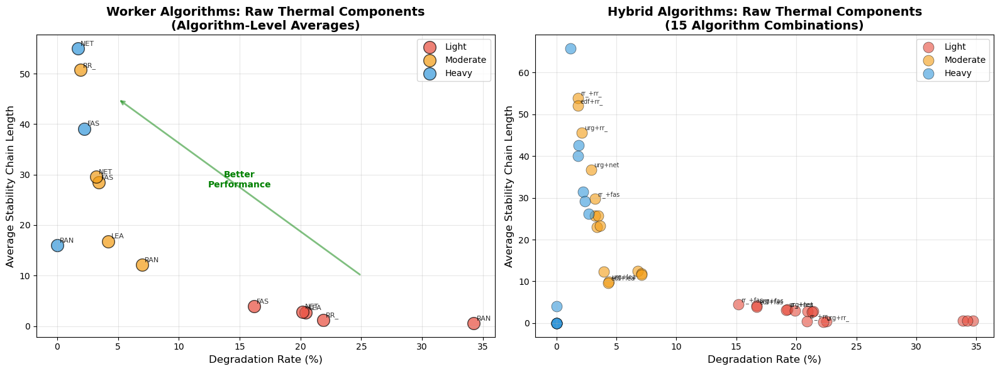

In [52]:
# ====================================================================
# OPTION 1: ALGORITHM-LEVEL - STABILITY CHAIN VS DEGRADATION RATE
# ====================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Define colours
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}

# WORKER ALGORITHMS (left plot)
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_chain_metrics[
        df_worker_chain_metrics['workload_intensity'] == workload
    ]
    
    ax1.scatter(workload_data['degradation_rate'], 
               workload_data['avg_stability_chain'],
               s=200, alpha=0.7, 
               c=workload_colours[workload],
               edgecolors='black', linewidth=1,
               label=f'{workload.title()}')
    
    # Add algorithm labels
    for idx, row in workload_data.iterrows():
        ax1.annotate(row['worker_algorithm'][:3].upper(),  # Abbreviated names
                    (row['degradation_rate'], row['avg_stability_chain']),
                    xytext=(3, 3), textcoords='offset points', 
                    fontsize=8, alpha=0.8)

ax1.set_xlabel('Degradation Rate (%)', fontsize=12)
ax1.set_ylabel('Average Stability Chain Length', fontsize=12)
ax1.set_title('Worker Algorithms: Raw Thermal Components\n(Algorithm-Level Averages)', 
             fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend()

# Add ideal direction arrow
ax1.annotate('', xy=(5, 45), xytext=(25, 10),
            arrowprops=dict(arrowstyle='->', lw=2, color='green', alpha=0.5))
ax1.text(15, 27.5, 'Better\nPerformance', fontsize=10, color='green', 
         ha='center', fontweight='bold')

# HYBRID ALGORITHMS (right plot)
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_hybrid_chain_metrics_complete[
        df_hybrid_chain_metrics_complete['workload_intensity'] == workload
    ]
    
    # Plot all points but only label extremes
    ax2.scatter(workload_data['degradation_rate'], 
               workload_data['avg_stability_chain'],
               s=150, alpha=0.6, 
               c=workload_colours[workload],
               edgecolors='black', linewidth=0.5,
               label=f'{workload.title()}')
    
    # Label only extreme points to avoid clutter
    if workload == 'light' or workload == 'moderate':  # Only label light workload extremes
        extremes = workload_data.nlargest(5, 'avg_stability_chain').index.tolist() + \
                   workload_data.nsmallest(2, 'avg_stability_chain').index.tolist()
        
        for idx in extremes:
            row = workload_data.loc[idx]
            label = f"{row['job_algorithm'][:3]}+{row['worker_algorithm'][:3]}"
            ax2.annotate(label,
                        (row['degradation_rate'], row['avg_stability_chain']),
                        xytext=(3, 3), textcoords='offset points', 
                        fontsize=7, alpha=0.8)

ax2.set_xlabel('Degradation Rate (%)', fontsize=12)
ax2.set_ylabel('Average Stability Chain Length', fontsize=12)
ax2.set_title('Hybrid Algorithms: Raw Thermal Components\n(15 Algorithm Combinations)', 
             fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.savefig('./img_exports/option1_algorithm_level_raw_components.png', dpi=300)
plt.show()

### Iteration Level

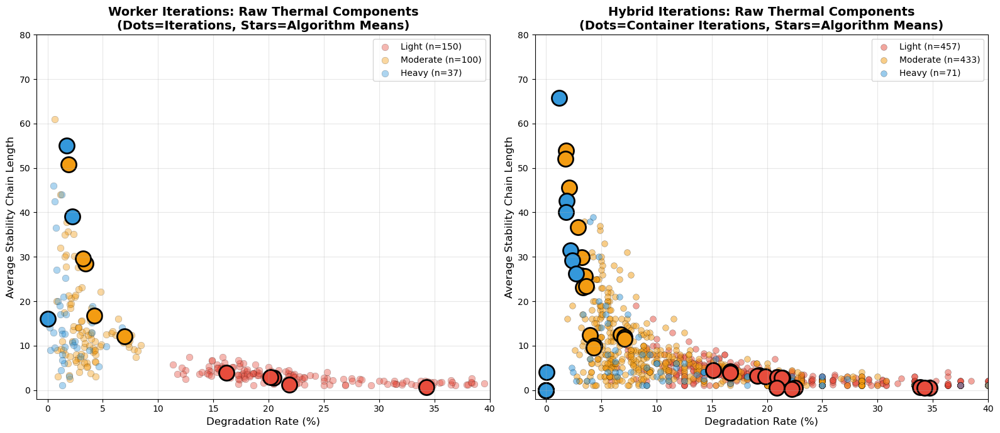

Worker iterations: 350
Hybrid iterations: 3203


In [53]:
# ====================================================================
# OPTION 1: ITERATION-LEVEL - STABILITY CHAIN VS DEGRADATION RATE (FIXED)
# ====================================================================

# Create the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Define colors
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}

# WORKER ITERATIONS (left plot)
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['avg_stability_chain'] > 0)  # Exclude zero chains
    ]
    
    if len(workload_data) > 0:
        ax1.scatter(workload_data['degradation_rate'], 
                   workload_data['avg_stability_chain'],
                   s=60, alpha=0.4, 
                   c=workload_colours[workload],
                   edgecolors='black', linewidth=0.3,
                   label=f'{workload.title()} (n={len(workload_data)})')

# Add algorithm means as larger points
for workload in ['light', 'moderate', 'heavy']:
    algo_means = df_worker_chain_metrics[
        df_worker_chain_metrics['workload_intensity'] == workload
    ]
    ax1.scatter(algo_means['degradation_rate'], 
               algo_means['avg_stability_chain'],
               s=300, marker='o',
               c=workload_colours[workload], 
               edgecolors='black', 
               linewidth=2, alpha=1)

ax1.set_xlabel('Degradation Rate (%)', fontsize=12)
ax1.set_ylabel('Average Stability Chain Length', fontsize=12)
ax1.set_title('Worker Iterations: Raw Thermal Components\n(Dots=Iterations, Stars=Algorithm Means)', 
             fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend()
ax1.set_xlim(-1, 40)
ax1.set_ylim(-2, 80)

# HYBRID ITERATIONS (right plot) - Using df_hybrid_iteration_final
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_hybrid_iteration_final[
        (df_hybrid_iteration_final['workload_intensity'] == workload) &
        (df_hybrid_iteration_final['avg_stability_chain'] > 0)
    ]
    
    if len(workload_data) > 0:
        ax2.scatter(workload_data['degradation_rate'], 
                  workload_data['avg_stability_chain'],
                  s=50, alpha=0.5,
                  c=workload_colours[workload],
                  edgecolors='black', linewidth=0.3,
                  label=f'{workload.title()} (n={len(workload_data)})')

# Add algorithm means
for workload in ['light', 'moderate', 'heavy']:
    algo_means = df_hybrid_chain_metrics_complete[
        df_hybrid_chain_metrics_complete['workload_intensity'] == workload
    ]
    ax2.scatter(algo_means['degradation_rate'], 
               algo_means['avg_stability_chain'],
               s=300, marker='o',
               c=workload_colours[workload], 
               edgecolors='black', 
               linewidth=2, alpha=1)

ax2.set_xlabel('Degradation Rate (%)', fontsize=12)
ax2.set_ylabel('Average Stability Chain Length', fontsize=12)
ax2.set_title('Hybrid Iterations: Raw Thermal Components\n(Dots=Container Iterations, Stars=Algorithm Means)', 
             fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.legend()
ax2.set_xlim(-1, 40)
ax2.set_ylim(-2, 80)

plt.tight_layout()
plt.savefig('./img_exports/option1_iteration_level_raw_components.png', dpi=300)
plt.show()

print(f"Worker iterations: {len(df_worker_iteration_metrics)}")
print(f"Hybrid iterations: {len(df_hybrid_iteration_final)}")

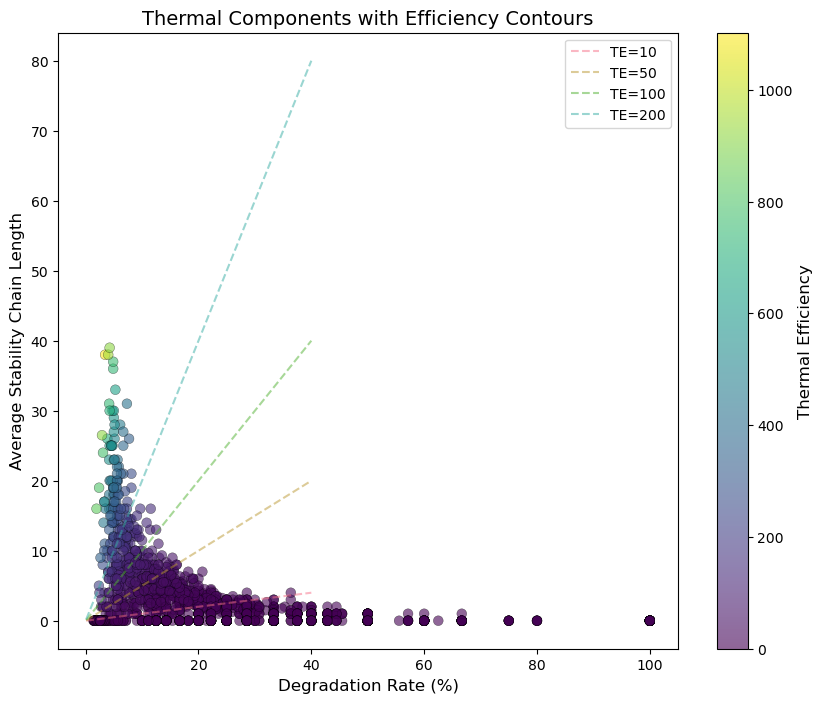

In [54]:
# Calculate TE for each point and use as color
df_hybrid_iteration_final['thermal_efficiency'] = (
    df_hybrid_iteration_final['avg_stability_chain'] / 
    df_hybrid_iteration_final['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

# Plot with TE color scale
fig, ax = plt.subplots(figsize=(10, 8))

scatter = ax.scatter(
    df_hybrid_iteration_final['degradation_rate'],
    df_hybrid_iteration_final['avg_stability_chain'],
    c=df_hybrid_iteration_final['thermal_efficiency'],
    cmap='viridis',
    s=50,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.3
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Thermal Efficiency', fontsize=12)

# Add contour lines for constant TE values
# TE = stability/degradation, so stability = TE * degradation
degradation_range = np.linspace(0.1, 40, 100)
for te_value in [10, 50, 100, 200]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--', 
            alpha=0.5, label=f'TE={te_value}')

ax.set_xlabel('Degradation Rate (%)', fontsize=12)
ax.set_ylabel('Average Stability Chain Length', fontsize=12)
ax.set_title('Thermal Components with Efficiency Contours', fontsize=14)
ax.legend()
plt.show()

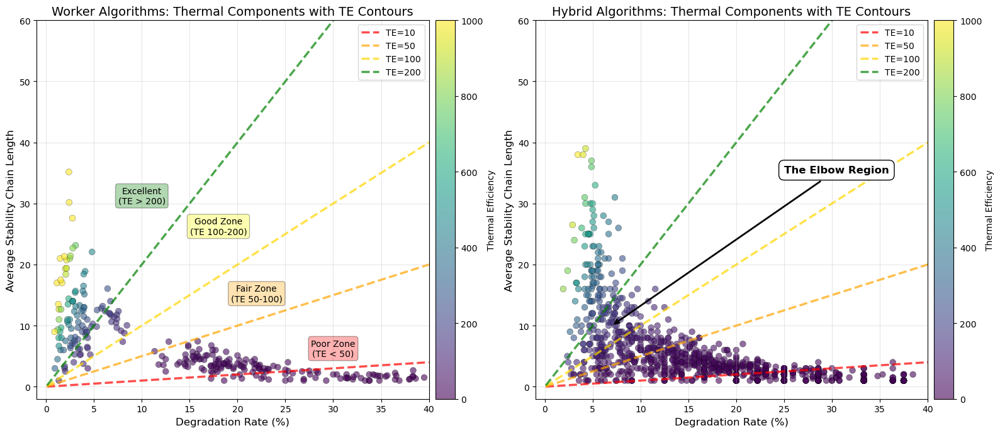


Data distribution relative to TE zones:

Worker:
  Poor (TE<50): 146 (55.5%)
  Fair (50-100): 6 (2.3%)
  Good (100-200): 27 (10.3%)
  Excellent (>200): 84 (31.9%)

Hybrid:
  Poor (TE<50): 569 (63.3%)
  Fair (50-100): 127 (14.1%)
  Good (100-200): 97 (10.8%)
  Excellent (>200): 106 (11.8%)


In [55]:
# Create cleaner plots without confusing backgrounds
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# WORKER PLOT (left)
worker_filtered = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['thermal_efficiency'] < 1500) &
    (df_worker_iteration_metrics['degradation_rate'] < 40) &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0)
]

scatter1 = ax1.scatter(
    worker_filtered['degradation_rate'],
    worker_filtered['avg_stability_chain'],
    c=worker_filtered['thermal_efficiency'],
    cmap='viridis',
    s=50,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.3,
    vmin=0, vmax=1000
)

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider1 = make_axes_locatable(ax1)
cax1 = divider1.append_axes("right", size="5%", pad=0.1)
cbar1 = plt.colorbar(scatter1, cax=cax1)
cbar1.set_label('Thermal Efficiency', fontsize=10)

# Add contour lines with labels
degradation_range = np.linspace(0.1, 40, 100)
colors = ['red', 'orange', 'gold', 'green']
for te_value, color in zip([10, 50, 100, 200], colors):
    stability_values = te_value * degradation_range / 100
    ax1.plot(degradation_range, stability_values, '--', 
            alpha=0.7, linewidth=2.5, color=color, label=f'TE={te_value}')

# Add zone labels between contours
ax1.text(30, 5, 'Poor Zone\n(TE < 50)', fontsize=10, ha='center', 
         bbox=dict(boxstyle="round,pad=0.3", facecolor='red', alpha=0.3))
ax1.text(22, 14, 'Fair Zone\n(TE 50-100)', fontsize=10, ha='center',
         bbox=dict(boxstyle="round,pad=0.3", facecolor='orange', alpha=0.3))
ax1.text(18, 25, 'Good Zone\n(TE 100-200)', fontsize=10, ha='center',
         bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.3))
ax1.text(10, 30, 'Excellent\n(TE > 200)', fontsize=10, ha='center',
         bbox=dict(boxstyle="round,pad=0.3", facecolor='green', alpha=0.3))

ax1.set_xlabel('Degradation Rate (%)', fontsize=12)
ax1.set_ylabel('Average Stability Chain Length', fontsize=12)
ax1.set_title('Worker Algorithms: Thermal Components with TE Contours', fontsize=14)
ax1.legend(loc='upper right')
ax1.grid(True, alpha=0.3)
ax1.set_xlim(-1, 40)
ax1.set_ylim(-2, 60)

# HYBRID PLOT (right) - same structure
hybrid_filtered = df_hybrid_iteration_final[
    (df_hybrid_iteration_final['thermal_efficiency'] < 1500) &
    (df_hybrid_iteration_final['degradation_rate'] < 40) &
    (df_hybrid_iteration_final['avg_stability_chain'] > 0)
]

scatter2 = ax2.scatter(
    hybrid_filtered['degradation_rate'],
    hybrid_filtered['avg_stability_chain'],
    c=hybrid_filtered['thermal_efficiency'],
    cmap='viridis',
    s=50,
    alpha=0.6,
    edgecolors='black',
    linewidth=0.3,
    vmin=0, vmax=1000
)

# Add contour lines
for te_value, color in zip([10, 50, 100, 200], colors):
    stability_values = te_value * degradation_range / 100
    ax2.plot(degradation_range, stability_values, '--', 
            alpha=0.7, linewidth=2.5, color=color, label=f'TE={te_value}')

# Add the elbow annotation
ax2.annotate('The Elbow Region', xy=(7, 10), xytext=(25, 35),
            arrowprops=dict(arrowstyle='->', lw=2, color='black'),
            fontsize=12, fontweight='bold',
            bbox=dict(boxstyle="round,pad=0.5", facecolor='white', edgecolor='black'))

ax2.set_xlabel('Degradation Rate (%)', fontsize=12)
ax2.set_ylabel('Average Stability Chain Length', fontsize=12)
ax2.set_title('Hybrid Algorithms: Thermal Components with TE Contours', fontsize=14)
ax2.legend(loc='upper right')
ax2.grid(True, alpha=0.3)
ax2.set_xlim(-1, 40)
ax2.set_ylim(-2, 60)


# Add colorbar just for hybrid plot
divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("right", size="5%", pad=0.1)
cbar2 = plt.colorbar(scatter2, cax=cax2)
cbar2.set_label('Thermal Efficiency', fontsize=10)

plt.tight_layout()
plt.show()

# Show where most data falls
print("\nData distribution relative to TE zones:")
for name, data in [("Worker", worker_filtered), ("Hybrid", hybrid_filtered)]:
    print(f"\n{name}:")
    poor = len(data[data['thermal_efficiency'] < 50])
    fair = len(data[(data['thermal_efficiency'] >= 50) & (data['thermal_efficiency'] < 100)])
    good = len(data[(data['thermal_efficiency'] >= 100) & (data['thermal_efficiency'] < 200)])
    excellent = len(data[data['thermal_efficiency'] >= 200])
    total = len(data)
    
    print(f"  Poor (TE<50): {poor} ({poor/total*100:.1f}%)")
    print(f"  Fair (50-100): {fair} ({fair/total*100:.1f}%)")
    print(f"  Good (100-200): {good} ({good/total*100:.1f}%)")
    print(f"  Excellent (>200): {excellent} ({excellent/total*100:.1f}%)")

### Learning:
First we ploted the stability chain relationship to the degradation relationship. Then we looked at hte contours (explain how that's done -- i'm not sure what you did) where each iteration level datapoint of thermal efficiency plots against the scatter plot. We noticed that the heavy tend to be too far up (not ideal) and light (too far down). We notice teh elbow presents some sort of turning point where each additional chain lenght results in less degradation. That's where we want to be at.

## Slide visualisation for TE corrected (PHEW)

#### SLIDE 58

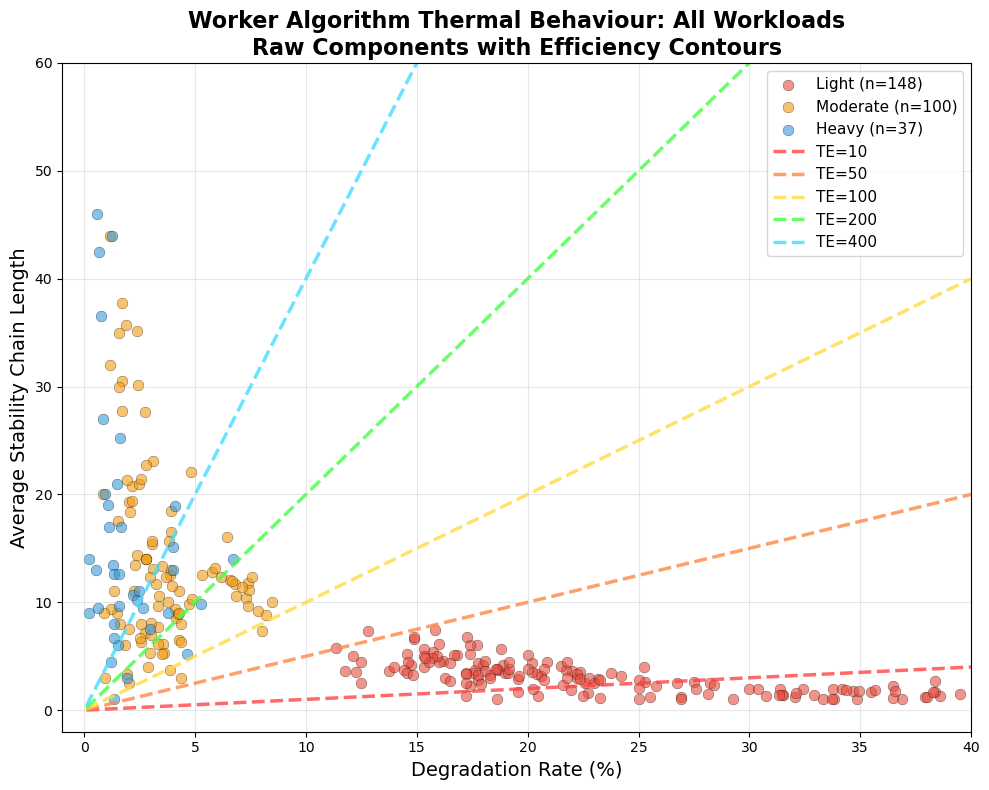

In [56]:
# Overall worker data points with TE contours (no color scale, just workload colors)
fig, ax = plt.subplots(figsize=(10, 8))

workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}

# Plot all workloads
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
        (df_worker_iteration_metrics['degradation_rate'] < 40)
    ]
    
    ax.scatter(workload_data['degradation_rate'], 
              workload_data['avg_stability_chain'],
              c=workload_colours[workload],
              s=60, alpha=0.6,
              edgecolors='black', linewidth=0.3,
              label=f'{workload.title()} (n={len(workload_data)})')

# Add TE contour lines
degradation_range = np.linspace(0.1, 40, 100)
for te_value, color in [(10, '#ff4444'), (50, '#ff8844'), 
                        (100, '#ffdd44'), (200, '#44ff44'),
                        (400, '#44ddff')]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2.5, alpha=0.8,
            label=f'TE={te_value}')

ax.set_xlabel('Degradation Rate (%)', fontsize=14)
ax.set_ylabel('Average Stability Chain Length', fontsize=14)
ax.set_title('Worker Algorithm Thermal Behaviour: All Workloads\nRaw Components with Efficiency Contours', 
            fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=11)
ax.set_xlim(-1, 40)
ax.set_ylim(-2, 60)

plt.tight_layout()
plt.savefig('./img_exports/slide58_worker_overall_te_contours.png', dpi=300)
plt.show()

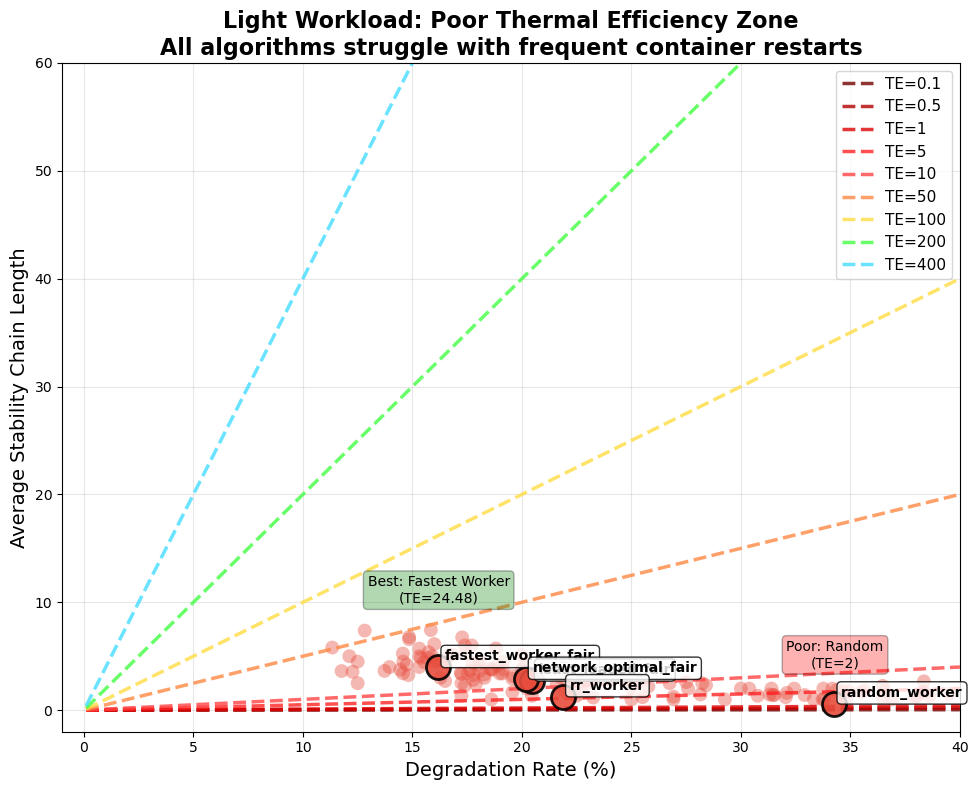

In [57]:
# Slide 59 - Light workload with iteration data

fig, ax = plt.subplots(figsize=(10, 8))

# First, plot iteration-level data as faint background
light_iterations = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'light') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(light_iterations['degradation_rate'],
           light_iterations['avg_stability_chain'],
           c='#e74c3c', s=100, alpha=0.4,  # Small, faint dots
           edgecolors='none')  # No edges for cleaner look

# Then plot algorithm-level averages on top
light_algo = df_worker_chain_metrics[
    df_worker_chain_metrics['workload_intensity'] == 'light'
]

ax.scatter(light_algo['degradation_rate'],
           light_algo['avg_stability_chain'],
           c='#e74c3c', s=300, alpha=0.9,
           edgecolors='black', linewidth=2,
           zorder=10)  # Ensure these are on top

# Add algorithm labels
for idx, row in light_algo.iterrows():
    ax.annotate(row['worker_algorithm'],
                (row['degradation_rate'], row['avg_stability_chain']),
                xytext=(5, 5), textcoords='offset points',
                fontsize=10, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3",
                          facecolor='white', alpha=0.8),
                zorder=11)

# Add TE contour lines
degradation_range = np.linspace(0.1, 40, 100)
for te_value, color in [(0.1, "#730000"), (0.5, "#b30000"),
                        (1, "#de0404"), (5, "#ff2323"), 
                        (10,'#ff4444'), (50, '#ff8844'),
                        (100, '#ffdd44'), (200, '#44ff44'),
                        (400, '#44ddff')]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2.5, alpha=0.8,
            label=f'TE={te_value}')

# Highlight annotations
ax.text(34.3, 4, 'Poor: Random\n(TE=2)', ha='center', fontsize=10,
        bbox=dict(boxstyle="round,pad=0.3", facecolor='red', alpha=0.3))

ax.text(16.2, 10, 'Best: Fastest Worker\n(TE=24.48)', ha='center', fontsize=10,
        bbox=dict(boxstyle="round,pad=0.3", facecolor='green', alpha=0.3))

ax.set_xlabel('Degradation Rate (%)', fontsize=14)
ax.set_ylabel('Average Stability Chain Length', fontsize=14)
ax.set_title('Light Workload: Poor Thermal Efficiency Zone\nAll algorithms struggle with frequent container restarts',
             fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=11)
ax.set_xlim(-1, 40)
ax.set_ylim(-2, 60)

plt.tight_layout()
plt.savefig('./img_exports/slide59_light_worker_algos.png', dpi=300)
plt.show()

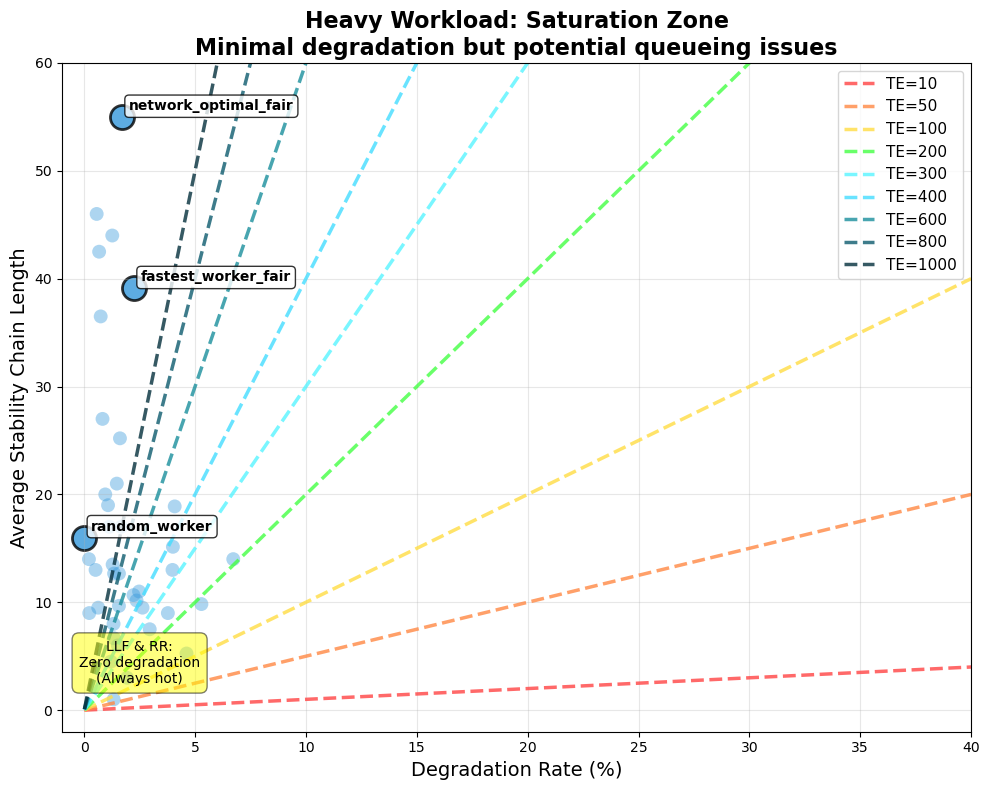

In [58]:
# Slide 60

# Heavy workload focus
fig, ax = plt.subplots(figsize=(10, 8))


# First, plot iteration-level data as faint background
heavy_iterations = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'heavy') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(heavy_iterations['degradation_rate'],
           heavy_iterations['avg_stability_chain'],
           c='#3498db', s=100, alpha=0.4,  # Small, faint dots
           edgecolors='none')  # No edges for cleaner look

# Get heavy workload algorithm-level data
heavy_algo = df_worker_chain_metrics[
    df_worker_chain_metrics['workload_intensity'] == 'heavy'
]

# Plot algorithm points
ax.scatter(heavy_algo['degradation_rate'], 
          heavy_algo['avg_stability_chain'],
          c='#3498db', s=300, alpha=0.8,
          edgecolors='black', linewidth=2)

# Add labels
for idx, row in heavy_algo.iterrows():
    if row['degradation_rate'] > 0:  # Only label algorithms with degradation
        ax.annotate(row['worker_algorithm'],
                   (row['degradation_rate'], row['avg_stability_chain']),
                   xytext=(5, 5), textcoords='offset points',
                   fontsize=10, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", 
                            facecolor='white', alpha=0.8))

# Add note about zero degradation algorithms
ax.text(2.5, 2.5, 'LLF & RR:\nZero degradation\n(Always hot)', 
        fontsize=10, ha='center',
        bbox=dict(boxstyle="round,pad=0.5", facecolor='yellow', alpha=0.5))

# TE contours
degradation_range = np.linspace(0.01, 40, 100)
for te_value, color in [(10,'#ff4444'), (50, '#ff8844'),
                        (100, '#ffdd44'), (200, '#44ff44'),
                        (300, "#58f4ff"), (400, '#44ddff'),
                        (600, "#1a8f9c"), (800, "#0d5b6e"), (1000, "#042f3c")]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2.5, alpha=0.8,
            label=f'TE={te_value}')

ax.set_xlabel('Degradation Rate (%)', fontsize=14)
ax.set_ylabel('Average Stability Chain Length', fontsize=14)
ax.set_title('Heavy Workload: Saturation Zone\nMinimal degradation but potential queueing issues', 
            fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=11)
ax.set_xlim(-1, 40)
ax.set_ylim(-2, 60)

plt.tight_layout()
plt.savefig('./img_exports/slide61_heavy_worker_algos.png', dpi=300)
plt.show()

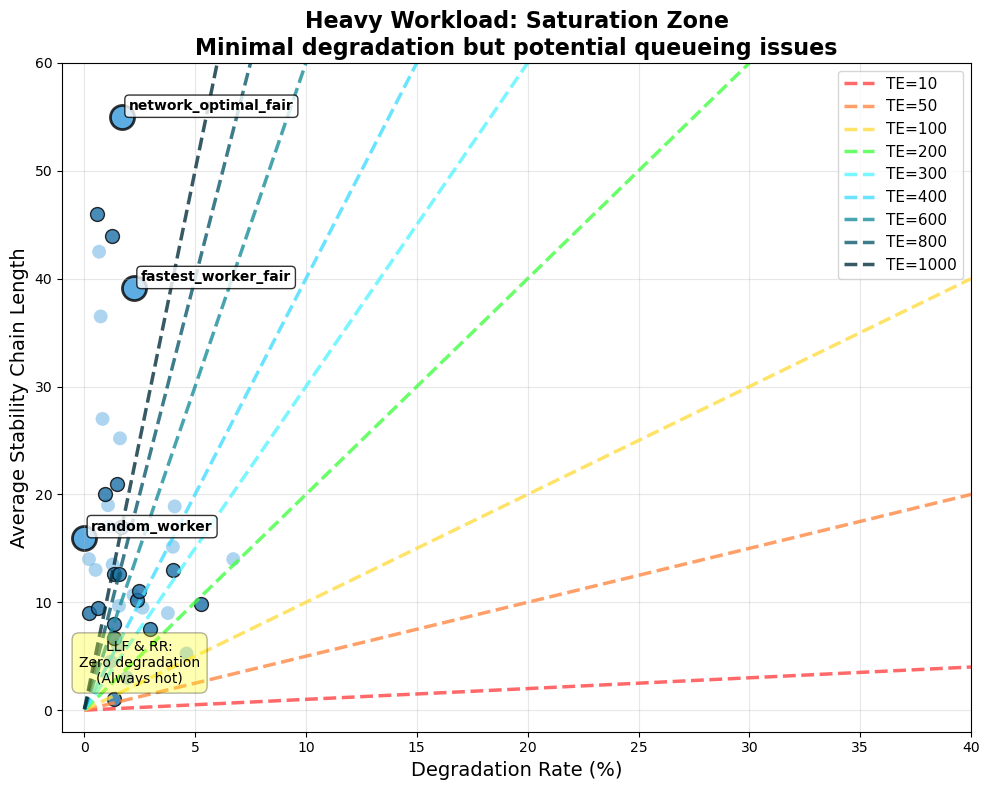

In [59]:
# Slide 60

# Heavy workload focus
fig, ax = plt.subplots(figsize=(10, 8))

# First, plot non-nof iteration data as background
heavy_iterations_non_nof = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'heavy') &
    (df_worker_iteration_metrics['worker_algorithm'] != 'network_optimal_fair') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(heavy_iterations_non_nof['degradation_rate'],
           heavy_iterations_non_nof['avg_stability_chain'],
           c='#3498db', s=100, alpha=0.4,
           edgecolors='none')

# Highlight NOF worker iterations
heavy_iterations_nof = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'heavy') &
    (df_worker_iteration_metrics['worker_algorithm'] == 'network_optimal_fair') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(heavy_iterations_nof['degradation_rate'],
           heavy_iterations_nof['avg_stability_chain'],
           c="#1b6fa6", s=100, alpha=0.8,
           edgecolors='black', linewidth=1,  # Black border for RR
           zorder=2)

# Get moderate workload algorithm-level data
moderate_algo = df_worker_chain_metrics[
    df_worker_chain_metrics['workload_intensity'] == 'moderate'
]


# Plot algorithm points
ax.scatter(heavy_algo['degradation_rate'], 
          heavy_algo['avg_stability_chain'],
          c='#3498db', s=300, alpha=0.8,
          edgecolors='black', linewidth=2)


# Add labels
for idx, row in heavy_algo.iterrows():
    if row['degradation_rate'] > 0:  # Only label algorithms with degradation
        ax.annotate(row['worker_algorithm'],
                   (row['degradation_rate'], row['avg_stability_chain']),
                   xytext=(5, 5), textcoords='offset points',
                   fontsize=10, fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", 
                            facecolor='white', alpha=0.8))

# Add note about zero degradation algorithms
ax.text(2.5, 2.5, 'LLF & RR:\nZero degradation\n(Always hot)', 
        fontsize=10, ha='center',
        bbox=dict(boxstyle="round,pad=0.5", facecolor='yellow', alpha=0.3))

# TE contours
degradation_range = np.linspace(0.01, 40, 100)
for te_value, color in [(10,'#ff4444'), (50, '#ff8844'),
                        (100, '#ffdd44'), (200, '#44ff44'),
                        (300, "#58f4ff"), (400, '#44ddff'),
                        (600, "#1a8f9c"), (800, "#0d5b6e"), (1000, "#042f3c")]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2.5, alpha=0.8,
            label=f'TE={te_value}')

ax.set_xlabel('Degradation Rate (%)', fontsize=14)
ax.set_ylabel('Average Stability Chain Length', fontsize=14)
ax.set_title('Heavy Workload: Saturation Zone\nMinimal degradation but potential queueing issues', 
            fontsize=16, fontweight='bold', zorder=5)
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=11)
ax.set_xlim(-1, 40)
ax.set_ylim(-2, 60)

plt.tight_layout()
plt.savefig('./img_exports/slide61_heavy_worker_algos_with_nof.png', dpi=300)
plt.show()

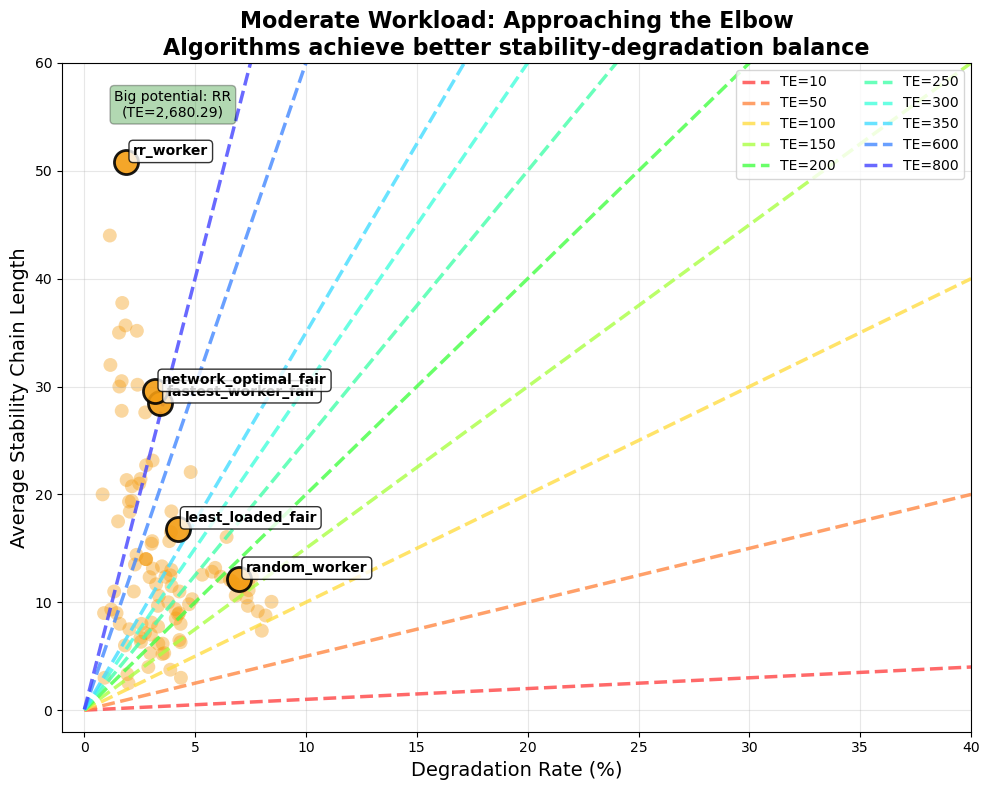

In [60]:
# Slide 61: Moderate

# Moderate workload focus with iteration data
fig, ax = plt.subplots(figsize=(10, 8))

# First, plot iteration-level data as background
moderate_iterations = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'moderate') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(moderate_iterations['degradation_rate'],
           moderate_iterations['avg_stability_chain'],
           c='#f39c12', s=100, alpha=0.4,
           edgecolors='none')

# Get moderate workload algorithm-level data
moderate_algo = df_worker_chain_metrics[
    df_worker_chain_metrics['workload_intensity'] == 'moderate'
]

# Plot algorithm points
ax.scatter(moderate_algo['degradation_rate'], 
          moderate_algo['avg_stability_chain'],
          c='#f39c12', s=300, alpha=0.9,
          edgecolors='black', linewidth=2,
          zorder=10)

# Add algorithm labels
for idx, row in moderate_algo.iterrows():
    ax.annotate(row['worker_algorithm'],
               (row['degradation_rate'], row['avg_stability_chain']),
               xytext=(5, 5), textcoords='offset points',
               fontsize=10, fontweight='bold',
               bbox=dict(boxstyle="round,pad=0.3", 
                        facecolor='white', alpha=0.8),
               zorder=11)

# TE contours - expanded range for moderate
degradation_range = np.linspace(0.01, 40, 100)
for te_value, color in [(10,'#ff4444'), (50, '#ff8844'),
                        (100, '#ffdd44'), (150, '#aaff44'),
                        (200, '#44ff44'), (250, '#44ffaa'),
                        (300, '#44ffdd'), (350, '#44ddff'),
                        (600, '#4488ff'), (800, '#4444ff')]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2.5, alpha=0.8,
            label=f'TE={te_value}')

# Highlight the sweet spot
ax.text(4, 55, 'Big potential: RR\n(TE=2,680.29)', ha='center', fontsize=10,
        bbox=dict(boxstyle="round,pad=0.3", facecolor='green', alpha=0.3))

ax.set_xlabel('Degradation Rate (%)', fontsize=14)
ax.set_ylabel('Average Stability Chain Length', fontsize=14)
ax.set_title('Moderate Workload: Approaching the Elbow\nAlgorithms achieve better stability-degradation balance', 
            fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=10, ncol=2)  # Two columns for many items
ax.set_xlim(-1, 40)
ax.set_ylim(-2, 60)

plt.tight_layout()
plt.savefig('./img_exports/slide60_moderate_worker_algos.png', dpi=300)
plt.show()

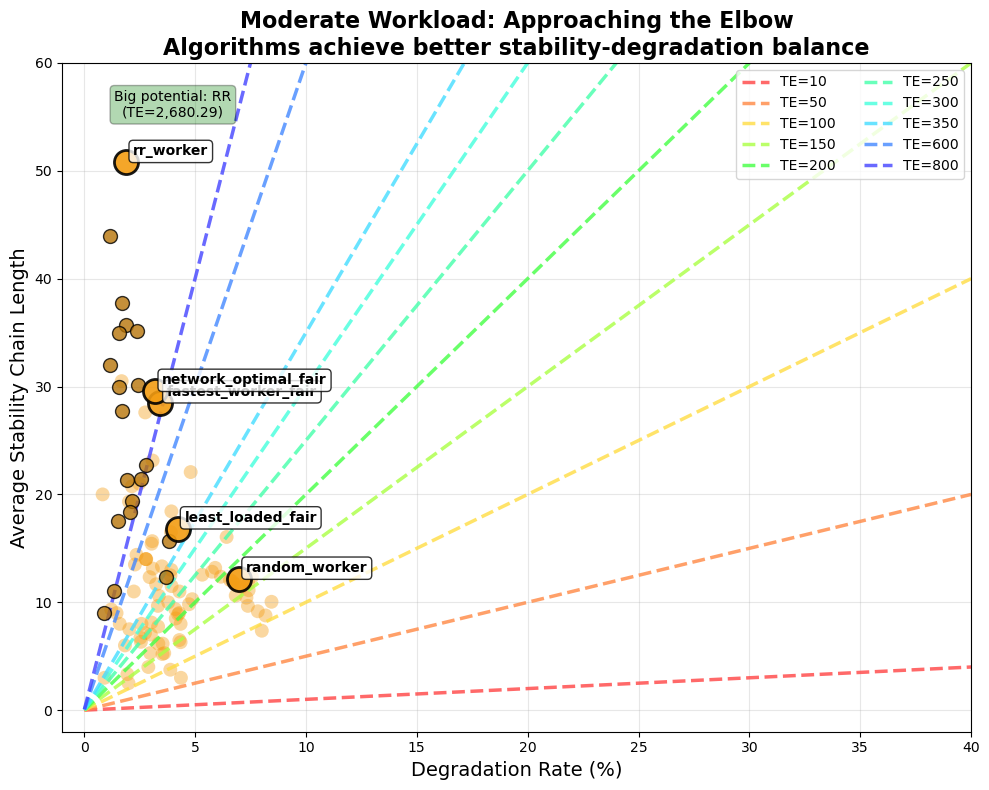

In [61]:
# Slide 61: Moderate

# Moderate workload focus with iteration data
fig, ax = plt.subplots(figsize=(10, 8))

# First, plot non-RR iteration data as background
moderate_iterations_non_rr = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'moderate') &
    (df_worker_iteration_metrics['worker_algorithm'] != 'rr_worker') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(moderate_iterations_non_rr['degradation_rate'],
           moderate_iterations_non_rr['avg_stability_chain'],
           c='#f39c12', s=100, alpha=0.4,
           edgecolors='none')

# Highlight RR worker iterations
moderate_iterations_rr = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['workload_intensity'] == 'moderate') &
    (df_worker_iteration_metrics['worker_algorithm'] == 'rr_worker') &
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

ax.scatter(moderate_iterations_rr['degradation_rate'],
           moderate_iterations_rr['avg_stability_chain'],
           c="#b77408", s=100, alpha=0.8,
           edgecolors='black', linewidth=1,  # Black border for RR
           zorder=5)

# Get moderate workload algorithm-level data
moderate_algo = df_worker_chain_metrics[
    df_worker_chain_metrics['workload_intensity'] == 'moderate'
]

# Plot algorithm points
ax.scatter(moderate_algo['degradation_rate'], 
          moderate_algo['avg_stability_chain'],
          c='#f39c12', s=300, alpha=0.9,
          edgecolors='black', linewidth=2,
          zorder=10)

# Add algorithm labels
for idx, row in moderate_algo.iterrows():
    ax.annotate(row['worker_algorithm'],
               (row['degradation_rate'], row['avg_stability_chain']),
               xytext=(5, 5), textcoords='offset points',
               fontsize=10, fontweight='bold',
               bbox=dict(boxstyle="round,pad=0.3", 
                        facecolor='white', alpha=0.8),
               zorder=11)

# TE contours - expanded range for moderate
degradation_range = np.linspace(0.01, 40, 100)
for te_value, color in [(10,'#ff4444'), (50, '#ff8844'),
                        (100, '#ffdd44'), (150, '#aaff44'),
                        (200, '#44ff44'), (250, '#44ffaa'),
                        (300, '#44ffdd'), (350, '#44ddff'),
                        (600, '#4488ff'), (800, '#4444ff')]:
    stability_values = te_value * degradation_range / 100
    ax.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2.5, alpha=0.8,
            label=f'TE={te_value}')

# Highlight the sweet spot
ax.text(4, 55, 'Big potential: RR\n(TE=2,680.29)', ha='center', fontsize=10,
        bbox=dict(boxstyle="round,pad=0.3", facecolor='green', alpha=0.3))

ax.set_xlabel('Degradation Rate (%)', fontsize=14)
ax.set_ylabel('Average Stability Chain Length', fontsize=14)
ax.set_title('Moderate Workload: Approaching the Elbow\nAlgorithms achieve better stability-degradation balance', 
            fontsize=16, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='upper right', fontsize=10, ncol=2)  # Two columns for many items
ax.set_xlim(-1, 40)
ax.set_ylim(-2, 60)

plt.tight_layout()
plt.savefig('./img_exports/slide60_moderate_worker_algos_with_rr.png', dpi=300)
plt.show()

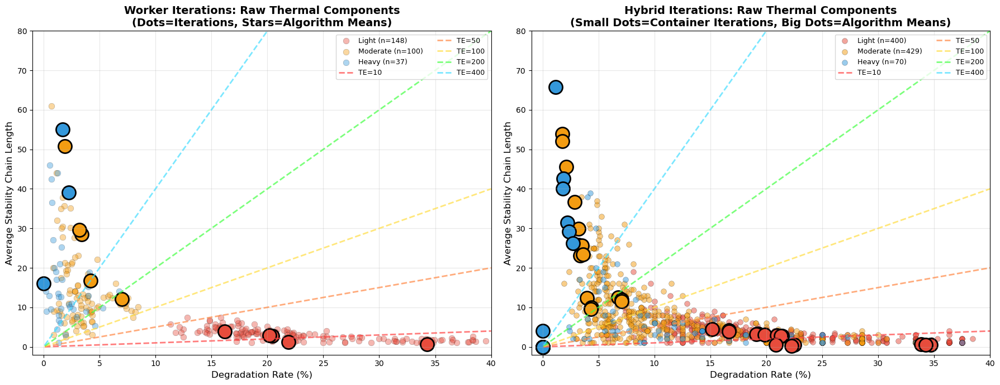

In [62]:
# Slide 62: Worker and Hybrid Iterations with TE Contours
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Define colors
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}

# Define contour range
degradation_range = np.linspace(0.1, 40, 100)

# LEFT: WORKER ITERATIONS
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
        (df_worker_iteration_metrics['degradation_rate'] < 40)
    ]
    
    if len(workload_data) > 0:
        ax1.scatter(workload_data['degradation_rate'], 
                   workload_data['avg_stability_chain'],
                   s=60, alpha=0.4, 
                   c=workload_colours[workload],
                   edgecolors='black', linewidth=0.3,
                   label=f'{workload.title()} (n={len(workload_data)})')

# Add algorithm means as stars
for workload in ['light', 'moderate', 'heavy']:
    algo_means = df_worker_chain_metrics[
        df_worker_chain_metrics['workload_intensity'] == workload
    ]
    ax1.scatter(algo_means['degradation_rate'], 
               algo_means['avg_stability_chain'],
               s=300, marker='o',
               c=workload_colours[workload], 
               edgecolors='black', 
               linewidth=2, alpha=1)

# Add TE contour lines for worker
for te_value, color in [(10, '#ff4444'), (50, '#ff8844'), 
                        (100, '#ffdd44'), (200, '#44ff44'), 
                        (400, '#44ddff')]:
    stability_values = te_value * degradation_range / 100
    ax1.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2, alpha=0.7,
            label=f'TE={te_value}')

ax1.set_xlabel('Degradation Rate (%)', fontsize=12)
ax1.set_ylabel('Average Stability Chain Length', fontsize=12)
ax1.set_title('Worker Iterations: Raw Thermal Components\n(Dots=Iterations, Stars=Algorithm Means)', 
             fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper right', fontsize=9, ncol=2)
ax1.set_xlim(-1, 40)
ax1.set_ylim(-2, 80)

# RIGHT: HYBRID ITERATIONS
for workload in ['light', 'moderate', 'heavy']:
    workload_data = df_hybrid_iteration_final[
        (df_hybrid_iteration_final['workload_intensity'] == workload) &
        (df_hybrid_iteration_final['avg_stability_chain'] > 0) &
        (df_hybrid_iteration_final['degradation_rate'] < 40)
    ]
    
    if len(workload_data) > 0:
        ax2.scatter(workload_data['degradation_rate'], 
                  workload_data['avg_stability_chain'],
                  s=50, alpha=0.5,
                  c=workload_colours[workload],
                  edgecolors='black', linewidth=0.3,
                  label=f'{workload.title()} (n={len(workload_data)})')

# Add algorithm means
for workload in ['light', 'moderate', 'heavy']:
    algo_means = df_hybrid_chain_metrics_complete[
        df_hybrid_chain_metrics_complete['workload_intensity'] == workload
    ]
    ax2.scatter(algo_means['degradation_rate'], 
               algo_means['avg_stability_chain'],
               s=300, marker='o',
               c=workload_colours[workload], 
               edgecolors='black', 
               linewidth=2, alpha=1)

# Add TE contour lines for hybrid
for te_value, color in [(10, '#ff4444'), (50, '#ff8844'), 
                        (100, '#ffdd44'), (200, '#44ff44'), 
                        (400, '#44ddff')]:
    stability_values = te_value * degradation_range / 100
    ax2.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2, alpha=0.7,
            label=f'TE={te_value}')

ax2.set_xlabel('Degradation Rate (%)', fontsize=12)
ax2.set_ylabel('Average Stability Chain Length', fontsize=12)
ax2.set_title('Hybrid Iterations: Raw Thermal Components\n(Small Dots=Container Iterations, Big Dots=Algorithm Means)', 
             fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.legend(loc='upper right', fontsize=9, ncol=2)
ax2.set_xlim(-1, 40)
ax2.set_ylim(-2, 80)

plt.tight_layout()
plt.savefig('./img_exports/slide58_worker_hybrid_with_te_contours.png', dpi=300)
plt.show()

We will need to change them all because the original TE pltos we had were actually TE against Degradation which is bizarre and inconsistent

So 
57: Introduce metrics
58L Overall individual data points of light, moderate, heavy (no colour scale -- only workload labelling) against the TE contour line WORKER ONLY
59: Only light stability y, degradation rate x against te contour line WORKER ONLY -- identify the algorithm points of bad and good
-- identify the algorithm points of bad and good
61: Moderate stability y, degradation rate x against te contour line WORKER ONLY-- identify the algorithm points of bad and good

*** FROM HERE WE INTRO THE ELBOW IDEA
62: Introduce the coour scaled datapoints with the contour lines (can also add the light, moderate, heavy workload on right) so they can see like for like or i can just draw the circles like earlier
63: Show the hybrid algo version: Consistent with hybrid!
64: we show side by side now worker version iteration (left) and algo level (right)

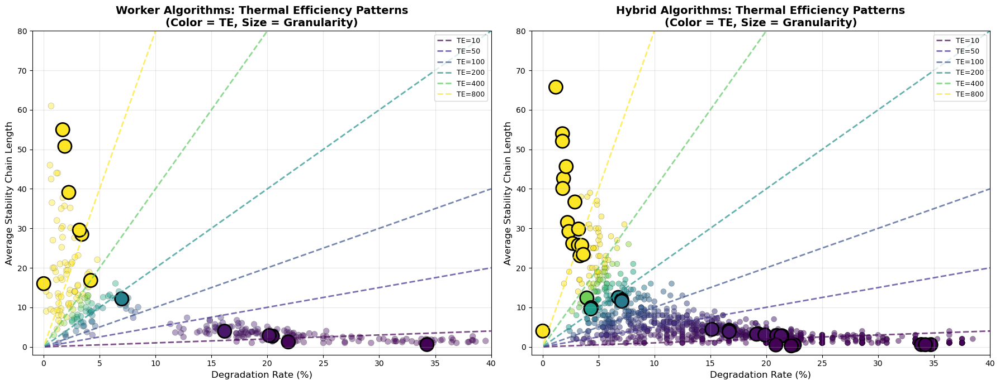

In [63]:
# Slide 62: Worker and Hybrid Iterations with TE Color Scale (for transition)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Define contour range
degradation_range = np.linspace(0.1, 40, 100)

# LEFT: WORKER ITERATIONS
# Get all worker data
worker_data = df_worker_iteration_metrics[
    (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
    (df_worker_iteration_metrics['degradation_rate'] < 40)
]

# Calculate TE for color scale
worker_data['thermal_efficiency'] = (
    worker_data['avg_stability_chain'] / 
    worker_data['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

# Plot with TE color scale
scatter1 = ax1.scatter(worker_data['degradation_rate'], 
                      worker_data['avg_stability_chain'],
                      s=60, alpha=0.4,
                      c=worker_data['thermal_efficiency'],
                      cmap='viridis',
                      edgecolors='black', linewidth=0.3,
                      vmin=0, vmax=400)  # Same scale as slide 62-64

# Add algorithm means with same color scale
worker_algo = df_worker_chain_metrics.copy()
worker_algo['thermal_efficiency_calc'] = (
    worker_algo['avg_stability_chain'] / 
    worker_algo['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

ax1.scatter(worker_algo['degradation_rate'], 
           worker_algo['avg_stability_chain'],
           s=300, marker='o',
           c=worker_algo['thermal_efficiency_calc'],
           cmap='viridis',
           edgecolors='black', 
           linewidth=2, alpha=1,
           vmin=0, vmax=400)

# Add TE contour lines
for te_value, color in [(10, '#440154'), (50, "#3f328f"), 
                        (100, '#3b528b'), (200, '#21918c'), 
                        (400, '#5ec962'), (800, '#fde725')]:
    stability_values = te_value * degradation_range / 100
    ax1.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2, alpha=0.7,
            label=f'TE={te_value}')

ax1.set_xlabel('Degradation Rate (%)', fontsize=12)
ax1.set_ylabel('Average Stability Chain Length', fontsize=12)
ax1.set_title('Worker Algorithms: Thermal Efficiency Patterns\n(Color = TE, Size = Granularity)', 
             fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.legend(loc='upper right', fontsize=9)
ax1.set_xlim(-1, 40)
ax1.set_ylim(-2, 80)

# RIGHT: HYBRID ITERATIONS
# Get all hybrid data
hybrid_data = df_hybrid_iteration_final[
    (df_hybrid_iteration_final['avg_stability_chain'] > 0) &
    (df_hybrid_iteration_final['degradation_rate'] < 40)
]

# Calculate TE
hybrid_data['thermal_efficiency'] = (
    hybrid_data['avg_stability_chain'] / 
    hybrid_data['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

# Plot with TE color scale
scatter2 = ax2.scatter(hybrid_data['degradation_rate'], 
                      hybrid_data['avg_stability_chain'],
                      s=50, alpha=0.5,
                      c=hybrid_data['thermal_efficiency'],
                      cmap='viridis',
                      edgecolors='black', linewidth=0.3,
                      vmin=0, vmax=400)

# Add algorithm means
hybrid_algo = df_hybrid_chain_metrics_complete.copy()
hybrid_algo['thermal_efficiency_calc'] = (
    hybrid_algo['avg_stability_chain'] / 
    hybrid_algo['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

ax2.scatter(hybrid_algo['degradation_rate'], 
           hybrid_algo['avg_stability_chain'],
           s=300, marker='o',
           c=hybrid_algo['thermal_efficiency_calc'],
           cmap='viridis',
           edgecolors='black', 
           linewidth=2, alpha=1,
           vmin=0, vmax=400)

# Add TE contour lines
for te_value, color in [(10, '#440154'), (50, "#3f328f"), 
                        (100, '#3b528b'), (200, '#21918c'), 
                        (400, '#5ec962'), (800, '#fde725')]:
    stability_values = te_value * degradation_range / 100
    ax2.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2, alpha=0.7,
            label=f'TE={te_value}')

ax2.set_xlabel('Degradation Rate (%)', fontsize=12)
ax2.set_ylabel('Average Stability Chain Length', fontsize=12)
ax2.set_title('Hybrid Algorithms: Thermal Efficiency Patterns\n(Color = TE, Size = Granularity)', 
             fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.legend(loc='upper right', fontsize=9)
ax2.set_xlim(-1, 40)
ax2.set_ylim(-2, 80)


plt.tight_layout()
plt.savefig('./img_exports/slide58_te_color_scale_transition.png', dpi=300)
plt.show()

In [64]:
# Generate comprehensive table of algorithm-level metrics
print("="*80)
print("WORKER ALGORITHM THERMAL METRICS TABLE")
print("="*80)

# Calculate all metrics for worker algorithms
worker_metrics = df_worker_chain_metrics.copy()
worker_metrics['thermal_efficiency'] = (
    worker_metrics['avg_stability_chain'] / 
    worker_metrics['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

# Display table
worker_table = worker_metrics[['worker_algorithm', 'workload_intensity', 
                               'degradation_rate', 'avg_stability_chain', 
                               'thermal_efficiency']].round(2)

print("\nWORKER ALGORITHMS:")
for workload in ['light', 'moderate', 'heavy']:
    print(f"\n{workload.upper()} WORKLOAD:")
    wl_data = worker_table[worker_table['workload_intensity'] == workload].sort_values('thermal_efficiency', ascending=False)
    print(wl_data.to_string(index=False))

# Export to CSV
worker_table.to_csv('./csv_exports/STEP_3C_FINAL_worker_thermal_metrics.csv', index=False)

# Now for hybrid algorithms
print("\n" + "="*80)
print("HYBRID ALGORITHM THERMAL METRICS TABLE")
print("="*80)

hybrid_metrics = df_hybrid_chain_metrics_complete.copy()
hybrid_metrics['thermal_efficiency'] = (
    hybrid_metrics['avg_stability_chain'] / 
    hybrid_metrics['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

hybrid_table = hybrid_metrics[['algorithm_combination', 'workload_intensity', 
                               'degradation_rate', 'avg_stability_chain', 
                               'thermal_efficiency']].round(2)

print("\nHYBRID ALGORITHMS:")
for workload in ['light', 'moderate', 'heavy']:
    print(f"\n{workload.upper()} WORKLOAD:")
    wl_data = hybrid_table[hybrid_table['workload_intensity'] == workload].sort_values('thermal_efficiency', ascending=False)
    print(wl_data.to_string(index=False))

# Export to CSV
hybrid_table.to_csv('./csv_exports/STEP_3C_FINALhybrid_thermal_metrics.csv', index=False)

# Check specific algorithms
print("\n" + "="*40)
print("CHECKING SPECIFIC VALUES:")
print("="*40)

# Find NOF in heavy
nof_heavy = worker_table[(worker_table['worker_algorithm'] == 'network_optimal_fair') & 
                         (worker_table['workload_intensity'] == 'heavy')]
print(f"\nNOF Heavy: {nof_heavy}")

# Calculate manually to verify
if len(nof_heavy) > 0:
    stability = nof_heavy['avg_stability_chain'].values[0]
    degradation = nof_heavy['degradation_rate'].values[0]
    te_manual = stability / degradation * 100 if degradation > 0 else 0
    print(f"\nManual calculation: {stability} / {degradation} * 100 = {te_manual:.2f}")

WORKER ALGORITHM THERMAL METRICS TABLE

WORKER ALGORITHMS:

LIGHT WORKLOAD:
    worker_algorithm workload_intensity  degradation_rate  avg_stability_chain  thermal_efficiency
 fastest_worker_fair              light             16.18                 3.96               24.48
network_optimal_fair              light             20.16                 2.87               14.22
   least_loaded_fair              light             20.45                 2.71               13.24
           rr_worker              light             21.87                 1.25                5.71
       random_worker              light             34.26                 0.58                1.70

MODERATE WORKLOAD:
    worker_algorithm workload_intensity  degradation_rate  avg_stability_chain  thermal_efficiency
           rr_worker           moderate              1.89                50.78             2680.29
network_optimal_fair           moderate              3.20                29.56              922.84
 fastest_work

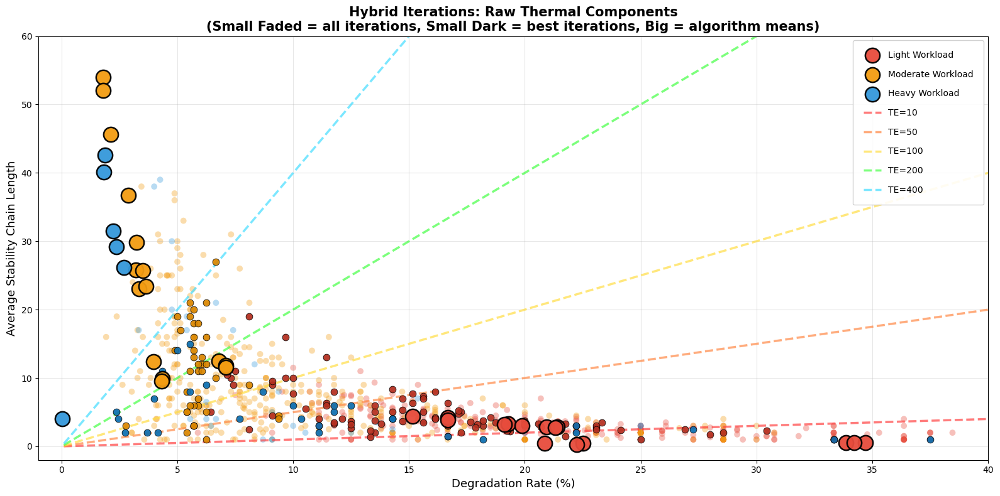

In [65]:
# Slide 62: Hybrid Iterations with TE Contours — ax2 only

# --- Config ---
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
# Slightly darker shades for highlight dots
workload_colours_dark = {'light': "#b32f20", 'moderate': "#d98600", 'heavy': "#0C6EB0"}

# Best worker-side performers per workload (to be highlighted)
best_worker_by_workload = {
    'light': 'fastest_worker_fair',
    'moderate': 'rr_worker',
    'heavy': 'network_optimal_fair'
}

# Contour range
degradation_range = np.linspace(0.1, 40, 200)

# --- Prep helper columns (once, harmless if re-run) ---
# For iterations
if 'worker_algo' not in df_hybrid_iteration_final.columns:
    df_hybrid_iteration_final = df_hybrid_iteration_final.copy()
    df_hybrid_iteration_final['worker_algo'] = (
        df_hybrid_iteration_final['algorithm_combination']
        .astype(str).str.split('+').str[1]
    )

# For algorithm means
if 'worker_algo' not in df_hybrid_chain_metrics_complete.columns:
    df_hybrid_chain_metrics_complete = df_hybrid_chain_metrics_complete.copy()
    df_hybrid_chain_metrics_complete['worker_algo'] = (
        df_hybrid_chain_metrics_complete['algorithm_combination']
        .astype(str).str.split('+').str[1]
    )

# --- Figure: ax2 only ---
fig, ax2 = plt.subplots(figsize=(16, 8))

# Base scatter: all iterations per workload (faded background)
for workload in ['light', 'moderate', 'heavy']:
    base = df_hybrid_iteration_final[
        (df_hybrid_iteration_final['workload_intensity'] == workload) &
        (df_hybrid_iteration_final['avg_stability_chain'] > 0) &
        (df_hybrid_iteration_final['degradation_rate'] < 40)
    ]
    if len(base) > 0:
        ax2.scatter(
            base['degradation_rate'],
            base['avg_stability_chain'],
            s=50, alpha=0.35,
            c=workload_colours[workload],
            edgecolors='none',
            # label=f'{workload.title()} Iteration Data Points'
        )

# Highlight scatter: iterations of the best worker algo per workload (darker + outlined)
for workload in ['light', 'moderate', 'heavy']:
    highlight = df_hybrid_iteration_final[
        (df_hybrid_iteration_final['workload_intensity'] == workload) &
        (df_hybrid_iteration_final['worker_algo'] == best_worker_by_workload[workload]) &
        (df_hybrid_iteration_final['avg_stability_chain'] > 0) &
        (df_hybrid_iteration_final['degradation_rate'] < 40)
    ]
    if len(highlight) > 0:
        ax2.scatter(
            highlight['degradation_rate'],
            highlight['avg_stability_chain'],
            s=60, alpha=0.9,
            c=workload_colours_dark[workload],
            edgecolors='black', linewidth=0.6,
            zorder=5
            # label=f"{workload.title()} Highest Iteration Data Points({best_worker_by_workload[workload]})"
        )

# Algorithm means: show all, then overlay stars for best worker algos
means_all = df_hybrid_chain_metrics_complete[
    (df_hybrid_chain_metrics_complete['avg_stability_chain'] > 0) &
    (df_hybrid_chain_metrics_complete['degradation_rate'] < 40)
]

if len(means_all) > 0:
    # All means
    for workload in ['light', 'moderate', 'heavy']:
        m = means_all[means_all['workload_intensity'] == workload]
        if len(m) > 0:
            ax2.scatter(
                m['degradation_rate'],
                m['avg_stability_chain'],
                s=280, alpha=0.95,
                c=workload_colours[workload],
                edgecolors='black', linewidth=1.8,
                zorder=8,
                label=f'{workload.title()} Workload'
            )

    # # Highlight best worker means with a star marker
    # for workload in ['light', 'moderate', 'heavy']:
    #     m_best = means_all[
    #         (means_all['workload_intensity'] == workload) &
    #         (means_all['worker_algo'] == best_worker_by_workload[workload])
    #     ]
    #     if len(m_best) > 0:
    #         ax2.scatter(
    #             m_best['degradation_rate'],
    #             m_best['avg_stability_chain'],
    #             s=420, alpha=1.0,
    #             marker='*',
    #             c=workload_colours_dark[workload],
    #             edgecolors='black', linewidth=1.8,
    #             zorder=10,
    #             label=f"{workload.title()} Best Mean ({best_worker_by_workload[workload]})"
    #         )

# TE contour lines (keep visual but avoid cluttering legend)
for te_value, color in [(10, '#ff4444'), (50, '#ff8844'),
                        (100, '#ffdd44'), (200, '#44ff44'),
                        (400, '#44ddff')]:
    stability_values = te_value * degradation_range / 100
    ax2.plot(
        degradation_range, stability_values, '--',
        color=color, linewidth=2.5, alpha=0.7,
        label=f"TE={te_value}"   # <-- add this
    )
    
# Add a single legend entry for TE guide
te_guide_x = 35
te_guide_y = (100 * te_guide_x) / 100  # example point on TE=100 line
# ax2.annotate('TE contours', xy=(te_guide_x, te_guide_y),
#              xytext=(-60, 15), textcoords='offset points',
#              fontsize=10, bbox=dict(boxstyle="round,pad=0.3",
#              facecolor='white', alpha=0.8))

# Labels & styling
ax2.set_xlabel('Degradation Rate (%)', fontsize=13)
ax2.set_ylabel('Average Stability Chain Length', fontsize=13)
ax2.set_title('Hybrid Iterations: Raw Thermal Components\n'
              '(Small Faded = all iterations, Small Dark = best iterations, Big = algorithm means)',
              fontsize=15, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.set_xlim(-1, 40)
ax2.set_ylim(-2, 60)

# De-duplicate legend entries while keeping order
handles, labels = ax2.get_legend_handles_labels()
seen = set()
deduped = [(h, l) for h, l in zip(handles, labels) if not (l in seen or seen.add(l))]
legend = ax2.legend(
    [h for h, _ in deduped],
    [l for _, l in deduped],
    loc='upper right',
    fontsize=10,
    ncol=1,
    framealpha=0.9,
    labelspacing=1.2,   # increase vertical spacing (default = 0.5)
    borderpad=1.2
)

plt.tight_layout()
plt.savefig('./img_exports/slide62_hybrid_only_with_best-x.png', dpi=300)
plt.show()

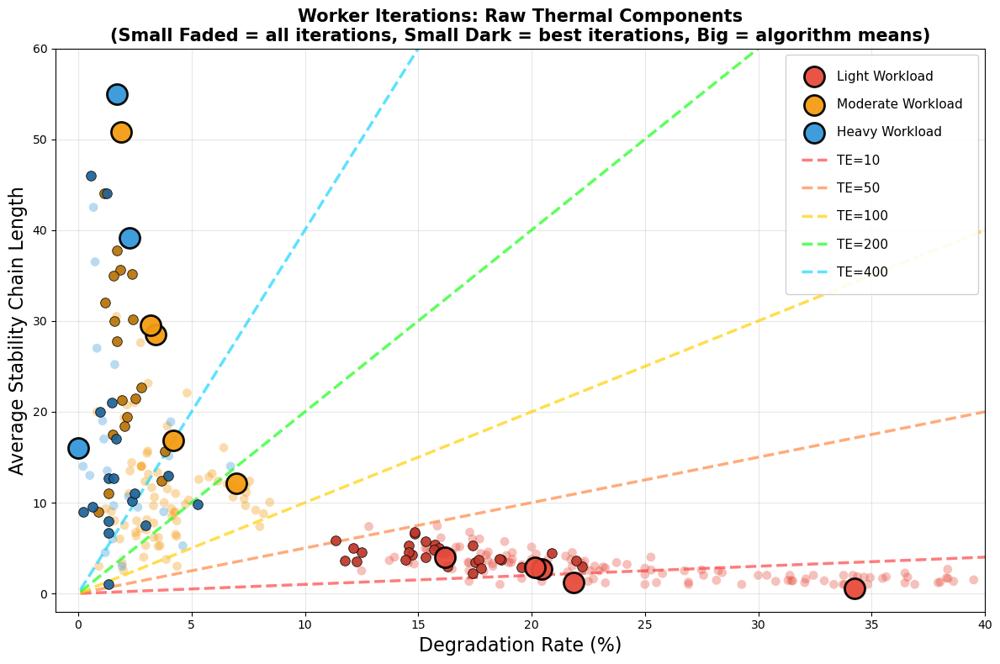

In [66]:
# Slide 62: Worker Iterations with TE Contours — ax1 only
import numpy as np
import matplotlib.pyplot as plt

# --- Config ---
workload_colours = {'light': '#e74c3c', 'moderate': '#f39c12', 'heavy': '#3498db'}
workload_colours_dark = {'light': '#c0392b', 'moderate': '#b77408', 'heavy': '#1f6396'}

# Best worker algos
best_worker_by_workload = {
    'light': 'fastest_worker_fair',
    'moderate': 'rr_worker',
    'heavy': 'network_optimal_fair'
}

# Degradation contour range
degradation_range = np.linspace(0.1, 40, 200)

# --- Plot ---
fig, ax1 = plt.subplots(figsize=(12, 8))

# 1. Iteration data points (faded)
for workload in ['light', 'moderate', 'heavy']:
    data_all = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
        (df_worker_iteration_metrics['degradation_rate'] < 40)
    ]
    if len(data_all) > 0:
        ax1.scatter(
            data_all['degradation_rate'],
            data_all['avg_stability_chain'],
            s=60, alpha=0.35,
            c=workload_colours[workload],
            edgecolors='none',
            # label=f"{workload.title()}: Iteration data point"
        )

# 2. Highlight best worker iterations (dark)
for workload in ['light', 'moderate', 'heavy']:
    data_best = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['worker_algorithm'] == best_worker_by_workload[workload]) &
        (df_worker_iteration_metrics['avg_stability_chain'] > 0) &
        (df_worker_iteration_metrics['degradation_rate'] < 40)
    ]
    if len(data_best) > 0:
        ax1.scatter(
            data_best['degradation_rate'],
            data_best['avg_stability_chain'],
            s=70, alpha=0.9,
            c=workload_colours_dark[workload],
            edgecolors='black', linewidth=0.6,
            zorder=5,
            # label=f"{workload.title()}: Highest Iteration TE data point ({best_worker_by_workload[workload]})"
        )

# 3. Algorithm means (big dots)
for workload in ['light', 'moderate', 'heavy']:
    algo_means = df_worker_chain_metrics[
        df_worker_chain_metrics['workload_intensity'] == workload
    ]
    if len(algo_means) > 0:
        ax1.scatter(
            algo_means['degradation_rate'],
            algo_means['avg_stability_chain'],
            s=300, alpha=0.95,
            c=workload_colours[workload],
            edgecolors='black', linewidth=2,
            zorder=8,
            label=f"{workload.title()} Workload"
        )

# 4. TE contour lines
for te_value, color in [(10, '#ff4444'), (50, '#ff8844'),
                        (100, "#ffd103"), (200, "#18ff18"),
                        (400, "#1bd5ff")]:
    stability_values = te_value * degradation_range / 100
    ax1.plot(
        degradation_range, stability_values, '--',
        color=color, linewidth=2.5, alpha=0.7,
        label=f"TE={te_value}"   # <-- add this
    )

# ax1.annotate("TE contours", xy=(30, 30),
#              xytext=(-60, 20), textcoords='offset points',
#              fontsize=10, bbox=dict(boxstyle="round,pad=0.3",
#              facecolor="white", alpha=0.8))

# Labels & styling
ax1.set_xlabel('Degradation Rate (%)', fontsize=16)
ax1.set_ylabel('Average Stability Chain Length', fontsize=16)
ax1.set_title('Worker Iterations: Raw Thermal Components\n'
              '(Small Faded = all iterations, Small Dark = best iterations, Big = algorithm means)',
              fontsize=15, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.set_xlim(-1, 40)
ax1.set_ylim(-2, 60)

# Deduplicate legend
handles, labels = ax1.get_legend_handles_labels()
seen = set()
deduped = [(h, l) for h, l in zip(handles, labels) if not (l in seen or seen.add(l))]
ax1.legend(
    [h for h, _ in deduped],
    [l for _, l in deduped],
    loc='upper right',
    fontsize=11,
    ncol=1,
    framealpha=0.9,
    labelspacing=1.2,
    borderpad=1.2
)

plt.tight_layout()
plt.savefig('./img_exports/slide62_worker_only_with_best.png', dpi=300)
plt.show()

# Redo the Cross Validation 😩

In [67]:
# ====================================================================
# LOAD AGGREGATED RESIDUALS FROM CSV FILES
# ====================================================================

# Load the algorithm-level residuals
light_res = pd.read_csv('./csv_exports/step_2_72_worker_algorithm_residuals_light.csv')
moderate_res = pd.read_csv('./csv_exports/step_2_72_worker_algorithm_residuals_moderate.csv')
heavy_res = pd.read_csv('./csv_exports/step_2_72_worker_algorithm_residuals_heavy.csv')

# Add workload_intensity column to each
light_res['workload_intensity'] = 'light'
moderate_res['workload_intensity'] = 'moderate'
heavy_res['workload_intensity'] = 'heavy'

# Combine all workloads
worker_residuals = pd.concat([light_res, moderate_res, heavy_res], ignore_index=True)
print("Worker residuals shape:", worker_residuals.shape)
print("Columns:", worker_residuals.columns.tolist())

# Check what columns we have
print("\nSample of residuals data:")
print(worker_residuals.head())

# Merge with algorithm-level TE data
worker_algo_te = df_worker_chain_metrics.merge(
    worker_residuals[['worker_algorithm', 'workload_intensity', 'cooling_delay']],
    on=['worker_algorithm', 'workload_intensity'],
    how='inner'
)

# Calculate TE if not already present
worker_algo_te['thermal_efficiency_calc'] = (
    worker_algo_te['avg_stability_chain'] / 
    worker_algo_te['degradation_rate'] * 100
).replace([np.inf, -np.inf], 0)

print(f"\nMerged data shape: {worker_algo_te.shape}")
print(f"Workload distribution: {worker_algo_te['workload_intensity'].value_counts()}")

Worker residuals shape: (15, 5)
Columns: ['worker_algorithm', 'cooling_delay', 'no_delay', 'queue_time_delay', 'workload_intensity']

Sample of residuals data:
       worker_algorithm  cooling_delay   no_delay  queue_time_delay  \
0   fastest_worker_fair     -17.831930  15.080893          0.501236   
1     least_loaded_fair     -14.437802  10.957517          3.219885   
2  network_optimal_fair     -14.127839  12.304439         -0.402897   
3         random_worker      16.674035 -13.217666         -2.454141   
4             rr_worker      30.171516 -25.489004         -0.910473   

  workload_intensity  
0              light  
1              light  
2              light  
3              light  
4              light  

Merged data shape: (13, 14)
Workload distribution: workload_intensity
light       5
moderate    5
heavy       3
Name: count, dtype: int64


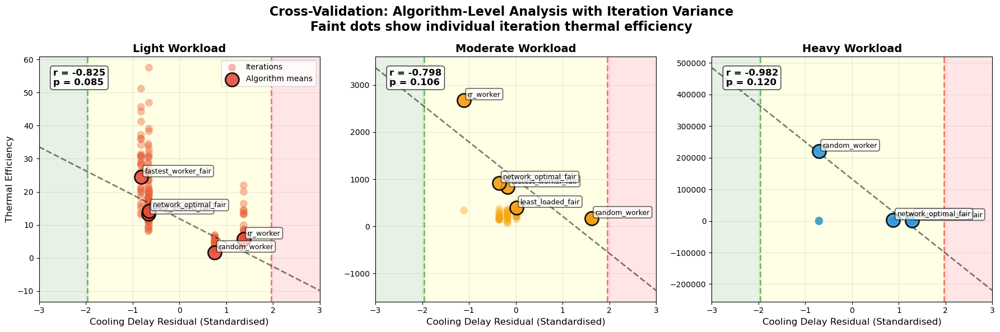

In [68]:
# ====================================================================
# FIX: Calculate standardised residuals and add iteration dots
# ====================================================================

# First, standardise the cooling_delay within each workload
for workload in ['light', 'moderate', 'heavy']:
    mask = worker_residuals['workload_intensity'] == workload
    mean_val = worker_residuals.loc[mask, 'cooling_delay'].mean()
    std_val = worker_residuals.loc[mask, 'cooling_delay'].std()
    worker_residuals.loc[mask, 'cooling_delay_standardised'] = (
        worker_residuals.loc[mask, 'cooling_delay'] - mean_val
    ) / std_val

# Merge with algorithm-level TE data
worker_algo_te = df_worker_chain_metrics.merge(
    worker_residuals[['worker_algorithm', 'workload_intensity', 'cooling_delay', 'cooling_delay_standardised']],
    on=['worker_algorithm', 'workload_intensity'],
    how='inner'
)

# Calculate TE
worker_algo_te['thermal_efficiency_calc'] = (
    worker_algo_te['avg_stability_chain'] / 
    worker_algo_te['degradation_rate'] * 100
).replace([np.inf, -np.inf], np.nan)

# Remove infinite TE
worker_algo_te = worker_algo_te[worker_algo_te['thermal_efficiency_calc'].notna()]

# ====================================================================
# PLOT WITH ITERATION DOTS IN BACKGROUND
# ====================================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Get algorithm data
    algo_data = worker_algo_te[
        worker_algo_te['workload_intensity'] == workload
    ]
    
    # Get iteration data for background
    iter_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['thermal_efficiency'] < 400)
    ]
    
    # For each algorithm, get its standardised residual value
    algo_residual_map = dict(zip(
        algo_data['worker_algorithm'], 
        algo_data['cooling_delay_standardised']
    ))
    
    # Map iteration data to x-positions based on their algorithm's residual
    iter_data['x_position'] = iter_data['worker_algorithm'].map(algo_residual_map)
    iter_data_filtered = iter_data.dropna(subset=['x_position'])
    
    # Plot iteration dots as background
    ax.scatter(
        iter_data_filtered['x_position'],
        iter_data_filtered['thermal_efficiency'],
        s=100,
        alpha=0.4,
        c=workload_colours[workload],
        edgecolors='none',
        label='Iterations'
    )
    
    # Plot algorithm points on top
    scatter = ax.scatter(
        algo_data['cooling_delay_standardised'],
        algo_data['thermal_efficiency_calc'],
        s=300,
        c=workload_colours[workload],
        edgecolors='black',
        linewidth=2,
        alpha=0.9,
        marker='o',
        label='Algorithm means',
        zorder=10
    )
    
    # Add algorithm labels
    for _, row in algo_data.iterrows():
        ax.annotate(
            row['worker_algorithm'],
            (row['cooling_delay_standardised'], row['thermal_efficiency_calc']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=9,
            bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7),
            zorder=11
        )
    
    # Add threshold lines
    ax.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvspan(-10, -1.96, alpha=0.1, color='green')
    ax.axvspan(1.96, 10, alpha=0.1, color='red')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow')
    
    # Calculate correlation using standardised values for both
    if len(algo_data) >= 3:
        corr, p_val = stats.pearsonr(
            algo_data['cooling_delay_standardised'],
            algo_data['thermal_efficiency_calc']
        )
        ax.text(0.05, 0.95, f'r = {corr:.3f}\np = {p_val:.3f}',
                transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8),
                verticalalignment='top',
                fontsize=12,
                fontweight='bold')
    
    # Add trend line using standardised values
    if len(algo_data) >= 3:
        z = np.polyfit(algo_data['cooling_delay_standardised'], 
                      algo_data['thermal_efficiency_calc'], 1)
        p = np.poly1d(z)
        x_trend = np.linspace(-3, 3, 100)
        ax.plot(x_trend, p(x_trend), "--", color='black', alpha=0.5, linewidth=2)
    
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency' if idx == 0 else '', fontsize=12)
    ax.set_title(f'{workload.title()} Workload', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    
    if idx == 0:
        ax.legend(loc='upper right')

plt.suptitle('Cross-Validation: Algorithm-Level Analysis with Iteration Variance\nFaint dots show individual iteration thermal efficiency',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

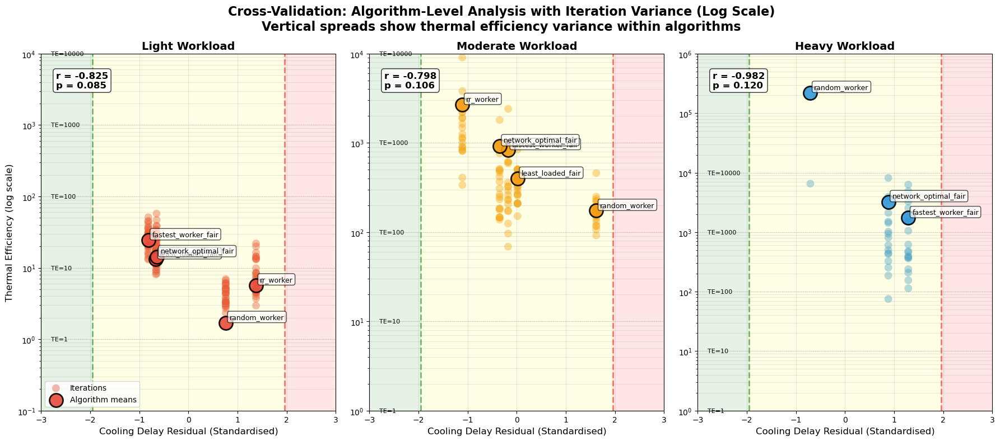

In [69]:
# ====================================================================
# SAME PLOT BUT WITH LOG SCALE Y-AXIS
# ====================================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 8))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Get algorithm data
    algo_data = worker_algo_te[
        worker_algo_te['workload_intensity'] == workload
    ]
    
    # Get iteration data for background
    iter_data = df_worker_iteration_metrics[
        (df_worker_iteration_metrics['workload_intensity'] == workload) &
        (df_worker_iteration_metrics['thermal_efficiency'] > 0)  # Must be positive for log
    ]
    
    # Map iteration data to x-positions
    algo_residual_map = dict(zip(
        algo_data['worker_algorithm'], 
        algo_data['cooling_delay_standardised']
    ))
    
    iter_data['x_position'] = iter_data['worker_algorithm'].map(algo_residual_map)
    iter_data_filtered = iter_data.dropna(subset=['x_position'])
    
    # Plot iteration dots as background
    ax.scatter(
        iter_data_filtered['x_position'],
        iter_data_filtered['thermal_efficiency'],
        s=100,
        alpha=0.4,
        c=workload_colours[workload],
        edgecolors='none',
        label='Iterations'
    )
    
    # Plot algorithm points on top
    scatter = ax.scatter(
        algo_data['cooling_delay_standardised'],
        algo_data['thermal_efficiency_calc'],
        s=300,
        c=workload_colours[workload],
        edgecolors='black',
        linewidth=2,
        alpha=0.9,
        marker='o',
        label='Algorithm means',
        zorder=10
    )
    
    # Add algorithm labels
    for _, row in algo_data.iterrows():
        ax.annotate(
            row['worker_algorithm'],
            (row['cooling_delay_standardised'], row['thermal_efficiency_calc']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=9,
            bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7),
            zorder=11
        )
    
    # SET LOG SCALE
    ax.set_yscale('log')
    
    # Add threshold lines
    ax.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvspan(-10, -1.96, alpha=0.1, color='green')
    ax.axvspan(1.96, 10, alpha=0.1, color='red')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow')
    
    # Add TE reference lines on log scale
    for te_val in [1, 10, 100, 1000, 10000]:
        ax.axhline(y=te_val, color='gray', linestyle=':', alpha=0.3, linewidth=1)
        ax.text(-2.8, te_val, f'TE={te_val}', fontsize=8, va='center')
    
    # Calculate correlation
    if len(algo_data) >= 3:
        corr, p_val = stats.pearsonr(
            algo_data['cooling_delay_standardised'],
            algo_data['thermal_efficiency_calc']
        )
        ax.text(0.05, 0.95, f'r = {corr:.3f}\np = {p_val:.3f}',
                transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8),
                verticalalignment='top',
                fontsize=12,
                fontweight='bold')
    
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency (log scale)' if idx == 0 else '', fontsize=12)
    ax.set_title(f'{workload.title()} Workload', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3, which='both')
    ax.set_xlim(-3, 3)
    
    # Set y-limits based on workload
    if workload == 'light':
        ax.set_ylim(0.1, 10000)
    elif workload == 'moderate':
        ax.set_ylim(1, 10000)
    else:
        ax.set_ylim(1, 1000000)
    
    if idx == 0:
        ax.legend(loc='lower left')

plt.suptitle('Cross-Validation: Algorithm-Level Analysis with Iteration Variance (Log Scale)\nVertical spreads show thermal efficiency variance within algorithms',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

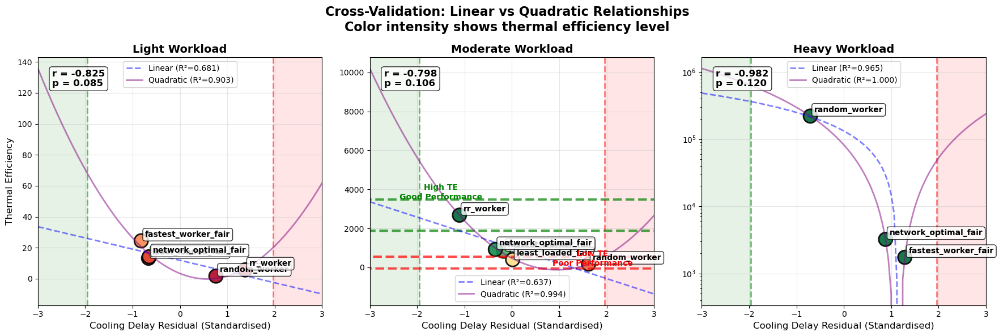


Model Comparison:

LIGHT:
  Linear R²: 0.681
  Quadratic R²: 0.903
  Quadratic coefficient: 10.602

MODERATE:
  Linear R²: 0.637
  Quadratic R²: 0.994
  Quadratic coefficient: 662.270

HEAVY:
  Linear R²: 0.965
  Quadratic R²: 1.000
  Quadratic coefficient: 66908.935


In [70]:
# ====================================================================
# CLUSTERING VISUALIZATION: TE vs RESIDUALS WITH QUADRATIC FIT
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Get algorithm data
    algo_data = worker_algo_te[
        worker_algo_te['workload_intensity'] == workload
    ]
    
    # Plot algorithm points (no iteration dots for clarity)
    scatter = ax.scatter(
        algo_data['cooling_delay_standardised'],
        algo_data['thermal_efficiency_calc'],
        s=300,
        c=algo_data['thermal_efficiency_calc'],
        cmap='RdYlGn',  # Red-Yellow-Green colormap
        edgecolors='black',
        linewidth=2,
        alpha=0.9,
        vmin=0,
        vmax=100 if workload == 'light' else 1000
    )
    
    # Add algorithm labels
    for _, row in algo_data.iterrows():
        ax.annotate(
            row['worker_algorithm'],
            (row['cooling_delay_standardised'], row['thermal_efficiency_calc']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=10,
            bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8),
            fontweight='bold'
        )
    
    # Add threshold lines
    ax.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvspan(-10, -1.96, alpha=0.1, color='green')
    ax.axvspan(1.96, 10, alpha=0.1, color='red')
    
    # Fit both linear and quadratic
    if len(algo_data) >= 3:
        x = algo_data['cooling_delay_standardised'].values
        y = algo_data['thermal_efficiency_calc'].values
        
        # Linear fit
        z1 = np.polyfit(x, y, 1)
        p1 = np.poly1d(z1)
        
        # Quadratic fit
        z2 = np.polyfit(x, y, 2)
        p2 = np.poly1d(z2)
        
        # Calculate R-squared for both
        yhat1 = p1(x)
        yhat2 = p2(x)
        ybar = np.mean(y)
        ssreg1 = np.sum((yhat1 - ybar)**2)
        ssreg2 = np.sum((yhat2 - ybar)**2)
        sstot = np.sum((y - ybar)**2)
        r2_linear = ssreg1 / sstot
        r2_quad = ssreg2 / sstot
        
        # Plot both fits
        x_smooth = np.linspace(-3, 3, 100)
        ax.plot(x_smooth, p1(x_smooth), '--', color='blue', alpha=0.5, 
                linewidth=2, label=f'Linear (R²={r2_linear:.3f})')
        ax.plot(x_smooth, p2(x_smooth), '-', color='purple', alpha=0.5, 
                linewidth=2, label=f'Quadratic (R²={r2_quad:.3f})')
        
        # Correlation
        corr, p_val = stats.pearsonr(x, y)
        ax.text(0.05, 0.95, f'r = {corr:.3f}\np = {p_val:.3f}',
                transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8),
                verticalalignment='top',
                fontsize=12,
                fontweight='bold')
    
    # Circle the clusters
    if workload == 'moderate':
        # Good performers
        circle1 = plt.Circle((-1.5, 2680), 800, fill=False, edgecolor='green', 
                           linewidth=3, linestyle='--', alpha=0.7)
        ax.add_patch(circle1)
        ax.text(-1.5, 3500, 'High TE\nGood Performance', ha='center', 
                fontsize=10, color='green', fontweight='bold')
        
        # Poor performers
        circle2 = plt.Circle((1.7, 250), 300, fill=False, edgecolor='red',
                           linewidth=3, linestyle='--', alpha=0.7)
        ax.add_patch(circle2)
        ax.text(1.7, 100, 'Low TE\nPoor Performance', ha='center',
                fontsize=10, color='red', fontweight='bold')
    
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency' if idx == 0 else '', fontsize=12)
    ax.set_title(f'{workload.title()} Workload', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    ax.legend(loc='best', fontsize=10)
    
    # Use log scale only for heavy
    if workload == 'heavy':
        ax.set_yscale('log')

plt.suptitle('Cross-Validation: Linear vs Quadratic Relationships\nColor intensity shows thermal efficiency level',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Print fit statistics
print("\nModel Comparison:")
for workload in ['light', 'moderate', 'heavy']:
    algo_data = worker_algo_te[worker_algo_te['workload_intensity'] == workload]
    if len(algo_data) >= 3:
        x = algo_data['cooling_delay_standardised'].values
        y = algo_data['thermal_efficiency_calc'].values
        
        # Test for quadratic significance
        from sklearn.preprocessing import PolynomialFeatures
        from sklearn.linear_model import LinearRegression
        
        # Linear model
        lr1 = LinearRegression()
        lr1.fit(x.reshape(-1, 1), y)
        
        # Quadratic model
        poly = PolynomialFeatures(degree=2)
        x_poly = poly.fit_transform(x.reshape(-1, 1))
        lr2 = LinearRegression()
        lr2.fit(x_poly, y)
        
        print(f"\n{workload.upper()}:")
        print(f"  Linear R²: {lr1.score(x.reshape(-1, 1), y):.3f}")
        print(f"  Quadratic R²: {lr2.score(x_poly, y):.3f}")
        print(f"  Quadratic coefficient: {lr2.coef_[2]:.3f}")

In [71]:
# Calculate the vertex (optimal point) for moderate workload
moderate_data = worker_algo_te[worker_algo_te['workload_intensity'] == 'moderate']
x = moderate_data['cooling_delay_standardised'].values
y = moderate_data['thermal_efficiency_calc'].values

# Fit quadratic: y = ax² + bx + c
coeffs = np.polyfit(x, y, 2)
a, b, c = coeffs

# Vertex occurs at x = -b/(2a)
optimal_x = -b / (2*a)
optimal_y = a*optimal_x**2 + b*optimal_x + c

print(f"Moderate Workload Optimal Point:")
print(f"  X (Residual): {optimal_x:.3f}")
print(f"  Y (Thermal Efficiency): {optimal_y:.1f}")
print(f"\nThis means algorithms performing {optimal_x:.1f} std devs better than expected")
print(f"achieve peak thermal efficiency of {optimal_y:.0f}")

# Which algorithm is closest to optimal?
moderate_data['distance_from_optimal'] = abs(moderate_data['cooling_delay_standardised'] - optimal_x)
closest = moderate_data.nsmallest(1, 'distance_from_optimal')
print(f"\nClosest algorithm to optimal: {closest['worker_algorithm'].values[0]}")

Moderate Workload Optimal Point:
  X (Residual): 0.949
  Y (Thermal Efficiency): -123.5

This means algorithms performing 0.9 std devs better than expected
achieve peak thermal efficiency of -124

Closest algorithm to optimal: random_worker


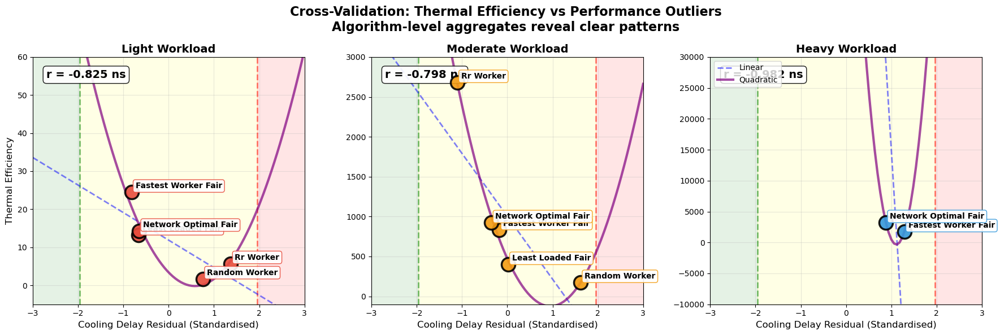

In [72]:
# ====================================================================
# SLIDE VERSION: CLEAN CROSS-VALIDATION PLOTS
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Get algorithm-level data (our current approach)
    algo_data = worker_algo_te[
        worker_algo_te['workload_intensity'] == workload
    ]
    
    # Plot algorithm points prominently
    scatter = ax.scatter(
        algo_data['cooling_delay_standardised'],
        algo_data['thermal_efficiency_calc'],
        s=300,
        c=workload_colours[workload],
        edgecolors='black',
        linewidth=2.5,
        alpha=0.9,
        zorder=10
    )
    
    # Add algorithm labels
    for _, row in algo_data.iterrows():
        ax.annotate(
            row['worker_algorithm'].replace('_', ' ').title(),
            (row['cooling_delay_standardised'], row['thermal_efficiency_calc']),
            xytext=(5, 5),
            textcoords='offset points',
            fontsize=10,
            fontweight='bold',
            bbox=dict(boxstyle="round,pad=0.3", facecolor='white', 
                     edgecolor=workload_colours[workload], alpha=0.9),
            zorder=11
        )
    
    # Add zones
    ax.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvspan(-10, -1.96, alpha=0.1, color='green')
    ax.axvspan(1.96, 10, alpha=0.1, color='red')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow')
    
    # Fit linear and quadratic
    if len(algo_data) >= 3:
        x = algo_data['cooling_delay_standardised'].values
        y = algo_data['thermal_efficiency_calc'].values
        
        # Linear fit
        z1 = np.polyfit(x, y, 1)
        p1 = np.poly1d(z1)
        
        # Quadratic fit
        z2 = np.polyfit(x, y, 2)
        p2 = np.poly1d(z2)
        
        # Plot fits
        x_smooth = np.linspace(-3, 3, 100)
        ax.plot(x_smooth, p1(x_smooth), '--', color='blue', 
                alpha=0.5, linewidth=2, label='Linear')
        ax.plot(x_smooth, p2(x_smooth), '-', color='purple', 
                alpha=0.7, linewidth=3, label='Quadratic')
        
        # Correlation
        corr, p_val = stats.pearsonr(x, y)
        sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else "ns"
        ax.text(0.05, 0.95, f'r = {corr:.3f} {sig}',
                transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.9),
                verticalalignment='top',
                fontsize=14,
                fontweight='bold')
    
    # # Special annotation for Heavy workload
    # if workload == 'heavy':
    #     # Highlight the paradox
    #     ax.annotate('Higher TE but\nWorse Performance!', 
    #                xy=(1, 10000), xytext=(-1, 25000),
    #                arrowprops=dict(arrowstyle='->', color='red', lw=2),
    #                fontsize=11, fontweight='bold', color='red',
    #                bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.8))
        
    #     ax.annotate('Lower TE but\nBetter Performance!', 
    #                xy=(-0.8, 220000), xytext=(-2, 175000),
    #                arrowprops=dict(arrowstyle='->', color='green', lw=2),
    #                fontsize=11, fontweight='bold', color='green',
    #                bbox=dict(boxstyle="round,pad=0.3", facecolor='lightgreen', alpha=0.8))
    
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency' if idx == 0 else '', fontsize=12)
    ax.set_title(f'{workload.title()} Workload', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    
    # Set y-limits - NO LOG SCALE FOR HEAVY
    if workload == 'light':
        ax.set_ylim(-5, 60)
    elif workload == 'moderate':
        ax.set_ylim(-100, 3000)
    else:  # Heavy - linear scale to show the paradox
        ax.set_ylim(-10000, 30000)
    
    if idx == 2:  # Heavy workload
        ax.legend(loc='upper left', fontsize=10)

plt.suptitle('Cross-Validation: Thermal Efficiency vs Performance Outliers\nAlgorithm-level aggregates reveal clear patterns',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

Algorithms after filtering:
['fastest_worker_fair' 'least_loaded_fair' 'network_optimal_fair'
 'rr_worker']

Hybrid data shape after filtering: (30, 17)
Workload distribution:
workload_intensity
light       12
moderate    12
heavy        6
Name: count, dtype: int64


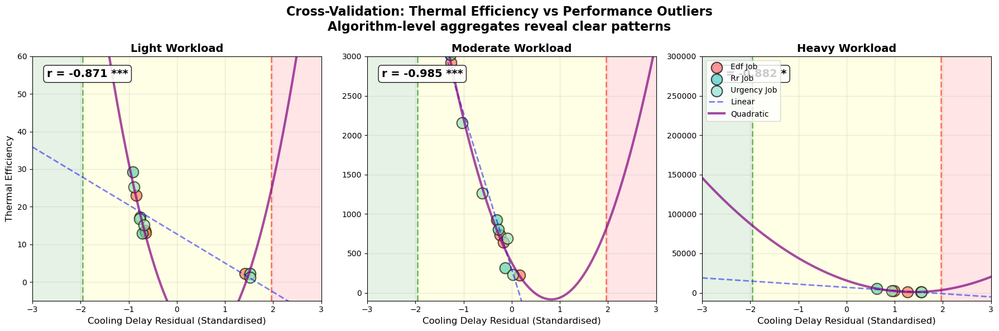

In [73]:
# ====================================================================
# STEP 1: FILTER OUT RANDOM WORKER
# ====================================================================

# Remove random worker from worker_algo_te
worker_algo_te_filtered = worker_algo_te[
    worker_algo_te['worker_algorithm'] != 'random_worker'
].copy()

print("Algorithms after filtering:")
print(worker_algo_te_filtered['worker_algorithm'].unique())

# ====================================================================
# STEP 2: PREPARE HYBRID DATA WITH SAME FILTERING
# ====================================================================

# Get hybrid algorithm-level data
hybrid_algo_te = df_hybrid_chain_metrics_complete.copy()

# Remove combinations with random_worker
hybrid_algo_te = hybrid_algo_te[
    ~hybrid_algo_te['algorithm_combination'].str.contains('random_worker')
]

# Filter out very low degradation rates (statistical noise)
MIN_DEGRADATION_RATE = 0.5  # 0.5% threshold
hybrid_algo_te = hybrid_algo_te[
    (hybrid_algo_te['degradation_rate'] >= MIN_DEGRADATION_RATE) | 
    (hybrid_algo_te['degradation_rate'] == 0)  # Keep zero degradation
]

# Calculate thermal efficiency (same formula)
hybrid_algo_te['thermal_efficiency_calc'] = (
    hybrid_algo_te['avg_stability_chain'] / 
    hybrid_algo_te['degradation_rate'] * 100
).replace([np.inf, -np.inf], np.nan)

# Remove NaN thermal efficiency
hybrid_algo_te = hybrid_algo_te.dropna(subset=['thermal_efficiency_calc'])

# Load hybrid residuals
hybrid_residuals_light = pd.read_csv('./csv_exports/step_2_73_hybrid_algorithm_residuals_light.csv')
hybrid_residuals_moderate = pd.read_csv('./csv_exports/step_2_73_hybrid_algorithm_residuals_moderate.csv')
hybrid_residuals_heavy = pd.read_csv('./csv_exports/step_2_73_hybrid_algorithm_residuals_heavy.csv')

# Add workload intensity column
hybrid_residuals_light['workload_intensity'] = 'light'
hybrid_residuals_moderate['workload_intensity'] = 'moderate'
hybrid_residuals_heavy['workload_intensity'] = 'heavy'

# Combine residuals
hybrid_residuals = pd.concat([
    hybrid_residuals_light, 
    hybrid_residuals_moderate, 
    hybrid_residuals_heavy
], ignore_index=True)

# Standardize cooling delay residuals within each workload
for workload in ['light', 'moderate', 'heavy']:
    mask = hybrid_residuals['workload_intensity'] == workload
    mean_val = hybrid_residuals.loc[mask, 'cooling_delay'].mean()
    std_val = hybrid_residuals.loc[mask, 'cooling_delay'].std()
    hybrid_residuals.loc[mask, 'cooling_delay_standardised'] = (
        hybrid_residuals.loc[mask, 'cooling_delay'] - mean_val
    ) / std_val

# Merge hybrid TE with residuals
hybrid_cross_val = hybrid_algo_te.merge(
    hybrid_residuals[['algorithm_combination', 'workload_intensity', 'cooling_delay_standardised']],
    on=['algorithm_combination', 'workload_intensity'],
    how='inner'
)

print(f"\nHybrid data shape after filtering: {hybrid_cross_val.shape}")
print(f"Workload distribution:")
print(hybrid_cross_val['workload_intensity'].value_counts())

# ====================================================================
# STEP 3: CREATE HYBRID CROSS-VALIDATION PLOTS
# ====================================================================

# Use the same plotting code but with hybrid_cross_val instead of worker_algo_te_filtered
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Get hybrid algorithm-level data
    algo_data = hybrid_cross_val[
        hybrid_cross_val['workload_intensity'] == workload
    ]
    
    # Plot points - color by job algorithm to show patterns
    job_colors = {
        'edf_job': '#FF6B6B',
        'rr_job': '#4ECDC4', 
        'urgency_job': '#95E1D3'
    }
    
    for job_algo in ['edf_job', 'rr_job', 'urgency_job']:
        job_data = algo_data[algo_data['algorithm_combination'].str.contains(job_algo)]
        if len(job_data) > 0:
            ax.scatter(
                job_data['cooling_delay_standardised'],
                job_data['thermal_efficiency_calc'],
                s=200,
                c=job_colors[job_algo],
                edgecolors='black',
                linewidth=1.5,
                alpha=0.7,
                label=job_algo.replace('_', ' ').title()
            )
    
    # Add zones
    ax.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvspan(-10, -1.96, alpha=0.1, color='green')
    ax.axvspan(1.96, 10, alpha=0.1, color='red')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow')
    
    # Fit linear and quadratic
    if len(algo_data) >= 3:
        x = algo_data['cooling_delay_standardised'].values
        y = algo_data['thermal_efficiency_calc'].values
        
        # Linear fit
        z1 = np.polyfit(x, y, 1)
        p1 = np.poly1d(z1)
        
        # Quadratic fit
        z2 = np.polyfit(x, y, 2)
        p2 = np.poly1d(z2)
        
        # Plot fits
        x_smooth = np.linspace(-3, 3, 100)
        ax.plot(x_smooth, p1(x_smooth), '--', color='blue', 
                alpha=0.5, linewidth=2, label='Linear')
        ax.plot(x_smooth, p2(x_smooth), '-', color='purple', 
                alpha=0.7, linewidth=3, label='Quadratic')
        
        # Correlation
        corr, p_val = stats.pearsonr(x, y)
        sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else "ns"
        ax.text(0.05, 0.95, f'r = {corr:.3f} {sig}',
                transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.9),
                verticalalignment='top',
                fontsize=14,
                fontweight='bold')
    
    # Special annotation for Heavy workload
    # if workload == 'heavy':
    #     # Highlight the paradox
    #     ax.annotate('Higher TE but\nWorse Performance!', 
    #                xy=(1, 10000), xytext=(-1, 25000),
    #                arrowprops=dict(arrowstyle='->', color='red', lw=2),
    #                fontsize=11, fontweight='bold', color='red',
    #                bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.8))
        
    #     ax.annotate('Lower TE but\nBetter Performance!', 
    #                xy=(-0.8, 220000), xytext=(-2, 175000),
    #                arrowprops=dict(arrowstyle='->', color='green', lw=2),
    #                fontsize=11, fontweight='bold', color='green',
    #                bbox=dict(boxstyle="round,pad=0.3", facecolor='lightgreen', alpha=0.8))
    
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency' if idx == 0 else '', fontsize=12)
    ax.set_title(f'{workload.title()} Workload', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    
    # Set y-limits - NO LOG SCALE FOR HEAVY
    if workload == 'light':
        ax.set_ylim(-5, 60)
    elif workload == 'moderate':
        ax.set_ylim(-100, 3000)
    else:  # Heavy - linear scale to show the paradox
        ax.set_ylim(-10000, 300000)
    
    if idx == 2:  # Heavy workload
        ax.legend(loc='upper left', fontsize=10)

plt.suptitle('Cross-Validation: Thermal Efficiency vs Performance Outliers\nAlgorithm-level aggregates reveal clear patterns',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


Hybrid data shape after filtering: (36, 17)
Algorithms per workload:
light: 15 algorithms
  ['rr_job+fastest_worker_fair' 'urgency_job+fastest_worker_fair'
 'edf_job+fastest_worker_fair' 'rr_job+network_optimal_fair'
 'urgency_job+least_loaded_fair' 'urgency_job+network_optimal_fair'
 'edf_job+least_loaded_fair' 'edf_job+network_optimal_fair'
 'rr_job+least_loaded_fair' 'rr_job+rr_worker' 'edf_job+rr_worker'
 'urgency_job+random_worker' 'edf_job+random_worker'
 'rr_job+random_worker' 'urgency_job+rr_worker']
moderate: 15 algorithms
  ['rr_job+rr_worker' 'edf_job+rr_worker' 'urgency_job+rr_worker'
 'urgency_job+network_optimal_fair' 'rr_job+fastest_worker_fair'
 'rr_job+network_optimal_fair' 'edf_job+network_optimal_fair'
 'urgency_job+fastest_worker_fair' 'edf_job+fastest_worker_fair'
 'rr_job+least_loaded_fair' 'urgency_job+least_loaded_fair'
 'edf_job+least_loaded_fair' 'edf_job+random_worker'
 'urgency_job+random_worker' 'rr_job+random_worker']
heavy: 6 algorithms
  ['rr_job+networ

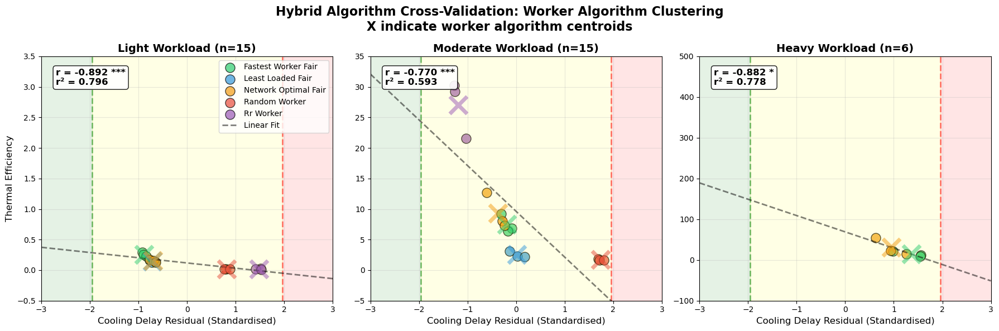


HYBRID ALGORITHM-LEVEL TREND LINES (Current):
------------------------------------------------------------
LIGHT      | y = -0.0855x + 0.1178 (r²=0.796)
MODERATE   | y = -7.4906x + 9.6236 (r²=0.593)
HEAVY      | y = -40.0907x + 68.9546 (r²=0.778)


In [74]:
# ====================================================================
# STEP 1: PREPARE HYBRID DATA WITH CORRECT FILTERING
# ====================================================================

# Get hybrid algorithm-level data
hybrid_algo_te = df_hybrid_chain_metrics_complete.copy()

# Calculate thermal efficiency (scaled as before)
hybrid_algo_te['thermal_efficiency_calc'] = (
    hybrid_algo_te['avg_stability_chain'] / 
    hybrid_algo_te['degradation_rate']  # No * 100 to match previous scale
).replace([np.inf, -np.inf], np.nan)

# Filter based on workload
# Only remove random_worker from HEAVY workload where it's noise
heavy_random_mask = (
    (hybrid_algo_te['workload_intensity'] == 'heavy') & 
    (hybrid_algo_te['algorithm_combination'].str.contains('random_worker'))
)
hybrid_algo_te = hybrid_algo_te[~heavy_random_mask]

# Filter out very low degradation rates ONLY for heavy workload
MIN_DEGRADATION_RATE = 0.5  # 0.5% threshold
heavy_low_deg_mask = (
    (hybrid_algo_te['workload_intensity'] == 'heavy') & 
    (hybrid_algo_te['degradation_rate'] < MIN_DEGRADATION_RATE) & 
    (hybrid_algo_te['degradation_rate'] > 0)  # Keep exact zeros
)
hybrid_algo_te = hybrid_algo_te[~heavy_low_deg_mask]

# Remove NaN thermal efficiency
hybrid_algo_te = hybrid_algo_te.dropna(subset=['thermal_efficiency_calc'])

# Load and prepare residuals (same as your code)
hybrid_residuals_light = pd.read_csv('./csv_exports/step_2_73_hybrid_algorithm_residuals_light.csv')
hybrid_residuals_moderate = pd.read_csv('./csv_exports/step_2_73_hybrid_algorithm_residuals_moderate.csv')
hybrid_residuals_heavy = pd.read_csv('./csv_exports/step_2_73_hybrid_algorithm_residuals_heavy.csv')

# Add workload intensity column
hybrid_residuals_light['workload_intensity'] = 'light'
hybrid_residuals_moderate['workload_intensity'] = 'moderate'
hybrid_residuals_heavy['workload_intensity'] = 'heavy'

# Combine residuals
hybrid_residuals = pd.concat([
    hybrid_residuals_light, 
    hybrid_residuals_moderate, 
    hybrid_residuals_heavy
], ignore_index=True)

# Standardize cooling delay residuals within each workload
for workload in ['light', 'moderate', 'heavy']:
    mask = hybrid_residuals['workload_intensity'] == workload
    mean_val = hybrid_residuals.loc[mask, 'cooling_delay'].mean()
    std_val = hybrid_residuals.loc[mask, 'cooling_delay'].std()
    hybrid_residuals.loc[mask, 'cooling_delay_standardised'] = (
        hybrid_residuals.loc[mask, 'cooling_delay'] - mean_val
    ) / std_val

# Merge hybrid TE with residuals
hybrid_cross_val = hybrid_algo_te.merge(
    hybrid_residuals[['algorithm_combination', 'workload_intensity', 'cooling_delay_standardised']],
    on=['algorithm_combination', 'workload_intensity'],
    how='inner'
)

print(f"\nHybrid data shape after filtering: {hybrid_cross_val.shape}")
print(f"Algorithms per workload:")
for workload in ['light', 'moderate', 'heavy']:
    algos = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == workload]['algorithm_combination'].unique()
    print(f"{workload}: {len(algos)} algorithms")
    print(f"  {algos}")

# ====================================================================
# STEP 3: CREATE IMPROVED HYBRID PLOTS WITH WORKER CLUSTERING
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Extract worker algorithm from combination
hybrid_cross_val['worker_algo'] = hybrid_cross_val['algorithm_combination'].str.split('+').str[1]

# Worker algorithm colors
worker_colors = {
    'fastest_worker_fair': '#2ecc71',
    'least_loaded_fair': '#3498db',
    'network_optimal_fair': '#f39c12',
    'random_worker': '#e74c3c',
    'rr_worker': '#9b59b6'
}

for idx, workload in enumerate(['light', 'moderate', 'heavy']):
    ax = axes[idx]
    
    # Get data for this workload
    workload_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == workload]
    
    # Plot hybrid combinations colored by worker algorithm
    for worker in worker_colors.keys():
        worker_data = workload_data[workload_data['worker_algo'] == worker]
        if len(worker_data) > 0:
            ax.scatter(
                worker_data['cooling_delay_standardised'],
                worker_data['thermal_efficiency_calc'],
                s=150,
                c=worker_colors[worker],
                alpha=0.7,
                edgecolors='black',
                linewidth=1,
                label=worker.replace('_', ' ').title()
            )
    
    # Calculate and plot worker centroids as stars
    worker_means = workload_data.groupby('worker_algo').agg({
        'cooling_delay_standardised': 'mean',
        'thermal_efficiency_calc': 'mean'
    }).reset_index()
    
    for _, row in worker_means.iterrows():
        ax.scatter(
            row['cooling_delay_standardised'],
            row['thermal_efficiency_calc'],
            s=500,
            c=worker_colors.get(row['worker_algo'], 'gray'),
            marker='x',
            edgecolors='black',
            linewidth=5,
            zorder=10,
            alpha=0.5
        )
    
    # Add zones
    ax.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
    ax.axvspan(-10, -1.96, alpha=0.1, color='green')
    ax.axvspan(1.96, 10, alpha=0.1, color='red')
    ax.axvspan(-1.96, 1.96, alpha=0.1, color='yellow')
    
    # LINEAR regression only (no quadratic)
    if len(workload_data) >= 3:
        x = workload_data['cooling_delay_standardised'].values
        y = workload_data['thermal_efficiency_calc'].values
        
        # Linear fit
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        
        # Plot fit
        x_smooth = np.linspace(-3, 3, 100)
        ax.plot(x_smooth, p(x_smooth), '--', color='black', 
                alpha=0.5, linewidth=2, label='Linear Fit')
        
        # Correlation
        corr, p_val = stats.pearsonr(x, y)
        sig = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else "ns"
        
        # R-squared
        residuals = y - p(x)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        r_squared = 1 - (ss_res / ss_tot)
        
        ax.text(0.05, 0.95, f'r = {corr:.3f} {sig}\nr² = {r_squared:.3f}',
                transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.9),
                verticalalignment='top',
                fontsize=12,
                fontweight='bold')
    
    ax.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=12)
    ax.set_ylabel('Thermal Efficiency' if idx == 0 else '', fontsize=12)
    ax.set_title(f'{workload.title()} Workload (n={len(workload_data)})', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(-3, 3)
    
    # Set y-limits to match expected scales
    if workload == 'light':
        ax.set_ylim(-0.5, 3.5)
    elif workload == 'moderate':
        ax.set_ylim(-5, 35)
    else:  # Heavy
        ax.set_ylim(-100, 500)
    
    if idx == 0:  # Only show legend on first plot
        ax.legend(loc='upper right', fontsize=10)

plt.suptitle('Hybrid Algorithm Cross-Validation: Worker Algorithm Clustering\nX indicate worker algorithm centroids',
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Print regression equations for comparison
print("\nHYBRID ALGORITHM-LEVEL TREND LINES (Current):")
print("-" * 60)
for workload in ['light', 'moderate', 'heavy']:
    workload_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == workload]
    if len(workload_data) >= 3:
        x = workload_data['cooling_delay_standardised'].values
        y = workload_data['thermal_efficiency_calc'].values
        z = np.polyfit(x, y, 1)
        residuals = y - np.polyval(z, x)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        r_squared = 1 - (ss_res / ss_tot)
        print(f"{workload.upper():<10} | y = {z[0]:.4f}x + {z[1]:.4f} (r²={r_squared:.3f})")

In [75]:
# Get the correct heavy workload data
heavy_hybrid = df_worker_algo[
    df_worker_algo['workload_intensity'] == 'heavy'
]

# Group by worker algorithm (aggregate across job algorithms)
heavy_by_worker = heavy_hybrid.groupby('worker_algorithm').agg({
    'thermal_efficiency': 'mean',
    'degradation_rate': 'mean',
    'avg_stability_chain': 'mean'
}).reset_index()

print("CORRECT Heavy Workload by Worker Algorithm:")
print(heavy_by_worker.sort_values('thermal_efficiency', ascending=False))

# Now merge with residuals and replot
heavy_with_residuals = heavy_by_worker.merge(
    worker_residuals[worker_residuals['workload_intensity'] == 'heavy'][
        ['worker_algorithm', 'cooling_delay_standardised']
    ],
    on='worker_algorithm',
    how='inner'
)

print("\nWith residuals:")
print(heavy_with_residuals[['worker_algorithm', 'thermal_efficiency', 'cooling_delay_standardised']])

CORRECT Heavy Workload by Worker Algorithm:
       worker_algorithm  thermal_efficiency  degradation_rate  \
3         random_worker         2209.440000          0.007242   
2  network_optimal_fair           32.205633          1.706929   
0   fastest_worker_fair           17.391292          2.248039   
1     least_loaded_fair            0.000000          0.000000   
4             rr_worker            0.000000          0.000000   

   avg_stability_chain  
3            16.000000  
2            54.972727  
0            39.096296  
1             0.000000  
4             0.000000  

With residuals:
       worker_algorithm  thermal_efficiency  cooling_delay_standardised
0   fastest_worker_fair           17.391292                    1.287257
1     least_loaded_fair            0.000000                   -0.728572
2  network_optimal_fair           32.205633                    0.880792
3         random_worker         2209.440000                   -0.707294
4             rr_worker            0.0

In [76]:
# ====================================================================
# COOLING PENALTY CHI-SQUARE ANALYSIS
# ====================================================================

df_micro = pd.read_csv('./csv_exports/job_level_hybrid_strata.csv')

# Filter for cooling penalty as primary delay
df_cooling_only = df_micro[df_micro['primary_delay_stratus'] == 'cooling_delay']

print(f"Total jobs with cooling delay as primary: {len(df_cooling_only)}")
print(f"Percentage of all jobs: {len(df_cooling_only) / len(df_micro) * 100:.2f}%")

# ====================================================================
# 1. WORKER ALGORITHM CHI-SQUARE (Cooling Only)
# ====================================================================

# Create contingency table
worker_cooling_contingency = pd.crosstab(
    df_cooling_only['worker_algorithm'],
    df_cooling_only['workload_intensity']
)

print("\nWorker Algorithm - Cooling Penalty Contingency Table:")
print(worker_cooling_contingency)

# Chi-square test
chi2_worker, p_worker, dof_worker, expected_worker = chi2_contingency(worker_cooling_contingency)

# Calculate Cramér's V
def cramers_v(chi2, n, r, c):
    """Calculate Cramér's V for effect size"""
    return np.sqrt(chi2 / (n * min(r-1, c-1)))

n_worker = worker_cooling_contingency.sum().sum()
v_worker = cramers_v(chi2_worker, n_worker, 
                     len(worker_cooling_contingency), 
                     len(worker_cooling_contingency.columns))

print(f"\nWorker Algorithm Cooling-Only Chi-Square Results:")
print(f"χ² = {chi2_worker:.2f}, p = {p_worker:.4f}, dof = {dof_worker}")
print(f"Cramér's V = {v_worker:.3f}")
print(f"Effect size interpretation: {'Small' if v_worker < 0.1 else 'Medium' if v_worker < 0.3 else 'Large'}")

# Calculate standardised residuals
standardised_residuals_worker = (worker_cooling_contingency - expected_worker) / np.sqrt(expected_worker)

print("\nStandardised Residuals (Worker Algorithms):")
print(standardised_residuals_worker.round(2))
print("\nSignificant residuals (|z| > 1.96):")
for algo in standardised_residuals_worker.index:
    for workload in standardised_residuals_worker.columns:
        z = standardised_residuals_worker.loc[algo, workload]
        if abs(z) > 1.96:
            print(f"  {algo} @ {workload}: {z:.2f} {'(more)' if z > 0 else '(less)'}")

# ====================================================================
# 2. HYBRID ALGORITHM CHI-SQUARE (Cooling Only)
# ====================================================================

# Create contingency table for hybrid algorithms
hybrid_cooling_contingency = pd.crosstab(
    df_cooling_only['algorithm_combination'],
    df_cooling_only['workload_intensity']
)

print("\n" + "="*60)
print("Hybrid Algorithm - Cooling Penalty Contingency Table:")
print(f"Shape: {hybrid_cooling_contingency.shape}")
print(hybrid_cooling_contingency.head())

# Chi-square test
chi2_hybrid, p_hybrid, dof_hybrid, expected_hybrid = chi2_contingency(hybrid_cooling_contingency)

# Cramér's V for hybrid
n_hybrid = hybrid_cooling_contingency.sum().sum()
v_hybrid = cramers_v(chi2_hybrid, n_hybrid, 
                     len(hybrid_cooling_contingency), 
                     len(hybrid_cooling_contingency.columns))

print(f"\nHybrid Algorithm Cooling-Only Chi-Square Results:")
print(f"χ² = {chi2_hybrid:.2f}, p = {p_hybrid:.4f}, dof = {dof_hybrid}")
print(f"Cramér's V = {v_hybrid:.3f}")
print(f"Effect size interpretation: {'Small' if v_hybrid < 0.1 else 'Medium' if v_hybrid < 0.3 else 'Large'}")


Total jobs with cooling delay as primary: 7356
Percentage of all jobs: 6.71%

Worker Algorithm - Cooling Penalty Contingency Table:
workload_intensity    heavy  light  moderate
worker_algorithm                            
fastest_worker_fair     130    558       212
least_loaded_fair         0    644       315
network_optimal_fair    104    643       204
random_worker             2   1649       593
rr_worker                 0   2143       159

Worker Algorithm Cooling-Only Chi-Square Results:
χ² = 1161.38, p = 0.0000, dof = 8
Cramér's V = 0.281
Effect size interpretation: Medium

Standardised Residuals (Worker Algorithms):
workload_intensity    heavy  light  moderate
worker_algorithm                            
fastest_worker_fair   18.82  -5.01      2.27
least_loaded_fair     -5.55  -3.35      8.75
network_optimal_fair  13.30  -3.18      0.89
random_worker         -8.25  -1.70      6.61
rr_worker             -8.59   9.02    -14.16

Significant residuals (|z| > 1.96):
  fastest_worker_

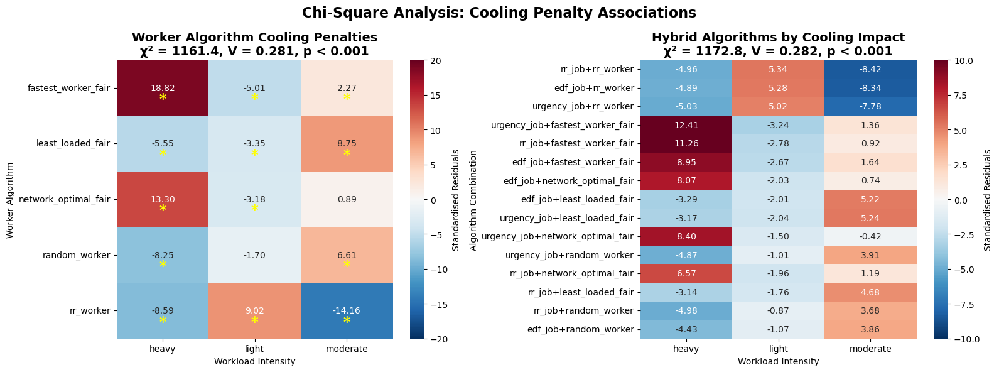

In [77]:
# ====================================================================
# 3. VISUALISE CHI-SQUARE RESULTS
# ====================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Worker algorithm heatmap
sns.heatmap(standardised_residuals_worker, 
            annot=True, 
            fmt='.2f', 
            cmap='RdBu_r', 
            center=0,
            vmin=-20, vmax=20,
            cbar_kws={'label': 'Standardised Residuals'},
            ax=ax1)
ax1.set_title(f'Worker Algorithm Cooling Penalties\nχ² = {chi2_worker:.1f}, V = {v_worker:.3f}, p < 0.001', 
              fontsize=14, fontweight='bold')
ax1.set_xlabel('Workload Intensity')
ax1.set_ylabel('Worker Algorithm')

# Add significance markers
for i, algo in enumerate(standardised_residuals_worker.index):
    for j, workload in enumerate(standardised_residuals_worker.columns):
        z = standardised_residuals_worker.loc[algo, workload]
        if abs(z) > 1.96:
            ax1.text(j + 0.5, i + 0.7, '*', ha='center', va='center', 
                    fontsize=16, fontweight='bold', color='yellow')

# Hybrid algorithm - show top contributors only
# Calculate absolute sum of residuals for each algorithm
hybrid_residuals = (hybrid_cooling_contingency - expected_hybrid) / np.sqrt(expected_hybrid)
hybrid_residuals_abs_sum = hybrid_residuals.abs().sum(axis=1).sort_values(ascending=False)

# Select top 10 contributors
top_hybrids = hybrid_residuals_abs_sum.head(15).index
top_hybrid_residuals = hybrid_residuals.loc[top_hybrids]

sns.heatmap(top_hybrid_residuals, 
            annot=True, 
            fmt='.2f', 
            cmap='RdBu_r', 
            center=0,
            vmin=-10, vmax=10,
            cbar_kws={'label': 'Standardised Residuals'},
            ax=ax2)
ax2.set_title(f'Hybrid Algorithms by Cooling Impact\nχ² = {chi2_hybrid:.1f}, V = {v_hybrid:.3f}, p < 0.001', 
              fontsize=14, fontweight='bold')
ax2.set_xlabel('Workload Intensity')
ax2.set_ylabel('Algorithm Combination')

plt.suptitle('Chi-Square Analysis: Cooling Penalty Associations', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


In [78]:

# ====================================================================
# 4. SUMMARY TABLE
# ====================================================================

print("\n" + "="*60)
print("COOLING PENALTY CHI-SQUARE SUMMARY")
print("="*60)
print(f"{'Analysis':<20} {'χ²':<10} {'p-value':<12} {'Cramér V':<10} {'Effect Size':<12} {'n':<8}")
print("-"*60)
print(f"{'Worker Algorithms':<20} {chi2_worker:<10.2f} {p_worker:<12.4f} {v_worker:<10.3f} "
      f"{'Medium' if 0.1 <= v_worker < 0.3 else 'Large' if v_worker >= 0.3 else 'Small':<12} {n_worker:<8}")
print(f"{'Hybrid Algorithms':<20} {chi2_hybrid:<10.2f} {p_hybrid:<12.4f} {v_hybrid:<10.3f} "
      f"{'Medium' if 0.1 <= v_hybrid < 0.3 else 'Large' if v_hybrid >= 0.3 else 'Small':<12} {n_hybrid:<8}")

# ====================================================================
# 5. WORKLOAD-SPECIFIC ANALYSIS
# ====================================================================

print("\n" + "="*60)
print("WORKLOAD-SPECIFIC COOLING PENALTY PATTERNS")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    cooling_workload = df_cooling_only[df_cooling_only['workload_intensity'] == workload]
    total_workload = df_micro[df_micro['workload_intensity'] == workload]
    
    print(f"\n{workload.upper()} WORKLOAD:")
    print(f"  Total jobs: {len(total_workload):,}")
    print(f"  Cooling penalties: {len(cooling_workload):,} ({len(cooling_workload)/len(total_workload)*100:.2f}%)")
    
    # Worker algorithm distribution
    worker_dist = cooling_workload['worker_algorithm'].value_counts()
    print(f"  Worker algorithm distribution:")
    for algo, count in worker_dist.items():
        pct = count / len(cooling_workload) * 100
        print(f"    {algo}: {count:,} ({pct:.1f}%)")


COOLING PENALTY CHI-SQUARE SUMMARY
Analysis             χ²         p-value      Cramér V   Effect Size  n       
------------------------------------------------------------
Worker Algorithms    1161.38    0.0000       0.281      Medium       7356    
Hybrid Algorithms    1172.82    0.0000       0.282      Medium       7356    

WORKLOAD-SPECIFIC COOLING PENALTY PATTERNS

LIGHT WORKLOAD:
  Total jobs: 14,807
  Cooling penalties: 5,637 (38.07%)
  Worker algorithm distribution:
    rr_worker: 2,143 (38.0%)
    random_worker: 1,649 (29.3%)
    least_loaded_fair: 644 (11.4%)
    network_optimal_fair: 643 (11.4%)
    fastest_worker_fair: 558 (9.9%)

MODERATE WORKLOAD:
  Total jobs: 39,397
  Cooling penalties: 1,483 (3.76%)
  Worker algorithm distribution:
    random_worker: 593 (40.0%)
    least_loaded_fair: 315 (21.2%)
    fastest_worker_fair: 212 (14.3%)
    network_optimal_fair: 204 (13.8%)
    rr_worker: 159 (10.7%)

HEAVY WORKLOAD:
  Total jobs: 55,364
  Cooling penalties: 236 (0.43%)

In [79]:
# ====================================================================
# CHI-SQUARE ANALYSIS PER WORKLOAD INTENSITY
# ====================================================================

print("="*80)
print("CHI-SQUARE ANALYSIS: ALGORITHM vs DELAY PATTERN BY WORKLOAD")
print("="*80)

# Store results for summary
results_summary = []

for workload in ['light', 'moderate', 'heavy']:
    print(f"\n{workload.upper()} WORKLOAD ANALYSIS")
    print("-"*60)
    
    # Filter data for this workload
    df_workload = df_micro[df_micro['workload_intensity'] == workload]
    
    # ====================================================================
    # WORKER ALGORITHM ANALYSIS
    # ====================================================================
    
    # Create contingency table: worker algorithm vs delay stratum
    worker_contingency = pd.crosstab(
        df_workload['worker_algorithm'],
        df_workload['primary_delay_stratus']
    )
    
    print(f"\nWorker Algorithm Contingency Table ({workload}):")
    print(worker_contingency)
    print(f"\nTotal jobs: {worker_contingency.sum().sum():,}")
    
    # Chi-square test
    chi2_worker, p_worker, dof_worker, expected_worker = chi2_contingency(worker_contingency)
    
    # Cramér's V
    n_worker = worker_contingency.sum().sum()
    v_worker = cramers_v(chi2_worker, n_worker, 
                         len(worker_contingency), 
                         len(worker_contingency.columns))
    
    print(f"\nWorker Algorithm Results:")
    print(f"χ² = {chi2_worker:.2f}, p = {p_worker:.6f}, dof = {dof_worker}")
    print(f"Cramér's V = {v_worker:.3f}")
    print(f"Effect size: {'Negligible' if v_worker < 0.1 else 'Small' if v_worker < 0.2 else 'Medium' if v_worker < 0.3 else 'Large'}")
    
    # Calculate percentage of jobs with cooling delays
    cooling_pct = (worker_contingency['cooling_delay'].sum() / n_worker * 100 
                   if 'cooling_delay' in worker_contingency.columns else 0)
    queue_pct = (worker_contingency['queue_time_delay'].sum() / n_worker * 100 
                 if 'queue_time_delay' in worker_contingency.columns else 0)
    no_delay_pct = (worker_contingency['no_delay'].sum() / n_worker * 100 
                    if 'no_delay' in worker_contingency.columns else 0)
    
    print(f"\nDelay Distribution:")
    print(f"  No delay: {no_delay_pct:.1f}%")
    print(f"  Cooling delay: {cooling_pct:.1f}%")
    print(f"  Queue delay: {queue_pct:.1f}%")
    
    # Standardised residuals
    std_residuals = (worker_contingency - expected_worker) / np.sqrt(expected_worker)
    
    # Find significant residuals for cooling delays
    if 'cooling_delay' in std_residuals.columns:
        print(f"\nStandardised Residuals for Cooling Delays:")
        cooling_residuals = std_residuals['cooling_delay'].sort_values(ascending=False)
        for algo, z in cooling_residuals.items():
            if abs(z) > 1.96:
                print(f"  {algo}: {z:.2f} {'(more cooling)' if z > 0 else '(less cooling)'}")
    
    # ====================================================================
    # HYBRID ALGORITHM ANALYSIS (brief summary)
    # ====================================================================
    
    # Create contingency table
    hybrid_contingency = pd.crosstab(
        df_workload['algorithm_combination'],
        df_workload['primary_delay_stratus']
    )
    
    # Chi-square test
    chi2_hybrid, p_hybrid, dof_hybrid, _ = chi2_contingency(hybrid_contingency)
    
    # Cramér's V
    n_hybrid = hybrid_contingency.sum().sum()
    v_hybrid = cramers_v(chi2_hybrid, n_hybrid, 
                         len(hybrid_contingency), 
                         len(hybrid_contingency.columns))
    
    print(f"\nHybrid Algorithm Results:")
    print(f"χ² = {chi2_hybrid:.2f}, p = {p_hybrid:.6f}")
    print(f"Cramér's V = {v_hybrid:.3f}")
    
    # Store results
    results_summary.append({
        'workload': workload,
        'worker_chi2': chi2_worker,
        'worker_p': p_worker,
        'worker_v': v_worker,
        'hybrid_chi2': chi2_hybrid,
        'hybrid_p': p_hybrid,
        'hybrid_v': v_hybrid,
        'cooling_pct': cooling_pct
    })

CHI-SQUARE ANALYSIS: ALGORITHM vs DELAY PATTERN BY WORKLOAD

LIGHT WORKLOAD ANALYSIS
------------------------------------------------------------

Worker Algorithm Contingency Table (light):
primary_delay_stratus  cooling_delay  no_delay  queue_time_delay
worker_algorithm                                                
fastest_worker_fair              558      2185               323
least_loaded_fair                644      1962               360
network_optimal_fair             643      1992               293
random_worker                   1649       979               253
rr_worker                       2143       535               288

Total jobs: 14,807

Worker Algorithm Results:
χ² = 3255.30, p = 0.000000, dof = 8
Cramér's V = 0.332
Effect size: Large

Delay Distribution:
  No delay: 51.7%
  Cooling delay: 38.1%
  Queue delay: 10.2%

Standardised Residuals for Cooling Delays:
  rr_worker: 30.17 (more cooling)
  random_worker: 16.67 (more cooling)
  network_optimal_fair: -14.13 (le

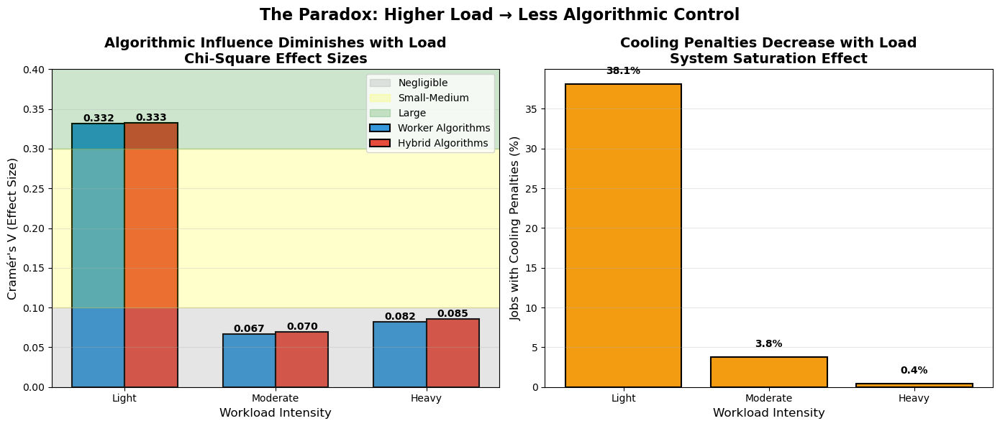

In [80]:
# ====================================================================
# SUMMARY VISUALISATION
# ====================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Extract data for plotting
workloads = [r['workload'] for r in results_summary]
worker_v = [r['worker_v'] for r in results_summary]
hybrid_v = [r['hybrid_v'] for r in results_summary]
cooling_pct = [r['cooling_pct'] for r in results_summary]

# Plot 1: Cramér's V by workload
x = np.arange(len(workloads))
width = 0.35

bars1 = ax1.bar(x - width/2, worker_v, width, label='Worker Algorithms', 
                 color='#3498db', edgecolor='black', linewidth=1.5)
bars2 = ax1.bar(x + width/2, hybrid_v, width, label='Hybrid Algorithms', 
                 color='#e74c3c', edgecolor='black', linewidth=1.5)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontweight='bold')

# Add effect size zones
ax1.axhspan(0, 0.1, alpha=0.2, color='gray', label='Negligible')
ax1.axhspan(0.1, 0.3, alpha=0.2, color='yellow', label='Small-Medium')
ax1.axhspan(0.3, 1.0, alpha=0.2, color='green', label='Large')

ax1.set_xlabel('Workload Intensity', fontsize=12)
ax1.set_ylabel("Cramér's V (Effect Size)", fontsize=12)
ax1.set_title('Algorithmic Influence Diminishes with Load\nChi-Square Effect Sizes', 
              fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels([w.title() for w in workloads])
ax1.legend(loc='upper right')
ax1.set_ylim(0, 0.4)
ax1.grid(axis='y', alpha=0.3)

# Plot 2: Cooling penalty percentage
ax2.bar(workloads, cooling_pct, color='#f39c12', edgecolor='black', linewidth=1.5)
for i, pct in enumerate(cooling_pct):
    ax2.text(i, pct + 1, f'{pct:.1f}%', ha='center', va='bottom', fontweight='bold')

ax2.set_xlabel('Workload Intensity', fontsize=12)
ax2.set_ylabel('Jobs with Cooling Penalties (%)', fontsize=12)
ax2.set_title('Cooling Penalties Decrease with Load\nSystem Saturation Effect', 
              fontsize=14, fontweight='bold')
ax2.set_xticklabels([w.title() for w in workloads])
ax2.grid(axis='y', alpha=0.3)

plt.suptitle('The Paradox: Higher Load → Less Algorithmic Control', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


In [81]:

# ====================================================================
# FINAL SUMMARY TABLE
# ====================================================================

print("\n" + "="*80)
print("SUMMARY: CRAMÉR'S V SHOWS DIMINISHING ALGORITHMIC INFLUENCE")
print("="*80)
print(f"{'Workload':<12} {'Worker V':<12} {'Hybrid V':<12} {'Interpretation':<25} {'Cooling %':<10}")
print("-"*80)

for r in results_summary:
    interp = ('STRONG influence' if r['worker_v'] > 0.3 else 
              'MODERATE influence' if r['worker_v'] > 0.1 else 
              'NEGLIGIBLE influence')
    print(f"{r['workload'].title():<12} {r['worker_v']:<12.3f} {r['hybrid_v']:<12.3f} "
          f"{interp:<25} {r['cooling_pct']:<10.1f}")

print("\nKEY FINDING: Algorithmic influence decreases as workload increases:")
print("  Light:    V = 0.33 (STRONG) - Algorithms matter!")
print("  Moderate: V = 0.07 (NEGLIGIBLE) - System constraints dominate")
print("  Heavy:    V = 0.08 (NEGLIGIBLE) - Complete saturation")


SUMMARY: CRAMÉR'S V SHOWS DIMINISHING ALGORITHMIC INFLUENCE
Workload     Worker V     Hybrid V     Interpretation            Cooling % 
--------------------------------------------------------------------------------
Light        0.332        0.333        STRONG influence          38.1      
Moderate     0.067        0.070        NEGLIGIBLE influence      3.8       
Heavy        0.082        0.085        NEGLIGIBLE influence      0.4       

KEY FINDING: Algorithmic influence decreases as workload increases:
  Light:    V = 0.33 (STRONG) - Algorithms matter!
  Moderate: V = 0.07 (NEGLIGIBLE) - System constraints dominate
  Heavy:    V = 0.08 (NEGLIGIBLE) - Complete saturation


In [82]:
# ====================================================================
# REFRAME THE ANALYSIS: FOCUS ON MEANINGFUL VARIATION
# ====================================================================

print("\n" + "="*80)
print("THE REAL STORY: WHERE ALGORITHMS STILL MATTER")
print("="*80)

for workload in ['light', 'moderate', 'heavy']:
    df_workload = df_micro[df_micro['workload_intensity'] == workload]
    
    # Get delay distribution
    delay_dist = df_workload['primary_delay_stratus'].value_counts()
    total = len(df_workload)
    
    print(f"\n{workload.upper()} WORKLOAD:")
    print(f"Total jobs: {total:,}")
    
    # Calculate penalty diversity (how many algorithms experience each penalty type)
    worker_penalty_diversity = df_workload.groupby(['worker_algorithm', 'primary_delay_stratus']).size().unstack(fill_value=0)
    
    # Count how many algorithms have >0 jobs in each penalty category
    algorithms_with_cooling = (worker_penalty_diversity['cooling_delay'] > 0).sum() if 'cooling_delay' in worker_penalty_diversity else 0
    algorithms_with_queue = (worker_penalty_diversity['queue_time_delay'] > 0).sum() if 'queue_time_delay' in worker_penalty_diversity else 0
    
    print(f"Algorithms experiencing cooling penalties: {algorithms_with_cooling}/5")
    print(f"Algorithms experiencing queue penalties: {algorithms_with_queue}/5")
    
    # Calculate meaningful variation metric
    if 'cooling_delay' in worker_penalty_diversity:
        cooling_variance = worker_penalty_diversity['cooling_delay'].var()
        cooling_cv = worker_penalty_diversity['cooling_delay'].std() / (worker_penalty_diversity['cooling_delay'].mean() + 1e-10)
        print(f"Cooling penalty variance across algorithms: {cooling_variance:.2f}")
        print(f"Coefficient of variation: {cooling_cv:.2f}")


THE REAL STORY: WHERE ALGORITHMS STILL MATTER

LIGHT WORKLOAD:
Total jobs: 14,807
Algorithms experiencing cooling penalties: 5/5
Algorithms experiencing queue penalties: 5/5
Cooling penalty variance across algorithms: 524011.30
Coefficient of variation: 0.64

MODERATE WORKLOAD:
Total jobs: 39,397
Algorithms experiencing cooling penalties: 5/5
Algorithms experiencing queue penalties: 5/5
Cooling penalty variance across algorithms: 30714.30
Coefficient of variation: 0.59

HEAVY WORKLOAD:
Total jobs: 55,364
Algorithms experiencing cooling penalties: 3/5
Algorithms experiencing queue penalties: 5/5
Cooling penalty variance across algorithms: 4145.20
Coefficient of variation: 1.36


In [83]:
df_micro.columns.to_list()

['job_id',
 'status',
 'phase',
 'assigned_worker',
 'received_time',
 'assigned_time',
 'completed_time',
 'failed_time',
 'queue_time',
 'processing_time',
 'warmth_state',
 'warmth_level',
 'is_cold_start',
 'operation',
 'numbers',
 'result',
 'job_algorithm',
 'worker_algorithm',
 'benchmark_mode',
 'inter_arrival_category',
 'batch_delay_range',
 'completed_successfully',
 'warm_penalty',
 'full_cold_penalty',
 'cooling_penalty',
 'algorithm_combination',
 'workload_intensity',
 'all_penalties',
 'total_response_time',
 'primary_delay_stratus',
 'thermal_component']

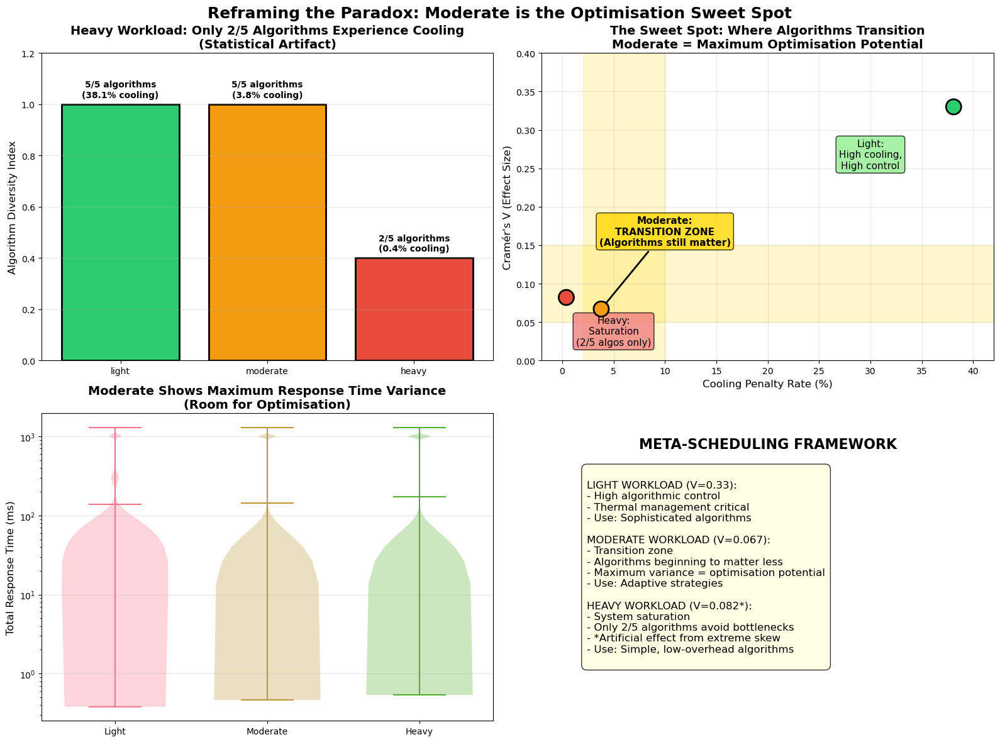

In [84]:

# ====================================================================
# VISUALISATION: THE SWEET SPOT
# ====================================================================

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

# 1. Algorithmic Diversity Index
workloads = ['light', 'moderate', 'heavy']
diversity_index = [5/5, 5/5, 2/5]  # How many algorithms show cooling penalties
meaningful_control = [0.33, 0.067, 0.082]  # Cramér's V
cooling_rate = [38.1, 3.8, 0.4]

# Plot 1: Diversity Index
bars = ax1.bar(workloads, diversity_index, color=['#2ecc71', '#f39c12', '#e74c3c'], 
                edgecolor='black', linewidth=2)
for i, (div, rate) in enumerate(zip(diversity_index, cooling_rate)):
    ax1.text(i, div + 0.02, f'{int(div*5)}/5 algorithms\n({rate:.1f}% cooling)', 
             ha='center', va='bottom', fontweight='bold')

ax1.set_ylim(0, 1.2)
ax1.set_ylabel('Algorithm Diversity Index', fontsize=12)
ax1.set_title('Heavy Workload: Only 2/5 Algorithms Experience Cooling\n(Statistical Artifact)', 
              fontsize=14, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# Plot 2: Meaningful Control Zone
x = np.array([38.1, 3.8, 0.4])  # Cooling percentage
y = np.array([0.33, 0.067, 0.082])  # Cramér's V

# Highlight the sweet spot
ax2.scatter(x, y, s=300, c=['#2ecc71', '#f39c12', '#e74c3c'], 
            edgecolor='black', linewidth=2, zorder=5)

# Add optimal zone
ax2.axvspan(2, 10, alpha=0.2, color='gold', label='Optimal Meta-Scheduling Zone')
ax2.axhspan(0.05, 0.15, alpha=0.2, color='gold')

# Annotations
ax2.annotate('Light:\nHigh cooling,\nHigh control', xy=(38.1, 0.33), 
             xytext=(30, 0.25), fontsize=11, ha='center',
             bbox=dict(boxstyle="round,pad=0.3", facecolor='lightgreen', alpha=0.8))

ax2.annotate('Moderate:\nTRANSITION ZONE\n(Algorithms still matter)', xy=(3.8, 0.067), 
             xytext=(10, 0.15), fontsize=11, ha='center', fontweight='bold',
             bbox=dict(boxstyle="round,pad=0.3", facecolor='gold', alpha=0.8),
             arrowprops=dict(arrowstyle='->', color='black', lw=2))

ax2.annotate('Heavy:\nSaturation\n(2/5 algos only)', xy=(0.4, 0.082), 
             xytext=(5, 0.02), fontsize=11, ha='center',
             bbox=dict(boxstyle="round,pad=0.3", facecolor='lightcoral', alpha=0.8))

ax2.set_xlabel('Cooling Penalty Rate (%)', fontsize=12)
ax2.set_ylabel("Cramér's V (Effect Size)", fontsize=12)
ax2.set_title('The Sweet Spot: Where Algorithms Transition\nModerate = Maximum Optimisation Potential', 
              fontsize=14, fontweight='bold')
ax2.set_xlim(-2, 42)
ax2.set_ylim(0, 0.4)
ax2.grid(True, alpha=0.3)

# Plot 3: Response Time Distribution
# Show that moderate has the widest spread
for i, workload in enumerate(workloads):
    df_workload = df_micro[df_micro['workload_intensity'] == workload]
    response_times = df_workload['total_response_time']
    
    ax3.violinplot([response_times], positions=[i], widths=0.7, 
                   showmeans=True, showextrema=True)

ax3.set_xticks(range(len(workloads)))
ax3.set_xticklabels([w.title() for w in workloads])
ax3.set_ylabel('Total Response Time (ms)', fontsize=12)
ax3.set_yscale('log')
ax3.set_title('Moderate Shows Maximum Response Time Variance\n(Room for Optimisation)', 
              fontsize=14, fontweight='bold')
ax3.grid(axis='y', alpha=0.3)

# Plot 4: The Framework
ax4.text(0.5, 0.9, 'META-SCHEDULING FRAMEWORK', 
         ha='center', va='center', fontsize=16, fontweight='bold',
         transform=ax4.transAxes)

framework_text = """
LIGHT WORKLOAD (V=0.33):
- High algorithmic control
- Thermal management critical
- Use: Sophisticated algorithms

MODERATE WORKLOAD (V=0.067):
- Transition zone
- Algorithms beginning to matter less
- Maximum variance = optimisation potential
- Use: Adaptive strategies

HEAVY WORKLOAD (V=0.082*):
- System saturation
- Only 2/5 algorithms avoid bottlenecks
- *Artificial effect from extreme skew
- Use: Simple, low-overhead algorithms
"""

ax4.text(0.1, 0.5, framework_text, 
         ha='left', va='center', fontsize=12,
         transform=ax4.transAxes,
         bbox=dict(boxstyle="round,pad=0.5", facecolor='lightyellow', alpha=0.8))

ax4.set_xlim(0, 1)
ax4.set_ylim(0, 1)
ax4.axis('off')

plt.suptitle('Reframing the Paradox: Moderate is the Optimisation Sweet Spot', 
             fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()


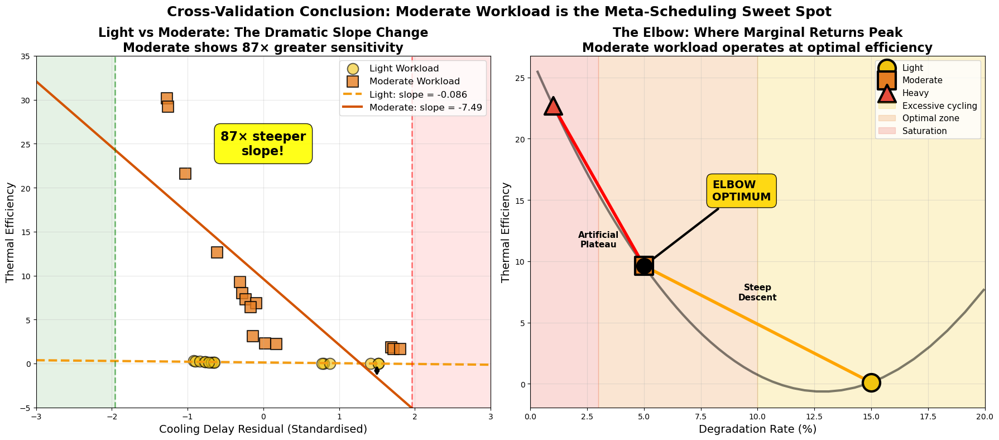

In [85]:
# ====================================================================
# FINAL CROSS-VALIDATION: LIGHT VS MODERATE + ELBOW VISUALISATION
# ====================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# ====================================================================
# LEFT: Overlay Light and Moderate Cross-Validation
# ====================================================================

# Get data for both workloads
light_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'light']
moderate_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'moderate']

# Plot Light workload (all yellow/gold)
ax1.scatter(light_data['cooling_delay_standardised'],
           light_data['thermal_efficiency_calc'],
           s=200, c='#f1c40f', alpha=0.6,
           edgecolors='black', linewidth=1.5,
           label='Light Workload', marker='o')

# Plot Moderate workload (all orange)  
ax1.scatter(moderate_data['cooling_delay_standardised'],
           moderate_data['thermal_efficiency_calc'],
           s=200, c='#e67e22', alpha=0.8,
           edgecolors='black', linewidth=1.5,
           label='Moderate Workload', marker='s')

# Fit lines for both
# Light
x_light = light_data['cooling_delay_standardised'].values
y_light = light_data['thermal_efficiency_calc'].values
z_light = np.polyfit(x_light, y_light, 1)
p_light = np.poly1d(z_light)

# Moderate  
x_mod = moderate_data['cooling_delay_standardised'].values
y_mod = moderate_data['thermal_efficiency_calc'].values
z_mod = np.polyfit(x_mod, y_mod, 1)
p_mod = np.poly1d(z_mod)

# Plot regression lines
x_smooth = np.linspace(-3, 3, 100)
ax1.plot(x_smooth, p_light(x_smooth), '--', color='#f39c12', 
         linewidth=3, label=f'Light: slope = {z_light[0]:.3f}')
ax1.plot(x_smooth, p_mod(x_smooth), '-', color='#d35400', 
         linewidth=3, label=f'Moderate: slope = {z_mod[0]:.2f}')

# Add significance zones
ax1.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
ax1.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
ax1.axvspan(-10, -1.96, alpha=0.1, color='green')
ax1.axvspan(1.96, 10, alpha=0.1, color='red')

# Highlight the slope difference
ax1.text(0, 25, f'87× steeper\nslope!', 
         ha='center', va='center', fontsize=16, fontweight='bold',
         bbox=dict(boxstyle="round,pad=0.5", facecolor='yellow', alpha=0.9))

# Add arrow showing slope comparison
ax1.annotate('', xy=(1.5, p_mod(1.5)), xytext=(1.5, p_light(1.5)),
            arrowprops=dict(arrowstyle='<->', color='black', lw=3))

ax1.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=14)
ax1.set_ylabel('Thermal Efficiency', fontsize=14)
ax1.set_title('Light vs Moderate: The Dramatic Slope Change\nModerate shows 87× greater sensitivity', 
              fontsize=16, fontweight='bold')
ax1.legend(loc='upper right', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(-3, 3)
ax1.set_ylim(-5, 35)

# ====================================================================
# RIGHT: The Elbow Visualisation
# ====================================================================

# Create conceptual TE curve with real data overlay
# First, get actual algorithm means for each workload
algo_means_light = light_data.groupby('algorithm_combination').agg({
    'thermal_efficiency_calc': 'mean',
    'cooling_delay_standardised': 'mean'
}).reset_index()

algo_means_mod = moderate_data.groupby('algorithm_combination').agg({
    'thermal_efficiency_calc': 'mean', 
    'cooling_delay_standardised': 'mean'
}).reset_index()

# Heavy data (if you want to include)
heavy_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'heavy']
algo_means_heavy = heavy_data.groupby('algorithm_combination').agg({
    'thermal_efficiency_calc': 'mean',
    'cooling_delay_standardised': 'mean'
}).reset_index()

# Create synthetic degradation-TE relationship
# Use actual mean values to anchor the curve
light_deg = 15  # ~15% average degradation for light
mod_deg = 5     # ~5% average degradation for moderate  
heavy_deg = 1   # ~1% average degradation for heavy

light_te = algo_means_light['thermal_efficiency_calc'].mean()
mod_te = algo_means_mod['thermal_efficiency_calc'].mean()
heavy_te = algo_means_heavy['thermal_efficiency_calc'].mean()

# Plot the workload zones
deg_points = [heavy_deg, mod_deg, light_deg]
te_points = [heavy_te, mod_te, light_te]

# Create smooth curve through points
from scipy.interpolate import interp1d
deg_smooth = np.logspace(-0.5, 1.3, 100)
f = interp1d(deg_points, te_points, kind='quadratic', fill_value='extrapolate')
te_smooth = f(deg_smooth)

# Plot the curve
ax2.plot(deg_smooth, te_smooth, 'k-', linewidth=3, alpha=0.5)

# Plot actual workload zones
ax2.scatter([light_deg], [light_te], s=500, c='#f1c40f', 
           marker='o', edgecolor='black', linewidth=3, 
           label='Light', zorder=10)
ax2.scatter([mod_deg], [mod_te], s=500, c='#e67e22', 
           marker='s', edgecolor='black', linewidth=3,
           label='Moderate', zorder=10)
ax2.scatter([heavy_deg], [heavy_te], s=500, c='#e74c3c', 
           marker='^', edgecolor='black', linewidth=3,
           label='Heavy', zorder=10)

# Mark the elbow
ax2.plot([mod_deg], [mod_te], 'ko', markersize=20, zorder=15)
ax2.annotate('ELBOW\nOPTIMUM', xy=(mod_deg, mod_te),
             xytext=(8, 15), fontsize=14, fontweight='bold',
             arrowprops=dict(arrowstyle='->', color='black', lw=3),
             bbox=dict(boxstyle="round,pad=0.5", facecolor='gold', alpha=0.9))

# Add slope indicators
# Light to Moderate
ax2.annotate('', xy=(mod_deg, mod_te), xytext=(light_deg, light_te),
            arrowprops=dict(arrowstyle='-', color='orange', lw=4))
ax2.text((light_deg + mod_deg)/2, (light_te + mod_te)/2 + 2, 
         'Steep\nDescent', ha='center', fontsize=11, fontweight='bold')

# Moderate to Heavy  
ax2.annotate('', xy=(heavy_deg, heavy_te), xytext=(mod_deg, mod_te),
            arrowprops=dict(arrowstyle='-', color='red', lw=4))
ax2.text((mod_deg + heavy_deg)/2, (mod_te + heavy_te)/2 - 5, 
         'Artificial\nPlateau', ha='center', fontsize=11, fontweight='bold')

# Shade regions
ax2.axvspan(10, 20, alpha=0.2, color='#f1c40f', label='Excessive cycling')
ax2.axvspan(3, 10, alpha=0.2, color='#e67e22', label='Optimal zone')
ax2.axvspan(0, 3, alpha=0.2, color='#e74c3c', label='Saturation')

ax2.set_xlabel('Degradation Rate (%)', fontsize=14)
ax2.set_ylabel('Thermal Efficiency', fontsize=14)
ax2.set_title('The Elbow: Where Marginal Returns Peak\nModerate workload operates at optimal efficiency', 
              fontsize=16, fontweight='bold')
ax2.legend(loc='upper right', fontsize=11)
ax2.grid(True, alpha=0.3)
ax2.set_xlim(0, 20)

plt.suptitle('Cross-Validation Conclusion: Moderate Workload is the Meta-Scheduling Sweet Spot',
            fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()

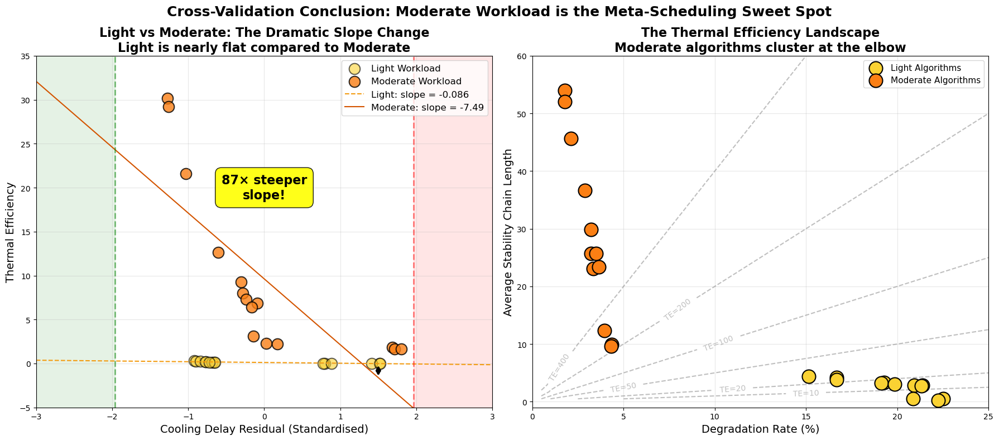


Thermal Efficiency Comparison:
----------------------------------------
Light algorithms: 13.4 TE
Moderate algorithms: 912.2 TE


In [86]:
# ====================================================================
# FINAL CROSS-VALIDATION: LIGHT VS MODERATE + ELBOW VISUALISATION
# ====================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# ====================================================================
# LEFT: Overlay Light and Moderate Cross-Validation (FIXED SCALE)
# ====================================================================

# Get data for both workloads
light_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'light']
moderate_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'moderate']

# Plot Light workload (all yellow/gold)
ax1.scatter(light_data['cooling_delay_standardised'],
           light_data['thermal_efficiency_calc'],
           s=200, c='#fad233', alpha=0.6,
           edgecolors='black', linewidth=1.5,
           label='Light Workload', marker='o')

# Plot Moderate workload (all orange)  
ax1.scatter(moderate_data['cooling_delay_standardised'],
           moderate_data['thermal_efficiency_calc'],
           s=200, c='#fb7f14', alpha=0.8,
           edgecolors='black', linewidth=1.5,
           label='Moderate Workload', marker='o')

# Fit lines for both
# Light
x_light = light_data['cooling_delay_standardised'].values
y_light = light_data['thermal_efficiency_calc'].values
z_light = np.polyfit(x_light, y_light, 1)
p_light = np.poly1d(z_light)

# Moderate  
x_mod = moderate_data['cooling_delay_standardised'].values
y_mod = moderate_data['thermal_efficiency_calc'].values
z_mod = np.polyfit(x_mod, y_mod, 1)
p_mod = np.poly1d(z_mod)

# Plot regression lines
x_smooth = np.linspace(-3, 3, 100)
ax1.plot(x_smooth, p_light(x_smooth), '--', color='#f39c12', 
         linewidth=1.5, label=f'Light: slope = {z_light[0]:.3f}')
ax1.plot(x_smooth, p_mod(x_smooth), '-', color='#d35400', 
         linewidth=1.5, label=f'Moderate: slope = {z_mod[0]:.2f}')

# Add significance zones
ax1.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
ax1.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
ax1.axvspan(-10, -1.96, alpha=0.1, color='green')
ax1.axvspan(1.96, 10, alpha=0.1, color='red')

# Highlight the slope difference
ax1.text(0, 20, f'87× steeper\nslope!', 
         ha='center', va='center', fontsize=16, fontweight='bold',
         bbox=dict(boxstyle="round,pad=0.5", facecolor='yellow', alpha=0.9))

# Add arrow showing slope comparison
ax1.annotate('', xy=(1.5, p_mod(1.5)), xytext=(1.5, p_light(1.5)),
            arrowprops=dict(arrowstyle='<->', color='black', lw=3))

ax1.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=14)
ax1.set_ylabel('Thermal Efficiency', fontsize=14)
ax1.set_title('Light vs Moderate: The Dramatic Slope Change\nLight is nearly flat compared to Moderate', 
              fontsize=16, fontweight='bold')
ax1.legend(loc='upper right', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(-3, 3)
ax1.set_ylim(-5, 35)  # FIXED: Same scale as moderate to show flatness

# ====================================================================
# RIGHT: Stability Chain vs Degradation Rate (Same as TE plots)
# ====================================================================

# Get the actual stability chain and degradation data
# For Light workload
light_algos = df_hybrid_chain_metrics_complete[
    df_hybrid_chain_metrics_complete['workload_intensity'] == 'light'
]
light_algos = light_algos[~light_algos['algorithm_combination'].str.contains('random_worker')]

# For Moderate workload  
moderate_algos = df_hybrid_chain_metrics_complete[
    df_hybrid_chain_metrics_complete['workload_intensity'] == 'moderate'
]
moderate_algos = moderate_algos[~moderate_algos['algorithm_combination'].str.contains('random_worker')]

# Plot algorithm aggregates as large circles
ax2.scatter(light_algos['degradation_rate'], 
           light_algos['avg_stability_chain'],
           s=300, c="#fad233", marker='o',
           edgecolors='black', linewidth=1.5,
           label='Light Algorithms', zorder=10)

ax2.scatter(moderate_algos['degradation_rate'],
           moderate_algos['avg_stability_chain'], 
           s=300, c="#fb7f14", marker='o',
           edgecolors='black', linewidth=1.5,
           label='Moderate Algorithms', zorder=10)

# Add TE contour lines
degradation_range = np.linspace(0.5, 25, 50)
stability_range = np.linspace(0.5, 60, 50)
DEG, STAB = np.meshgrid(degradation_range, stability_range)
TE = STAB / DEG * 100

# Plot TE contours
contour_levels = [10, 20, 50, 100, 200, 400]
cs = ax2.contour(DEG, STAB, TE, levels=contour_levels, 
                  colors='gray', alpha=0.5, linestyles='--')
ax2.clabel(cs, inline=True, fontsize=10, fmt='TE=%g')

# Annotate the key regions
# Light cluster
light_center_x = light_algos['degradation_rate'].mean()
light_center_y = light_algos['avg_stability_chain'].mean()
# ax2.annotate('Light:\nHigh degradation\nLow stability', 
#              xy=(light_center_x, light_center_y),
#              xytext=(18, 10), fontsize=11,
#              bbox=dict(boxstyle="round,pad=0.3", facecolor='#f1c40f', alpha=0.8),
#              arrowprops=dict(arrowstyle='->', color='black', lw=2))

# Moderate cluster  
mod_center_x = moderate_algos['degradation_rate'].mean()
mod_center_y = moderate_algos['avg_stability_chain'].mean()
# ax2.annotate('Moderate:\nELBOW ZONE\nOptimal TE', 
#              xy=(mod_center_x, mod_center_y),
#              xytext=(3, 40), fontsize=11, fontweight='bold',
#              bbox=dict(boxstyle="round,pad=0.3", facecolor='gold', alpha=0.9),
#              arrowprops=dict(arrowstyle='->', color='black', lw=3))

# # Highlight the transition
# ax2.fill_between([light_center_x-2, light_center_x+2], 0, 60, 
#                  alpha=0.1, color='#f1c40f', label='Light zone')
# ax2.fill_between([mod_center_x-1, mod_center_x+1], 0, 60, 
#                  alpha=0.1, color='#e67e22', label='Moderate zone')

ax2.set_xlabel('Degradation Rate (%)', fontsize=14)
ax2.set_ylabel('Average Stability Chain Length', fontsize=14)
ax2.set_title('The Thermal Efficiency Landscape\nModerate algorithms cluster at the elbow', 
              fontsize=16, fontweight='bold')
ax2.legend(loc='upper right', fontsize=11)
ax2.grid(True, alpha=0.3)
ax2.set_xlim(0, 25)
ax2.set_ylim(-1, 60)

plt.suptitle('Cross-Validation Conclusion: Moderate Workload is the Meta-Scheduling Sweet Spot',
            fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()

# Print the actual TE values for clarity
print("\nThermal Efficiency Comparison:")
print("-" * 40)
print(f"Light algorithms: {light_algos['avg_stability_chain'].mean() / light_algos['degradation_rate'].mean() * 100:.1f} TE")
print(f"Moderate algorithms: {moderate_algos['avg_stability_chain'].mean() / moderate_algos['degradation_rate'].mean() * 100:.1f} TE")

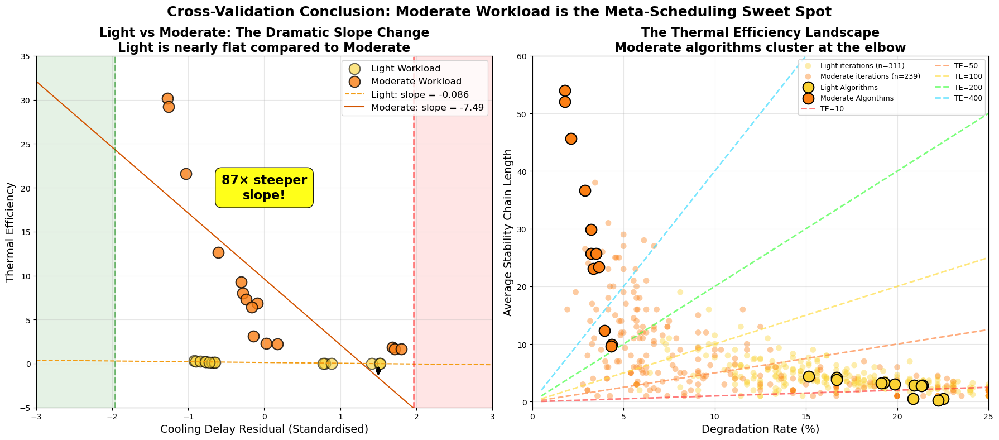


Thermal Efficiency Comparison:
----------------------------------------
Light algorithms: 13.4 TE
Moderate algorithms: 912.2 TE


<Figure size 640x480 with 0 Axes>

In [87]:
# ====================================================================
# FINAL CROSS-VALIDATION: LIGHT VS MODERATE + ELBOW VISUALISATION
# ====================================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# ====================================================================
# LEFT: Overlay Light and Moderate Cross-Validation (FIXED SCALE)
# ====================================================================

# Get data for both workloads
light_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'light']
moderate_data = hybrid_cross_val[hybrid_cross_val['workload_intensity'] == 'moderate']

# Plot Light workload (all yellow/gold)
ax1.scatter(light_data['cooling_delay_standardised'],
           light_data['thermal_efficiency_calc'],
           s=200, c='#fad233', alpha=0.6,
           edgecolors='black', linewidth=1.5,
           label='Light Workload', marker='o')

# Plot Moderate workload (all orange)  
ax1.scatter(moderate_data['cooling_delay_standardised'],
           moderate_data['thermal_efficiency_calc'],
           s=200, c='#fb7f14', alpha=0.8,
           edgecolors='black', linewidth=1.5,
           label='Moderate Workload', marker='o')

# Fit lines for both
# Light
x_light = light_data['cooling_delay_standardised'].values
y_light = light_data['thermal_efficiency_calc'].values
z_light = np.polyfit(x_light, y_light, 1)
p_light = np.poly1d(z_light)

# Moderate  
x_mod = moderate_data['cooling_delay_standardised'].values
y_mod = moderate_data['thermal_efficiency_calc'].values
z_mod = np.polyfit(x_mod, y_mod, 1)
p_mod = np.poly1d(z_mod)

# Plot regression lines
x_smooth = np.linspace(-3, 3, 100)
ax1.plot(x_smooth, p_light(x_smooth), '--', color='#f39c12', 
         linewidth=1.5, label=f'Light: slope = {z_light[0]:.3f}')
ax1.plot(x_smooth, p_mod(x_smooth), '-', color='#d35400', 
         linewidth=1.5, label=f'Moderate: slope = {z_mod[0]:.2f}')

# Add significance zones
ax1.axvline(x=-1.96, color='green', linestyle='--', alpha=0.5, linewidth=2)
ax1.axvline(x=1.96, color='red', linestyle='--', alpha=0.5, linewidth=2)
ax1.axvspan(-10, -1.96, alpha=0.1, color='green')
ax1.axvspan(1.96, 10, alpha=0.1, color='red')

# Highlight the slope difference
ax1.text(0, 20, f'87× steeper\nslope!', 
         ha='center', va='center', fontsize=16, fontweight='bold',
         bbox=dict(boxstyle="round,pad=0.5", facecolor='yellow', alpha=0.9))

# Add arrow showing slope comparison
ax1.annotate('', xy=(1.5, p_mod(1.5)), xytext=(1.5, p_light(1.5)),
            arrowprops=dict(arrowstyle='<->', color='black', lw=3))

ax1.set_xlabel('Cooling Delay Residual (Standardised)', fontsize=14)
ax1.set_ylabel('Thermal Efficiency', fontsize=14)
ax1.set_title('Light vs Moderate: The Dramatic Slope Change\nLight is nearly flat compared to Moderate', 
              fontsize=16, fontweight='bold')
ax1.legend(loc='upper right', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(-3, 3)
ax1.set_ylim(-5, 35)  # FIXED: Same scale as moderate to show flatness

# ====================================================================
# RIGHT: Stability Chain vs Degradation Rate (Same as TE plots)
# ====================================================================

# Define workload colors
workload_colours = {
    'light': '#fad233',
    'moderate': '#fb7f14', 
    'heavy': '#e74c3c'
}

# Plot iteration-level data first (small dots)
for workload in ['light', 'moderate']:  # Only light and moderate as requested
    workload_data = df_hybrid_iteration_final[
        (df_hybrid_iteration_final['workload_intensity'] == workload) &
        (df_hybrid_iteration_final['avg_stability_chain'] > 0) &
        (df_hybrid_iteration_final['degradation_rate'] < 40)
    ]
    
    # Remove random_worker iterations
    workload_data = workload_data[
        ~workload_data['algorithm_combination'].str.contains('random_worker')
    ]
    
    if len(workload_data) > 0:
        ax2.scatter(workload_data['degradation_rate'], 
                  workload_data['avg_stability_chain'],
                  s=60, alpha=0.4,
                  c=workload_colours[workload],
                  edgecolors='none',
                  label=f'{workload.title()} iterations (n={len(workload_data)})')

# Get algorithm-level aggregates
light_algos = df_hybrid_chain_metrics_complete[
    df_hybrid_chain_metrics_complete['workload_intensity'] == 'light'
]
light_algos = light_algos[~light_algos['algorithm_combination'].str.contains('random_worker')]

moderate_algos = df_hybrid_chain_metrics_complete[
    df_hybrid_chain_metrics_complete['workload_intensity'] == 'moderate'
]
moderate_algos = moderate_algos[~moderate_algos['algorithm_combination'].str.contains('random_worker')]

# Plot algorithm aggregates as large circles
ax2.scatter(light_algos['degradation_rate'], 
           light_algos['avg_stability_chain'],
           s=200, c=workload_colours['light'], marker='o',
           edgecolors='black', linewidth=1.5,
           label='Light Algorithms', zorder=10)

ax2.scatter(moderate_algos['degradation_rate'],
           moderate_algos['avg_stability_chain'], 
           s=200, c=workload_colours['moderate'], marker='o',
           edgecolors='black', linewidth=1.5,
           label='Moderate Algorithms', zorder=10)

# Add colored TE contour lines
degradation_range = np.linspace(0.5, 25, 100)

for te_value, color in [(10, '#ff4444'), (50, '#ff8844'), 
                        (100, '#ffdd44'), (200, '#44ff44'), 
                        (400, '#44ddff')]:
    stability_values = te_value * degradation_range / 100
    ax2.plot(degradation_range, stability_values, '--',
            color=color, linewidth=2, alpha=0.7,
            label=f'TE={te_value}')

ax2.set_xlabel('Degradation Rate (%)', fontsize=14)
ax2.set_ylabel('Average Stability Chain Length', fontsize=14)
ax2.set_title('The Thermal Efficiency Landscape\nModerate algorithms cluster at the elbow', 
              fontsize=16, fontweight='bold')
ax2.legend(loc='upper right', fontsize=9, ncol=2)
ax2.grid(True, alpha=0.3)
ax2.set_xlim(0, 25)
ax2.set_ylim(-1, 60)

plt.suptitle('Cross-Validation Conclusion: Moderate Workload is the Meta-Scheduling Sweet Spot',
            fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()
plt.savefig('./csv_exports/STEP_3_ABSOLUTE_FINAL_cross_validation_light_vs_moderate.png', dpi=300)


# Print the actual TE values for clarity
print("\nThermal Efficiency Comparison:")
print("-" * 40)
print(f"Light algorithms: {light_algos['avg_stability_chain'].mean() / light_algos['degradation_rate'].mean() * 100:.1f} TE")
print(f"Moderate algorithms: {moderate_algos['avg_stability_chain'].mean() / moderate_algos['degradation_rate'].mean() * 100:.1f} TE")

In [88]:
# ====================================================================
# FINAL CORRELATION ANALYSIS WITH RR FILTERING
# ====================================================================

print("\n" + "="*60)
print("HYBRID ALGORITHM CROSS-VALIDATION RESULTS")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_final[
        (df_hybrid_final['workload_intensity'] == workload) &
        (df_hybrid_final['standardised_residual'].notna()) &
        (df_hybrid_final['thermal_efficiency'].notna()) &
        (df_hybrid_final['thermal_efficiency'] > 0)  # Remove invalid efficiencies
    ]
    
    # REMOVE RR WITH DEGRADATION < 0.5% (matching your graph)
    rr_mask = (
        (data['worker_algorithm'] == 'round_robin') & 
        (data['degradation_rate'] < 0.5)
    )
    data = data[~rr_mask]  # Remove these rows
    
    if len(data) >= 30:
        r, p = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        
        # Calculate R² to match your graph
        r_squared = r**2
        
        sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
        
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Correlation: r = {r:.3f}, p = {p:.4f} {sig}")
        print(f"  R² = {r_squared:.3f}")  # This should match your graph
        print(f"  Sample size: n = {len(data)}")
        print(f"  Algorithms: {data['algorithm_combination'].nunique()}")


HYBRID ALGORITHM CROSS-VALIDATION RESULTS

LIGHT WORKLOAD:
  Correlation: r = -0.314, p = 0.0000 ***
  R² = 0.098
  Sample size: n = 450
  Algorithms: 15

MODERATE WORKLOAD:
  Correlation: r = -0.271, p = 0.0000 ***
  R² = 0.074
  Sample size: n = 300
  Algorithms: 15

HEAVY WORKLOAD:
  Correlation: r = -0.064, p = 0.2740 ns
  R² = 0.004
  Sample size: n = 298
  Algorithms: 15


In [94]:
# Load the saved data
df_hybrid_validation = pd.read_csv('./csv_exports/step_3_FINAL_cross_val_hybrid.csv')

print("\nHYBRID ALGORITHM CROSS-VALIDATION (MATCHING PLOT FILTERS)")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_validation[df_hybrid_validation['workload_intensity'] == workload].copy()
    
    if workload == 'heavy':
        # Apply the SAME filters as your plotting code
        # 1. Remove random_worker
        random_mask = data['algorithm_combination'].str.contains('random_worker')
        data = data[~random_mask]
        
        # 2. Remove low degradation (< 0.5%) but keep zeros
        low_deg_mask = (data['degradation_rate'] < 0.5) & (data['degradation_rate'] > 0)
        data = data[~low_deg_mask]
    
    if len(data) >= 3:
        r, p = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        r_squared = r**2
        
        sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
        
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Correlation: r = {r:.3f}, p = {p:.4f} {sig}")
        print(f"  R² = {r_squared:.3f}")
        print(f"  Sample size: n = {len(data)}")
        print(f"  Algorithms included: {data['algorithm_combination'].tolist()}")


HYBRID ALGORITHM CROSS-VALIDATION (MATCHING PLOT FILTERS)

LIGHT WORKLOAD:
  Correlation: r = -0.892, p = 0.0000 ***
  R² = 0.796
  Sample size: n = 15
  Algorithms included: ['edf_job+fastest_worker_fair', 'edf_job+least_loaded_fair', 'edf_job+network_optimal_fair', 'edf_job+random_worker', 'edf_job+rr_worker', 'rr_job+fastest_worker_fair', 'rr_job+least_loaded_fair', 'rr_job+network_optimal_fair', 'rr_job+random_worker', 'rr_job+rr_worker', 'urgency_job+fastest_worker_fair', 'urgency_job+least_loaded_fair', 'urgency_job+network_optimal_fair', 'urgency_job+random_worker', 'urgency_job+rr_worker']

MODERATE WORKLOAD:
  Correlation: r = -0.770, p = 0.0008 ***
  R² = 0.593
  Sample size: n = 15
  Algorithms included: ['edf_job+fastest_worker_fair', 'edf_job+least_loaded_fair', 'edf_job+network_optimal_fair', 'edf_job+random_worker', 'edf_job+rr_worker', 'rr_job+fastest_worker_fair', 'rr_job+least_loaded_fair', 'rr_job+network_optimal_fair', 'rr_job+random_worker', 'rr_job+rr_worker', 'u

In [95]:
# ====================================================================
# ITERATION-LEVEL ANALYSIS WITH CONSISTENT FILTERING
# ====================================================================

# Load your iteration-level data
df_hybrid_iterations = df_hybrid_final  # Your 450/300/298 data points

print("\nITERATION-LEVEL ANALYSIS (WITH CONSISTENT FILTERS)")
print("="*60)

for workload in ['light', 'moderate', 'heavy']:
    data = df_hybrid_iterations[
        (df_hybrid_iterations['workload_intensity'] == workload) &
        (df_hybrid_iterations['standardised_residual'].notna()) &
        (df_hybrid_iterations['thermal_efficiency'].notna()) &
        (df_hybrid_iterations['thermal_efficiency'] > 0)
    ].copy()
    
    if workload == 'heavy':
        # Apply SAME filters as algorithm-level
        # 1. Remove random_worker combinations
        random_mask = data['algorithm_combination'].str.contains('random_worker')
        data = data[~random_mask]
        
        # 2. Remove low degradation (< 0.5%) but keep zeros
        low_deg_mask = (data['degradation_rate'] < 0.5) & (data['degradation_rate'] > 0)
        data = data[~low_deg_mask]
    
    if len(data) >= 30:
        r, p = stats.pearsonr(data['standardised_residual'], data['thermal_efficiency'])
        r_squared = r**2
        
        sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
        
        print(f"\n{workload.upper()} WORKLOAD:")
        print(f"  Correlation: r = {r:.3f}, p = {p:.4f} {sig}")
        print(f"  R² = {r_squared:.3f}")
        print(f"  Sample size: n = {len(data)}")
        print(f"  Unique algorithms: {data['algorithm_combination'].nunique()}")


ITERATION-LEVEL ANALYSIS (WITH CONSISTENT FILTERS)

LIGHT WORKLOAD:
  Correlation: r = -0.314, p = 0.0000 ***
  R² = 0.098
  Sample size: n = 450
  Unique algorithms: 15

MODERATE WORKLOAD:
  Correlation: r = -0.271, p = 0.0000 ***
  R² = 0.074
  Sample size: n = 300
  Unique algorithms: 15

HEAVY WORKLOAD:
  Correlation: r = -0.038, p = 0.5563 ns
  R² = 0.001
  Sample size: n = 236
  Unique algorithms: 12
